In [1]:
!pip install scikit-learn
!pip install matplotlib
!pip install kagglehub


Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [11]:
import kagglehub
import shutil #copying files or directories
import os

# Download latest version
path = kagglehub.dataset_download("sadhliroomyprime/cattle-weight-detection-model-dataset-12k")

print("Path to dataset files:", path)
# Step 1: Download the dataset

# Step 2: Define the target path in a folder named "data"
target_path = "/data"

# Step 3: Create the "data" folder if it doesn't exist
os.makedirs(target_path, exist_ok=True)

# Step 4: Copy the downloaded dataset to the "data" folder
shutil.copytree(path, target_path, dirs_exist_ok=True)

print(f"Dataset saved to: {target_path}")



Path to dataset files: /home/archana/.cache/kagglehub/datasets/sadhliroomyprime/cattle-weight-detection-model-dataset-12k/versions/3


PermissionError: [Errno 13] Permission denied: '/data'

In [12]:
import os
import json
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

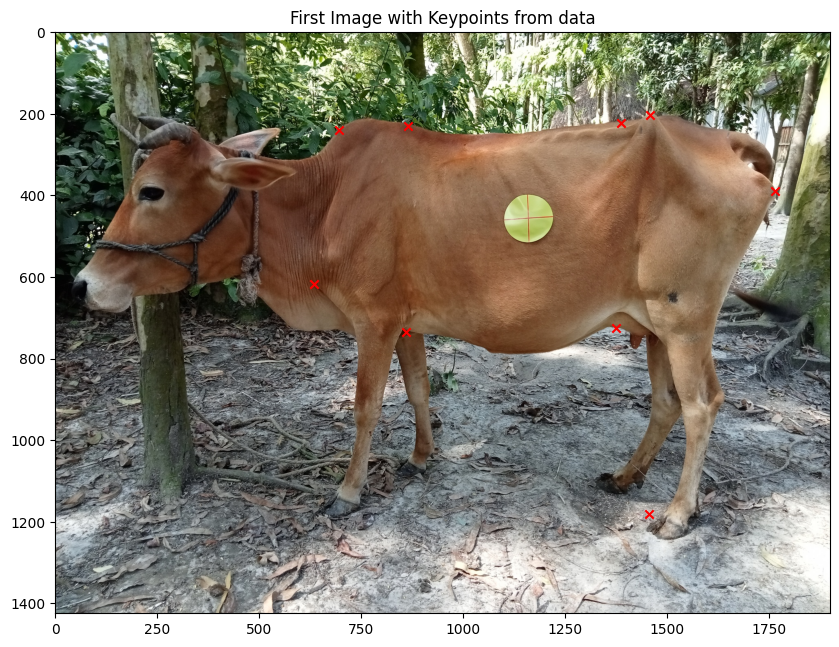

In [13]:
# Paths for the Side and Rear JSON files and image directories
DATA_PATH = "data/www.acmeai.tech Dataset - BMGF-LivestockWeight-CV"
# JSON_PATH_REAR = os.path.join(DATA_PATH, "Vector/B4/Rear/data/coco_b4_rear.json")
# IMAGE_DIR_REAR = os.path.join(DATA_PATH, "Vector/B4/Rear/data/images")

JSON_PATH_SIDE = os.path.join(DATA_PATH,"Vector/B4/Side/data/coco_b4_side.json")
IMAGE_DIR_SIDE = os.path.join(DATA_PATH, "Vector/B4/Side/data/images")

# Function to load and display the first image along with its keypoints
def visualize_first_image(json_path, image_dir):
    with open(json_path, 'r') as file:
        coco_data = json.load(file)

    first_image_filename = coco_data['images'][1]['file_name']
    first_image_keypoints = coco_data['annotations'][1]['keypoints']
    keypoint_x_vals = first_image_keypoints[0::3]
    keypoint_y_vals = first_image_keypoints[1::3]

    image_path = os.path.join(image_dir, first_image_filename)
    image = Image.open(image_path)

    plt.figure(figsize=(10,10))
    plt.imshow(image)
    plt.scatter(keypoint_x_vals, keypoint_y_vals, c='r', marker='x')
    plt.title(f"First Image with Keypoints from {json_path.split('/')[-2]}")
    plt.show()

# Visualize for both Rear and Side
# visualize_first_image(JSON_PATH_REAR, IMAGE_DIR_REAR)
visualize_first_image(JSON_PATH_SIDE, IMAGE_DIR_SIDE)

In [14]:
import os
import torch
from torchvision import transforms
from torch.utils.data import Dataset
from PIL import Image
from torchvision.transforms import functional as TF

class KeypointDataset(Dataset):
    def __init__(self, image_paths, keypoints, root_dir, transform=None):
        """
        Args:
        - image_paths (list): List of image file names.
        - keypoints (list): List of keypoints for each image.
        - root_dir (str): Directory with all the images.
        - transform (callable, optional): Optional transform to be applied on an image.
        """
        self.image_paths = image_paths
        self.keypoints = keypoints
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        """Return the total number of images."""
        return len(self.image_paths)

    def __getitem__(self, idx):
        """Retrieve an image and its keypoints given an index."""
        img_name = os.path.join(self.root_dir, self.image_paths[idx])
        image = Image.open(img_name)
        
        # Resize the image to a consistent size
        image = TF.resize(image, (224, 224))

        keypoints = self.keypoints[idx]
        
        # Remove the visibility from keypoints
        keypoints = [keypoints[i] for i in range(len(keypoints)) if i % 3 != 2]
        keypoints = torch.tensor(keypoints, dtype=torch.float32)

        # Apply transformations if provided
        if self.transform:
            image = self.transform(image)

        return image, keypoints

# Define transformations
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
    transforms.RandomPerspective(distortion_scale=0.2, p=0.5, interpolation=3),
    transforms.ToTensor()
])

In [15]:
from torch.utils.data import DataLoader
from torchvision import transforms
import json
from sklearn.model_selection import train_test_split

# Function to split the data and create datasets and dataloaders
def prepare_data(json_path, image_dir, transform):
    with open(json_path, 'r') as file:
        coco_data = json.load(file)
    
    image_file_names = [img['file_name'] for img in coco_data['images']]
    keypoints_data = [ann['keypoints'] for ann in coco_data['annotations']]
    
    train_images, val_images, train_keypoints, val_keypoints = train_test_split(
        image_file_names, keypoints_data, test_size=0.2, random_state=42
    )
    
    train_dataset = KeypointDataset(train_images, train_keypoints, image_dir, transform=transform)
    val_dataset = KeypointDataset(val_images, val_keypoints, image_dir, transform=transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        # Add normalization here if necessary
    ]))
    
    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)
    
    return train_loader, val_loader

# Define transformations for data augmentation
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.RandomAffine(degrees=10, translate=(0.1, 0.1), scale=(0.8, 1.2)),
    transforms.RandomPerspective(distortion_scale=0.5, p=0.5),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    # Add normalization here if necessary
])

# Prepare data for both "Rear" and "Side" views
# train_loader_rear, val_loader_rear = prepare_data(JSON_PATH_REAR, IMAGE_DIR_REAR, transform)
train_loader_side, val_loader_side = prepare_data(JSON_PATH_SIDE, IMAGE_DIR_SIDE, transform)


In [16]:
from torchvision.models import resnet50  # Changed to ResNet50 for better features
import torch.nn as nn

class KeypointRegressor(nn.Module):
    def __init__(self, num_keypoints, fine_tuning=True, dropout_prob=0.5):
        super(KeypointRegressor, self).__init__()
        
        # Use ResNet50 for better features
        self.resnet = resnet50(pretrained=True)
        
        # If fine-tuning, keep the requires_grad attribute as is; otherwise, freeze the parameters
        if not fine_tuning:
            for param in self.resnet.parameters():
                param.requires_grad = False
        
        self.features = nn.Sequential(*list(self.resnet.children())[:-1])
        
        # Introduce dropout for regularization and batch normalization for better training stability
        self.dropout = nn.Dropout(dropout_prob)
        self.batch_norm = nn.BatchNorm1d(2048)  # Updated to 2048 to match ResNet50 output
        self.regressor = nn.Linear(2048, num_keypoints * 2)  # Updated to take in 2048 features
        
    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.dropout(x)
        x = self.batch_norm(x)
        return self.regressor(x)

# Initialize models for both "Rear" and "Side" views
# NUM_KEYPOINTS_REAR = 4
# model_rear = KeypointRegressor(num_keypoints=NUM_KEYPOINTS_REAR)
NUM_KEYPOINTS_SIDE = 9
model_side = KeypointRegressor(num_keypoints=NUM_KEYPOINTS_SIDE)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [17]:
import torch.optim as optim

# Using Smooth L1 Loss which can be more robust against outliers
criterion = nn.SmoothL1Loss()

# Introducing weight decay for regularization
# optimizer_rear = optim.Adam(model_rear.parameters(), lr=0.0001, weight_decay=1e-5)
optimizer_side = optim.Adam(model_side.parameters(), lr=0.0001, weight_decay=1e-5)

# Learning rate scheduler to reduce LR when validation loss plateaus
# scheduler_rear = optim.lr_scheduler.ReduceLROnPlateau(optimizer_rear, 'min', patience=5, factor=0.1)
scheduler_side = optim.lr_scheduler.ReduceLROnPlateau(optimizer_side, 'min', patience=5, factor=0.1)

In [18]:

from tqdm.notebook import tqdm

def train_model(model, train_dataloader, val_dataloader, optimizer, scheduler, criterion, num_epochs=10, save_path='best_model.pth'):
    best_loss = float('inf')

    for epoch in range(num_epochs):
        print(f"Epoch {epoch + 1}/{num_epochs}")
        print('-' * 10)
        
        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
                dataloader = train_dataloader
            else:
                model.eval()   # Set model to evaluate mode
                dataloader = val_dataloader

            running_loss = 0.0
            
            # Add progress bar using tqdm
            for images, keypoints in tqdm(dataloader, desc=f"{phase} phase", leave=False):
                # Zero the parameter gradients
                optimizer.zero_grad()

                # Forward pass
                with torch.set_grad_enabled(phase == 'train'):  # Only track history in train mode
                    outputs = model(images)
                    loss = criterion(outputs, keypoints)

                    # Backward pass and optimize only in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * images.size(0)
            
            epoch_loss = running_loss / len(dataloader.dataset)

            # Update learning rate using scheduler in train phase and print details
            if phase == 'train':
                scheduler.step(epoch_loss)
                print(f"\nTrain Loss: {epoch_loss:.4f} - Learning Rate: {optimizer.param_groups[0]['lr']:.4e}")
            else:
                print(f"\nVal Loss: {epoch_loss:.4f}")
                # Save the model if it's the best one seen so far
                if epoch_loss < best_loss:
                    best_loss = epoch_loss
                    torch.save(model.state_dict(), save_path)
        print()

    print(f"Best Val Loss: {best_loss:.4f}")
    return model


In [25]:
# Learning rate schedulers for both models
# scheduler_rear = optim.lr_scheduler.ReduceLROnPlateau(optimizer_rear, 'min', patience=5, factor=0.1)
scheduler_side = optim.lr_scheduler.ReduceLROnPlateau(optimizer_side, 'min', patience=5, factor=0.1)

# Train the rear model
# print("Training Rear Model...")
# model_rear = train_model(model_rear, train_loader_rear, val_loader_rear, optimizer_rear, scheduler_rear, criterion, num_epochs=10)

# Train the side model
print("\nTraining Side Model...")
model_side = train_model(model_side, train_loader_side, val_loader_side, optimizer_side, scheduler_side, criterion, num_epochs=50)



Training Side Model...
Epoch 1/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 787.5786 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 793.4249

Epoch 2/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 786.6430 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 791.6670

Epoch 3/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 784.6148 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 789.1070

Epoch 4/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 781.5053 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 782.8248

Epoch 5/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 777.3657 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 790.1951

Epoch 6/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 772.2363 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 768.7997

Epoch 7/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 766.1623 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 781.4430

Epoch 8/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 759.1629 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 759.3485

Epoch 9/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 751.2865 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 738.4093

Epoch 10/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 742.5719 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 743.5938

Epoch 11/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 733.0155 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 772.0577

Epoch 12/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 722.6516 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 727.4415

Epoch 13/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 711.5363 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 720.9915

Epoch 14/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 699.6834 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 701.0217

Epoch 15/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 687.1057 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 690.1078

Epoch 16/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 673.8790 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 667.1773

Epoch 17/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 660.0241 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 681.3539

Epoch 18/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 645.6320 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 679.2872

Epoch 19/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 630.7032 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 613.9161

Epoch 20/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 615.2769 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 582.3564

Epoch 21/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 599.6416 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 594.0038

Epoch 22/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 583.8062 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 579.6902

Epoch 23/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 567.8424 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 548.1460

Epoch 24/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 551.8667 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 530.5104

Epoch 25/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 536.2082 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 515.4665

Epoch 26/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 520.4681 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 457.8231

Epoch 27/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 505.8877 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 467.6272

Epoch 28/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 491.3514 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 454.3358

Epoch 29/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 477.2431 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 430.5658

Epoch 30/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 463.3355 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 434.7542

Epoch 31/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 449.1500 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 414.8956

Epoch 32/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 435.3767 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 403.6564

Epoch 33/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 422.0041 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 381.0212

Epoch 34/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 408.1248 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 376.2493

Epoch 35/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 394.6955 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 354.8691

Epoch 36/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 381.1507 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 348.4122

Epoch 37/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 367.6717 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 333.5823

Epoch 38/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 354.5410 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 325.1609

Epoch 39/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 341.6624 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 311.9270

Epoch 40/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 328.3800 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 305.5795

Epoch 41/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 316.3612 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 302.6242

Epoch 42/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 304.8211 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 282.7371

Epoch 43/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 294.5157 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 285.7129

Epoch 44/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 284.7600 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 269.0012

Epoch 45/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 275.7214 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 258.5189

Epoch 46/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 267.8406 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 258.1949

Epoch 47/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 260.8028 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 250.6935

Epoch 48/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 254.7698 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 248.6006

Epoch 49/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 248.6147 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 240.9688

Epoch 50/50
----------


train phase:   0%|          | 0/98 [00:00<?, ?it/s]


Train Loss: 243.7941 - Learning Rate: 1.0000e-04


val phase:   0%|          | 0/25 [00:00<?, ?it/s]


Val Loss: 234.6337

Best Val Loss: 234.6337


In [27]:
# Save the trained side model
model_save_path = 'side_model.pth'  # You can specify your desired file name
torch.save(model_side, model_save_path)

print(f"Side model saved to {model_save_path}")


Side model saved to side_model.pth


In [28]:
def evaluate_model(model, dataloader, criterion, visualize=False, num_samples_to_visualize=5):
    model.eval()  # Set model to evaluation mode
    running_loss = 0.0
    all_predictions = []
    all_keypoints = []
    # For visualization
    sample_images = []
    sample_true_keypoints = []
    sample_pred_keypoints = []

    with torch.no_grad():
        for images, keypoints in tqdm(dataloader, desc="Evaluating", unit="batch"):
            outputs = model(images)
            loss = criterion(outputs, keypoints)
            running_loss += loss.item() * images.size(0)
            all_predictions.extend(outputs.cpu().numpy())
            all_keypoints.extend(keypoints.cpu().numpy())
            # Visualization samples
            if visualize and len(sample_images) < num_samples_to_visualize:
                sample_images.extend(images.cpu().numpy())
                sample_true_keypoints.extend(keypoints.cpu().numpy())
                sample_pred_keypoints.extend(outputs.cpu().numpy())

    average_loss = running_loss / len(dataloader.dataset)

    # Calculate additional metrics
    mae = mean_absolute_error(all_keypoints, all_predictions)
    r2 = r2_score(all_keypoints, all_predictions)

    # Visualization
    if visualize:
        for i in range(min(num_samples_to_visualize, len(sample_images))):
            plt.figure(figsize=(10, 5))
            image = np.transpose(sample_images[i], (1, 2, 0))
            true_keypoints = np.array(sample_true_keypoints[i]).reshape(-1, 2)
            pred_keypoints = np.array(sample_pred_keypoints[i]).reshape(-1, 2)
            plt.imshow(image)
            plt.scatter(true_keypoints[:, 0], true_keypoints[:, 1], color='g', marker='o', label="True")
            plt.scatter(pred_keypoints[:, 0], pred_keypoints[:, 1], color='r', marker='x', label="Predicted")
            # Calculate and draw distances
            for j, (tx, ty) in enumerate(true_keypoints):
                for k, (px, py) in enumerate(pred_keypoints):
                    if j != k:
                        distance = np.linalg.norm(np.array([tx, ty]) - np.array([px, py]))
                        mid_point = ((tx + px) // 2, (ty + py) // 2)
                        plt.plot([tx, px], [ty, py], 'k-', linewidth=1)
                        plt.text(mid_point[0], mid_point[1], f"{distance:.1f}", color='white', fontsize=8, ha='center')
            plt.legend()
            plt.show()

    return average_loss, mae, r2


In [29]:
from sklearn.metrics import mean_absolute_error, r2_score

def evaluate_model(model, dataloader, criterion):
    model.eval()  # Set model to evaluation mode
    running_loss = 0.0
    all_predictions = []
    all_keypoints = []

    with torch.no_grad():
        for images, keypoints in dataloader:
            outputs = model(images)
            loss = criterion(outputs, keypoints)
            running_loss += loss.item() * images.size(0)
            
            all_predictions.extend(outputs.cpu().numpy())
            all_keypoints.extend(keypoints.cpu().numpy())

    average_loss = running_loss / len(dataloader.dataset)
    
    # Calculate additional metrics
    mae = mean_absolute_error(all_keypoints, all_predictions)
    r2 = r2_score(all_keypoints, all_predictions)
    
    return average_loss, mae, r2

# Evaluate rear model
# val_loss_rear, mae_rear, r2_rear = evaluate_model(model_rear, val_loader_rear, criterion)
# print(f"Validation Loss (Rear): {val_loss_rear:.4f}")
# print(f"Mean Absolute Error (Rear): {mae_rear:.4f}")
# print(f"R^2 Score (Rear): {r2_rear:.4f}\n")

# Evaluate side model
val_loss_side, mae_side, r2_side = evaluate_model(model_side, val_loader_side, criterion)
print(f"Validation Loss (Side): {val_loss_side:.4f}")
print(f"Mean Absolute Error (Side): {mae_side:.4f}")
print(f"R^2 Score (Side): {r2_side:.4f}")

Validation Loss (Side): 234.6337
Mean Absolute Error (Side): 235.1326
R^2 Score (Side): -2.3801


Evaluating:   0%|          | 0/25 [00:00<?, ?batch/s]

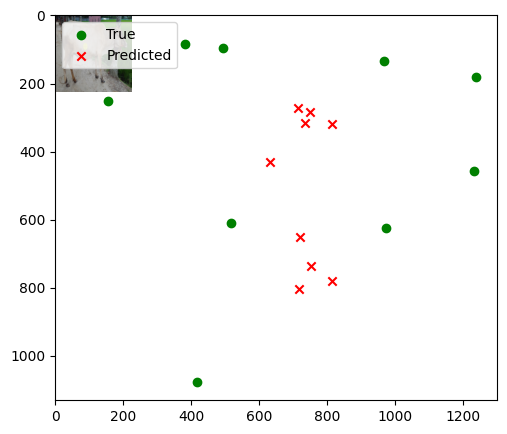

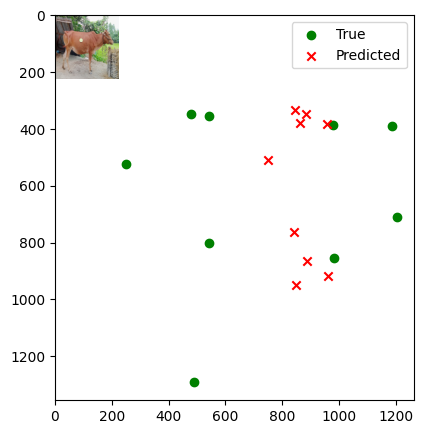

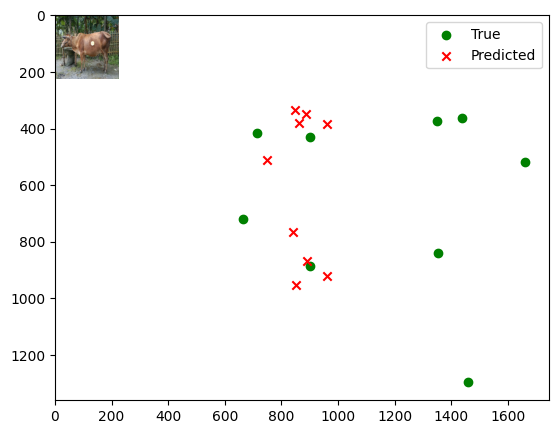

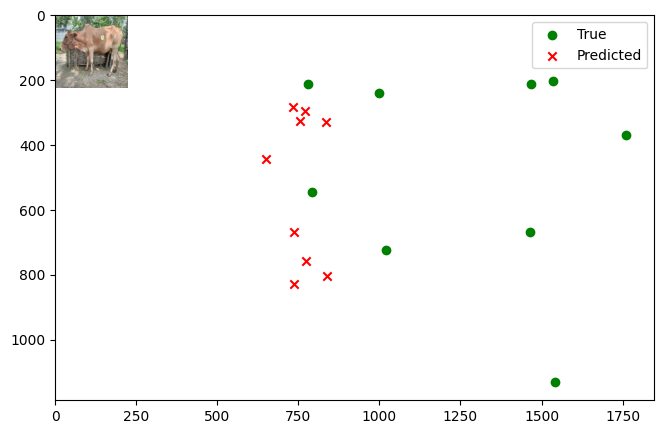

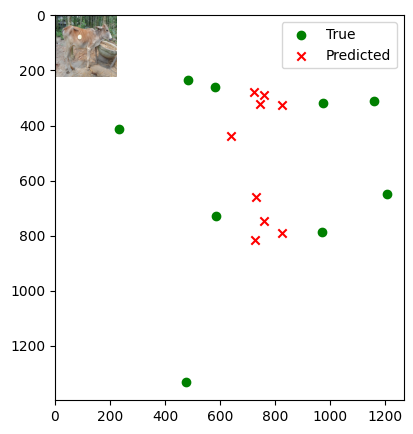

Validation Loss (Side): 234.6337
Mean Absolute Error (Side): 235.1326
R^2 Score (Side): -2.3801


In [30]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

def evaluate_model(model, dataloader, criterion, visualize=False, num_samples_to_visualize=5):
    model.eval()  # Set model to evaluation mode
    running_loss = 0.0
    all_predictions = []
    all_keypoints = []
    
    # For visualization
    sample_images = []
    sample_true_keypoints = []
    sample_pred_keypoints = []

    with torch.no_grad():
        for images, keypoints in tqdm(dataloader, desc="Evaluating", unit="batch"):
            outputs = model(images)
            loss = criterion(outputs, keypoints)
            running_loss += loss.item() * images.size(0)
            
            all_predictions.extend(outputs.cpu().numpy())
            all_keypoints.extend(keypoints.cpu().numpy())
            
            # Visualization samples
            if visualize and len(sample_images) < num_samples_to_visualize:
                sample_images.extend(images.cpu().numpy())
                sample_true_keypoints.extend(keypoints.cpu().numpy())
                sample_pred_keypoints.extend(outputs.cpu().numpy())

    average_loss = running_loss / len(dataloader.dataset)
    
    # Calculate additional metrics
    mae = mean_absolute_error(all_keypoints, all_predictions)
    r2 = r2_score(all_keypoints, all_predictions)
    
    # Visualization
    if visualize:
        for i in range(min(num_samples_to_visualize, len(sample_images))):
            plt.figure(figsize=(10, 5))
            plt.imshow(np.transpose(sample_images[i], (1, 2, 0)))
            true_keypoints = np.array(sample_true_keypoints[i]).reshape(-1, 2)
            pred_keypoints = np.array(sample_pred_keypoints[i]).reshape(-1, 2)
            plt.scatter(true_keypoints[:, 0], true_keypoints[:, 1], color='g', marker='o', label="True")
            plt.scatter(pred_keypoints[:, 0], pred_keypoints[:, 1], color='r', marker='x', label="Predicted")
            plt.legend()
            plt.show()
    
    return average_loss, mae, r2

# Evaluate rear model
# val_loss_rear, mae_rear, r2_rear = evaluate_model(model_rear, val_loader_rear, criterion, visualize=True)
# print(f"Validation Loss (Rear): {val_loss_rear:.4f}")
# print(f"Mean Absolute Error (Rear): {mae_rear:.4f}")
# print(f"R^2 Score (Rear): {r2_rear:.4f}\n")

# Evaluate side model
val_loss_side, mae_side, r2_side = evaluate_model(model_side, val_loader_side, criterion, visualize=True)
print(f"Validation Loss (Side): {val_loss_side:.4f}")
print(f"Mean Absolute Error (Side): {mae_side:.4f}")
print(f"R^2 Score (Side): {r2_side:.4f}")


Evaluating:   0%|          | 0/25 [00:00<?, ?batch/s]

Image number: 0
True keypoints: [1237.  180.  155.  251. 1231.  456.  967.  135.  974.  625.  493.   96.
  516.  611.  383.   84.  416. 1077.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[735.61017 315.66037]
 [631.9148  430.247  ]
 [718.98413 649.919  ]
 [813.32166 317.97867]
 [814.297   780.5051 ]
 [748.48804 284.3914 ]
 [751.5213  736.6208 ]
 [712.79675 272.16928]
 [717.4644  804.8053 ]]


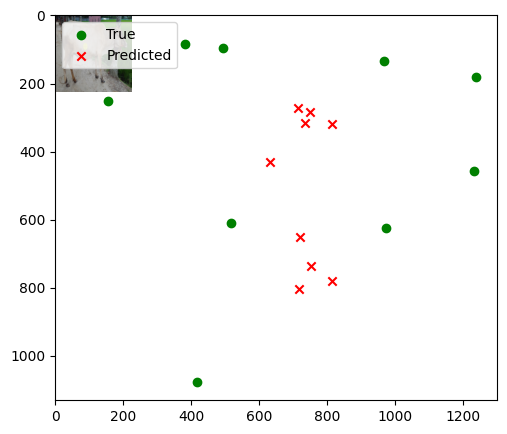

Image number: 1
True keypoints: [1187.  388.  250.  523. 1204.  711.  979.  387.  981.  854.  543.  355.
  542.  802.  480.  347.  491. 1291.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[861.78314 378.28683]
 [748.9366  508.05432]
 [841.27515 762.1851 ]
 [959.1408  380.79956]
 [960.23376 918.124  ]
 [885.0261  346.30908]
 [888.7079  866.0192 ]
 [844.3697  333.50043]
 [848.8673  948.99774]]


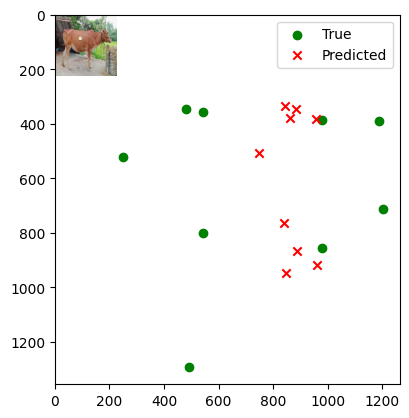

Image number: 2
True keypoints: [ 713.  414. 1661.  519.  664.  719.  901.  428.  901.  887. 1348.  372.
 1355.  841. 1439.  361. 1459. 1295.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[863.1177  379.81564]
 [750.5375  509.32706]
 [842.5099  763.5176 ]
 [961.1338  382.2433 ]
 [962.3153  919.88654]
 [886.99286 348.14746]
 [890.73254 867.63916]
 [846.33417 335.42334]
 [850.6934  950.9296 ]]


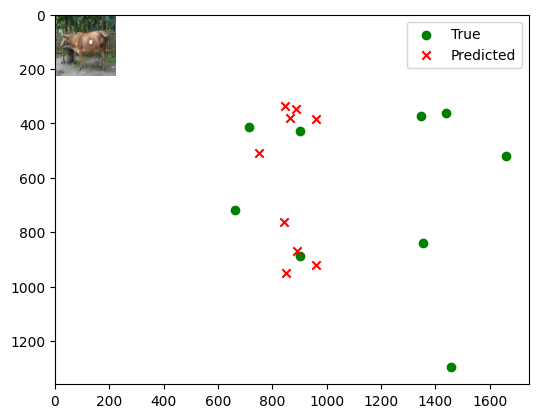

Image number: 3
True keypoints: [ 780.  210. 1760.  369.  791.  544.  998.  240. 1020.  723. 1468.  210.
 1464.  669. 1536.  202. 1541. 1130.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[755.0938  325.74774]
 [650.60205 442.46857]
 [737.77637 667.2167 ]
 [836.2193  328.09467]
 [837.38293 802.05115]
 [770.2199  294.78912]
 [773.3476  756.70154]
 [733.8523  282.54135]
 [738.3611  827.4402 ]]


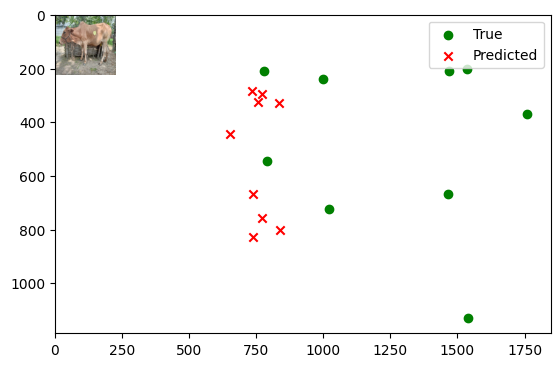

Image number: 4
True keypoints: [1160.  310.  234.  411. 1207.  649.  972.  317.  969.  786.  582.  261.
  584.  729.  482.  236.  476. 1331.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[745.0094  322.1941 ]
 [638.10443 437.05838]
 [728.30035 659.2553 ]
 [823.8263  323.9511 ]
 [824.98505 790.59753]
 [757.4995  290.43875]
 [760.74396 746.66223]
 [721.023   278.16608]
 [725.5033  814.993  ]]


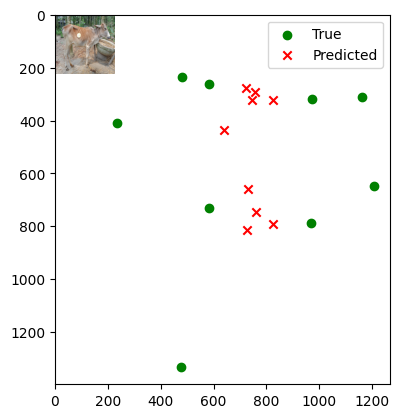

Image number: 5
True keypoints: [1216.  287.  234.  367. 1234.  601. 1006.  300. 1003.  768.  554.  241.
  566.  699.  440.  227.  483. 1254.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[790.99896 343.2333 ]
 [682.8182  464.45294]
 [772.72766 699.33405]
 [877.18665 345.5754 ]
 [878.18176 840.82983]
 [808.10846 311.48108]
 [811.42645 793.42957]
 [770.14185 298.976  ]
 [774.76697 867.8983 ]]


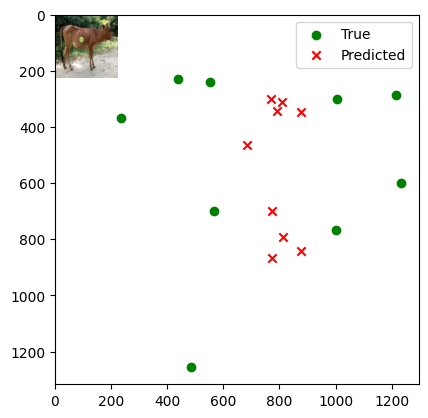

Image number: 6
True keypoints: [1290.  284.  108.  333. 1304.  627. 1044.  261. 1042.  796.  449.  197.
  466.  754.  284.  206.  322. 1327.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[737.9899  317.11972]
 [634.31067 431.82428]
 [721.2214  652.02045]
 [816.2087  319.40125]
 [817.3118  783.2296 ]
 [751.34753 286.0276 ]
 [754.3766  739.0939 ]
 [715.56616 273.83298]
 [720.14795 807.6685 ]]


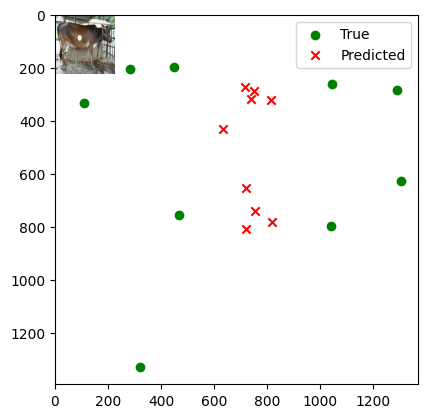

Image number: 7
True keypoints: [1142.  374.  177.  551. 1189.  688.  957.  393.  985.  849.  478.  388.
  508.  836.  398.  383.  455. 1307.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[833.6007  365.63885]
 [722.18085 491.36133]
 [813.97455 737.5587 ]
 [926.79346 367.83002]
 [927.9651  887.55695]
 [854.5143  333.87286]
 [858.14075 837.47205]
 [814.86676 321.3117 ]
 [819.2351  916.944  ]]


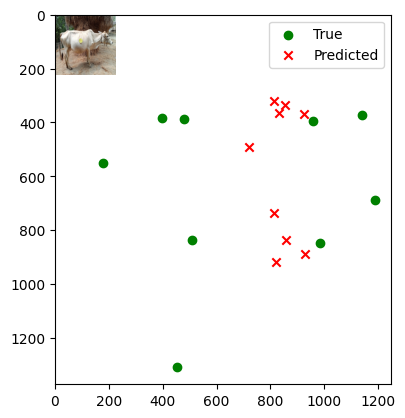

Image number: 8
True keypoints: [ 710.  213. 1610.  371.  656.  518.  882.  237.  896.  667. 1291.  194.
 1284.  634. 1413.  180. 1434. 1073.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[726.58044 311.9733 ]
 [623.9913  425.04932]
 [710.1608  641.98425]
 [803.29456 314.17258]
 [804.3546  770.9361 ]
 [739.2512  281.1139 ]
 [742.28253 727.56287]
 [703.99725 268.99527]
 [708.53394 794.86884]]


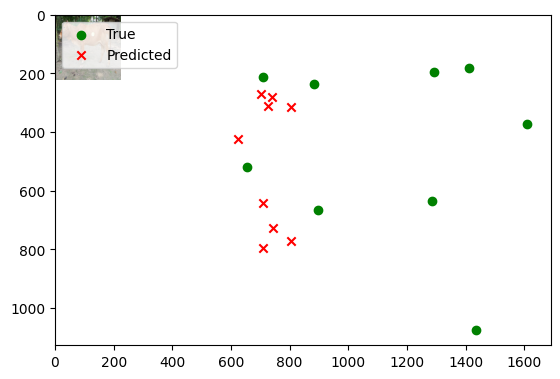

Image number: 9
True keypoints: [ 682.  290. 1545.  433.  689.  596.  873.  321.  885.  755. 1279.  298.
 1285.  699. 1340.  290. 1354. 1137.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[771.99194 334.44998]
 [666.17163 453.04858]
 [754.15735 682.3726 ]
 [855.8174  336.75446]
 [856.9352  820.4975 ]
 [788.4748  303.34027]
 [791.7268  774.11664]
 [751.40936 291.05115]
 [755.9053  846.7849 ]]


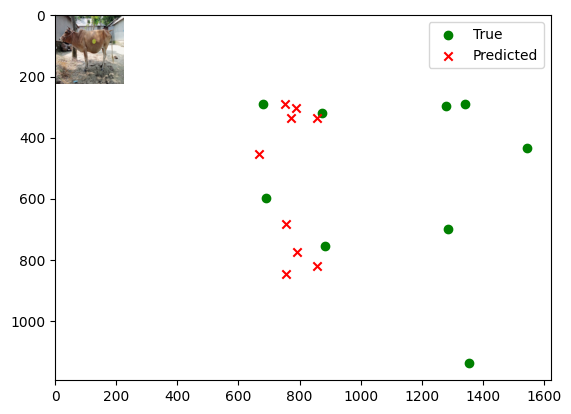

Image number: 10
True keypoints: [1206.  416.  438.  540. 1256.  721. 1056.  456. 1039.  859.  709.  400.
  699.  807.  638.  393.  620. 1203.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[829.08374 362.35287]
 [719.0402  488.03333]
 [809.52155 733.09094]
 [921.5922  364.81305]
 [922.7125  882.659  ]
 [850.0279  330.80078]
 [853.52234 832.5383 ]
 [810.7196  318.1796 ]
 [815.2334  911.8744 ]]


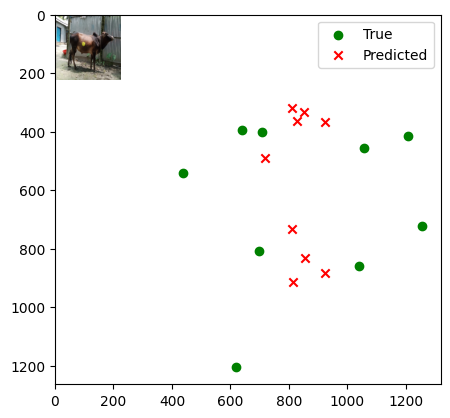

Image number: 11
True keypoints: [1209.  323.  243.  409. 1181.  637.  962.  310.  958.  769.  559.  284.
  565.  716.  481.  267.  501. 1125.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[742.7109  320.43463]
 [638.4847  435.231  ]
 [725.75183 656.4689 ]
 [821.9582  322.5781 ]
 [823.21    788.5846 ]
 [756.70715 289.5323 ]
 [759.82806 744.1856 ]
 [720.7123  277.44876]
 [725.12036 813.3043 ]]


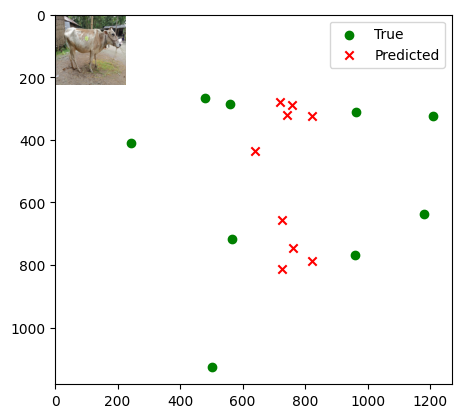

Image number: 12
True keypoints: [1298.  304.  174.  455. 1359.  686. 1076.  319. 1083.  868.  546.  263.
  547.  810.  425.  240.  437. 1364.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[770.70013 333.6749 ]
 [664.60974 452.1518 ]
 [752.9215  681.2101 ]
 [854.11536 335.96323]
 [855.299   818.98676]
 [786.83136 302.48166]
 [790.05347 772.7257 ]
 [749.76514 290.17868]
 [754.26447 845.1223 ]]


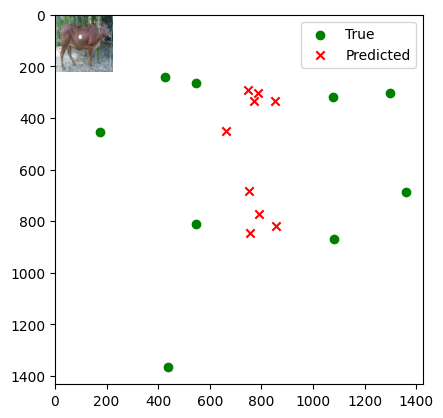

Image number: 13
True keypoints: [ 759.  139. 1748.  268.  737.  470.  945.  144.  969.  596. 1425.  136.
 1429.  582. 1507.  121. 1517. 1030.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[663.22345 282.9525 ]
 [563.3554  387.27753]
 [648.9042  586.6711 ]
 [730.2006  284.49774]
 [731.2329  701.8852 ]
 [670.0063  252.25604]
 [672.9575  663.25165]
 [636.9903  240.58319]
 [641.4264  722.3794 ]]


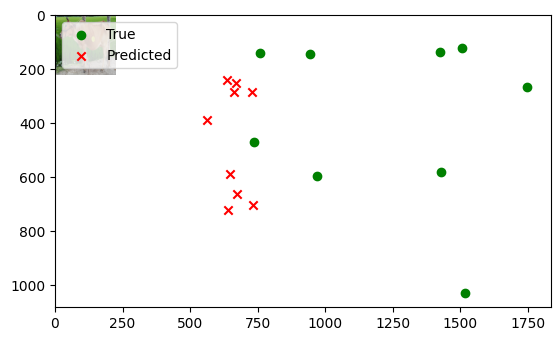

Image number: 14
True keypoints: [1246.  214.  172.  383. 1306.  553. 1031.  241. 1051.  761.  539.  211.
  553.  714.  437.  202.  465. 1224.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[735.9791  315.91122]
 [631.1526  430.51215]
 [719.44116 650.47046]
 [813.3001  318.0539 ]
 [814.2528  780.6385 ]
 [748.12164 284.24115]
 [751.1404  736.96423]
 [712.21    271.9537 ]
 [716.9313  804.75464]]


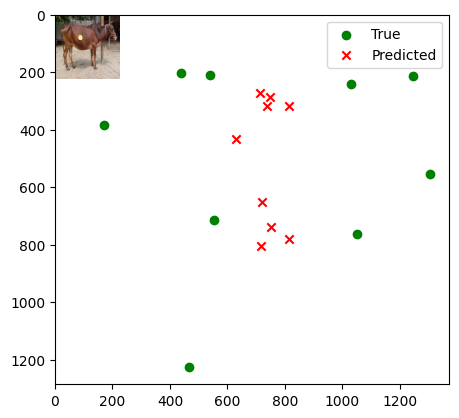

Image number: 15
True keypoints: [ 661.  317. 1726.  363.  644.  650.  839.  310.  878.  809. 1355.  244.
 1367.  712. 1461.  216. 1488. 1232.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[770.4466  332.56815]
 [663.93884 451.50446]
 [752.7396  680.8027 ]
 [853.3059  334.946  ]
 [854.41943 818.4005 ]
 [785.99445 300.99915]
 [789.1205  772.15765]
 [748.84973 288.56213]
 [753.5102  844.3716 ]]


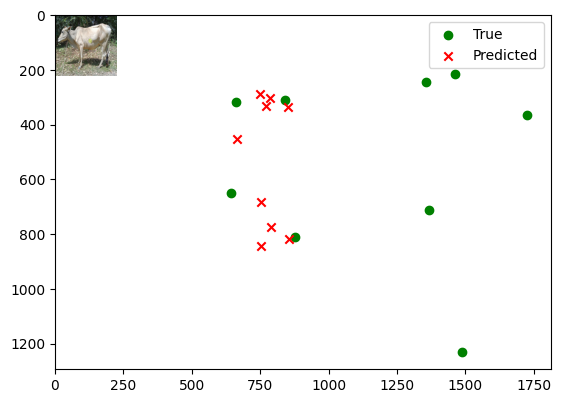

Image number: 16
True keypoints: [1154.  297.  279.  347. 1230.  548.  982.  304.  985.  734.  586.  216.
  577.  670.  480.  197.  498. 1220.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[724.45874 312.55682]
 [618.1744  424.66217]
 [708.4679  641.3064 ]
 [799.92163 314.08002]
 [801.0147  768.0566 ]
 [734.7899  280.67792]
 [737.97986 725.73755]
 [699.0093  268.5511 ]
 [703.48755 791.32385]]


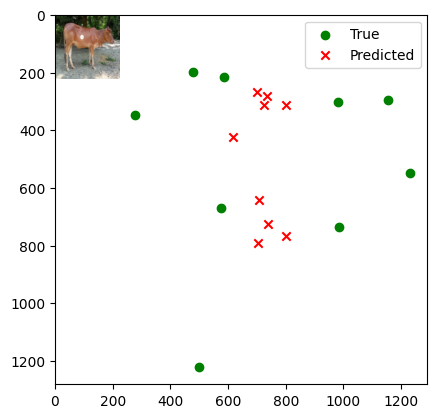

Image number: 17
True keypoints: [ 703.  312. 1688.  443.  723.  589.  917.  306.  927.  788. 1344.  330.
 1343.  776. 1452.  333. 1439. 1226.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[807.6452  352.16678]
 [698.9517  475.0307 ]
 [788.71094 714.10144]
 [896.9093  354.51694]
 [898.1427  859.34326]
 [826.9226  320.8134 ]
 [830.35925 810.671  ]
 [788.414   308.36627]
 [792.832   887.4512 ]]


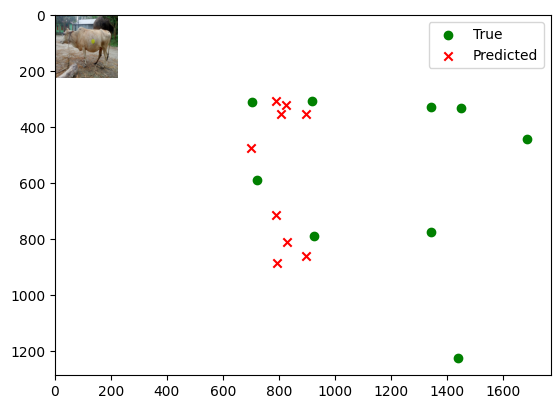

Image number: 18
True keypoints: [ 664.  337. 1630.  430.  660.  650.  881.  318.  890.  787. 1349.  300.
 1339.  727. 1428.  290. 1411. 1230.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[830.7573  361.65924]
 [719.2146  488.29004]
 [811.2704  734.3831 ]
 [922.4456  364.1879 ]
 [923.4863  883.79736]
 [850.501   329.25656]
 [853.88617 833.7644 ]
 [810.8614  316.45294]
 [815.6062  912.7643 ]]


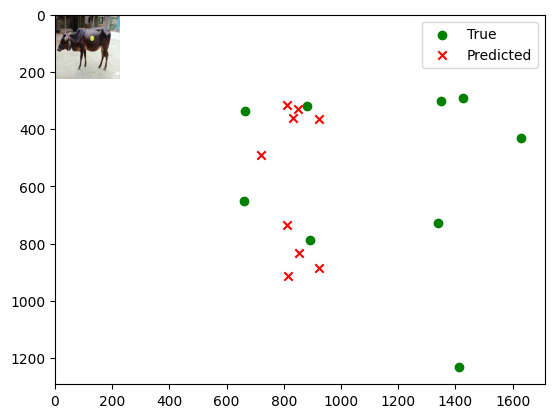

Image number: 19
True keypoints: [1196.  363.  223.  461. 1209.  706. 1012.  369.  975.  884.  525.  324.
  525.  768.  424.  310.  413. 1274.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[735.6168  319.81644]
 [625.0219  432.5626 ]
 [719.57135 652.32153]
 [812.0766  320.75143]
 [813.2785  779.797  ]
 [745.02014 287.06512]
 [748.4413  737.54083]
 [708.25305 274.85153]
 [712.55176 803.0622 ]]


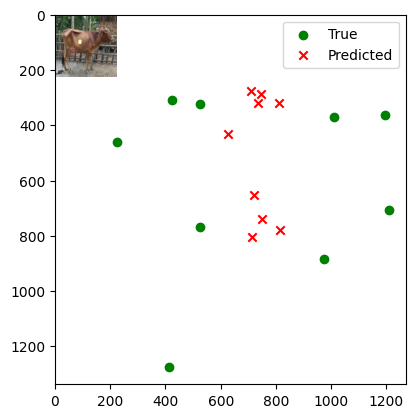

Image number: 20
True keypoints: [1171.  198.  177.  353. 1228.  563.  972.  214.  968.  745.  494.  183.
  503.  671.  390.  172.  411. 1251.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[659.6056  282.54318]
 [554.7163  385.85825]
 [645.86206 584.84265]
 [724.4103  283.28848]
 [725.40314 696.9347 ]
 [662.8679  250.256  ]
 [665.9415  659.7345 ]
 [629.19183 238.48294]
 [633.66034 716.39655]]


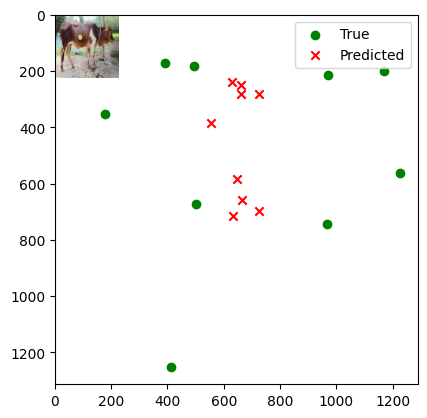

Image number: 21
True keypoints: [ 725.  293. 1715.  468.  665.  616.  942.  292.  956.  818. 1394.  293.
 1400.  762. 1479.  282. 1457. 1330.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[801.0275  348.25055]
 [692.7417  470.65726]
 [782.3558  708.1057 ]
 [889.02936 350.67035]
 [890.1863  851.97516]
 [819.5065  316.76733]
 [822.8644  803.70715]
 [781.24884 304.2724 ]
 [785.76526 879.6555 ]]


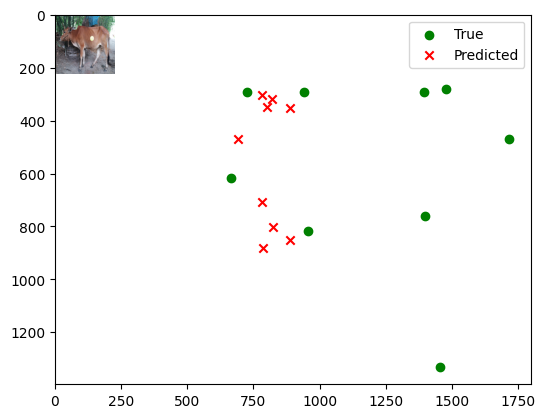

Image number: 22
True keypoints: [ 696.  241. 1698.  352.  644.  617.  935.  272.  942.  761. 1376.  225.
 1381.  669. 1472.  201. 1475. 1301.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[770.50793 332.13016]
 [663.89655 451.32556]
 [752.81036 680.7733 ]
 [853.1734  334.56982]
 [854.1887  818.2827 ]
 [785.7985  300.389  ]
 [788.89374 772.1353 ]
 [748.63727 287.9093 ]
 [753.37726 844.2462 ]]


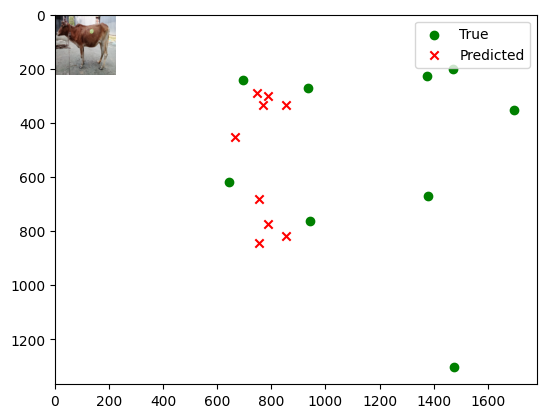

Image number: 23
True keypoints: [1250.  237.  250.  378. 1268.  585. 1044.  253. 1048.  724.  581.  231.
  590.  703.  481.  219.  498. 1190.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[775.2101  335.2021 ]
 [668.9597  454.5956 ]
 [757.31573 685.0392 ]
 [859.15735 337.63266]
 [860.2382  823.7683 ]
 [791.58514 303.86496]
 [794.7866  777.1764 ]
 [754.3696  291.4622 ]
 [758.9691  850.1287 ]]


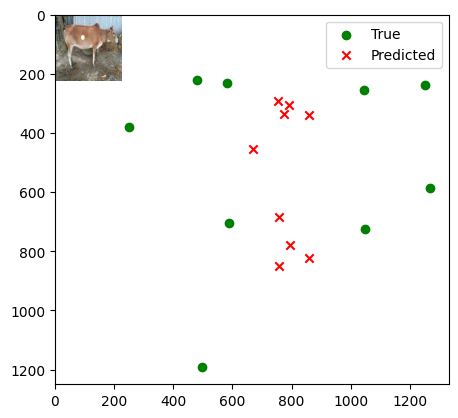

Image number: 24
True keypoints: [ 664.  204. 1675.  429.  594.  603.  830.  243.  838.  771. 1300.  190.
 1294.  772. 1403.  181. 1394. 1211.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[711.4718  304.49185]
 [608.6247  415.78894]
 [695.6422  628.8447 ]
 [785.3551  306.52765]
 [786.31744 754.1153 ]
 [721.9883  273.1994 ]
 [724.943   712.0607 ]
 [687.0957  261.11157]
 [691.7396  777.0624 ]]


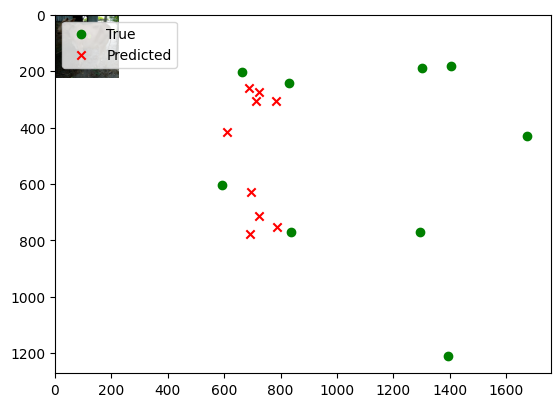

Image number: 25
True keypoints: [ 739.  249. 1768.  429.  662.  582.  947.  303.  944.  789. 1419.  257.
 1408.  762. 1535.  234. 1526. 1231.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[777.92285 336.58063]
 [671.30396 456.28516]
 [759.9523  687.4808 ]
 [862.23645 338.98862]
 [863.33997 826.69775]
 [794.42175 305.1668 ]
 [797.6598  779.95557]
 [757.0747  292.76068]
 [761.6639  853.17053]]


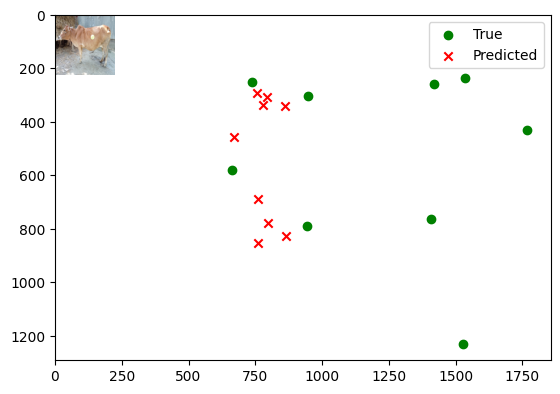

Image number: 26
True keypoints: [ 675.  296. 1640.  411.  632.  634.  863.  297.  877.  771. 1331.  278.
 1322.  723. 1426.  276. 1410. 1227.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[799.7792  347.21674]
 [691.07983 469.62854]
 [781.15155 706.9205 ]
 [887.2083  349.62753]
 [888.3631  850.39825]
 [817.7231  315.47607]
 [821.00415 802.2544 ]
 [779.4097  302.9146 ]
 [784.02136 877.8896 ]]


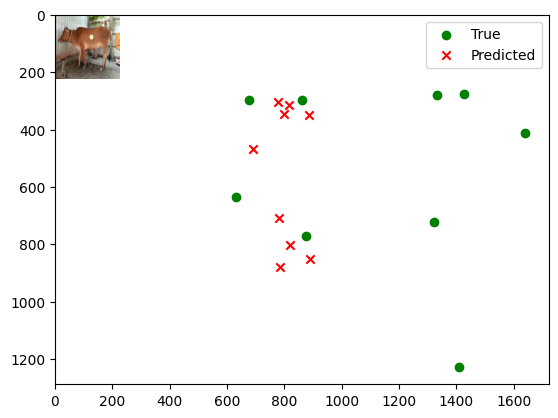

Image number: 27
True keypoints: [ 857.  337. 1819.  519.  796.  671. 1057.  343. 1060.  824. 1466.  339.
 1475.  776. 1605.  326. 1603. 1258.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[819.1499  356.86972]
 [709.0328  481.6085 ]
 [799.9602  724.2019 ]
 [909.6299  359.29355]
 [910.7357  871.52704]
 [838.65314 324.97635]
 [842.0509  822.1547 ]
 [799.5854  312.3269 ]
 [804.1675  900.05963]]


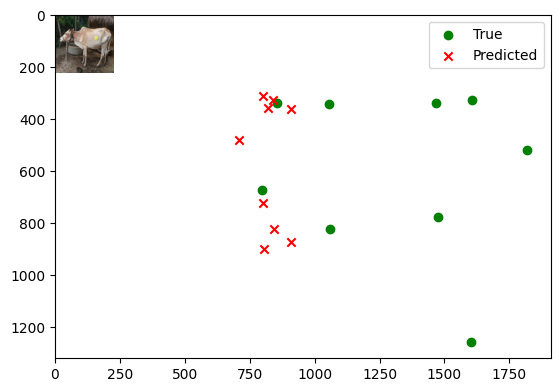

Image number: 28
True keypoints: [ 817.  332. 1680.  369.  789.  604.  981.  313.  994.  730. 1408.  290.
 1417.  669. 1504.  269. 1522. 1185.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[785.87646 341.2249 ]
 [678.9334  461.54404]
 [767.6052  694.6767 ]
 [871.79346 343.57883]
 [873.0149  835.6367 ]
 [803.4904  310.08337]
 [806.78784 788.2898 ]
 [765.8611  297.71222]
 [770.30237 862.6053 ]]


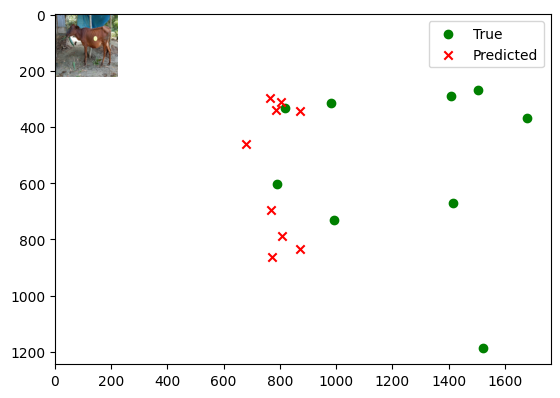

Image number: 29
True keypoints: [ 689.  272. 1667.  426.  648.  659.  861.  327.  885.  844. 1339.  282.
 1351.  764. 1429.  276. 1457. 1267.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[735.9469  317.13165]
 [629.39545 431.1628 ]
 [719.52496 651.05676]
 [813.02423 318.89777]
 [814.1635  780.5206 ]
 [747.3707  285.20825]
 [750.4869  737.1689 ]
 [711.1518  272.94284]
 [715.7196  804.3383 ]]


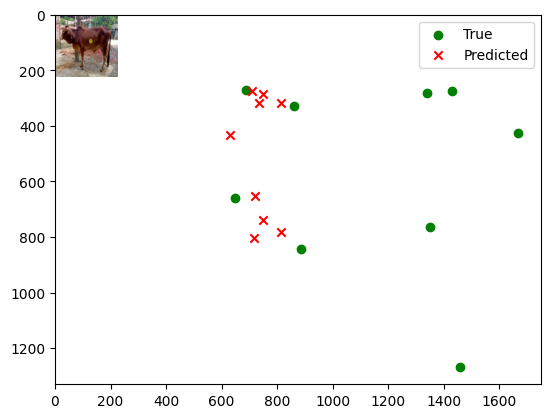

Image number: 30
True keypoints: [ 710.  277. 1684.  421.  672.  614.  895.  289.  904.  760. 1385.  263.
 1380.  701. 1455.  245. 1483. 1205.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[771.1909  333.35135]
 [665.20984 452.20447]
 [753.41125 681.5223 ]
 [854.562   335.72687]
 [855.6321  819.4185 ]
 [787.2598  302.023  ]
 [790.4348  773.10095]
 [750.17816 289.64154]
 [754.7763  845.572  ]]


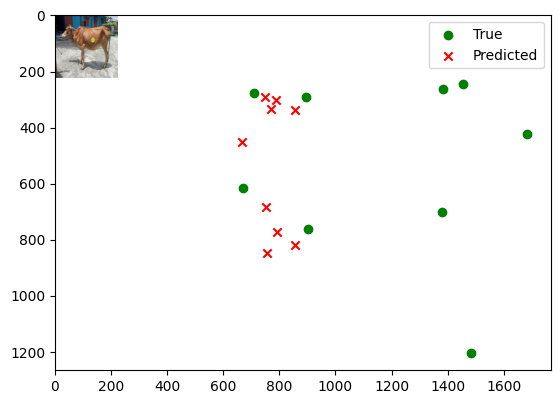

Image number: 31
True keypoints: [1259.  322.  300.  440. 1231.  567. 1008.  291. 1030.  745.  590.  284.
  612.  720.  504.  271.  549. 1131.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[710.45245 305.55933]
 [602.1614  416.0763 ]
 [695.17224 629.39606]
 [782.5216  306.71844]
 [783.58527 752.0598 ]
 [717.589   272.69058]
 [720.69324 711.21576]
 [681.856   260.43616]
 [686.48016 773.9933 ]]


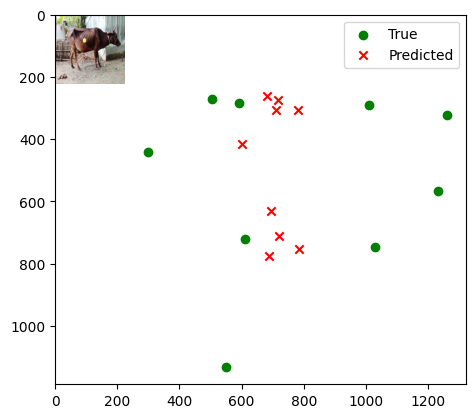

Image number: 32
True keypoints: [1164.  281.   88.  347. 1154.  642.  881.  264.  891.  770.  385.  199.
  414.  695.  286.  194.  374. 1242.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[709.59686 305.17358]
 [605.36127 415.47668]
 [693.93695 627.8761 ]
 [783.11725 306.80063]
 [784.2272  752.0858 ]
 [719.3984  273.7454 ]
 [722.4869  710.5153 ]
 [684.37427 261.76907]
 [688.82983 774.7559 ]]


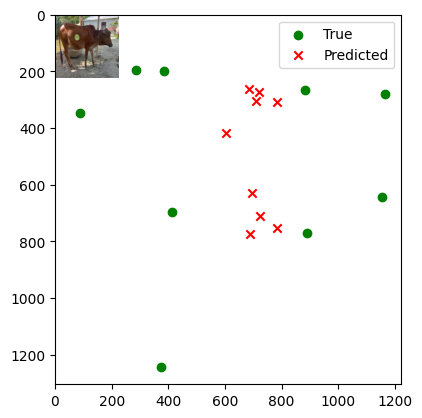

Image number: 33
True keypoints: [ 606.  320. 1714.  403.  646.  660.  874.  292.  905.  785. 1353.  245.
 1371.  717. 1449.  222. 1476. 1211.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[775.90344 335.8045 ]
 [669.93427 455.17984]
 [757.97797 685.7005 ]
 [860.20764 338.21912]
 [861.2827  824.6736 ]
 [792.61975 304.62454]
 [795.8557  777.98315]
 [755.43677 292.2531 ]
 [759.9803  851.1326 ]]


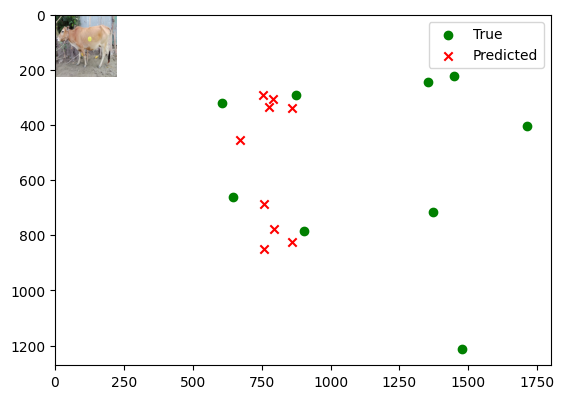

Image number: 34
True keypoints: [ 698.  269. 1655.  377.  693.  619.  917.  259.  941.  743. 1338.  217.
 1354.  666. 1429.  208. 1475. 1218.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[761.2768  328.34445]
 [656.03345 446.04065]
 [743.8002  672.6652 ]
 [843.0839  330.72455]
 [844.12225 808.5747 ]
 [776.5143  297.06372]
 [779.6503  762.90686]
 [739.8314  284.72488]
 [744.45526 834.2291 ]]


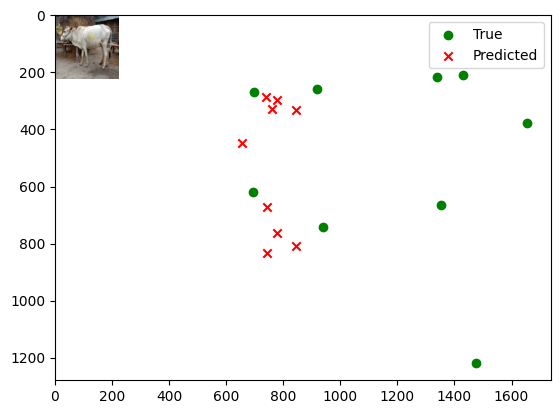

Image number: 35
True keypoints: [ 716.  241. 1733.  469.  670.  601.  934.  254.  945.  795. 1402.  274.
 1392.  787. 1495.  260. 1474. 1275.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[769.09717 332.86942]
 [663.8741  451.19708]
 [751.3375  679.71643]
 [852.58936 335.24283]
 [853.64355 817.3782 ]
 [785.53046 301.88297]
 [788.78235 771.1605 ]
 [748.6502  289.60785]
 [753.1444  843.5814 ]]


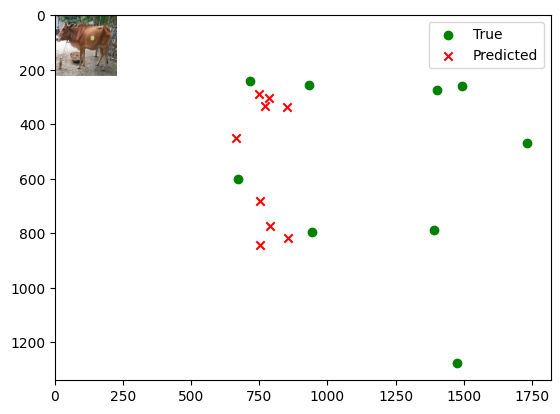

Image number: 36
True keypoints: [ 790.  309. 1806.  408.  750.  648. 1020.  326. 1036.  791. 1491.  274.
 1491.  724. 1578.  261. 1578. 1326.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[780.7856  337.54498]
 [673.51166 457.78137]
 [762.74927 689.94574]
 [865.1825  339.96063]
 [866.29407 829.62164]
 [797.1053  305.88367]
 [800.2897  782.70416]
 [759.5582  293.38422]
 [764.24634 856.11304]]


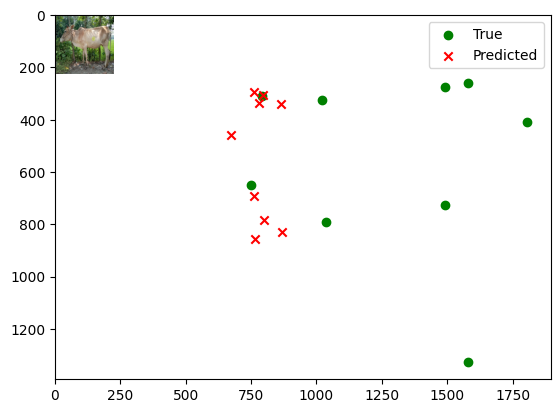

Image number: 37
True keypoints: [ 692.  372. 1684.  401.  739.  689.  943.  310.  977.  792. 1355.  246.
 1377.  717. 1434.  233. 1463. 1202.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[791.2356  343.21295]
 [683.4654  464.49445]
 [772.84717 699.3502 ]
 [877.5473  345.60394]
 [878.6969  841.2149 ]
 [808.7465  311.677  ]
 [812.00726 793.577  ]
 [770.81506 299.20328]
 [775.3965  868.32196]]


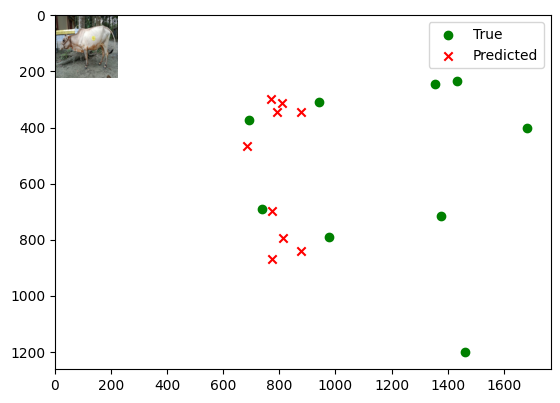

Image number: 38
True keypoints: [1181.  363.  235.  449. 1190.  703.  961.  369.  962.  825.  513.  339.
  537.  757.  448.  320.  494. 1243.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[758.9035  328.80432]
 [650.20044 445.46082]
 [741.8262  671.6688 ]
 [839.4524  330.52972]
 [840.5657  805.4686 ]
 [771.9256  296.61438]
 [775.18866 760.7824 ]
 [734.77545 284.25928]
 [739.3047  830.4494 ]]


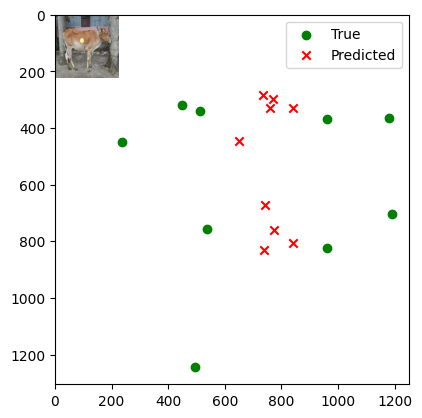

Image number: 39
True keypoints: [ 646.  309. 1673.  413.  662.  671.  870.  315.  906.  821. 1361.  270.
 1367.  746. 1445.  262. 1472. 1285.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[813.6571  354.0462 ]
 [703.68774 478.18024]
 [794.67737 719.3502 ]
 [903.10486 356.43185]
 [904.19916 865.4489 ]
 [832.4444  322.06726]
 [835.8071  816.44995]
 [793.562   309.42236]
 [798.2014  893.5858 ]]


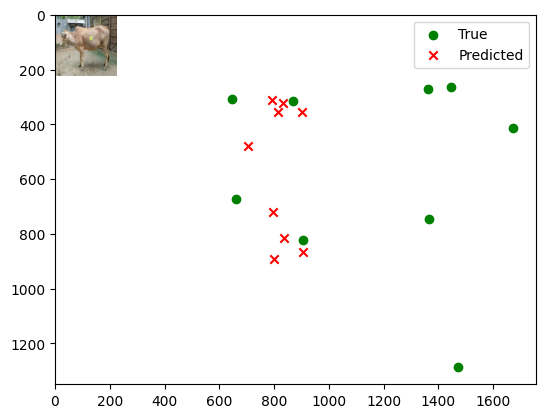

Image number: 40
True keypoints: [ 750.  354. 1599.  456.  709.  638.  922.  345.  939.  780. 1313.  324.
 1314.  749. 1397.  317. 1401. 1255.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[793.07135 344.31552]
 [685.05    465.7104 ]
 [774.6119  701.01904]
 [879.658   346.66324]
 [880.86395 843.2379 ]
 [810.7136  312.78186]
 [813.98376 795.4806 ]
 [772.6979  300.29462]
 [777.26154 870.42017]]


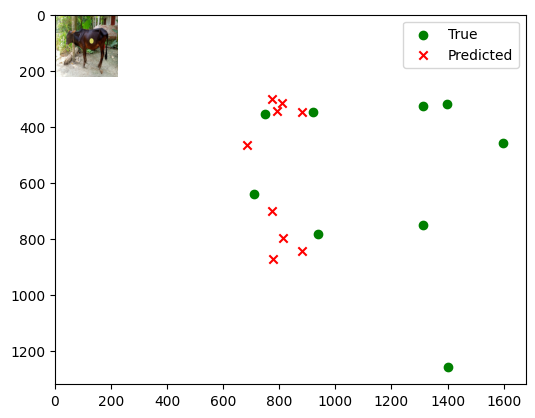

Image number: 41
True keypoints: [1224.  248.  190.  387. 1207.  585.  980.  258.  991.  744.  539.  232.
  554.  706.  415.  226.  438. 1242.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[731.69305 314.7387 ]
 [627.60364 428.3226 ]
 [715.1934  646.7849 ]
 [808.82996 316.81912]
 [809.9456  776.31024]
 [744.1085  283.54428]
 [747.1663  732.81226]
 [708.4692  271.37015]
 [713.0488  800.3211 ]]


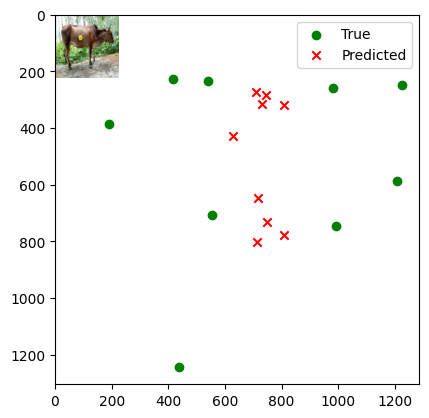

Image number: 42
True keypoints: [1164.  331.  372.  461. 1213.  647.  956.  354.  964.  780.  624.  321.
  606.  740.  556.  318.  540. 1170.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[744.4535  320.79428]
 [640.34436 436.01843]
 [727.407   657.8264 ]
 [823.8536  323.02136]
 [825.0668  790.4141 ]
 [758.57904 289.8364 ]
 [761.6388  745.8152 ]
 [722.5386  277.66702]
 [727.0634  815.22894]]


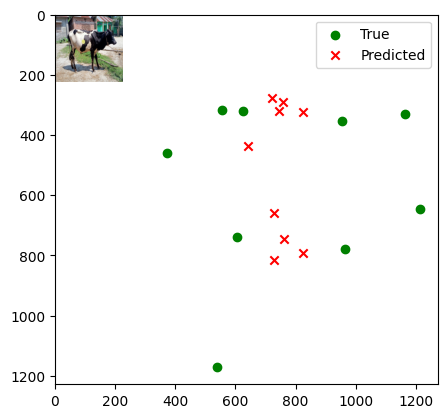

Image number: 43
True keypoints: [ 752.  271. 1795.  442.  729.  645.  967.  287.  964.  816. 1454.  291.
 1443.  779. 1551.  278. 1537. 1299.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[790.6093  342.6223 ]
 [682.9781  463.99765]
 [772.26825 698.74286]
 [876.78766 345.0719 ]
 [877.80695 840.43555]
 [807.9821  311.00284]
 [811.2439  792.9036 ]
 [770.10046 298.49454]
 [774.73663 867.55225]]


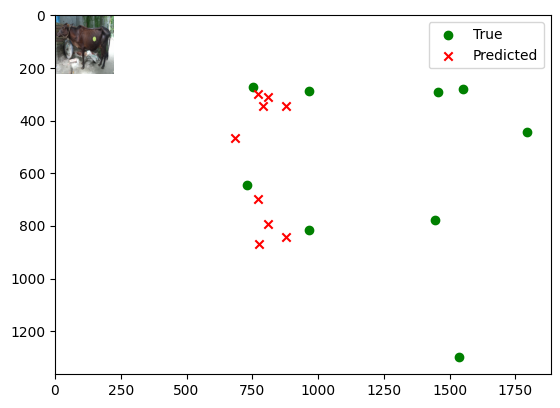

Image number: 44
True keypoints: [ 725.  347. 1763.  479.  662.  700.  900.  365.  927.  873. 1424.  306.
 1432.  803. 1528.  293. 1571. 1337.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[831.734   363.85513]
 [721.08014 489.72543]
 [812.0993  735.5218 ]
 [924.56903 366.2322 ]
 [925.72375 885.5029 ]
 [852.7269  332.176  ]
 [856.2435  835.2853 ]
 [813.2378  319.56567]
 [817.6998  914.80005]]


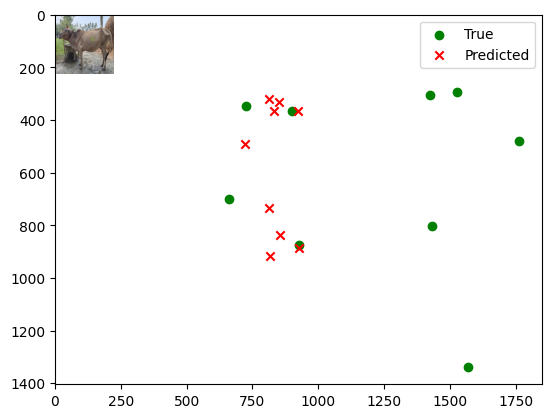

Image number: 45
True keypoints: [ 704.  226. 1694.  436.  654.  551.  891.  235.  892.  741. 1386.  221.
 1385.  705. 1492.  225. 1509. 1273.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[770.62897 332.63983]
 [664.3936  451.63052]
 [752.89276 680.94745]
 [853.6345  335.04706]
 [854.64575 818.6185 ]
 [786.31226 301.1005 ]
 [789.4586  772.38074]
 [749.1997  288.66995]
 [753.8764  844.6666 ]]


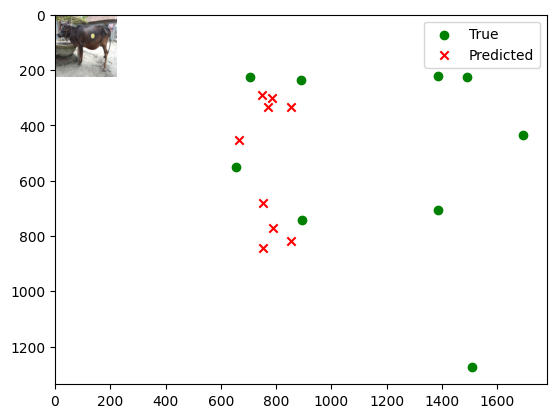

Image number: 46
True keypoints: [1290.  304.  229.  429. 1281.  608. 1059.  279. 1051.  760.  590.  235.
  606.  750.  463.  206.  480. 1212.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[742.6046  319.78912]
 [637.79504 434.86957]
 [725.77625 656.4056 ]
 [821.369   321.93378]
 [822.42883 788.1488 ]
 [755.88245 288.45755]
 [758.9551  743.90436]
 [719.79395 276.21017]
 [724.3951  812.72095]]


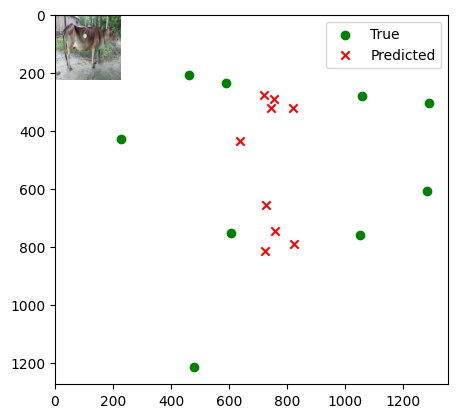

Image number: 47
True keypoints: [ 712.  262. 1814.  379.  707.  614.  955.  253.  969.  756. 1439.  234.
 1439.  698. 1559.  228. 1571. 1322.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[751.65106 323.80804]
 [647.2654  440.23584]
 [734.46234 664.12994]
 [832.1026  326.16342]
 [833.2055  798.1885 ]
 [766.2979  292.7383 ]
 [769.4035  753.1151 ]
 [730.0453  280.4782 ]
 [734.59753 823.37604]]


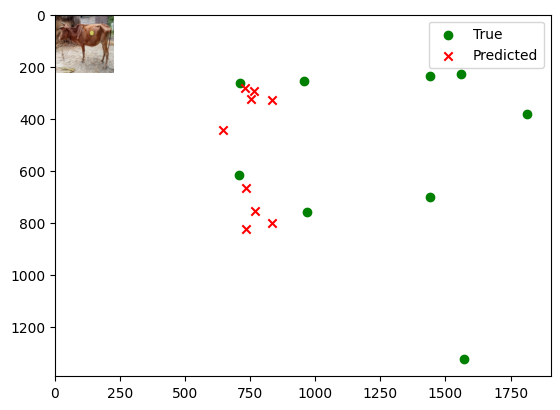

Image number: 48
True keypoints: [ 821.  275. 1808.  314.  803.  581. 1016.  259. 1038.  741. 1470.  224.
 1478.  697. 1573.  209. 1578. 1286.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[760.6342  328.34763]
 [655.49316 445.81714]
 [743.1691  672.16113]
 [842.4949  330.70328]
 [843.6244  807.98035]
 [776.01404 297.22043]
 [779.18146 762.3625 ]
 [739.3811  284.94757]
 [743.91223 833.6342 ]]


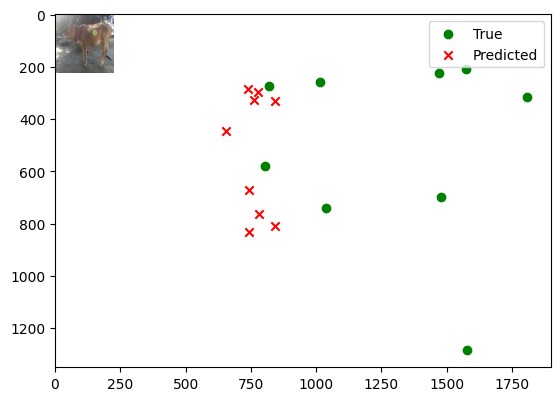

Image number: 49
True keypoints: [ 713.  314. 1760.  359.  648.  609.  930.  324.  948.  796. 1403.  277.
 1410.  757. 1525.  253. 1590. 1264.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[794.87964 344.0417 ]
 [686.2853  466.26196]
 [776.4675  702.4401 ]
 [881.1949  346.51193]
 [882.2318  844.7978 ]
 [811.9709  312.0197 ]
 [815.1914  797.03436]
 [773.81067 299.40363]
 [778.553   871.95435]]


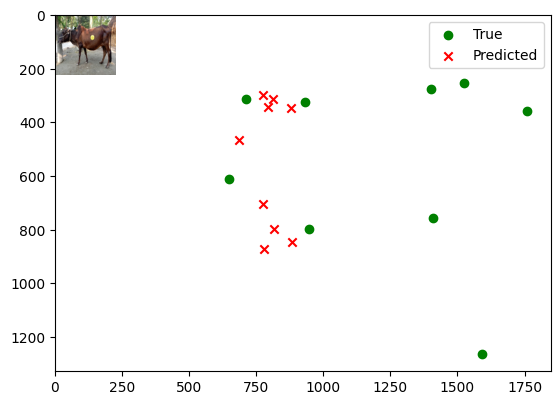

Image number: 50
True keypoints: [1189.  320.  199.  402. 1240.  684. 1022.  306. 1026.  808.  514.  233.
  521.  729.  392.  230.  410. 1202.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[683.1255  293.51926]
 [575.5587  400.10693]
 [668.7926  605.7744 ]
 [750.98627 294.28482]
 [752.1181  722.28265]
 [687.57025 260.71997]
 [690.7282  683.6146 ]
 [652.7514  248.65808]
 [657.23364 742.66376]]


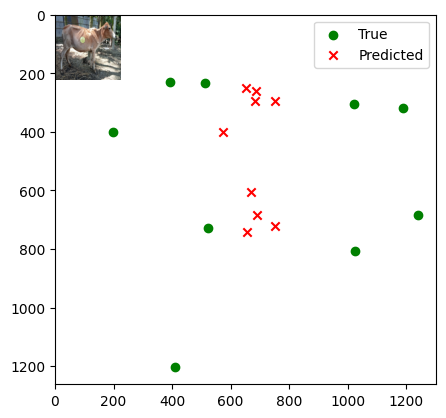

Image number: 51
True keypoints: [1206.  219.  153.  293. 1259.  589. 1010.  228. 1016.  769.  500.  159.
  520.  716.  399.  143.  441. 1283.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[730.7565  314.78275]
 [628.53253 428.01892]
 [714.1138  645.7674 ]
 [808.6978  317.01443]
 [809.8748  775.8458 ]
 [744.5298  284.3695 ]
 [747.6506  732.1051 ]
 [709.223   272.40115]
 [713.5943  800.1775 ]]


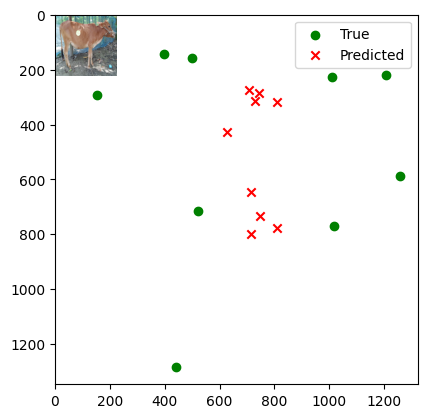

Image number: 52
True keypoints: [ 756.  336. 1694.  399.  749.  646.  956.  346.  965.  790. 1390.  305.
 1402.  762. 1487.  293. 1511. 1216.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[794.7516  344.5673 ]
 [686.1503  466.4308 ]
 [776.2884  702.42334]
 [881.2174  346.97015]
 [882.399   844.80994]
 [812.07    312.7532 ]
 [815.32324 797.02985]
 [773.90857 300.17935]
 [778.5673  872.0071 ]]


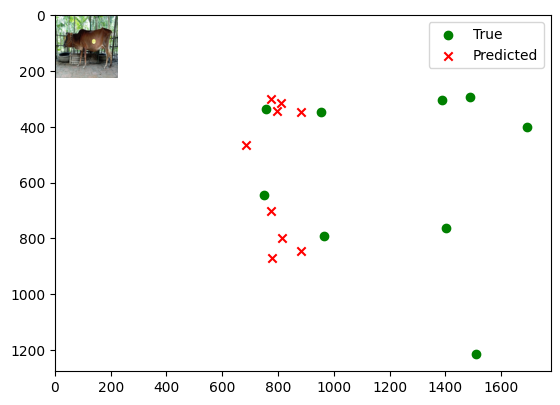

Image number: 53
True keypoints: [ 730.  256. 1665.  345.  756.  574.  946.  236.  963.  691. 1370.  191.
 1384.  630. 1472.  178. 1501. 1181.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[772.4059  333.43497]
 [665.9767  452.67682]
 [754.6462  682.52466]
 [855.62805 335.85983]
 [856.62897 820.5121 ]
 [788.14795 301.85843]
 [791.30457 774.18896]
 [750.991   289.41257]
 [755.66095 846.6605 ]]


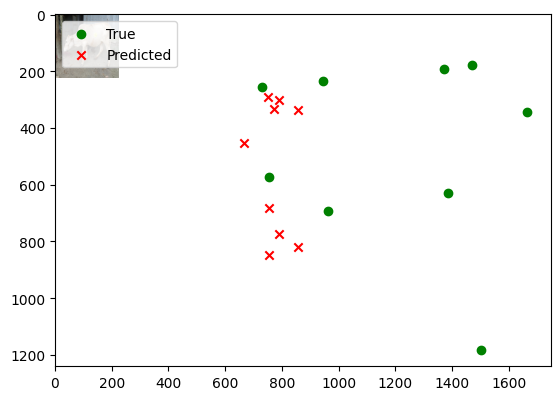

Image number: 54
True keypoints: [ 633.  406. 1505.  525.  561.  707.  812.  401.  829.  857. 1263.  365.
 1256.  763. 1330.  356. 1305. 1229.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[867.41595 381.9037 ]
 [754.41077 511.97943]
 [846.68945 767.3532 ]
 [966.06616 384.36462]
 [967.26245 924.5499 ]
 [891.60187 350.20593]
 [895.3401  872.0448 ]
 [850.751   337.46106]
 [855.0986  955.83356]]


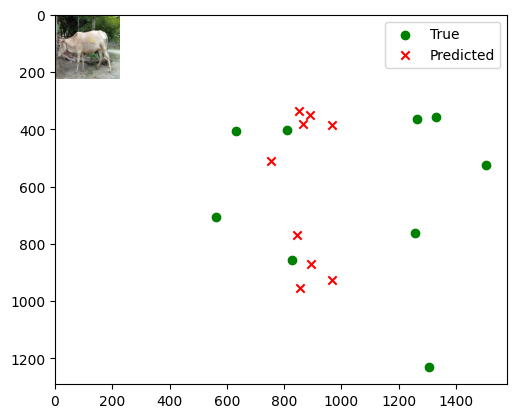

Image number: 55
True keypoints: [1142.  322.  140.  403. 1163.  710.  930.  339.  911.  841.  470.  261.
  464.  760.  350.  244.  339. 1264.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[796.51276 346.06345]
 [688.6019  467.88205]
 [777.96423 704.09546]
 [883.84705 348.46237]
 [884.9697  847.0596 ]
 [814.6494  314.59528]
 [817.9807  799.0991 ]
 [776.567   302.11826]
 [781.11053 874.52893]]


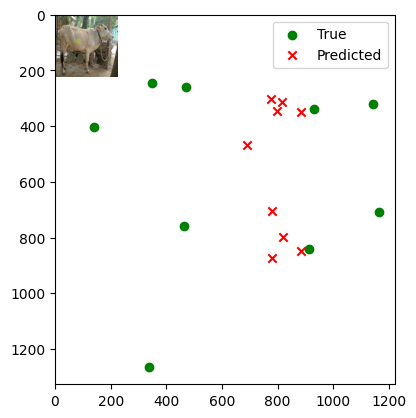

Image number: 56
True keypoints: [ 686.  416. 1554.  451.  667.  682.  869.  421.  887.  831. 1268.  371.
 1288.  802. 1376.  348. 1405. 1205.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[816.2313  355.81137]
 [706.6829  480.0059 ]
 [797.06354 721.64703]
 [906.4935  358.21362]
 [907.6228  868.5143 ]
 [835.819   324.13504]
 [839.2162  819.2816 ]
 [796.91956 311.55762]
 [801.4761  896.9679 ]]


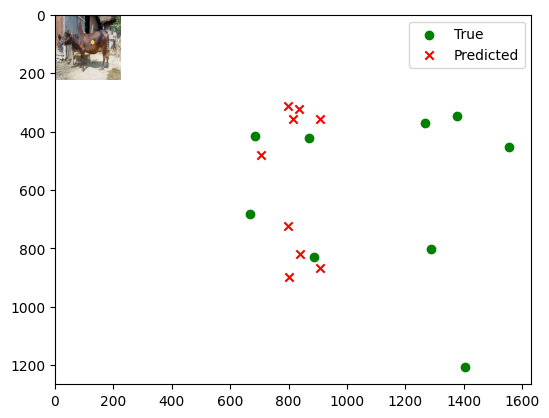

Image number: 57
True keypoints: [ 707.  249. 1715.  339.  635.  595.  884.  266.  902.  766. 1368.  222.
 1387.  697. 1497.  197. 1525. 1263.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[713.8255  305.9363 ]
 [611.5665  417.35434]
 [697.8434  630.8409 ]
 [788.432   308.0101 ]
 [789.4715  756.9424 ]
 [725.12823 274.9945 ]
 [728.09595 714.5517 ]
 [690.27325 262.94525]
 [694.82043 780.1364 ]]


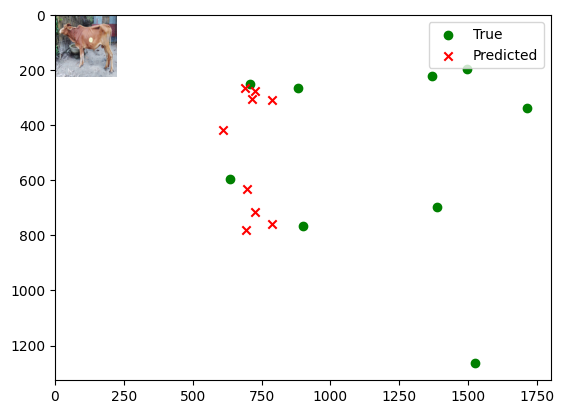

Image number: 58
True keypoints: [1184.  325.  168.  395. 1156.  637.  931.  277.  914.  772.  464.  224.
  481.  725.  388.  216.  393. 1185.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[762.0484  329.7561 ]
 [655.4154  447.0681 ]
 [744.7018  673.9034 ]
 [843.7884  331.85815]
 [844.8647  809.3162 ]
 [776.6495  298.21094]
 [779.8859  763.93854]
 [739.7745  285.88275]
 [744.33386 834.8444 ]]


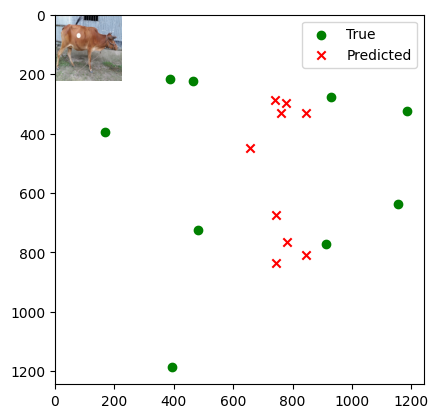

Image number: 59
True keypoints: [1292.  331.  205.  398. 1322.  635. 1066.  319. 1050.  815.  522.  273.
  522.  708.  440.  259.  430. 1280.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[784.34717 340.4612 ]
 [677.49554 460.59613]
 [766.11334 693.3173 ]
 [870.0015  342.79987]
 [871.1908  833.9419 ]
 [801.7801  309.25146]
 [805.0642  786.7508 ]
 [764.2005  296.89774]
 [768.6775  860.84326]]


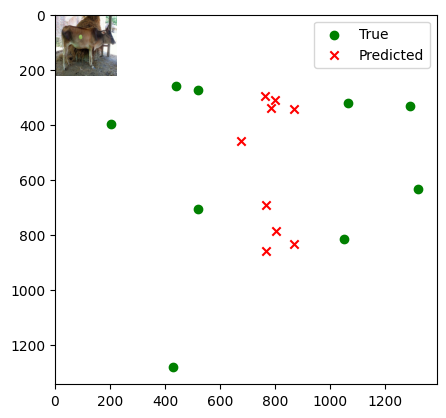

Image number: 60
True keypoints: [1159.  276.  366.  305. 1161.  576.  961.  286.  962.  694.  594.  246.
  606.  655.  505.  240.  538. 1068.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[714.4501  306.92963]
 [608.3102  418.15475]
 [698.8375  632.3392 ]
 [787.88055 308.46594]
 [788.8719  756.8361 ]
 [723.3561  274.72653]
 [726.41205 715.24774]
 [687.8772  262.54208]
 [692.5176  779.4208 ]]


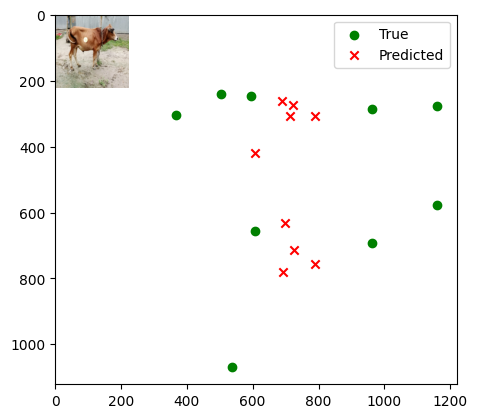

Image number: 61
True keypoints: [ 688.  396. 1727.  477.  712.  644.  922.  355.  944.  813. 1371.  336.
 1368.  796. 1507.  315. 1494. 1263.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[810.1138  352.70062]
 [700.24976 476.178  ]
 [791.23334 716.31396]
 [899.073   354.99603]
 [900.16864 861.62305]
 [828.6172  320.74255]
 [831.9832  812.9454 ]
 [789.85315 308.14893]
 [794.4486  889.61206]]


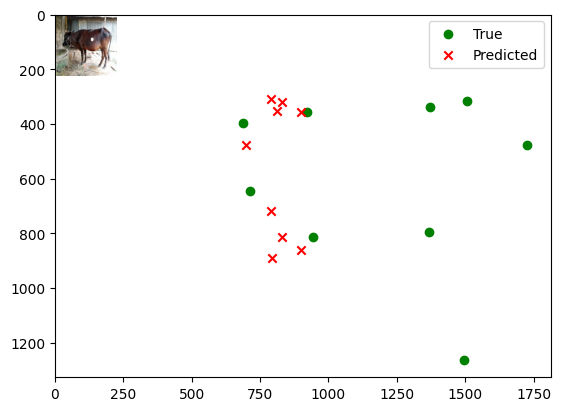

Image number: 62
True keypoints: [ 734.  192. 1761.  303.  720.  534.  957.  185.  971.  672. 1393.  157.
 1403.  636. 1504.  146. 1516. 1150.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[727.38196 311.83432]
 [624.6072  425.2976 ]
 [710.9463  642.5853 ]
 [804.0136  314.105  ]
 [805.03    771.6747 ]
 [739.9119  280.8158 ]
 [742.8977  728.23267]
 [704.5817  268.65433]
 [709.18994 795.5846 ]]


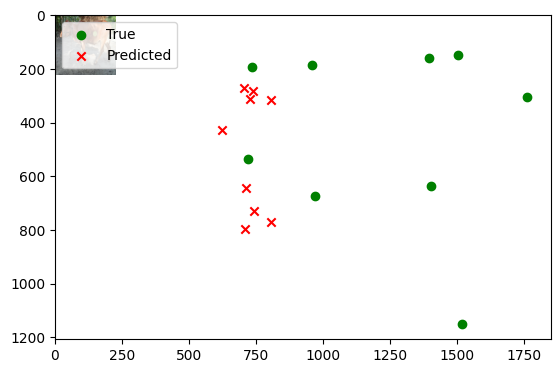

Image number: 63
True keypoints: [ 714.  361. 1690.  521.  635.  685.  866.  374.  875.  876. 1356.  346.
 1361.  831. 1472.  337. 1484. 1280.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[807.7622  351.41943]
 [698.6086  474.69672]
 [788.8919  714.09204]
 [896.5702  353.80386]
 [897.7009  859.1851 ]
 [826.4815  319.6975 ]
 [829.83374 810.5215 ]
 [787.86707 307.10583]
 [792.45746 887.1367 ]]


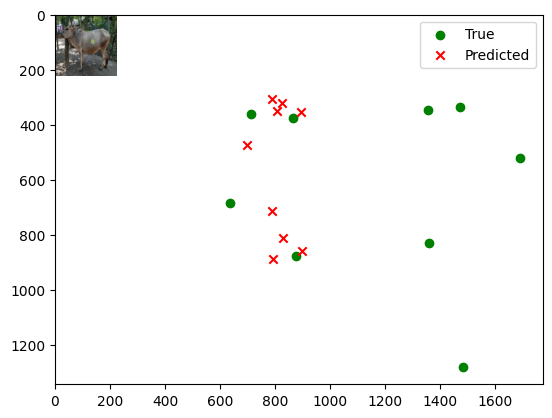

Image number: 64
True keypoints: [ 719.  249. 1612.  344.  654.  600.  867.  261.  887.  742. 1329.  208.
 1355.  651. 1404.  206. 1461. 1185.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[758.92914 327.65765]
 [654.21906 444.82056]
 [741.495   670.6406 ]
 [840.68616 330.01007]
 [841.7716  806.2313 ]
 [774.35736 296.62198]
 [777.5199  760.65295]
 [737.8522  284.3666 ]
 [742.3933  831.8396 ]]


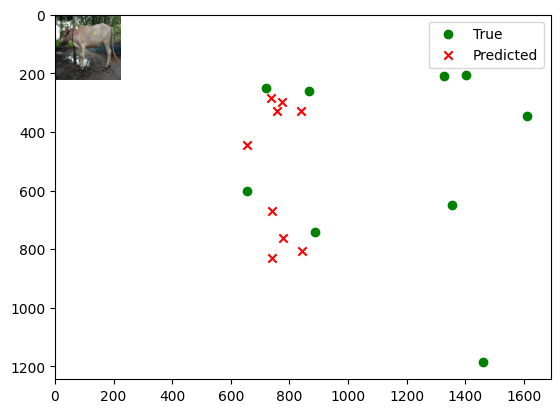

Image number: 65
True keypoints: [ 744.  310. 1701.  416.  751.  638.  958.  309.  990.  755. 1394.  285.
 1407.  694. 1474.  273. 1489. 1196.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[807.4397  351.37555]
 [698.72534 474.56958]
 [788.57007 713.7996 ]
 [896.4319  353.7999 ]
 [897.4957  858.9214 ]
 [826.3862  319.77774]
 [829.76514 810.2856 ]
 [787.86475 307.24576]
 [792.4303  886.94507]]


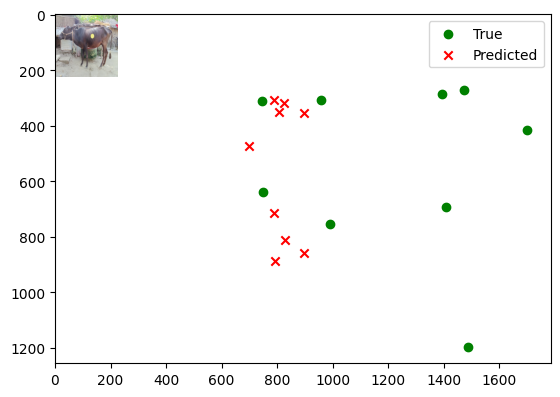

Image number: 66
True keypoints: [1195.  354.  288.  439. 1225.  658.  965.  391.  964.  814.  560.  351.
  565.  776.  512.  354.  523. 1188.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[832.24915 364.3334 ]
 [721.9352  490.18192]
 [812.56946 735.9912 ]
 [925.4078  366.74884]
 [926.6051  886.2193 ]
 [853.6225  332.89215]
 [857.1808  835.8994 ]
 [814.1857  320.29968]
 [818.593   915.6258 ]]


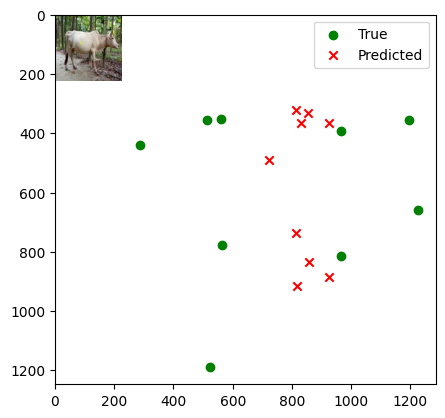

Image number: 67
True keypoints: [1186.  212.  148.  314. 1252.  558.  996.  220. 1009.  745.  483.  189.
  492.  679.  403.  181.  423. 1209.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[665.814   285.1488 ]
 [562.6886  389.4201 ]
 [651.67957 589.8117 ]
 [732.3076  286.21915]
 [733.3675  704.18097]
 [671.00476 253.56183]
 [674.0641  666.02356]
 [637.42664 241.81927]
 [641.84357 724.3054 ]]


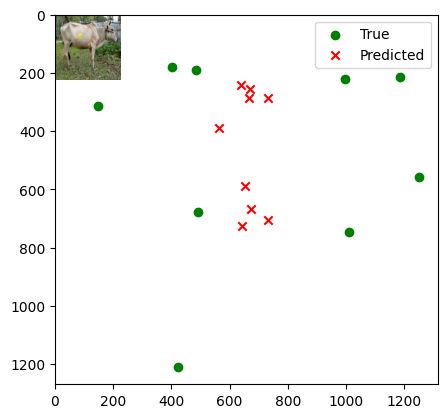

Image number: 68
True keypoints: [ 790.  272. 1763.  344.  748.  598.  974.  294.  997.  756. 1462.  227.
 1472.  664. 1555.  213. 1588. 1162.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[763.1599  329.35632]
 [657.71643 447.22986]
 [745.60614 674.3444 ]
 [845.2564  331.72858]
 [846.3589  810.64935]
 [778.5745  298.09912]
 [781.7105  764.8409 ]
 [741.80615 285.77206]
 [746.4061  836.37476]]


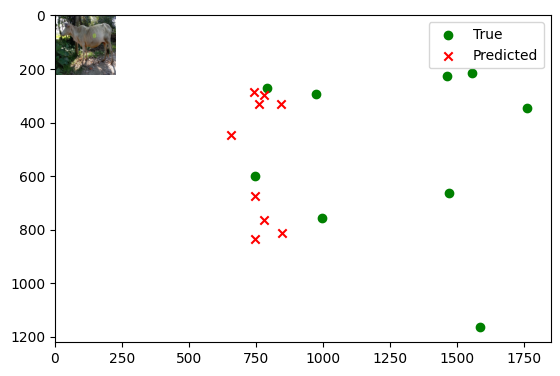

Image number: 69
True keypoints: [ 703.  305. 1619.  436.  698.  614.  882.  305.  901.  764. 1330.  297.
 1342.  753. 1404.  282. 1422. 1188.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[799.99695 347.52414]
 [691.61505 469.8834 ]
 [781.33997 707.1392 ]
 [887.6738  349.9279 ]
 [888.7911  850.74664]
 [818.2022  315.91086]
 [821.5209  802.5547 ]
 [779.93066 303.38138]
 [784.5228  878.32043]]


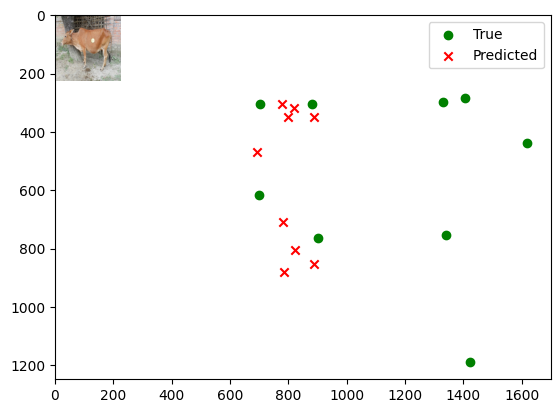

Image number: 70
True keypoints: [1231.  267.  346.  408. 1266.  593. 1035.  303. 1041.  735.  644.  274.
  649.  709.  551.  262.  578. 1281.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[775.2943  335.36392]
 [668.9335  454.69986]
 [757.37646 685.1476 ]
 [859.24524 337.74277]
 [860.3308  823.86487]
 [791.6396  303.9788 ]
 [794.84064 777.26764]
 [754.3822  291.57584]
 [758.9927  850.21277]]


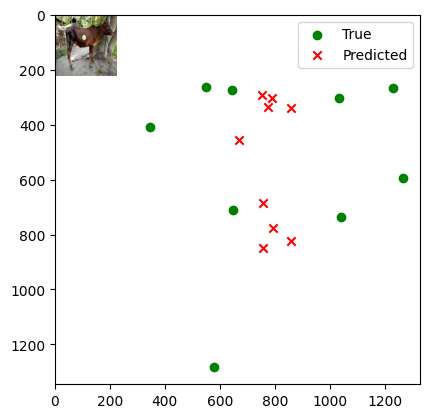

Image number: 71
True keypoints: [1154.  305.  294.  373. 1183.  601.  956.  316.  965.  750.  577.  263.
  584.  717.  474.  245.  496. 1269.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[744.631   321.79462]
 [636.8809  436.70618]
 [727.9958  658.9835 ]
 [822.9613  323.47894]
 [824.1494  789.9623 ]
 [756.4929  289.7125 ]
 [759.6874  746.14606]
 [719.8789  277.42035]
 [724.4164  814.14417]]


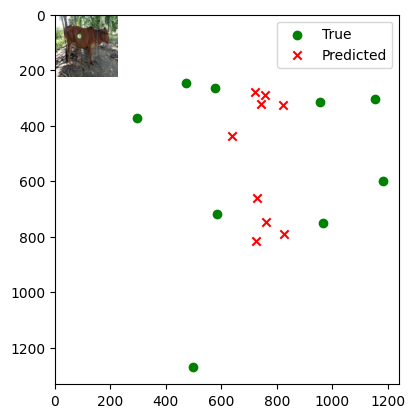

Image number: 72
True keypoints: [ 710.  298. 1567.  427.  623.  595.  839.  304.  841.  755. 1279.  296.
 1287.  702. 1356.  284. 1376. 1188.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[807.897   352.47864]
 [699.3081  475.2838 ]
 [788.9499  714.37067]
 [897.3193  354.82208]
 [898.56995 859.70685]
 [827.32556 321.21805]
 [830.7716  810.9769 ]
 [788.84186 308.79443]
 [793.2426  887.83545]]


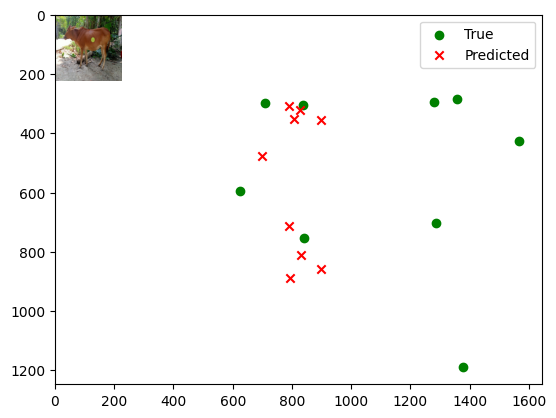

Image number: 73
True keypoints: [ 731.  448. 1547.  492.  678.  751.  897.  456.  922.  884. 1302.  401.
 1294.  806. 1355.  394. 1368. 1302.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[859.7875  378.05063]
 [747.2319  507.20575]
 [839.2844  760.54004]
 [957.15405 380.47433]
 [958.3572  916.18555]
 [883.2401  346.31433]
 [886.93335 864.18665]
 [842.6707  333.59174]
 [847.05304 947.02954]]


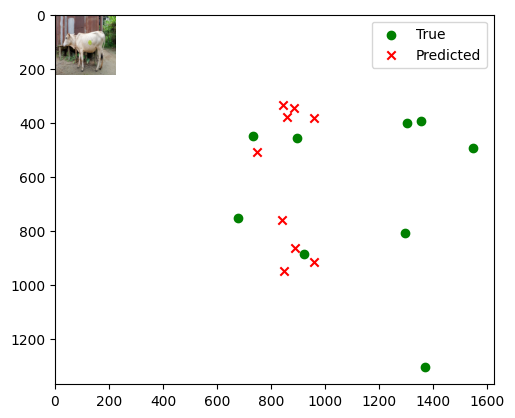

Image number: 74
True keypoints: [ 674.  344. 1501.  416.  659.  631.  837.  353.  857.  781. 1242.  322.
 1250.  721. 1329.  307. 1343. 1146.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[820.564   357.4881 ]
 [710.3409  482.45282]
 [801.3214  725.44495]
 [911.2319  359.93347]
 [912.34875 873.0499 ]
 [840.1566  325.58215]
 [843.5665  823.5792 ]
 [801.0318  312.92047]
 [805.6347  901.6427 ]]


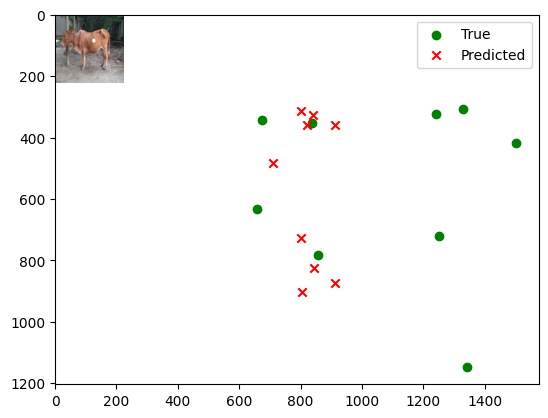

Image number: 75
True keypoints: [ 717.  237. 1794.  425.  729.  596.  947.  254.  967.  781. 1437.  201.
 1441.  713. 1546.  194. 1540. 1244.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[720.732   308.84427]
 [618.33484 421.37885]
 [704.5326  636.81537]
 [796.4005  311.0427 ]
 [797.38574 764.4531 ]
 [732.7054  277.87106]
 [735.68353 721.52673]
 [697.61707 265.75525]
 [702.22235 788.0123 ]]


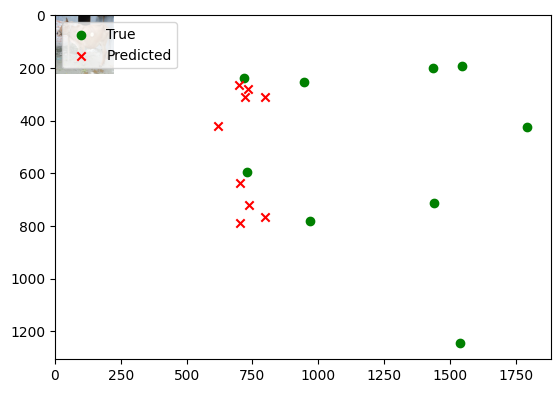

Image number: 76
True keypoints: [ 740.  315. 1672.  429.  708.  595.  923.  314.  949.  788. 1342.  294.
 1355.  737. 1444.  284. 1462. 1273.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[739.2701  318.38086]
 [635.7649  432.93365]
 [722.3947  653.2453 ]
 [818.0341  320.6201 ]
 [819.25726 784.8865 ]
 [753.1807  287.57257]
 [756.23065 740.5776 ]
 [717.3929  275.45844]
 [721.8636  809.4609 ]]


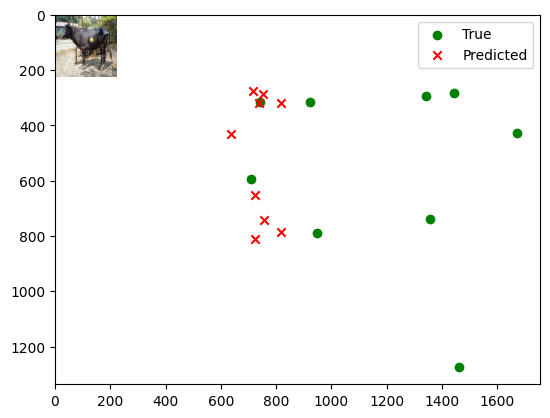

Image number: 77
True keypoints: [1297.  271.  216.  394. 1312.  628. 1039.  259. 1056.  757.  532.  225.
  553.  707.  429.  212.  473. 1080.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[718.38696 308.19373]
 [609.4762  420.31403]
 [702.9073  636.1312 ]
 [791.2033  309.57907]
 [792.1067  760.319  ]
 [725.6575  274.91672]
 [728.75696 719.0344 ]
 [689.6138  262.52078]
 [694.4365  782.6472 ]]


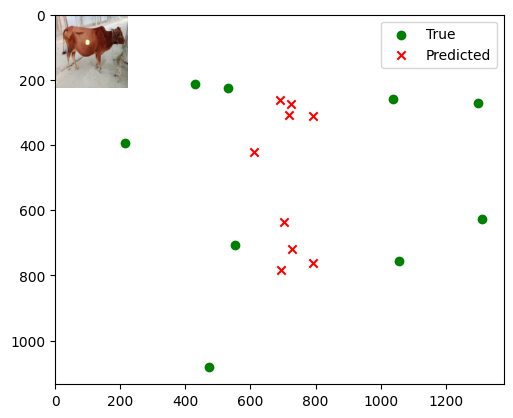

Image number: 78
True keypoints: [1124.  346.  238.  486. 1198.  671.  955.  385.  956.  814.  528.  335.
  541.  744.  470.  335.  506. 1233.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[823.40875 360.3221 ]
 [713.8843  484.90576]
 [803.96564 728.17426]
 [915.3618  362.67218]
 [916.5981  876.69867]
 [844.26434 329.06046]
 [847.7992  826.93176]
 [805.20447 316.56036]
 [809.57404 905.69476]]


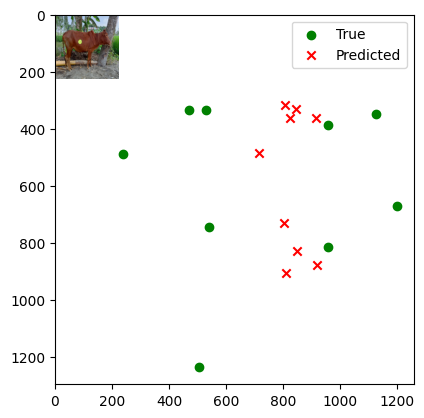

Image number: 79
True keypoints: [ 813.  453. 1403.  543.  763.  688.  920.  474.  922.  808. 1208.  446.
 1214.  759. 1271.  438. 1302. 1155.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[770.16095 333.09332]
 [664.26636 451.68152]
 [752.37726 680.6356 ]
 [853.4348  335.44315]
 [854.60864 818.3805 ]
 [786.26184 301.886  ]
 [789.4519  772.0672 ]
 [749.23035 289.53894]
 [753.7946  844.48096]]


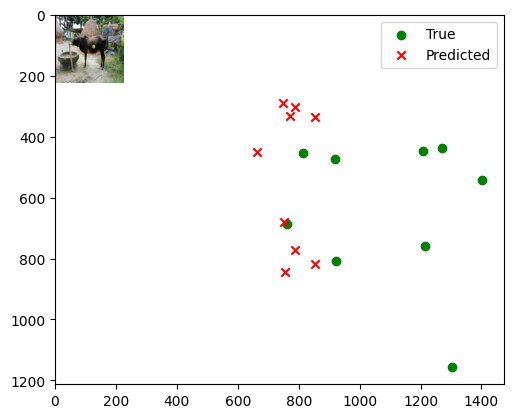

Image number: 80
True keypoints: [ 625.  350. 1573.  386.  615.  653.  846.  318.  865.  788. 1300.  281.
 1315.  698. 1390.  271. 1409. 1161.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[816.2111  354.90793]
 [706.1094  479.52963]
 [797.1053  721.4675 ]
 [905.9489  357.3883 ]
 [907.04016 868.1313 ]
 [835.1881  322.86502]
 [838.5248  818.98816]
 [796.18945 310.1842 ]
 [800.874   896.4371 ]]


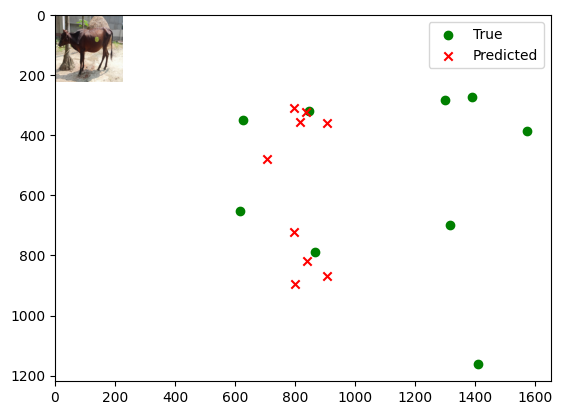

Image number: 81
True keypoints: [1112.  328.  213.  389. 1112.  661.  880.  314.  857.  779.  500.  266.
  495.  738.  424.  254.  424. 1256.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[727.49396 314.46494]
 [615.9365  426.90875]
 [711.90906 645.10016]
 [801.59283 315.3782 ]
 [802.60004 770.23474]
 [734.6827  280.8378 ]
 [737.97656 728.77844]
 [697.9761  268.41998]
 [702.6186  792.7186 ]]


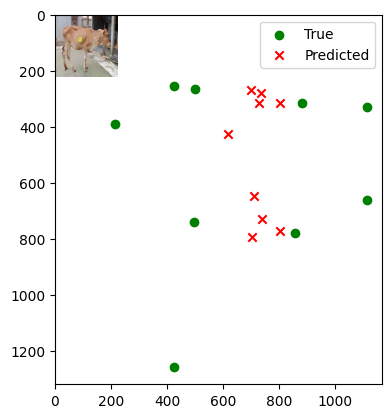

Image number: 82
True keypoints: [ 635.  340. 1706.  405.  604.  649.  822.  346.  866.  853. 1316.  308.
 1337.  816. 1469.  285. 1492. 1330.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[809.62317 350.98767]
 [699.51636 475.1241 ]
 [790.801   715.50494]
 [897.8963  353.52832]
 [898.9843  860.6807 ]
 [827.5307  318.67715]
 [830.8174  812.0318 ]
 [788.7301  305.94086]
 [793.5162  888.5177 ]]


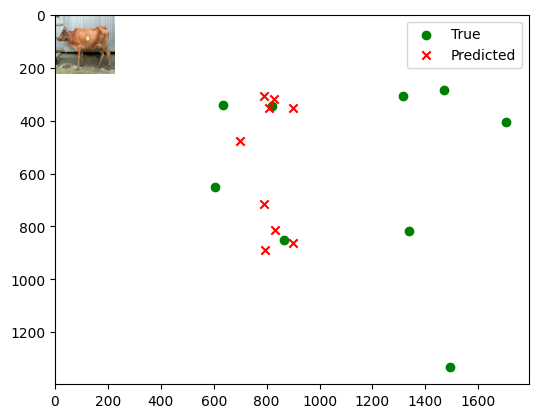

Image number: 83
True keypoints: [ 775.  294. 1763.  506.  688.  642.  958.  320.  947.  815. 1412.  323.
 1412.  773. 1532.  316. 1555. 1345.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[796.1559  345.8181 ]
 [687.563   467.58783]
 [777.6657  703.8309 ]
 [883.083   348.11234]
 [884.2424  846.4946 ]
 [813.7907  314.09573]
 [817.0693  798.6416 ]
 [775.5924  301.57288]
 [780.16846 873.79694]]


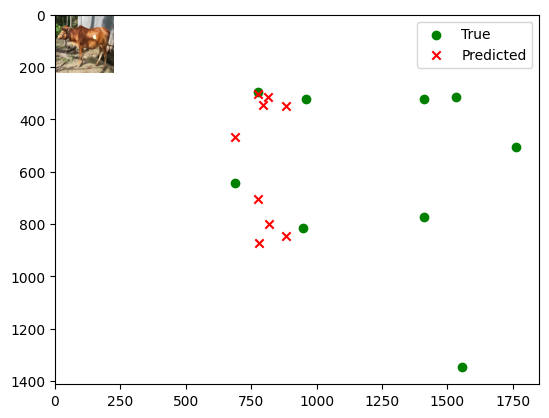

Image number: 84
True keypoints: [ 697.  355. 1626.  487.  702.  637.  899.  325.  917.  773. 1350.  299.
 1360.  730. 1428.  300. 1452. 1233.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[802.2834  348.5897 ]
 [693.6636  471.25638]
 [783.5614  709.1652 ]
 [890.25977 351.02777]
 [891.3794  853.1954 ]
 [820.60925 316.9257 ]
 [823.93384 804.89343]
 [782.2498  304.38187]
 [786.8365  880.89557]]


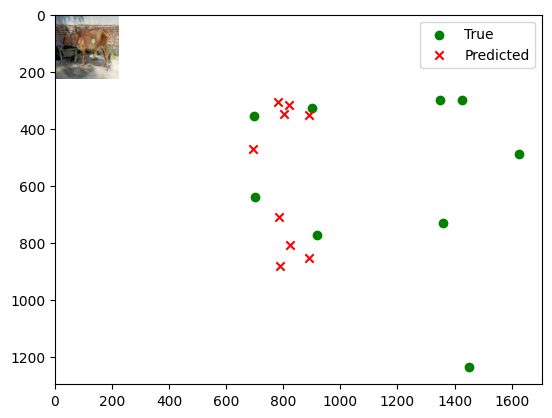

Image number: 85
True keypoints: [1174.  300.  155.  358. 1178.  626.  958.  305.  951.  771.  448.  231.
  467.  723.  341.  242.  399. 1216.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[787.6557  341.6079 ]
 [679.67126 462.3572 ]
 [769.42914 696.28894]
 [873.26526 343.8965 ]
 [874.4055  837.21936]
 [804.5724  309.9268 ]
 [807.81903 789.9395 ]
 [766.6931  297.43405]
 [771.2964  864.0737 ]]


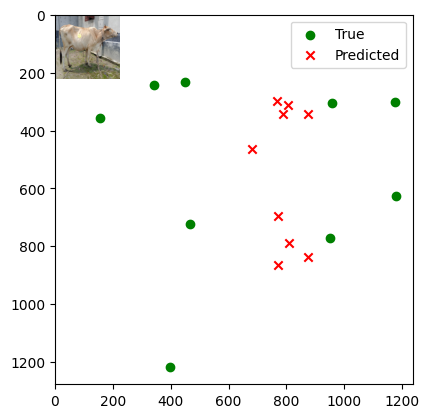

Image number: 86
True keypoints: [ 676.  310. 1613.  438.  718.  652.  944.  327.  945.  782. 1354.  324.
 1336.  729. 1414.  319. 1375. 1162.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[815.4938  355.71222]
 [706.21704 479.7136 ]
 [796.3367  721.0231 ]
 [905.85675 358.1228 ]
 [907.05304 867.8324 ]
 [835.28815 324.23248]
 [838.7297  818.61523]
 [796.46234 311.70807]
 [800.9357  896.30176]]


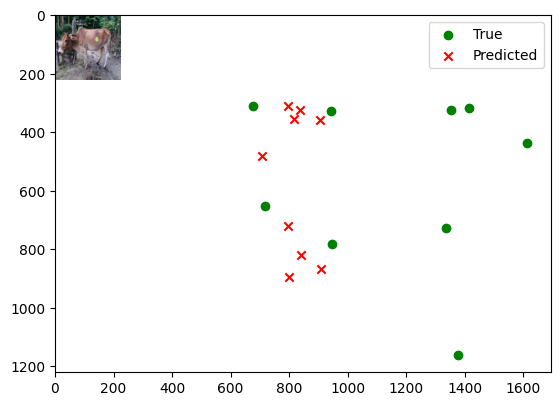

Image number: 87
True keypoints: [ 638.  216. 1627.  358.  631.  604.  860.  224.  880.  766. 1359.  195.
 1360.  702. 1427.  193. 1430. 1216.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[765.1852  330.5815 ]
 [660.0342  448.62003]
 [747.5876  676.18225]
 [847.86584 332.96133]
 [848.9097  813.0097 ]
 [781.0533  299.4707 ]
 [784.2378  767.02563]
 [744.31055 287.16925]
 [748.8657  838.92725]]


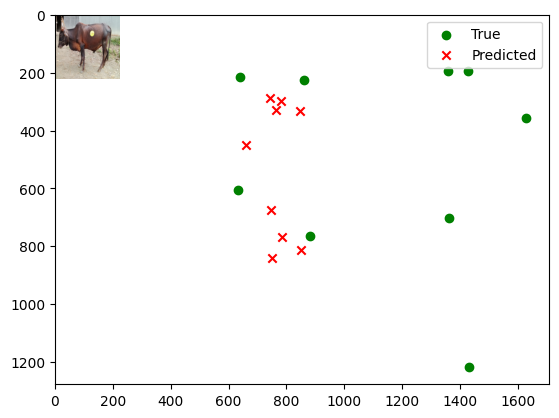

Image number: 88
True keypoints: [ 742.  370. 1551.  474.  728.  636.  915.  372.  932.  769. 1290.  370.
 1308.  734. 1373.  362. 1410. 1144.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[724.65216 313.10678]
 [617.9157  425.00256]
 [708.64825 641.6277 ]
 [800.11194 314.5067 ]
 [801.307   768.3056 ]
 [734.9078  281.19836]
 [738.09796 726.0039 ]
 [699.0488  269.11545]
 [703.45776 791.4844 ]]


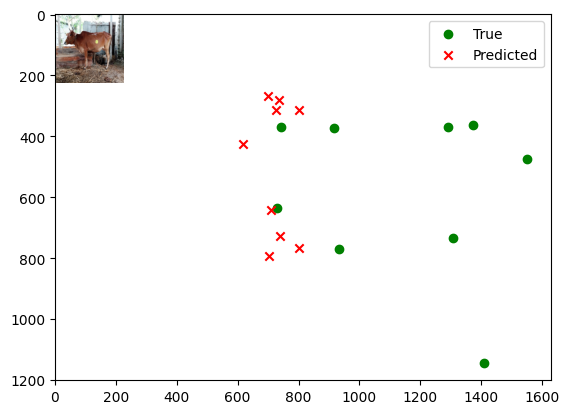

Image number: 89
True keypoints: [ 673.  285. 1699.  433.  644.  625.  851.  287.  868.  793. 1332.  263.
 1339.  753. 1466.  242. 1481. 1296.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[774.9708  335.24826]
 [668.5311  454.50876]
 [757.084   684.8731 ]
 [858.844   337.62262]
 [859.98474 823.5178 ]
 [791.26013 303.89972]
 [794.4675  776.9288 ]
 [754.01276 291.4946 ]
 [758.5973  849.816  ]]


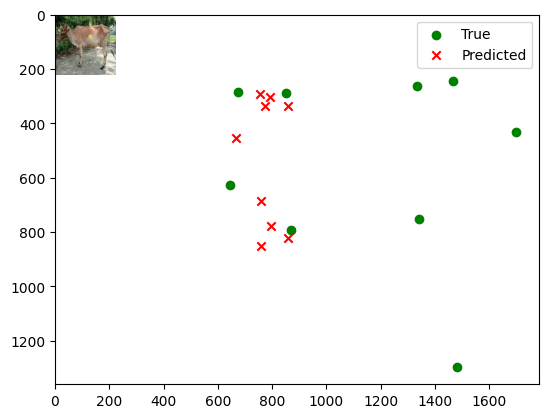

Image number: 90
True keypoints: [ 710.  324. 1690.  455.  728.  623.  893.  319.  933.  801. 1351.  301.
 1368.  764. 1452.  285. 1483. 1217.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[784.9955  340.4809 ]
 [677.76373 460.82544]
 [766.7603  693.8423 ]
 [870.4791  342.80927]
 [871.6877  834.5179 ]
 [802.1788  309.10822]
 [805.40576 787.2617 ]
 [764.50604 296.6835 ]
 [769.04456 861.3422 ]]


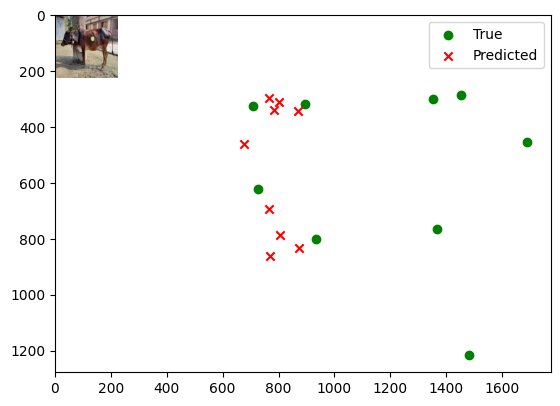

Image number: 91
True keypoints: [1224.  318.  241.  392. 1237.  643. 1002.  321. 1009.  806.  555.  292.
  562.  745.  452.  279.  462. 1257.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[798.4361  346.55542]
 [690.2134  468.79248]
 [779.82855 705.6761 ]
 [885.7965  349.01337]
 [886.9176  848.9852 ]
 [816.4711  314.9614 ]
 [819.7512  800.9131 ]
 [778.2792  302.42035]
 [782.897   876.48193]]


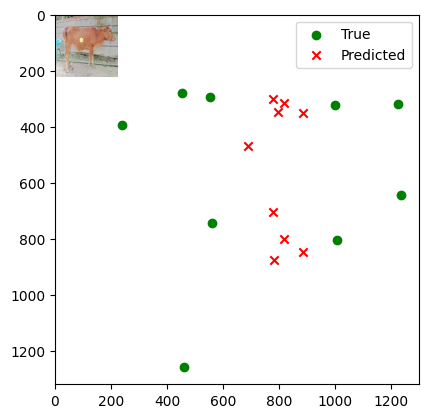

Image number: 92
True keypoints: [ 736.  266. 1715.  446.  700.  591.  924.  268.  933.  771. 1380.  235.
 1384.  712. 1498.  216. 1513. 1256.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[767.5424  331.07513]
 [661.3434  449.6888 ]
 [749.9136  678.1956 ]
 [849.9655  333.46884]
 [851.0509  815.21313]
 [782.8644  299.53848]
 [785.9868  769.182  ]
 [745.8547  287.10858]
 [750.5297  841.0605 ]]


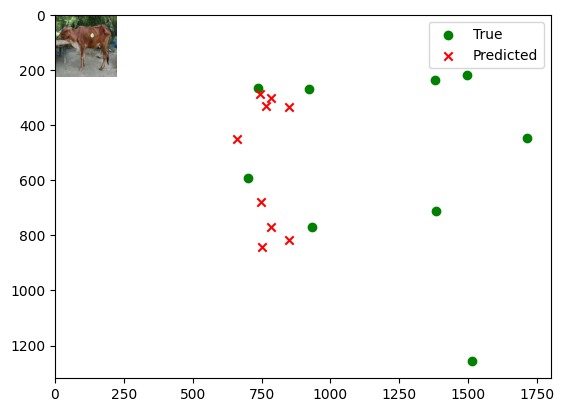

Image number: 93
True keypoints: [ 735.  299. 1689.  348.  676.  620.  913.  321.  928.  765. 1359.  275.
 1373.  685. 1463.  258. 1495. 1260.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[790.44025 343.42728]
 [683.6274  464.31497]
 [772.0154  698.66785]
 [877.22925 345.86188]
 [878.3683  840.6555 ]
 [808.6305  312.36078]
 [811.988   792.99603]
 [770.9135  299.97943]
 [775.3807  867.94617]]


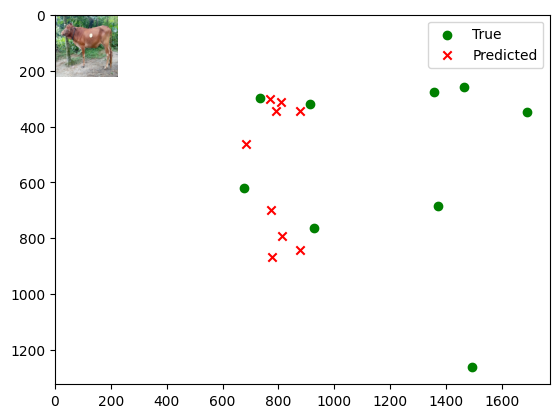

Image number: 94
True keypoints: [1214.  404.  433.  451. 1230.  676. 1052.  403. 1024.  802.  667.  353.
  663.  729.  618.  345.  613. 1146.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[823.3479  359.57983]
 [713.1623  484.51758]
 [803.9879  728.0638 ]
 [914.78375 361.9605 ]
 [915.9437  876.2937 ]
 [843.53107 327.89575]
 [847.0009  826.6601 ]
 [804.36    315.29327]
 [808.8473  905.15515]]


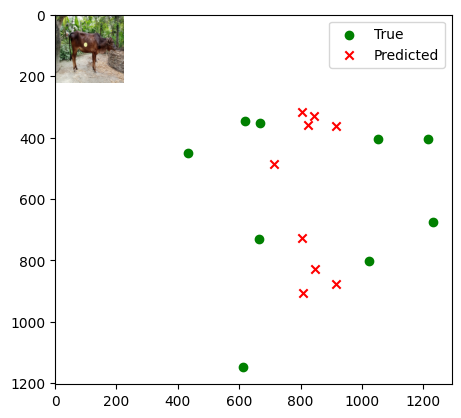

Image number: 95
True keypoints: [ 714.  295. 1717.  324.  725.  602.  918.  265.  947.  751. 1412.  197.
 1438.  662. 1497.  183. 1528. 1229.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[751.03375 324.56293]
 [646.6093  440.37115]
 [733.88654 663.9099 ]
 [831.7233  326.74094]
 [832.8424  797.7273 ]
 [765.8281  293.6459 ]
 [769.034   752.78577]
 [729.61163 281.50156]
 [734.0475  822.93555]]


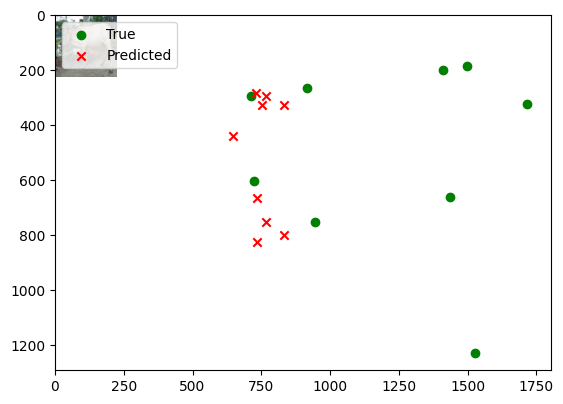

Image number: 96
True keypoints: [ 690.  202. 1748.  289.  662.  577.  887.  216.  926.  763. 1362.  146.
 1382.  666. 1494.  139. 1533. 1242.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[752.4032  323.9735 ]
 [647.84265 440.56262]
 [735.22144 664.76587]
 [832.8501  326.38513]
 [833.91956 798.892  ]
 [766.9447  292.78604]
 [770.09045 753.84106]
 [730.6471  280.5117 ]
 [735.2584  824.1396 ]]


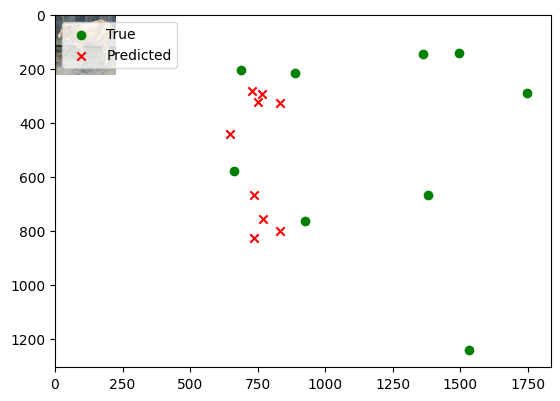

Image number: 97
True keypoints: [1217.  207.  167.  320. 1189.  523.  947.  199.  961.  694.  515.  166.
  535.  654.  421.  158.  466. 1154.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[739.34125 317.76242]
 [635.8145  432.66238]
 [722.50916 653.1868 ]
 [817.86957 320.07422]
 [818.93036 784.7364 ]
 [752.9358  286.7322 ]
 [755.9884  740.4891 ]
 [717.15497 274.53143]
 [721.7497  809.2706 ]]


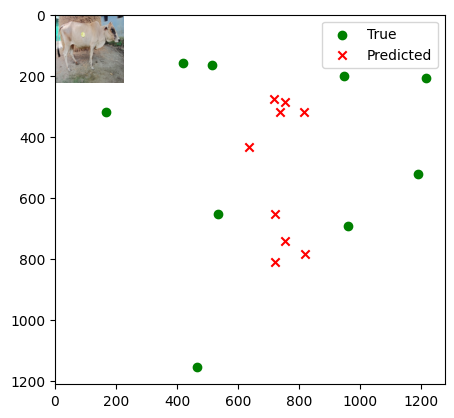

Image number: 98
True keypoints: [ 778.  359. 1651.  397.  761.  659.  959.  346.  965.  797. 1397.  307.
 1417.  715. 1464.  299. 1503. 1272.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[802.0276  348.9634 ]
 [693.6229  471.35928]
 [783.28125 709.01855]
 [890.2026  351.32483]
 [891.41034 853.1152 ]
 [820.6419  317.5116 ]
 [823.97864 804.7419 ]
 [782.315   305.01135]
 [786.8281  880.8304 ]]


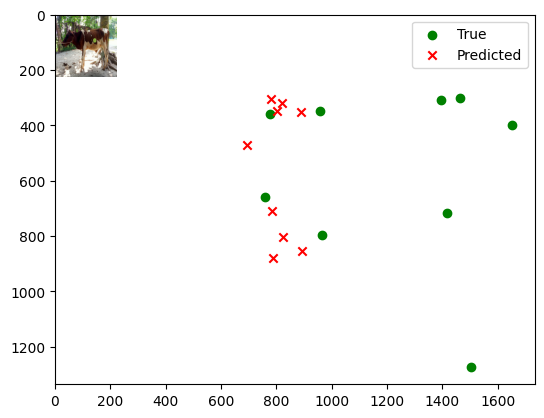

Image number: 99
True keypoints: [ 697.  291. 1768.  336.  687.  631.  966.  263.  999.  784. 1413.  191.
 1435.  690. 1487.  180. 1519. 1176.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[771.39355 333.27374]
 [665.1712  452.2201 ]
 [753.62103 681.6591 ]
 [854.6384  335.66595]
 [855.73566 819.55585]
 [787.30536 301.86557]
 [790.4612  773.2394 ]
 [750.189   289.47757]
 [754.7991  845.67395]]


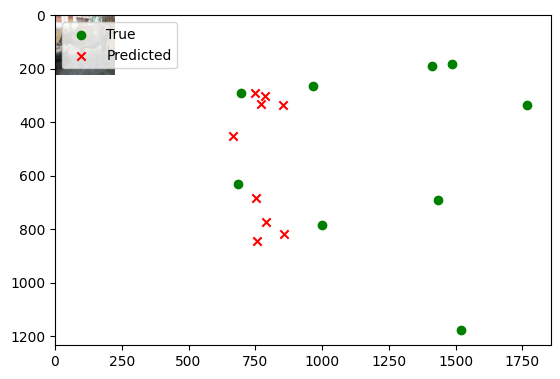

Image number: 100
True keypoints: [ 650.  264. 1661.  366.  611.  571.  867.  266.  881.  738. 1339.  224.
 1343.  695. 1446.  213. 1446. 1142.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[758.3625  327.18317]
 [653.56305 444.38748]
 [740.9566  670.1003 ]
 [839.9013  329.54333]
 [840.9949  805.5343 ]
 [773.6107  296.0935 ]
 [776.74524 760.00653]
 [737.10156 283.80505]
 [741.6554  831.07684]]


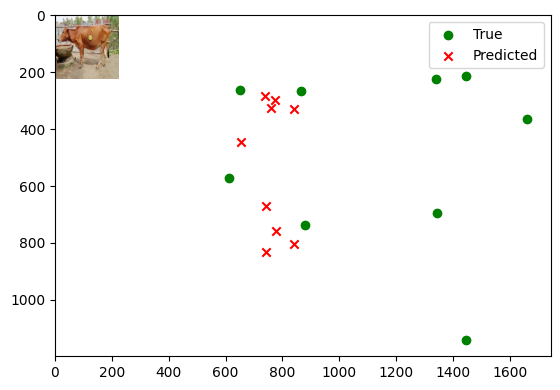

Image number: 101
True keypoints: [1167.  273.  251.  471. 1246.  593. 1019.  298. 1040.  771.  523.  267.
  546.  744.  465.  265.  486. 1173.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[710.2927  305.71832]
 [603.52496 416.08527]
 [694.87524 629.0523 ]
 [783.0277  307.00885]
 [784.1354  752.3228 ]
 [718.52527 273.45828]
 [721.6483  711.18176]
 [683.0527  261.31863]
 [687.5846  774.5458 ]]


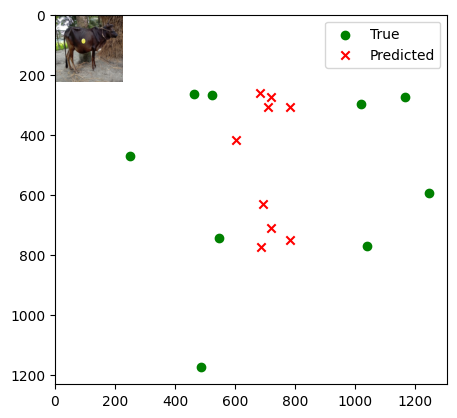

Image number: 102
True keypoints: [ 765.  386. 1719.  434.  830.  677. 1011.  349. 1041.  779. 1442.  300.
 1456.  711. 1504.  291. 1523. 1132.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[839.8667  366.54034]
 [728.13995 494.0924 ]
 [820.0785  742.5191 ]
 [933.3132  369.09894]
 [934.3363  893.92004]
 [860.758   334.33942]
 [864.2356  843.2429 ]
 [820.8717  321.54175]
 [825.5293  923.4743 ]]


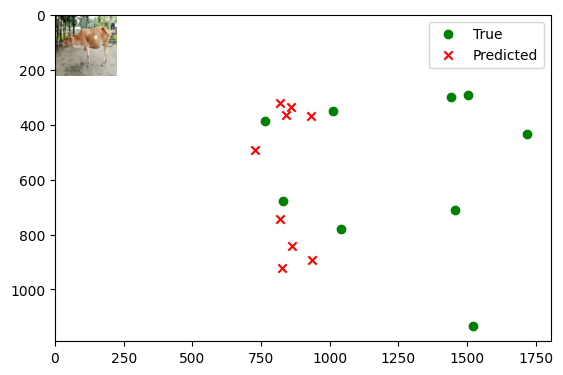

Image number: 103
True keypoints: [ 756.  437. 1662.  442.  762.  651.  957.  386.  979.  792. 1385.  354.
 1402.  718. 1470.  332. 1513. 1255.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[803.5129  349.9112 ]
 [695.0536  472.38104]
 [784.7218  710.39594]
 [892.0342  352.2557 ]
 [893.23724 854.80237]
 [822.34106 318.501  ]
 [825.708   806.34515]
 [783.9747  306.0328 ]
 [788.454   882.63403]]


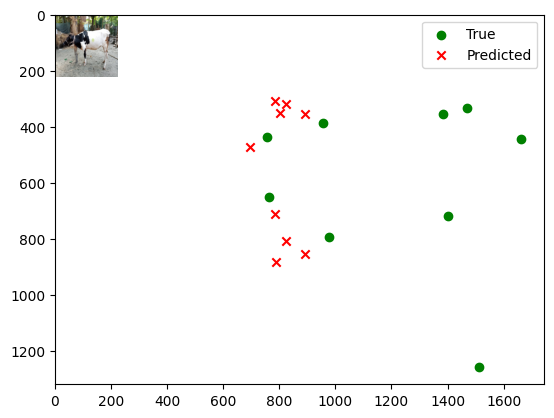

Image number: 104
True keypoints: [ 631.  246. 1616.  357.  619.  580.  843.  247.  866.  752. 1283.  197.
 1301.  657. 1387.  190. 1417. 1246.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[751.05225 323.56445]
 [646.75977 439.89297]
 [733.8688  663.60394]
 [831.44885 325.91833]
 [832.54224 797.5347 ]
 [765.6948  292.52686]
 [768.802   752.51196]
 [729.4586  280.27155]
 [734.01544 822.7242 ]]


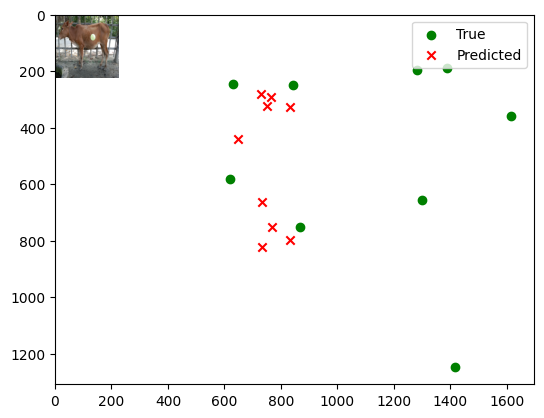

Image number: 105
True keypoints: [ 738.  439. 1581.  521.  719.  724.  895.  440.  905.  860. 1317.  413.
 1327.  788. 1408.  400. 1418. 1293.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[884.364   389.03296]
 [769.4297  521.7737 ]
 [863.22253 782.23883]
 [984.9163  391.62543]
 [985.968   942.55035]
 [909.0188  356.6469 ]
 [912.7615  889.04987]
 [867.39404 343.67828]
 [871.946   974.4929 ]]


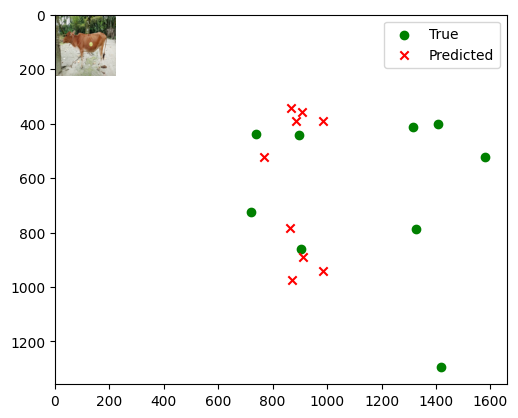

Image number: 106
True keypoints: [ 726.  181. 1653.  299.  680.  519.  912.  187.  934.  692. 1360.  150.
 1374.  626. 1444.  136. 1462. 1204.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[752.5634  324.19983]
 [647.8781  440.7467 ]
 [735.34906 664.942  ]
 [833.0362  326.53296]
 [834.1433  799.1105 ]
 [767.1263  293.02853]
 [770.21277 753.9969 ]
 [730.7885  280.74213]
 [735.3695  824.29767]]


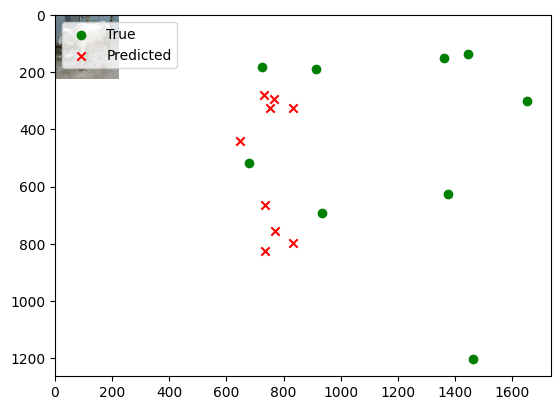

Image number: 107
True keypoints: [ 765.  283. 1713.  398.  758.  589.  968.  277.  985.  731. 1413.  254.
 1409.  671. 1514.  238. 1498. 1226.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[758.34265 327.90192]
 [653.7012  444.73596]
 [740.8827  670.239  ]
 [840.2108  330.18668]
 [841.3581  805.7064 ]
 [773.9352  297.03247]
 [777.13245 760.1967 ]
 [737.4531  284.8578 ]
 [741.8981  831.3542 ]]


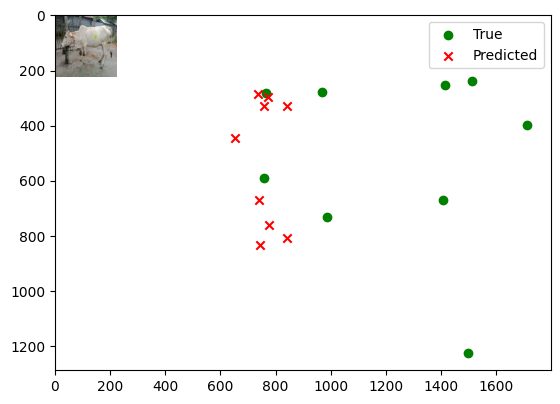

Image number: 108
True keypoints: [ 685.  161. 1684.  311.  644.  526.  908.  168.  908.  676. 1381.  146.
 1369.  635. 1471.  137. 1421. 1200.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[746.771   321.47733]
 [642.6261  437.2319 ]
 [729.747   659.80304]
 [826.448   323.81006]
 [827.5437  792.86475]
 [760.95734 290.39893]
 [764.0525  748.1132 ]
 [724.8876  278.17114]
 [729.4684  817.76227]]


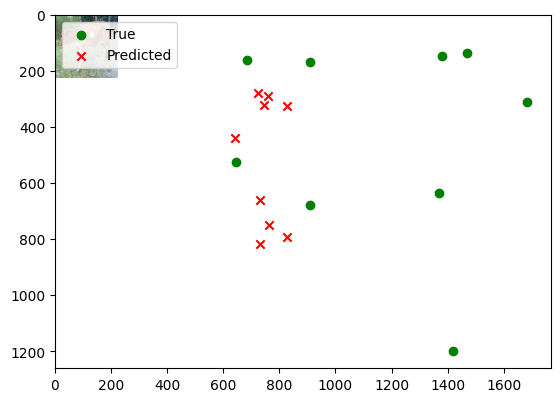

Image number: 109
True keypoints: [ 742.  254. 1683.  393.  708.  571.  948.  260.  947.  721. 1361.  254.
 1369.  669. 1475.  234. 1508. 1161.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[759.0173  327.66293]
 [654.07104 444.8642 ]
 [741.5815  670.72614]
 [840.6647  329.98236]
 [841.8066  806.274  ]
 [774.3234  296.58246]
 [777.4722  760.7026 ]
 [737.7652  284.3019 ]
 [742.2887  831.8386 ]]


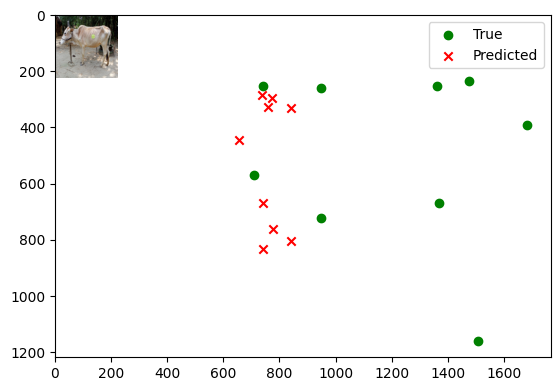

Image number: 110
True keypoints: [ 716.  304. 1671.  452.  699.  625.  905.  310.  922.  796. 1367.  295.
 1368.  772. 1469.  290. 1472. 1221.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[798.69165 346.87015]
 [690.44617 469.07224]
 [780.0833  705.96783]
 [886.1787  349.28674]
 [887.30273 849.3385 ]
 [816.82245 315.29153]
 [820.1289  801.2223 ]
 [778.62463 302.76935]
 [783.2092  876.86   ]]


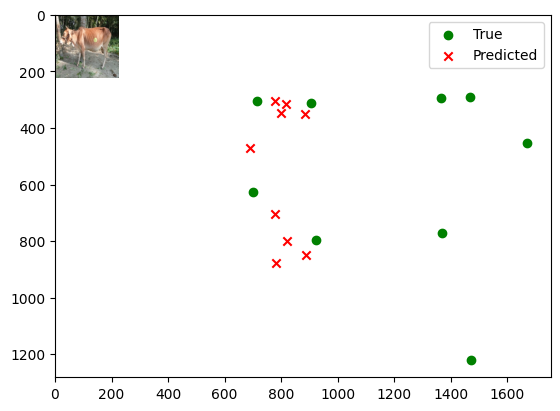

Image number: 111
True keypoints: [1216.  272.  135.  462. 1300.  609. 1014.  289. 1030.  817.  541.  226.
  560.  765.  453.  216.  495. 1247.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[649.7881  278.92056]
 [542.3519  380.6084 ]
 [636.70135 577.13885]
 [712.2401  279.07623]
 [713.23486 685.7106 ]
 [650.35516 245.79092]
 [653.519   649.9525 ]
 [616.5641  233.97878]
 [620.98065 704.1319 ]]


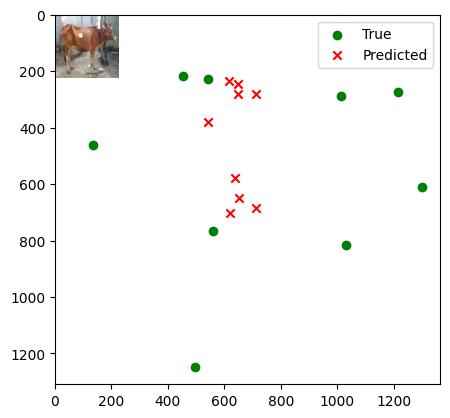

Image number: 112
True keypoints: [1209.  311.  246.  374. 1191.  664. 1026.  330. 1015.  761.  553.  267.
  557.  693.  473.  244.  481. 1081.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[778.2859  336.86212]
 [671.4707  456.5502 ]
 [760.2871  687.83386]
 [862.6107  339.22174]
 [863.77954 827.1142 ]
 [794.78375 305.43732]
 [797.9851  780.31934]
 [757.377   293.02036]
 [761.95605 853.5698 ]]


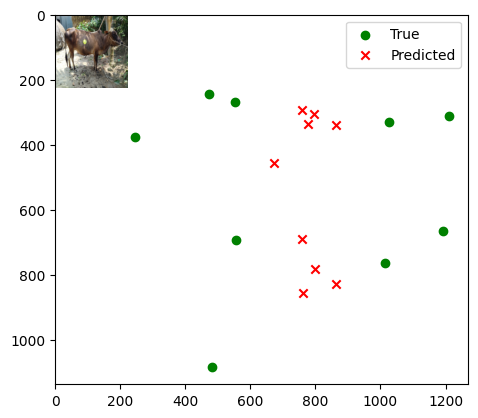

Image number: 113
True keypoints: [ 744.  334. 1791.  506.  755.  706.  974.  341.  996.  846. 1452.  321.
 1452.  794. 1554.  318. 1554. 1260.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[833.656   364.81097]
 [723.127   490.95316]
 [813.9666  737.21814]
 [926.91693 367.2524 ]
 [928.06506 887.64655]
 [854.96857 333.22998]
 [858.52826 837.2905 ]
 [815.4633  320.62405]
 [819.8917  917.0956 ]]


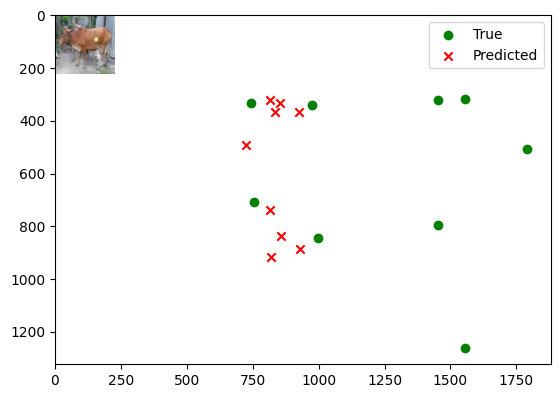

Image number: 114
True keypoints: [ 672.  363. 1648.  422.  686.  672.  879.  353.  894.  806. 1321.  284.
 1330.  753. 1405.  274. 1438. 1193.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[824.743   360.6223 ]
 [715.0809  485.55472]
 [805.28    729.28687]
 [916.7716  363.02402]
 [917.97705 878.05493]
 [845.56494 329.24176]
 [849.089   828.197  ]
 [806.4407  316.71762]
 [810.8493  907.0626 ]]


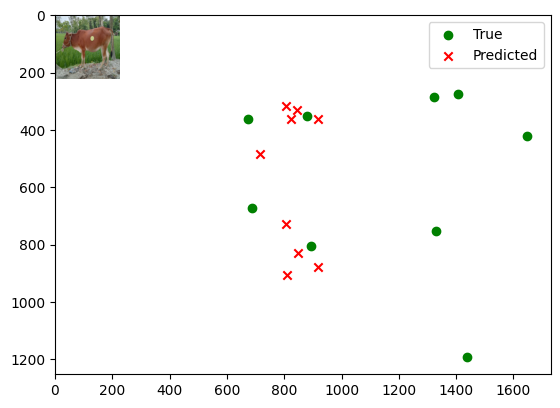

Image number: 115
True keypoints: [ 612.  401. 1492.  508.  568.  701.  821.  398.  828.  855. 1240.  368.
 1248.  769. 1297.  361. 1311. 1272.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[828.28174 361.62747]
 [717.82263 487.3866 ]
 [808.78625 732.35583]
 [920.37354 364.07123]
 [921.47675 881.5941 ]
 [848.76294 329.81607]
 [852.22986 831.616  ]
 [809.3865  317.15152]
 [813.9478  910.6722 ]]


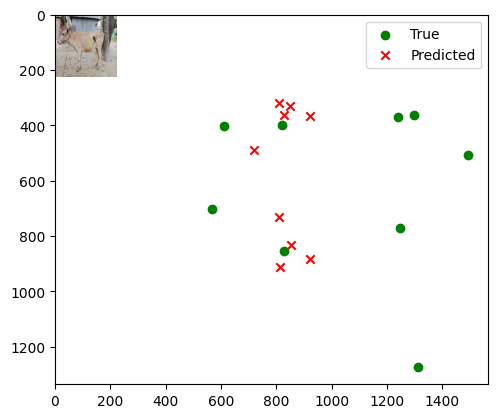

Image number: 116
True keypoints: [1189.  339.  329.  492. 1244.  634. 1022.  369. 1045.  801.  594.  362.
  605.  766.  509.  352.  516. 1262.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[804.9134  350.25864]
 [696.2014  473.0471 ]
 [786.0876  711.5785 ]
 [893.4612  352.647  ]
 [894.618   856.18176]
 [823.6411  318.71722]
 [827.00916 807.6831 ]
 [785.2016  306.1849 ]
 [789.7304  884.06525]]


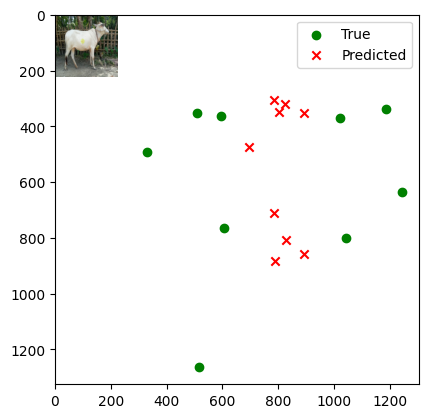

Image number: 117
True keypoints: [1233.  320.  150.  340. 1246.  636. 1016.  289. 1014.  786.  506.  209.
  520.  691.  407.  198.  456. 1277.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[709.68396 305.99805]
 [602.7763  416.0157 ]
 [694.297   628.72876]
 [782.44354 307.2073 ]
 [783.50684 751.7021 ]
 [717.82635 273.76398]
 [721.0314  710.7477 ]
 [682.38794 261.67847]
 [686.86774 773.92664]]


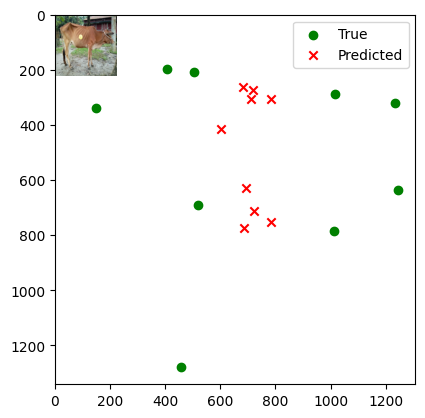

Image number: 118
True keypoints: [ 810.  408. 1720.  532.  764.  723.  978.  398.  994.  874. 1424.  383.
 1427.  812. 1505.  370. 1523. 1281.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[839.61975 367.0597 ]
 [728.0343  494.2482 ]
 [819.7896  742.42035]
 [933.2809  369.52908]
 [934.3768  893.8434 ]
 [860.7798  335.03284]
 [864.2853  843.16284]
 [820.90594 322.29327]
 [825.4887  923.4564 ]]


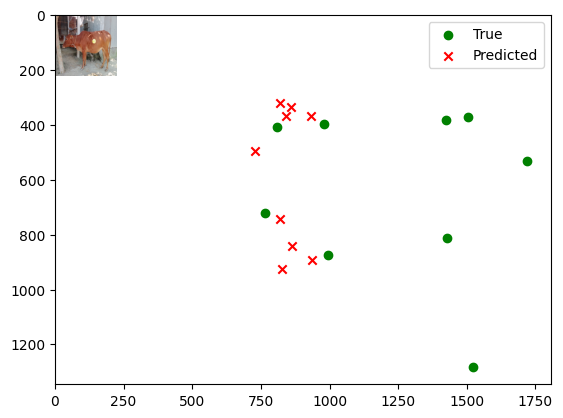

Image number: 119
True keypoints: [ 628.  326. 1536.  432.  598.  635.  805.  321.  821.  783. 1252.  289.
 1255.  689. 1328.  286. 1352. 1271.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[786.8277  341.18256]
 [679.37976 461.8249 ]
 [768.56433 695.4338 ]
 [872.5029  343.5541 ]
 [873.6973  836.44696]
 [804.04004 309.7223 ]
 [807.2962  789.0925 ]
 [766.2952  297.28412]
 [770.86566 863.33484]]


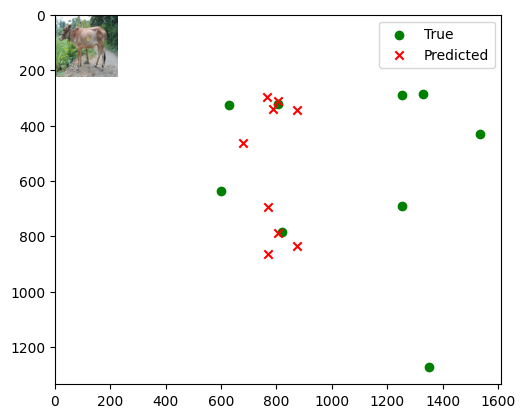

Image number: 120
True keypoints: [ 697.  320. 1749.  411.  656.  667.  877.  309.  884.  822. 1388.  266.
 1382.  762. 1527.  238. 1549. 1294.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[792.5433  343.561  ]
 [684.55206 465.17267]
 [774.14746 700.4662 ]
 [878.9103  345.99976]
 [880.01465 842.51666]
 [809.95483 311.89304]
 [813.22925 794.84845]
 [771.9674  299.3788 ]
 [776.5851  869.68024]]


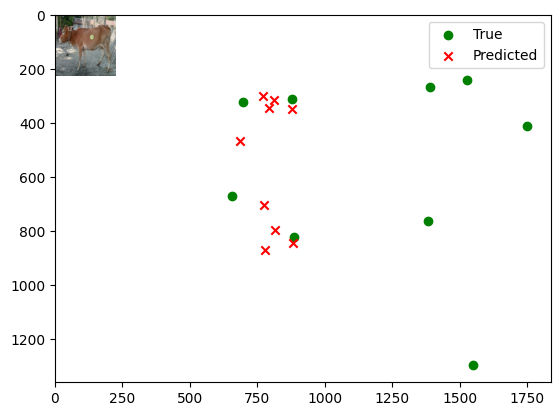

Image number: 121
True keypoints: [1207.  303.  228.  340. 1237.  623. 1024.  289. 1038.  774.  608.  252.
  621.  702.  465.  221.  513. 1291.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[731.3173  314.7813 ]
 [624.0825  428.30493]
 [715.1648  647.1661 ]
 [807.2407  316.45767]
 [808.2662  775.1476 ]
 [741.5576  282.45422]
 [744.6804  732.4003 ]
 [705.41486 270.1495 ]
 [710.07764 798.59174]]


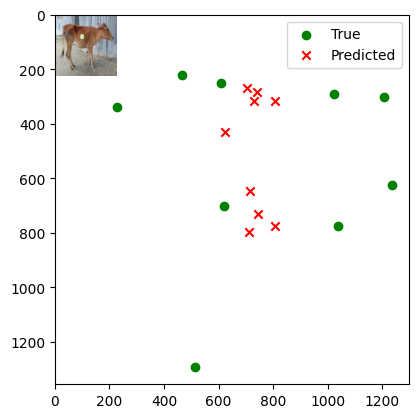

Image number: 122
True keypoints: [ 650.  314. 1759.  373.  653.  628.  887.  287.  913.  781. 1388.  209.
 1403.  692. 1493.  195. 1535. 1205.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[765.21045 330.81253]
 [659.6644  448.7127 ]
 [747.6081  676.2903 ]
 [847.78613 333.13165]
 [848.9496  813.0159 ]
 [780.94653 299.67322]
 [784.13153 767.0711 ]
 [744.12665 287.3819 ]
 [748.63306 838.88696]]


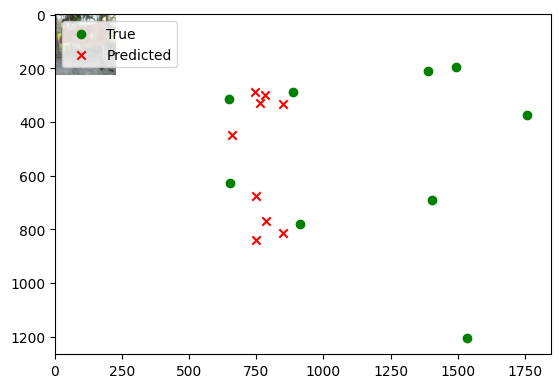

Image number: 123
True keypoints: [ 749.  331. 1702.  446.  750.  679.  982.  319. 1010.  808. 1391.  263.
 1395.  716. 1500.  256. 1506. 1267.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[767.3353  331.0858 ]
 [660.6385  449.61426]
 [749.7653  678.1089 ]
 [849.5764  333.40967]
 [850.69824 814.9326 ]
 [782.3741  299.4086 ]
 [785.4874  768.9806 ]
 [745.2744  286.97165]
 [749.9355  840.68286]]


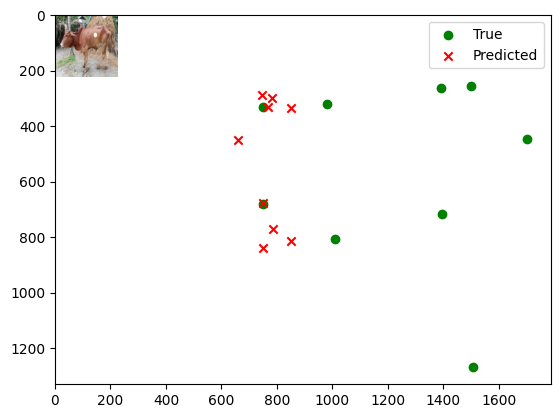

Image number: 124
True keypoints: [ 704.  334. 1726.  383.  729.  672.  945.  304.  971.  792. 1417.  262.
 1421.  718. 1499.  251. 1516. 1285.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[793.5669  343.78528]
 [685.05566 465.64038]
 [775.16235 701.3477 ]
 [879.79987 346.19373]
 [880.92676 843.48315]
 [810.7184  311.9159 ]
 [813.93304 795.7678 ]
 [772.59985 299.334  ]
 [777.2777  870.5824 ]]


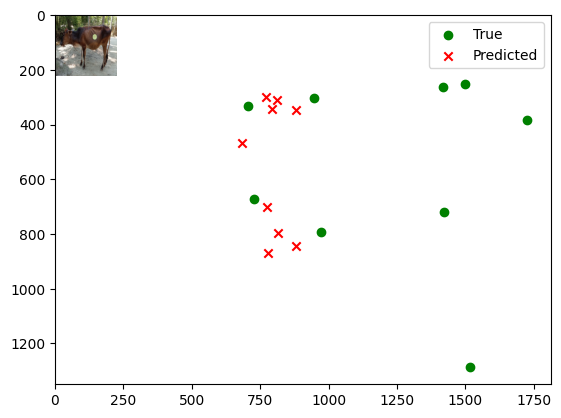

Image number: 125
True keypoints: [1179.  349.  218.  411. 1187.  682.  981.  373.  974.  831.  532.  305.
  518.  747.  388.  291.  412. 1152.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[800.69226 348.09787]
 [691.1484  470.4679 ]
 [782.17114 708.07227]
 [888.11646 350.3349 ]
 [889.1727  851.2719 ]
 [818.19226 316.07898]
 [821.54456 803.3365 ]
 [779.73114 303.4916 ]
 [784.33466 878.7318 ]]


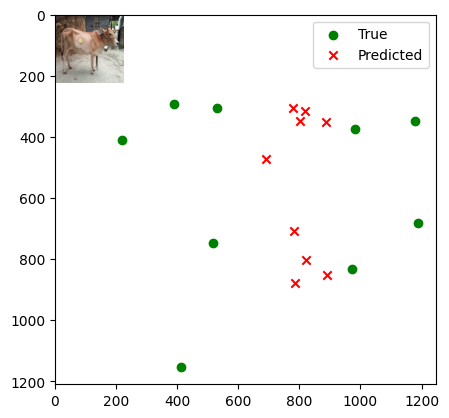

Image number: 126
True keypoints: [1223.  353.  324.  434. 1222.  627. 1007.  333. 1012.  782.  612.  279.
  628.  729.  517.  271.  554. 1185.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[802.47327 348.5398 ]
 [693.0753  471.27524]
 [783.83234 709.4095 ]
 [890.0857  350.88226]
 [891.22375 853.189  ]
 [820.23267 316.5796 ]
 [823.53253 804.9811 ]
 [781.7362  303.96124]
 [786.38403 880.7229 ]]


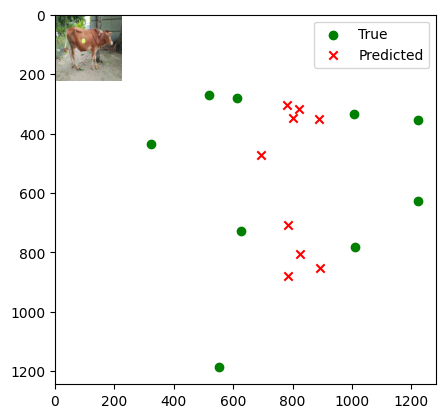

Image number: 127
True keypoints: [ 638.  313. 1705.  382.  633.  675.  837.  327.  862.  832. 1360.  303.
 1368.  774. 1501.  300. 1532. 1250.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[738.5268  318.21777]
 [633.81036 432.61713]
 [721.81714 652.9085 ]
 [816.74023 320.26172]
 [817.92084 783.78754]
 [751.5335  286.9979 ]
 [754.6156  739.8532 ]
 [715.56287 274.85303]
 [720.03503 808.1308 ]]


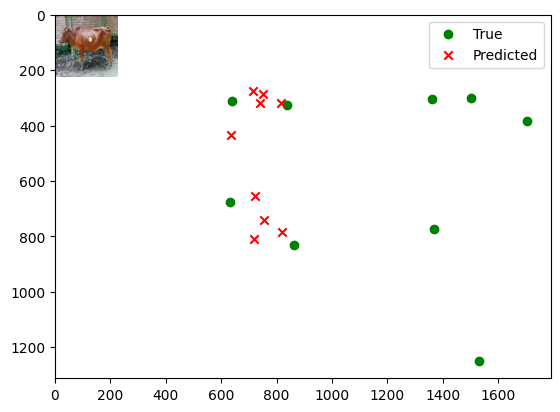

Image number: 128
True keypoints: [1237.  231.  113.  287. 1203.  609.  898.  195.  900.  745.  431.  158.
  458.  707.  337.  150.  398. 1314.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[614.11304 263.5135 ]
 [509.26532 359.822  ]
 [602.0241  545.9737 ]
 [671.8452  263.31628]
 [672.9639  647.274  ]
 [612.47345 231.14009]
 [615.644   614.0561 ]
 [580.11633 219.75674]
 [584.23596 664.05524]]


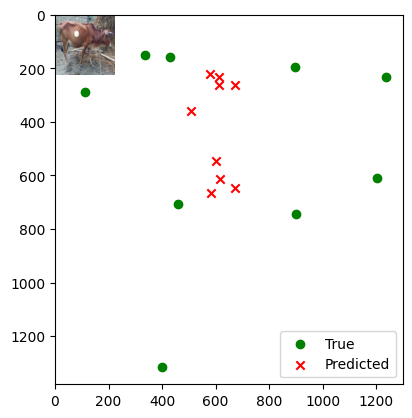

Image number: 129
True keypoints: [ 673.  424. 1533.  554.  656.  726.  841.  435.  856.  858. 1256.  402.
 1255.  819. 1328.  390. 1340. 1285.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[837.0301  365.88718]
 [725.86676 492.73505]
 [817.2782  740.1449 ]
 [930.4309  368.36548]
 [931.51025 891.0907 ]
 [858.13116 333.9494 ]
 [861.6563  840.5924 ]
 [818.4123  321.26028]
 [822.98804 920.6372 ]]


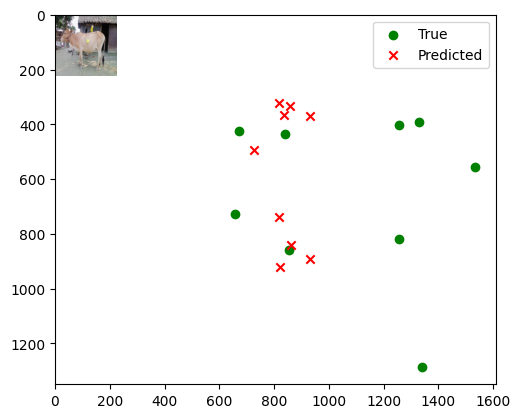

Image number: 130
True keypoints: [ 677.  232. 1764.  421.  616.  599.  862.  262.  879.  775. 1373.  255.
 1377.  756. 1485.  230. 1491. 1273.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[745.5974  320.9451 ]
 [641.51227 436.56198]
 [728.6092  658.8052 ]
 [825.0922  323.2365 ]
 [826.171   791.5636 ]
 [759.6674  289.85925]
 [762.75543 746.93976]
 [723.6109  277.61514]
 [728.1831  816.4252 ]]


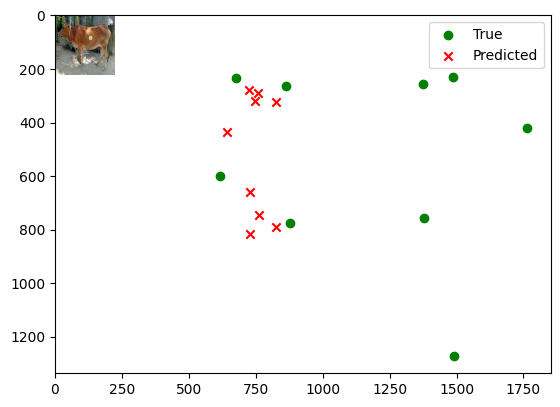

Image number: 131
True keypoints: [ 744.  180. 1649.  350.  625.  554.  893.  220.  914.  719. 1340.  185.
 1352.  661. 1437.  181. 1459. 1154.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[745.4082  321.48532]
 [641.7489  436.75684]
 [728.3269  658.69617]
 [825.2893  323.75958]
 [826.458   791.6248 ]
 [760.00574 290.73074]
 [763.1395  746.9276 ]
 [724.0325  278.61545]
 [728.48267 816.59045]]


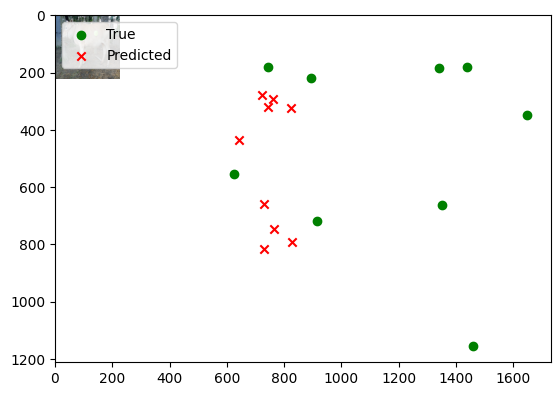

Image number: 132
True keypoints: [1143.  284.   89.  388. 1180.  595.  928.  278.  924.  773.  448.  242.
  460.  736.  349.  233.  375. 1207.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[780.2095  337.80817]
 [673.6953  457.745  ]
 [762.16174 689.5142 ]
 [865.0182  340.22937]
 [866.1253  829.28467]
 [797.0931  306.5027 ]
 [800.3331  782.34375]
 [759.7053  294.08707]
 [764.27216 855.92377]]


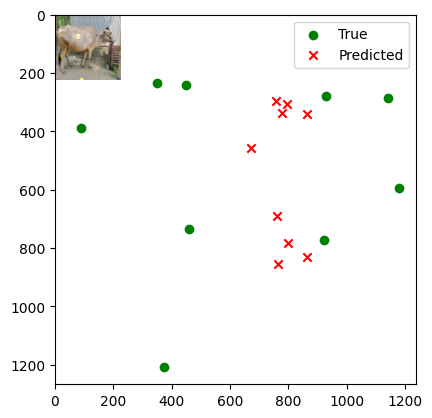

Image number: 133
True keypoints: [ 658.  266. 1635.  410.  675.  577.  889.  276.  901.  724. 1322.  265.
 1319.  701. 1400.  252. 1379. 1106.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[787.419   341.01743]
 [679.7751  462.00452]
 [769.1686  695.8976 ]
 [872.9779  343.45258]
 [874.108   836.92755]
 [804.4232  309.39844]
 [807.6762  789.59344]
 [766.6338  296.90036]
 [771.2556  863.834  ]]


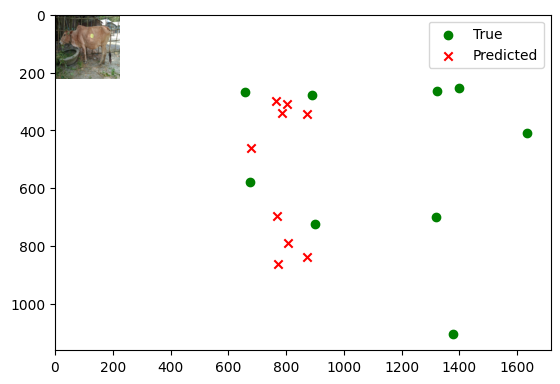

Image number: 134
True keypoints: [ 574.  422. 1500.  499.  553.  680.  779.  408.  796.  852. 1210.  365.
 1214.  792. 1276.  353. 1292. 1268.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[819.1203  357.29803]
 [709.4089  481.8275 ]
 [799.8712  724.2346 ]
 [909.8884  359.7171 ]
 [910.99554 871.6864 ]
 [838.9841  325.62827]
 [842.4024  822.2778 ]
 [799.9835  313.03677]
 [804.5196  900.31824]]


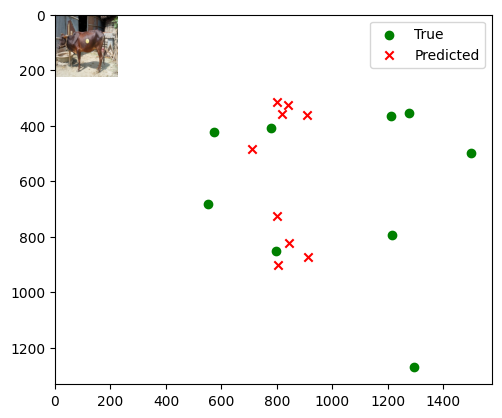

Image number: 135
True keypoints: [1123.  315.  134.  412. 1085.  645.  863.  311.  862.  794.  430.  276.
  436.  719.  375.  264.  385. 1198.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[772.5265  334.84195]
 [664.9885  453.46307]
 [754.8569  683.2152 ]
 [855.8158  336.94238]
 [856.922   820.72156]
 [787.92017 303.14484]
 [791.1659  774.66064]
 [750.5442  290.74896]
 [755.1018  846.75433]]


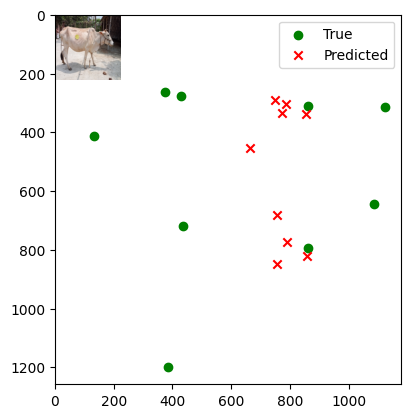

Image number: 136
True keypoints: [ 711.  350. 1688.  442.  630.  618.  904.  348.  886.  803. 1358.  308.
 1358.  720. 1473.  281. 1485. 1241.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[797.7146  345.8104 ]
 [688.98224 468.17953]
 [779.1758  705.0254 ]
 [884.61066 348.24692]
 [885.68896 847.99805]
 [815.22205 313.90292]
 [818.463   800.0185 ]
 [776.9457  301.3013 ]
 [781.64764 875.3342 ]]


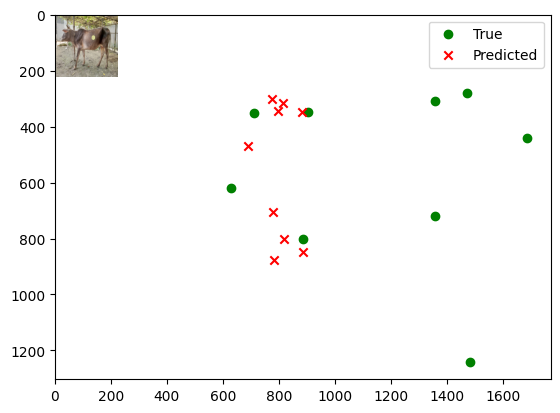

Image number: 137
True keypoints: [ 700.  309. 1721.  461.  632.  668.  898.  335.  906.  837. 1375.  298.
 1373.  745. 1446.  281. 1428. 1257.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[810.35626 352.0528 ]
 [701.13654 475.97925]
 [791.4338  716.248  ]
 [899.41626 354.58032]
 [900.4271  861.8458 ]
 [829.1304  320.20154]
 [832.486   813.0366 ]
 [790.4477  307.5669 ]
 [795.10913 889.92896]]


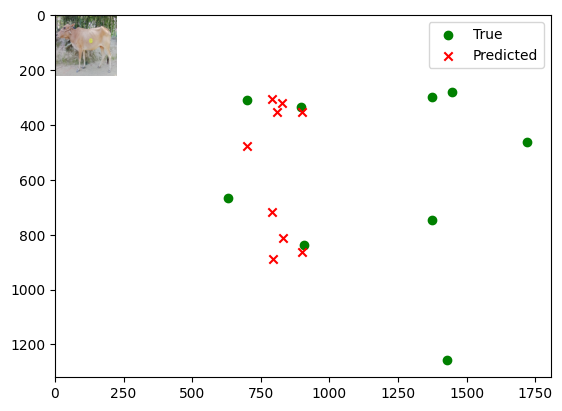

Image number: 138
True keypoints: [ 736.  391. 1664.  472.  742.  712.  926.  381.  952.  855. 1377.  325.
 1404.  772. 1437.  314. 1495. 1282.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[831.5179  363.6686 ]
 [721.3045  489.60773]
 [811.89185 735.2878 ]
 [924.5018  366.10895]
 [925.578   885.3217 ]
 [852.7212  332.09756]
 [856.26685 835.1063 ]
 [813.3     319.4823 ]
 [817.767   914.70374]]


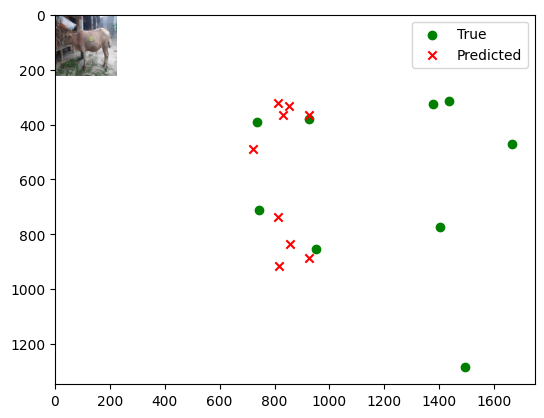

Image number: 139
True keypoints: [ 750.  377. 1653.  547.  714.  708.  922.  403.  930.  869. 1385.  374.
 1389.  814. 1437.  368. 1438. 1320.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[870.33685 381.88623]
 [756.0875  513.00055]
 [849.6415  769.743  ]
 [968.47644 384.40936]
 [969.5359  927.11786]
 [893.56885 349.38834]
 [897.2051  874.5858 ]
 [852.4137  336.45352]
 [857.041   958.24603]]


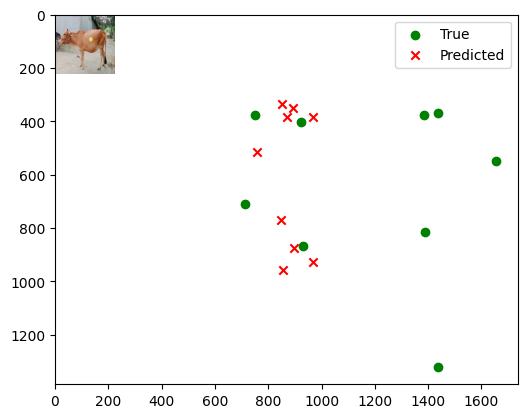

Image number: 140
True keypoints: [1149.  357.  144.  458. 1104.  725.  970.  366.  950.  854.  476.  303.
  485.  772.  391.  287.  425. 1270.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[811.69415 353.86972]
 [701.926   477.3767 ]
 [792.7558  717.81366]
 [901.1714  356.15338]
 [902.2931  863.4956 ]
 [830.6275  322.08124]
 [834.0401  814.7365 ]
 [791.83057 309.52737]
 [796.33203 891.66125]]


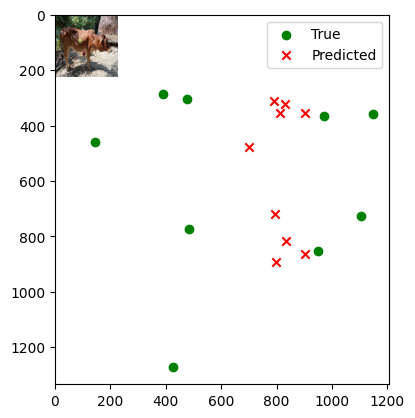

Image number: 141
True keypoints: [ 648.  236. 1609.  399.  625.  575.  829.  257.  841.  732. 1272.  238.
 1282.  662. 1385.  226. 1396. 1126.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[758.01337 327.32166]
 [653.1931  444.33307]
 [740.58624 669.8496 ]
 [839.59814 329.64508]
 [840.79205 805.24274]
 [773.36017 296.34265]
 [776.5297  759.70905]
 [736.8591  284.10358]
 [741.34845 830.78   ]]


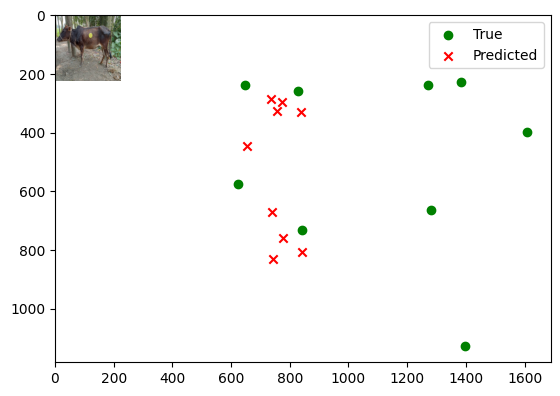

Image number: 142
True keypoints: [ 740.  404. 1581.  551.  718.  697.  877.  418.  899.  849. 1321.  435.
 1332.  797. 1395.  424. 1418. 1233.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[835.54944 364.36508]
 [723.91315 491.3974 ]
 [815.89154 738.69324]
 [928.20593 366.89673]
 [929.2382  889.16425]
 [855.93066 332.1136 ]
 [859.38055 838.7865 ]
 [816.18207 319.31268]
 [820.87256 918.4714 ]]


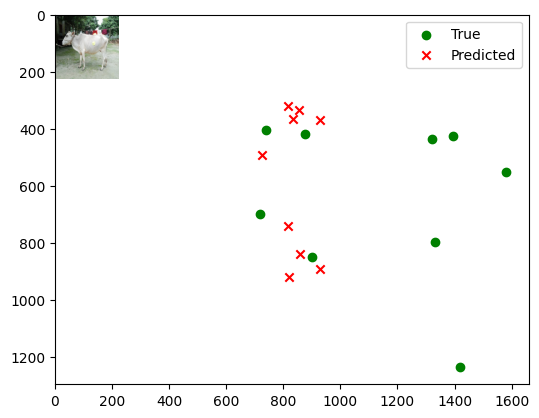

Image number: 143
True keypoints: [1243.  352.  146.  426. 1236.  683. 1001.  331.  989.  838.  507.  310.
  507.  790.  359.  292.  364. 1302.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[774.39075 336.0764 ]
 [661.21704 454.90662]
 [757.2248  686.0415 ]
 [855.9077  337.50266]
 [856.86664 821.4505 ]
 [786.19025 302.434  ]
 [789.55475 776.4728 ]
 [747.8802  289.74625]
 [752.6149  846.60657]]


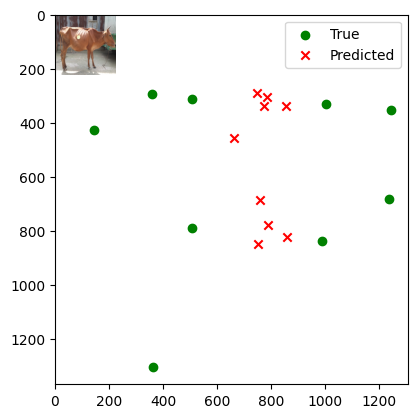

Image number: 144
True keypoints: [ 741.  449. 1466.  449.  712.  652.  892.  423.  901.  785. 1247.  384.
 1242.  742. 1313.  379. 1301. 1163.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[810.9656  353.3228 ]
 [701.88074 476.82364]
 [791.95386 716.96454]
 [900.49756 355.7236 ]
 [901.65845 862.81506]
 [830.2385  321.76813]
 [833.61414 813.90704]
 [791.5691  309.22055]
 [796.09875 891.0303 ]]


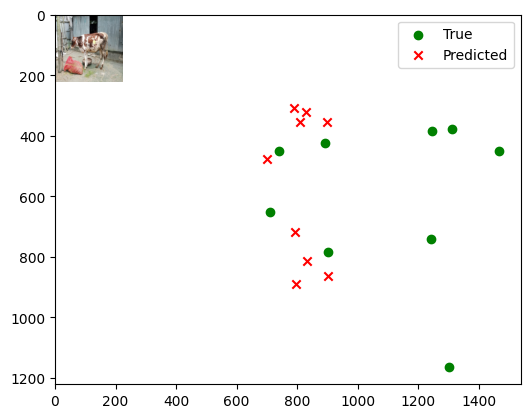

Image number: 145
True keypoints: [ 698.  349. 1732.  392.  683.  606.  911.  339.  929.  797. 1404.  295.
 1412.  787. 1546.  279. 1548. 1179.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[827.91187 361.2744 ]
 [717.19037 487.03494]
 [808.45123 732.01166]
 [919.744   363.7072 ]
 [920.86127 881.0697 ]
 [848.1116  329.336  ]
 [851.5684  831.1498 ]
 [808.7213  316.6515 ]
 [813.30835 910.05444]]


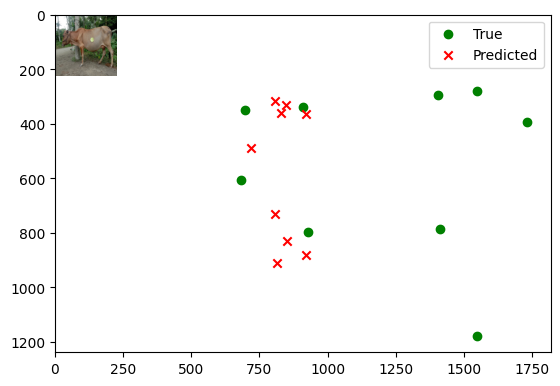

Image number: 146
True keypoints: [ 643.  399. 1404.  511.  632.  660.  786.  412.  807.  809. 1165.  412.
 1171.  796. 1242.  399. 1246. 1090.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[824.64343 360.1528 ]
 [714.72375 485.29706]
 [805.219   729.1487 ]
 [916.3864  362.5804 ]
 [917.5223  877.7881 ]
 [845.12036 328.56427]
 [848.58936 827.9702 ]
 [805.9501  315.9641 ]
 [810.44965 906.74286]]


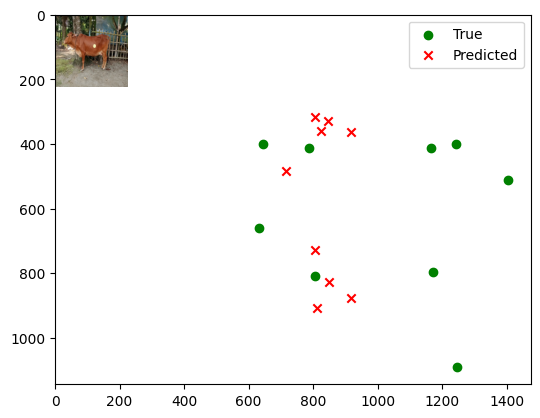

Image number: 147
True keypoints: [ 726.  306. 1615.  447.  716.  593.  927.  311.  949.  755. 1324.  320.
 1341.  704. 1415.  309. 1435. 1182.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[807.3276  351.8512 ]
 [698.54913 474.7347 ]
 [788.38025 713.7759 ]
 [896.4431  354.21103]
 [897.67896 858.9492 ]
 [826.4936  320.44553]
 [829.8904  810.2661 ]
 [787.9513  307.9823 ]
 [792.4239  887.00354]]


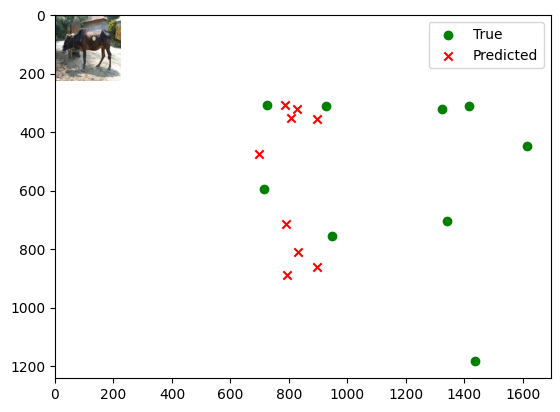

Image number: 148
True keypoints: [ 678.  344. 1618.  457.  620.  681.  881.  352.  900.  818. 1341.  312.
 1340.  740. 1421.  311. 1429. 1252.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[822.5469  359.00018]
 [712.37036 483.9331 ]
 [803.2031  727.2897 ]
 [913.78503 361.4033 ]
 [914.98804 875.3884 ]
 [842.6262  327.2945 ]
 [846.0839  825.75916]
 [803.46045 314.69   ]
 [807.9546  904.1601 ]]


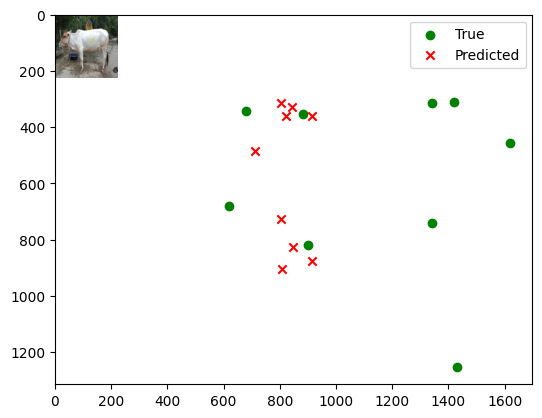

Image number: 149
True keypoints: [ 736.  386. 1773.  460.  746.  718.  940.  395.  964.  850. 1393.  324.
 1407.  773. 1496.  304. 1526. 1272.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[841.7616  368.90744]
 [730.6602  495.98883]
 [821.8122  744.4429 ]
 [936.3259  371.34988]
 [937.5029  896.5309 ]
 [863.7964  337.32294]
 [867.4099  845.6161 ]
 [823.9786  324.6921 ]
 [828.3866  926.41486]]


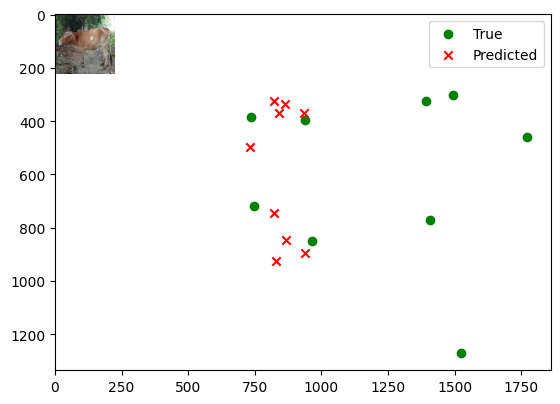

Image number: 150
True keypoints: [ 716.  255. 1649.  342.  701.  545.  926.  269.  939.  697. 1343.  232.
 1352.  669. 1441.  218. 1468. 1093.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[768.5432  332.80014]
 [663.10754 450.95065]
 [750.7781  679.27344]
 [851.91187 335.1336 ]
 [853.1082  816.824  ]
 [784.92316 301.86133]
 [788.146   770.60913]
 [748.02985 289.61087]
 [752.46747 842.9491 ]]


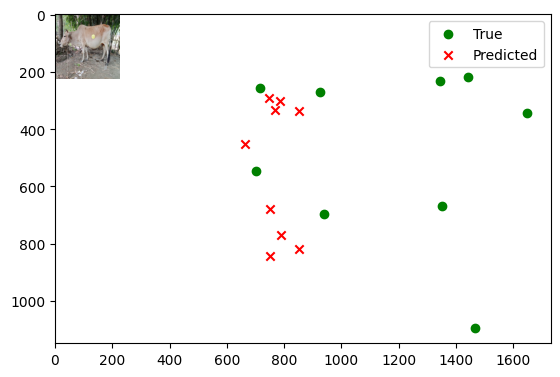

Image number: 151
True keypoints: [ 707.  232. 1814.  379.  674.  621.  904.  227.  930.  820. 1446.  200.
 1460.  768. 1557.  187. 1600. 1338.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[727.8329  312.19183]
 [625.0381  425.63876]
 [711.3863  643.02374]
 [804.5944  314.47083]
 [805.60803 772.1692 ]
 [740.422   281.20358]
 [743.43915 728.7658 ]
 [705.09106 269.05075]
 [709.6891  796.1511 ]]


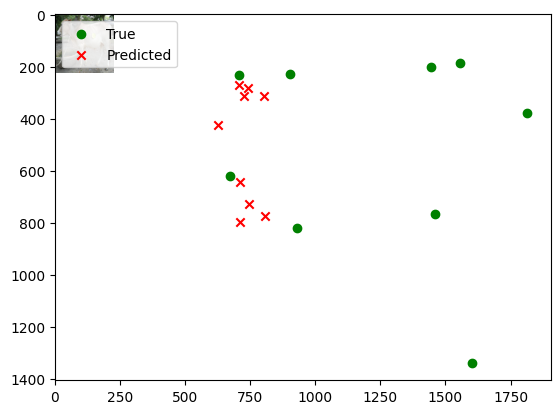

Image number: 152
True keypoints: [1204.  233.  337.  397. 1210.  556. 1031.  243. 1010.  701.  595.  244.
  611.  655.  538.  240.  557. 1099.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[754.0476  325.17548]
 [648.65936 441.77686]
 [736.8607  666.4824 ]
 [834.58453 327.39883]
 [835.5878  800.58496]
 [768.2954  293.74603]
 [771.4323  755.59235]
 [731.809   281.45612]
 [736.4348  825.7921 ]]


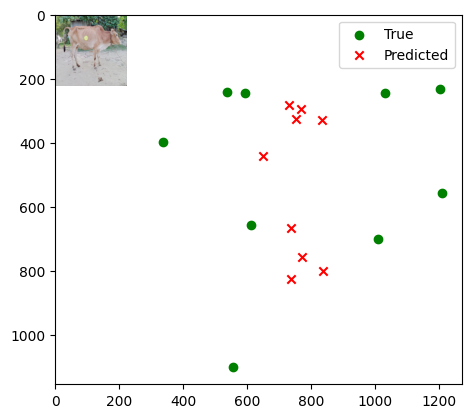

Image number: 153
True keypoints: [ 683.  312. 1631.  463.  617.  647.  833.  331.  843.  809. 1342.  286.
 1348.  755. 1405.  287. 1432. 1270.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[793.52765 344.14923]
 [685.37994 465.79428]
 [775.08325 701.3461 ]
 [880.01996 346.54254]
 [881.1741  843.6156 ]
 [811.0287  312.49075]
 [814.27026 795.8415 ]
 [772.9676  299.9567 ]
 [777.588   870.7839 ]]


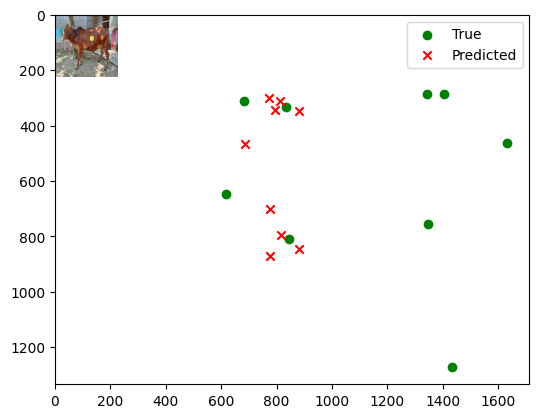

Image number: 154
True keypoints: [ 761.  334. 1696.  362.  730.  657.  936.  313.  971.  788. 1366.  279.
 1390.  704. 1482.  264. 1516. 1333.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[799.53094 346.5572 ]
 [690.75977 469.21072]
 [780.94543 706.5937 ]
 [886.70337 349.04797]
 [887.7705  849.941  ]
 [817.1926  314.6551 ]
 [820.4458  801.8506 ]
 [778.8881  302.04065]
 [783.5874  877.38416]]


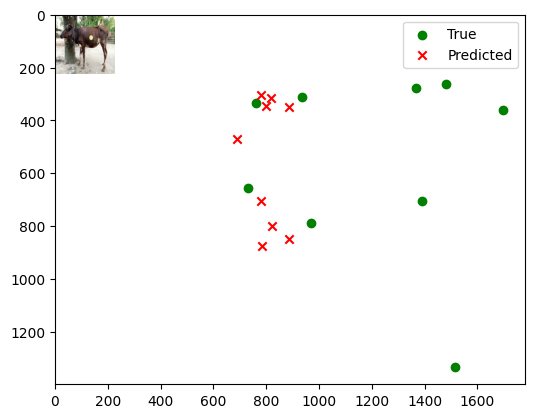

Image number: 155
True keypoints: [ 801.  324. 1763.  341.  777.  612. 1004.  322. 1008.  769. 1434.  245.
 1437.  710. 1563.  221. 1558. 1270.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[771.18854 332.34418]
 [664.51666 451.6987 ]
 [753.48267 681.3553 ]
 [853.924   334.79315]
 [854.923   819.0177 ]
 [786.5     300.5578 ]
 [789.60114 772.7638 ]
 [749.292   288.0521 ]
 [754.05664 844.97906]]


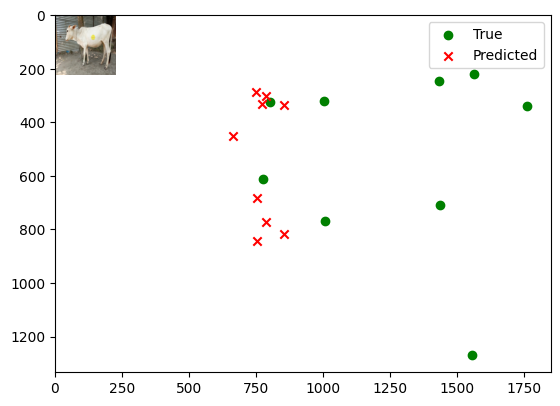

Image number: 156
True keypoints: [ 688.  261. 1655.  424.  691.  631.  904.  266.  930.  766. 1356.  263.
 1365.  706. 1445.  257. 1458. 1207.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[774.0862  334.96774]
 [667.8635  454.06912]
 [756.20636 684.1218 ]
 [857.9767  337.345  ]
 [859.1     822.63086]
 [790.4821  303.69937]
 [793.69867 776.117  ]
 [753.28705 291.34924]
 [757.8291  848.9613 ]]


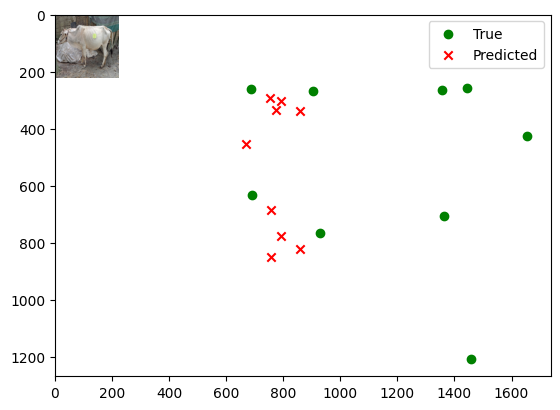

Image number: 157
True keypoints: [ 716.  311. 1758.  396.  734.  604.  926.  310.  945.  790. 1404.  266.
 1417.  737. 1476.  253. 1501. 1176.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[784.1501  339.6604 ]
 [676.97235 460.11115]
 [765.9918  693.0353 ]
 [869.38635 342.05295]
 [870.49506 833.4728 ]
 [801.09314 308.17163]
 [804.3425  786.3119 ]
 [763.4704  295.73196]
 [768.061   860.23755]]


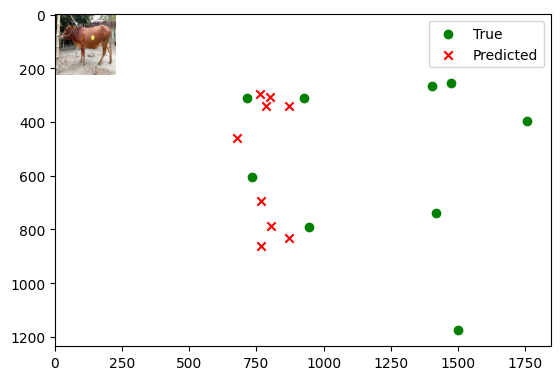

Image number: 158
True keypoints: [ 622.  298. 1599.  450.  569.  661.  794.  327.  793.  826. 1279.  323.
 1291.  732. 1393.  306. 1409. 1238.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[814.76514 354.48624]
 [705.0501  478.8188 ]
 [795.7189  720.24365]
 [904.5163  356.9442 ]
 [905.6107  866.7018 ]
 [833.8771  322.61014]
 [837.25446 817.6043 ]
 [794.9929  309.9579 ]
 [799.6091  894.9817 ]]


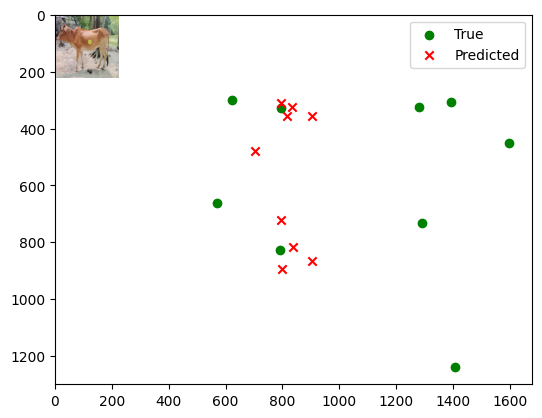

Image number: 159
True keypoints: [1191.  275.  264.  323. 1220.  576. 1012.  268.  988.  728.  591.  208.
  582.  653.  482.  182.  503. 1139.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[737.27344 318.2157 ]
 [634.17773 432.10754]
 [720.45105 651.6773 ]
 [816.12256 320.3549 ]
 [817.3213  782.91473]
 [751.36426 287.63412]
 [754.5088  738.82056]
 [715.74036 275.62738]
 [720.1053  807.52545]]


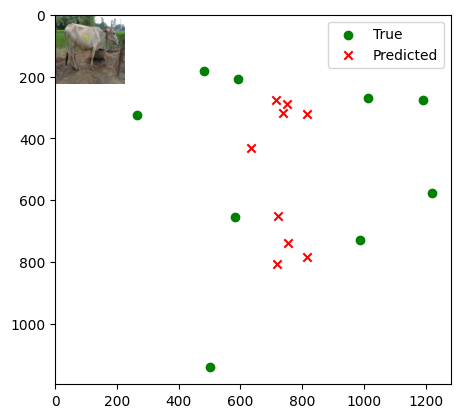

Image number: 160
True keypoints: [1180.  311.  112.  468. 1184.  633.  926.  320.  938.  811.  453.  298.
  474.  788.  351.  287.  394. 1296.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[782.8779  339.50745]
 [675.94574 459.5802 ]
 [764.71136 691.97565]
 [868.15393 341.87308]
 [869.3635  832.25793]
 [800.0198  308.22876]
 [803.29016 785.1637 ]
 [762.4791  295.87073]
 [766.972   859.034  ]]


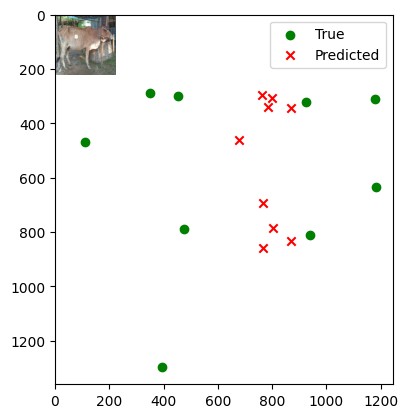

Image number: 161
True keypoints: [ 770.  223. 1771.  348.  702.  596.  955.  236.  975.  770. 1471.  208.
 1476.  661. 1541.  191. 1572. 1225.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[754.84894 324.6308 ]
 [649.6101  441.7993 ]
 [737.6359  666.89124]
 [835.27216 327.0273 ]
 [836.25977 801.3176 ]
 [769.0591  293.0996 ]
 [772.11926 756.16815]
 [732.56274 280.71674]
 [737.28033 826.516  ]]


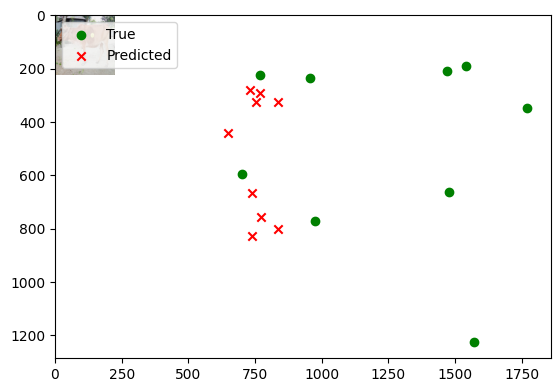

Image number: 162
True keypoints: [ 581.  307. 1672.  396.  568.  655.  822.  263.  842.  820. 1346.  229.
 1349.  731. 1461.  228. 1461. 1288.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[781.2455  338.90402]
 [675.092   458.698  ]
 [763.1251  690.5274 ]
 [866.6289  341.3    ]
 [867.7687  830.6642 ]
 [798.70074 307.90192]
 [802.0062  783.59845]
 [761.3572  295.5805 ]
 [765.80664 857.47046]]


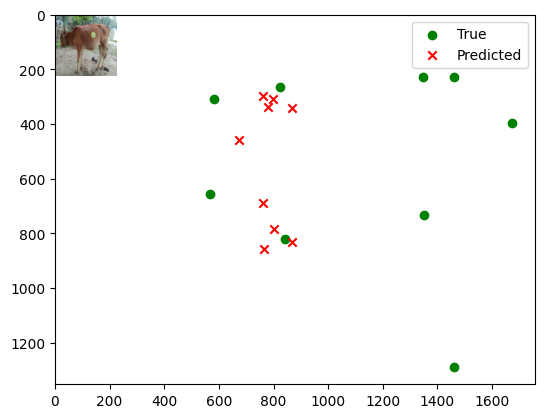

Image number: 163
True keypoints: [ 822.  321. 1746.  455.  768.  614.  996.  321. 1003.  787. 1415.  273.
 1428.  764. 1520.  271. 1554. 1277.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[782.4413  339.53152]
 [675.7928  459.41638]
 [764.2719  691.6162 ]
 [867.8353  341.8536 ]
 [868.9983  831.88654]
 [799.75995 308.35446]
 [803.0333  784.77515]
 [762.2526  295.99155]
 [766.73456 858.6869 ]]


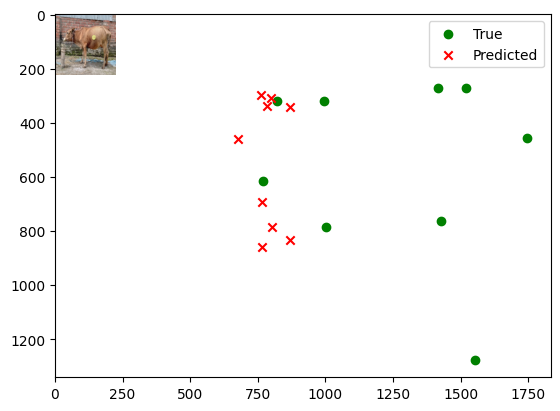

Image number: 164
True keypoints: [ 712.  346. 1760.  434.  750.  679.  944.  341.  990.  821. 1410.  273.
 1442.  754. 1512.  249. 1555. 1221.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[804.5882  349.82034]
 [695.749   472.72058]
 [785.8033  711.2371 ]
 [892.93286 352.24515]
 [894.0917  855.7405 ]
 [823.12134 318.18103]
 [826.4554  807.2656 ]
 [784.65784 305.64462]
 [789.2227  883.5381 ]]


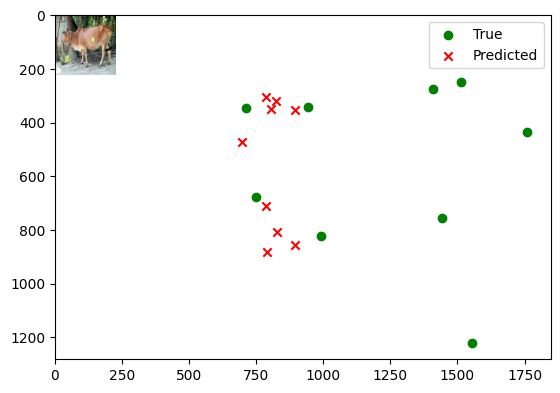

Image number: 165
True keypoints: [ 730.  303. 1724.  466.  753.  646.  955.  303.  974.  757. 1404.  299.
 1410.  716. 1521.  276. 1540. 1231.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[803.38824 348.95425]
 [694.3078  471.83127]
 [784.66327 710.1405 ]
 [891.3135  351.34818]
 [892.4624  854.3    ]
 [821.52136 317.12164]
 [824.821   805.9251 ]
 [783.04065 304.53903]
 [787.6824  881.9479 ]]


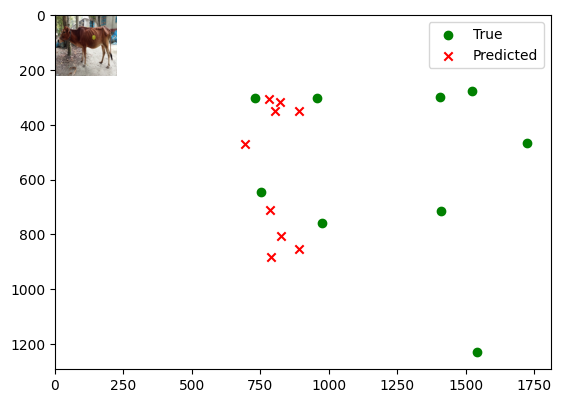

Image number: 166
True keypoints: [ 712.  335. 1680.  409.  744.  663.  934.  312.  962.  760. 1336.  260.
 1357.  672. 1477.  246. 1495. 1250.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[791.6603  342.91693]
 [683.54333 464.5143 ]
 [773.3076  699.65466]
 [877.7311  345.3508 ]
 [878.8558  841.47046]
 [808.839   311.17184]
 [812.0761  793.8549 ]
 [770.8497  298.6191 ]
 [775.4991  868.5289 ]]


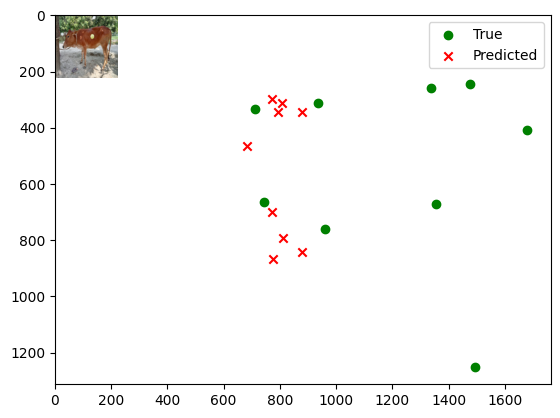

Image number: 167
True keypoints: [1228.  275.  294.  356. 1282.  595. 1043.  293. 1054.  753.  585.  236.
  600.  695.  477.  222.  503. 1209.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[752.6191  324.50784]
 [646.95184 440.9175 ]
 [735.51215 665.2803 ]
 [832.79083 326.6851 ]
 [833.8189  798.9679 ]
 [766.5095  292.95493]
 [769.6341  754.1196 ]
 [729.9976  280.649  ]
 [734.6352  824.01953]]


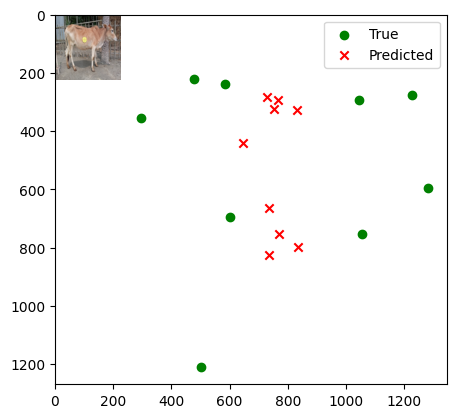

Image number: 168
True keypoints: [1261.  291.  388.  380. 1294.  614. 1066.  304. 1067.  739.  637.  280.
  639.  653.  570.  275.  589. 1095.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[722.57465 312.28217]
 [613.71545 423.93384]
 [706.87897 640.2927 ]
 [796.9241  313.4178 ]
 [798.11224 765.55457]
 [731.14453 279.67072]
 [734.3994  723.85065]
 [694.9968  267.43506]
 [699.46796 788.19165]]


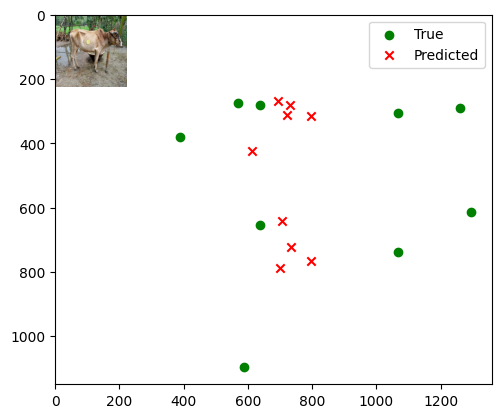

Image number: 169
True keypoints: [1274.  156.  157.  279. 1285.  463. 1047.  149. 1049.  635.  542.  114.
  550.  584.  426.   86.  425. 1104.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[674.6032  287.86453]
 [572.5714  393.96283]
 [660.06024 596.8354 ]
 [742.5924  289.3857 ]
 [743.6405  713.84705]
 [681.3154  256.51047]
 [684.25256 674.6371 ]
 [647.6033  244.67816]
 [652.1151  734.6465 ]]


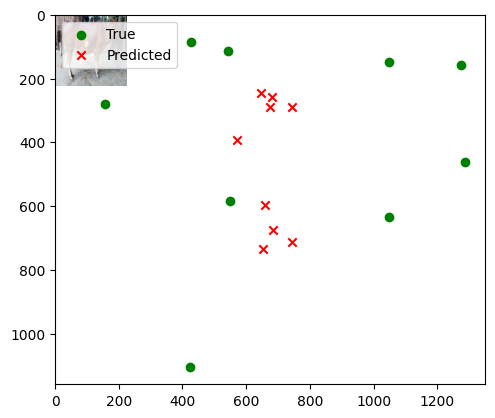

Image number: 170
True keypoints: [1166.  278.  155.  360. 1249.  576.  959.  304.  963.  766.  499.  220.
  515.  698.  411.  213.  457. 1255.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[748.60046 323.63428]
 [643.8583  439.0498 ]
 [731.52576 661.89215]
 [828.8264  325.7339 ]
 [829.99713 795.0403 ]
 [762.9936  292.66016]
 [766.1866  750.33734]
 [726.7641  280.5153 ]
 [731.1899  820.0643 ]]


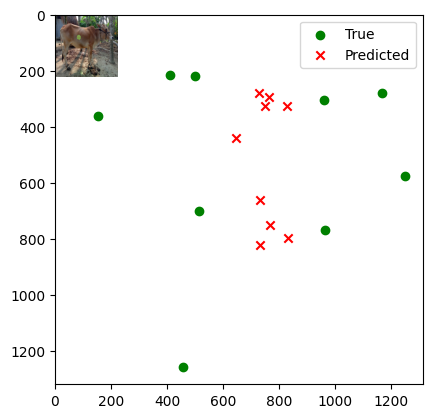

Image number: 171
True keypoints: [1286.  203.  147.  225. 1293.  548. 1033.  203. 1025.  746.  526.  111.
  533.  658.  374.  103.  381. 1263.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[669.4607  286.34818]
 [566.7819  391.3713 ]
 [655.21216 592.82184]
 [736.61536 287.56787]
 [737.5618  708.1712 ]
 [675.2383  254.8049 ]
 [678.2699  669.66583]
 [641.621   243.02927]
 [646.078   728.6085 ]]


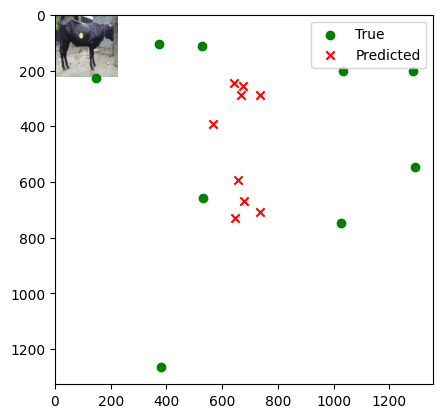

Image number: 172
True keypoints: [ 818.  324. 1769.  418.  819.  728. 1019.  337. 1034.  786. 1431.  299.
 1435.  729. 1485.  278. 1499. 1233.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[791.33325 342.86664]
 [683.1636  464.3485 ]
 [772.98065 699.38794]
 [877.3703  345.2833 ]
 [878.49835 841.12976]
 [808.4955  311.12436]
 [811.7228  793.5467 ]
 [770.5045  298.59177]
 [775.1481  868.1649 ]]


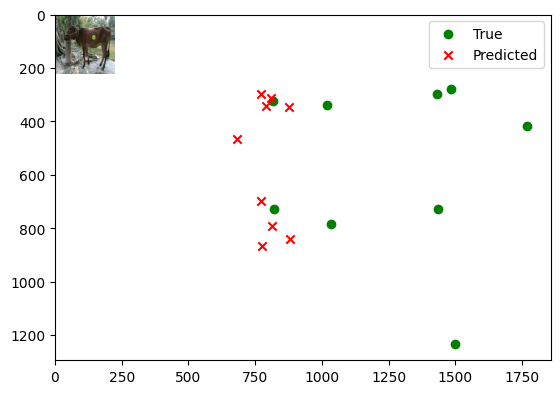

Image number: 173
True keypoints: [ 745.  287. 1623.  370.  738.  610.  902.  295.  930.  730. 1313.  248.
 1340.  673. 1400.  232. 1424. 1120.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[812.1052  351.97565]
 [701.6548  476.55237]
 [793.205   717.7033 ]
 [900.6354  354.50552]
 [901.6126  863.25964]
 [830.0302  319.5003 ]
 [833.2838  814.5234 ]
 [791.0528  306.7306 ]
 [795.9055  891.1924 ]]


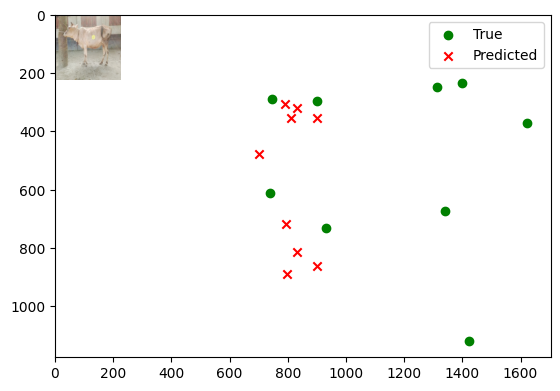

Image number: 174
True keypoints: [ 710.  262. 1704.  453.  669.  670.  935.  291.  942.  799. 1390.  267.
 1378.  737. 1481.  259. 1476. 1215.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[771.9065  333.8117 ]
 [665.8624  452.6798 ]
 [754.10315 682.1531 ]
 [855.4221  336.18704]
 [856.5538  820.2381 ]
 [788.09564 302.54346]
 [791.28625 773.8475 ]
 [750.9995  290.18066]
 [755.5571  846.4237 ]]


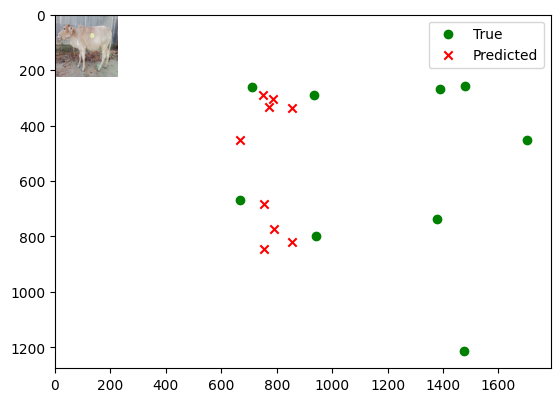

Image number: 175
True keypoints: [ 716.  278. 1771.  384.  732.  595.  943.  299.  956.  762. 1413.  278.
 1419.  772. 1534.  251. 1547. 1224.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[766.92773 331.4466 ]
 [660.8723  449.65347]
 [749.2723  677.771  ]
 [849.5585  333.77975]
 [850.763   814.7689 ]
 [782.558   300.14633]
 [785.723   768.7456 ]
 [745.60736 287.83752]
 [750.12976 840.6626 ]]


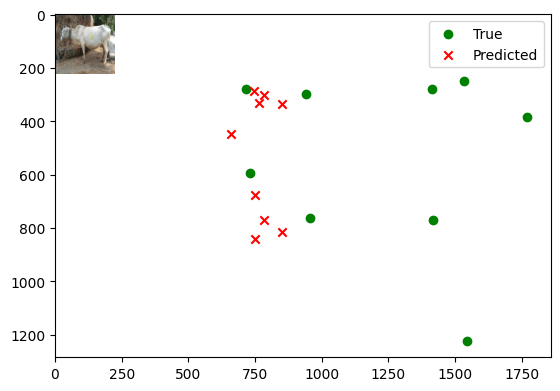

Image number: 176
True keypoints: [ 707.  314. 1793.  358.  644.  648.  901.  311.  920.  823. 1414.  284.
 1428.  803. 1599.  279. 1621. 1231.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[817.82495 356.37054]
 [708.1176  480.8944 ]
 [798.65375 723.02203]
 [908.28455 358.8151 ]
 [909.4177  870.1846 ]
 [837.4602  324.64282]
 [840.9002  820.8584 ]
 [798.5122  312.04517]
 [803.0566  898.69653]]


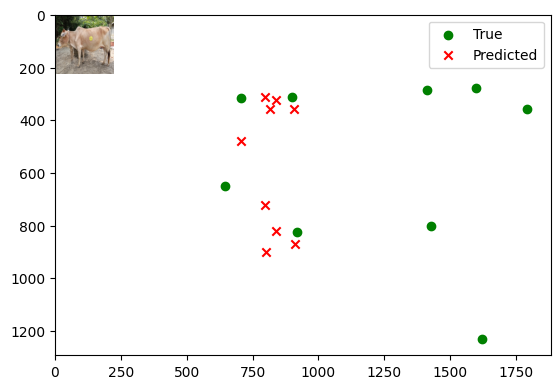

Image number: 177
True keypoints: [ 699.  318. 1710.  381.  627.  603.  898.  323.  909.  780. 1364.  262.
 1365.  759. 1464.  252. 1466. 1270.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[805.4539  349.94446]
 [696.44836 473.1077 ]
 [786.66437 711.9561 ]
 [893.78546 352.3843 ]
 [894.91504 856.57837]
 [823.8672  318.17334]
 [827.20056 808.0669 ]
 [785.36487 305.5937 ]
 [789.9738  884.3781 ]]


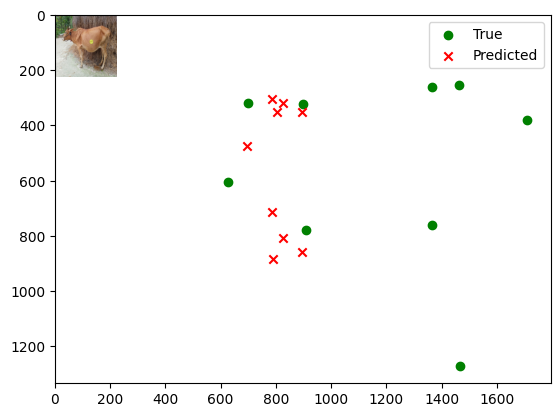

Image number: 178
True keypoints: [ 741.  358. 1796.  442.  706.  697.  925.  375.  947.  879. 1423.  343.
 1428.  871. 1568.  327. 1577. 1367.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[825.09534 359.90262]
 [714.7854  485.30557]
 [805.69904 729.47095]
 [916.6016  362.34482]
 [917.6804  878.06116]
 [845.2226  328.06598]
 [848.6542  828.27026]
 [805.9725  315.39807]
 [810.5533  906.92126]]


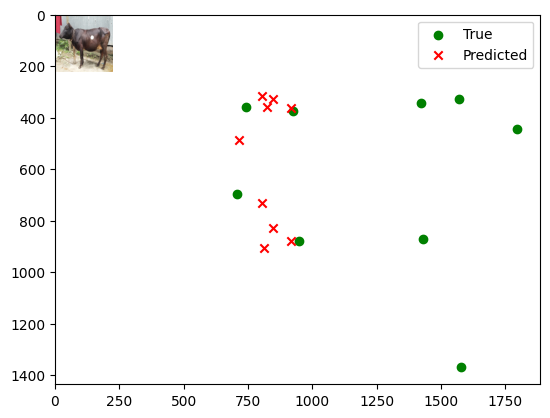

Image number: 179
True keypoints: [ 727.  320. 1801.  477.  696.  674.  927.  309.  937.  821. 1395.  338.
 1387.  813. 1565.  341. 1552. 1310.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[761.3474  328.4434 ]
 [654.04266 446.08008]
 [744.0481  673.079  ]
 [842.31195 330.5368 ]
 [843.3867  808.1954 ]
 [775.2261  296.42596]
 [778.30914 762.876  ]
 [738.1895  284.00366]
 [742.8803  833.4635 ]]


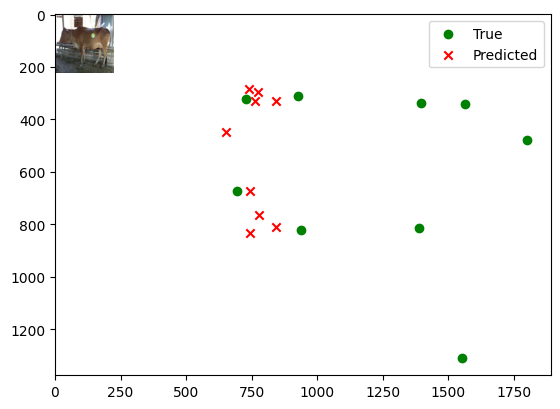

Image number: 180
True keypoints: [ 749.  289. 1717.  354.  690.  628.  972.  271.  970.  783. 1415.  236.
 1396.  703. 1498.  231. 1470. 1263.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[767.02844 330.7902 ]
 [660.6338  449.37665]
 [749.479   677.8188 ]
 [849.2862  333.13568]
 [850.2684  814.56726]
 [782.1107  299.09738]
 [785.2287  768.6692 ]
 [745.0679  286.6654 ]
 [749.7663  840.35913]]


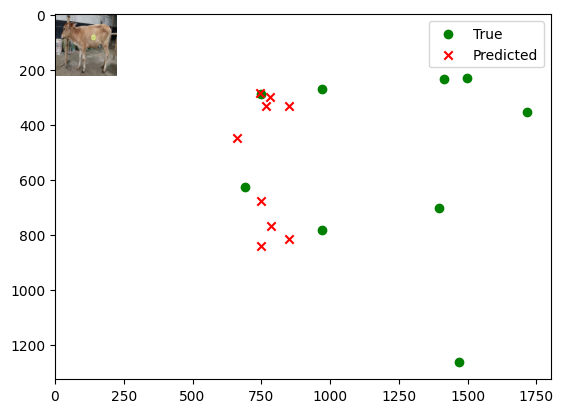

Image number: 181
True keypoints: [ 794.  364. 1741.  316.  731.  665.  937.  330.  965.  795. 1426.  254.
 1449.  680. 1512.  236. 1557. 1252.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[815.4657  354.25497]
 [705.16    478.94083]
 [796.4217  720.78516]
 [904.87665 356.73184]
 [905.89935 867.1899 ]
 [834.09143 322.03033]
 [837.3732  818.131  ]
 [795.07513 309.3022 ]
 [799.81256 895.38684]]


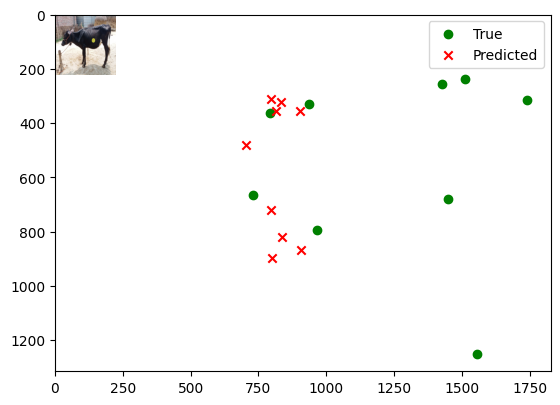

Image number: 182
True keypoints: [ 815.  362. 1511.  442.  796.  618.  962.  350.  976.  703. 1264.  323.
 1265.  658. 1350.  317. 1362. 1057.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[809.44305 352.75293]
 [700.334   475.9718 ]
 [790.4764  715.6561 ]
 [898.7592  355.08804]
 [899.99927 861.20496]
 [828.5984  321.2146 ]
 [831.99884 812.3712 ]
 [789.96173 308.70343]
 [794.4485  889.2928 ]]


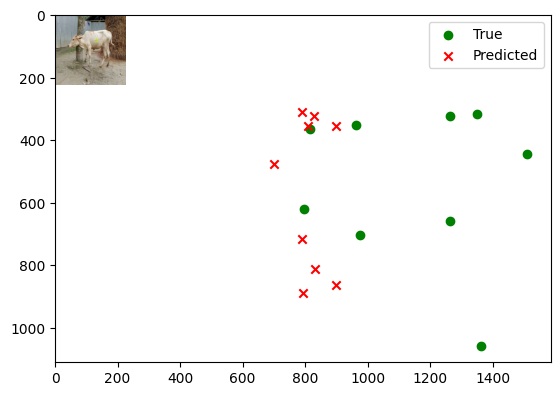

Image number: 183
True keypoints: [ 736.  343. 1609.  497.  682.  659.  921.  370.  940.  811. 1325.  344.
 1323.  747. 1392.  337. 1402. 1254.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[817.2759  356.5825 ]
 [707.8395  480.78442]
 [798.06396 722.61255]
 [907.9028  358.97614]
 [909.07587 869.7523 ]
 [837.19275 325.0584 ]
 [840.64514 820.42896]
 [798.28735 312.5031 ]
 [802.7789  898.32465]]


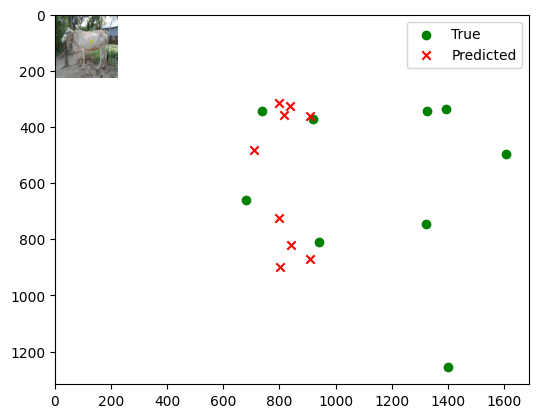

Image number: 184
True keypoints: [ 777.  288. 1815.  512.  738.  687.  957.  321.  964.  831. 1484.  311.
 1466.  837. 1584.  295. 1552. 1288.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[802.7247  347.98547]
 [693.55615 471.13034]
 [784.07135 709.43866]
 [890.28217 350.46432]
 [891.31305 853.3537 ]
 [820.4785  315.92487]
 [823.7416  805.1059 ]
 [781.99725 303.27884]
 [786.71924 880.93207]]


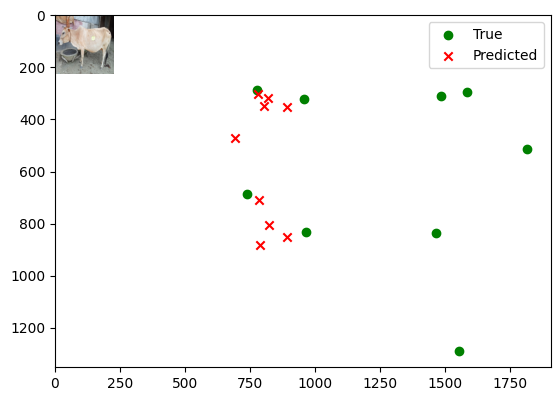

Image number: 185
True keypoints: [ 725.  262. 1865.  289.  788.  583. 1004.  180. 1032.  695. 1439.  139.
 1448.  664. 1619.  114. 1633. 1198.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[705.811   301.99915]
 [603.1762  412.47668]
 [690.1623  623.8944 ]
 [778.8398  303.9415 ]
 [779.9127  748.0339 ]
 [715.89764 270.80624]
 [718.8375  706.2857 ]
 [681.1896  258.7711 ]
 [685.7686  770.63086]]


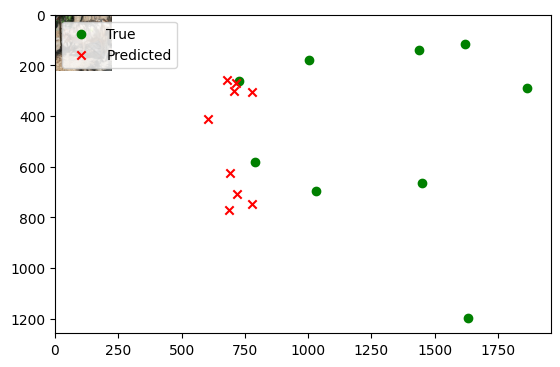

Image number: 186
True keypoints: [1162.  295.  122.  449. 1159.  642.  952.  299.  919.  808.  505.  247.
  486.  728.  411.  230.  394. 1186.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[727.3789  313.56516]
 [618.9322  426.31155]
 [711.5104  644.1584 ]
 [802.37915 314.94067]
 [803.432   770.69354]
 [736.4929  280.88715]
 [739.6743  728.5252 ]
 [700.25305 268.5674 ]
 [704.8661  793.6824 ]]


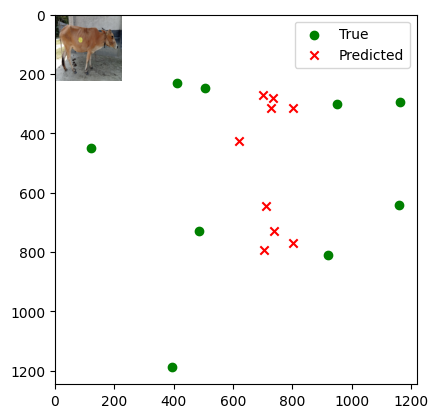

Image number: 187
True keypoints: [ 742.  236. 1688.  365.  680.  621.  919.  271.  921.  735. 1394.  233.
 1399.  667. 1486.  221. 1500. 1223.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[745.11536 319.74274]
 [639.88763 435.75177]
 [728.2423  658.3114 ]
 [823.7167  322.0362 ]
 [824.6781  790.5135 ]
 [758.05646 287.97665]
 [761.0389  746.10114]
 [721.8045  275.61356]
 [726.5876  815.0736 ]]


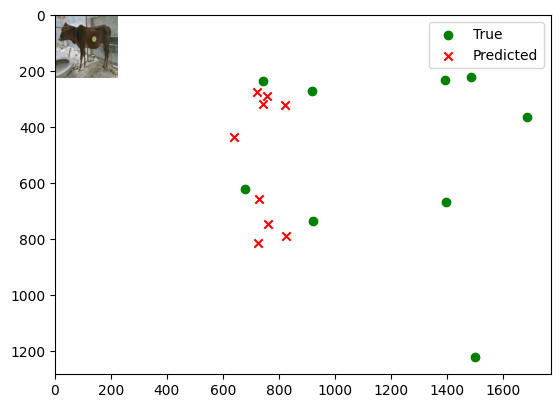

Image number: 188
True keypoints: [ 630.  183. 1585.  271.  644.  497.  825.  175.  848.  635. 1270.  135.
 1281.  599. 1386.  124. 1405. 1125.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[731.1587  314.08322]
 [628.45734 427.8151 ]
 [714.54504 645.94995]
 [808.66565 316.3676 ]
 [809.7815  775.97144]
 [744.41113 283.29782]
 [747.4611  732.21387]
 [708.99524 271.1982 ]
 [713.5064  800.1731 ]]


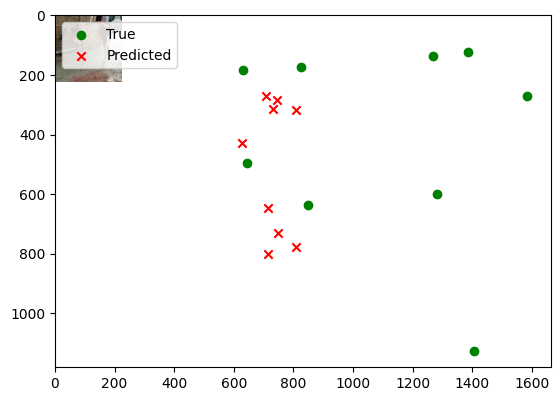

Image number: 189
True keypoints: [1164.  318.   97.  365. 1184.  628.  924.  316.  928.  799.  461.  236.
  477.  739.  350.  210.  409. 1230.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[721.12115 311.7169 ]
 [614.206   423.08014]
 [705.2928  638.71936]
 [796.02545 313.05475]
 [797.2061  764.4239 ]
 [730.8455  279.78198]
 [734.10504 722.5041 ]
 [695.0691  267.68155]
 [699.45776 787.38904]]


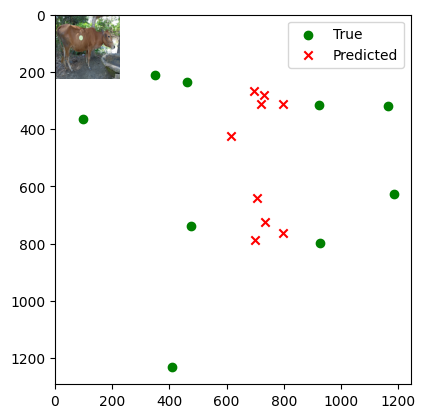

Image number: 190
True keypoints: [ 709.  334. 1553.  491.  735.  655.  918.  359.  926.  811. 1271.  378.
 1277.  798. 1368.  366. 1384. 1190.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[806.39105 350.372  ]
 [697.14856 473.66772]
 [787.57996 712.7988 ]
 [894.7761  352.79242]
 [895.87415 857.54956]
 [824.74963 318.50317]
 [828.0595  809.0006 ]
 [786.16504 305.8793 ]
 [790.8156  885.379  ]]


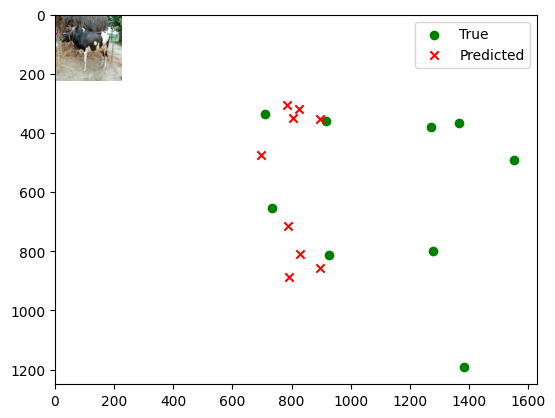

Image number: 191
True keypoints: [ 672.  294. 1732.  473.  691.  661.  880.  330.  889.  838. 1345.  299.
 1338.  779. 1481.  273. 1481. 1259.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[755.26935 325.28107]
 [648.4404  442.29623]
 [738.19    667.66205]
 [835.2849  327.44073]
 [836.30786 801.5052 ]
 [768.57556 293.2846 ]
 [771.6717  756.6347 ]
 [731.7986  280.8586 ]
 [736.5342  826.48065]]


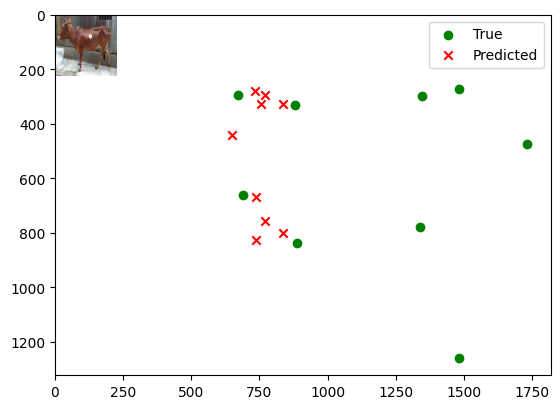

Image number: 192
True keypoints: [ 727.  321. 1762.  492.  694.  664.  929.  322.  948.  826. 1398.  313.
 1396.  779. 1509.  302. 1509. 1362.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[808.21436 351.37134]
 [699.0188  474.8604 ]
 [789.3635  714.44763]
 [897.0209  353.79837]
 [898.1297  859.6098 ]
 [826.8734  319.57346]
 [830.2307  810.92847]
 [788.26886 306.97015]
 [792.8611  887.57874]]


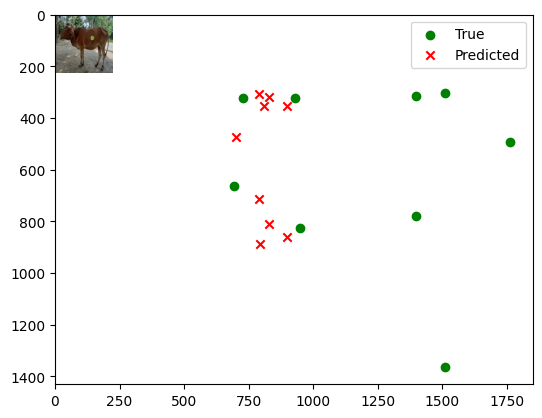

Image number: 193
True keypoints: [1257.  319.  266.  446. 1308.  639. 1025.  345. 1044.  799.  565.  269.
  586.  740.  486.  259.  524. 1247.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[710.75806 305.2076 ]
 [605.71747 415.93048]
 [695.1515  628.8956 ]
 [784.0007  306.7941 ]
 [785.151   753.1259 ]
 [720.1069  273.43195]
 [723.13367 711.5144 ]
 [684.87524 261.33737]
 [689.38947 775.6398 ]]


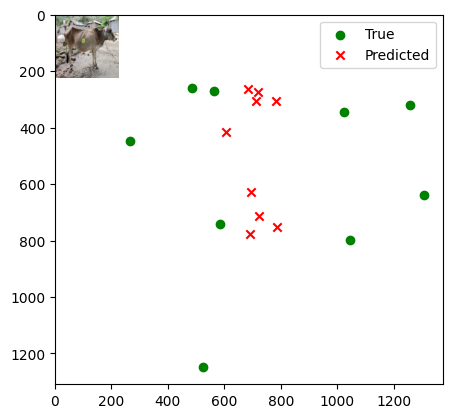

Image number: 194
True keypoints: [ 722.  301. 1649.  430.  655.  619.  889.  328.  880.  763. 1295.  283.
 1293.  712. 1415.  255. 1386. 1174.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[787.95197 341.86584]
 [680.7739  462.62204]
 [769.6471  696.4481 ]
 [874.0028  344.24683]
 [875.15027 837.7794 ]
 [805.5016  310.53427]
 [808.7733  790.3061 ]
 [767.77234 298.1062 ]
 [772.30817 864.78674]]


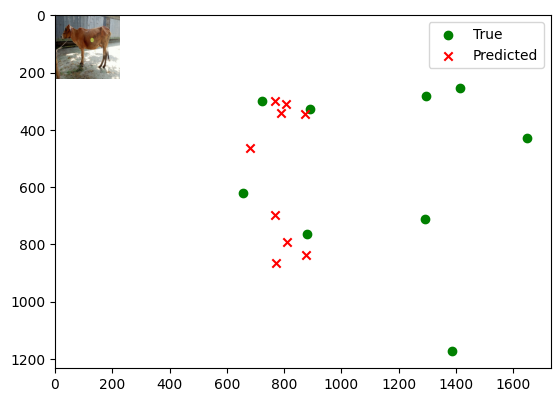

Image number: 195
True keypoints: [ 681.  341. 1635.  458.  630.  680.  841.  353.  851.  828. 1339.  308.
 1327.  745. 1422.  295. 1423. 1319.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[822.926   359.15613]
 [713.0456  484.14615]
 [803.55963 727.58563]
 [914.32874 361.58932]
 [915.47656 875.8479 ]
 [843.18823 327.52145]
 [846.658   826.16095]
 [804.05853 314.92395]
 [808.5775  904.6687 ]]


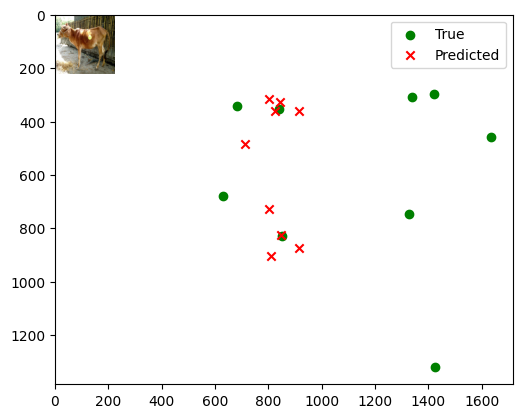

Image number: 196
True keypoints: [1184.  478.  278.  589. 1161.  781.  983.  471.  965.  893.  542.  434.
  552.  839.  486.  428.  515. 1273.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[777.6564  338.54114]
 [666.8788  457.2641 ]
 [760.0702  688.63776]
 [860.9988  340.1371 ]
 [862.1129  825.86847]
 [791.8354  306.05356]
 [795.2367  780.124  ]
 [753.85    293.6185 ]
 [758.36096 851.7628 ]]


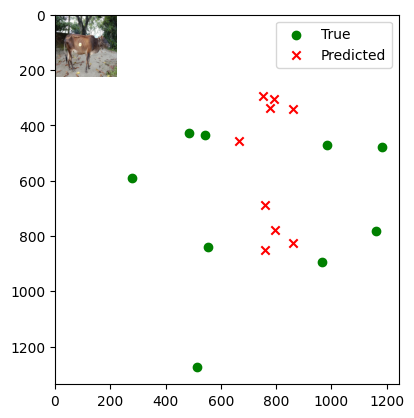

Image number: 197
True keypoints: [ 657.  385. 1556.  463.  609.  685.  804.  377.  822.  810. 1272.  318.
 1278.  721. 1351.  310. 1372. 1206.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[853.0419  373.56494]
 [740.6416  502.4497 ]
 [832.80884 754.33124]
 [948.81616 376.10446]
 [949.8391  908.44904]
 [875.3205  341.457  ]
 [878.8999  856.9221 ]
 [834.9394  328.65814]
 [839.5432  938.78735]]


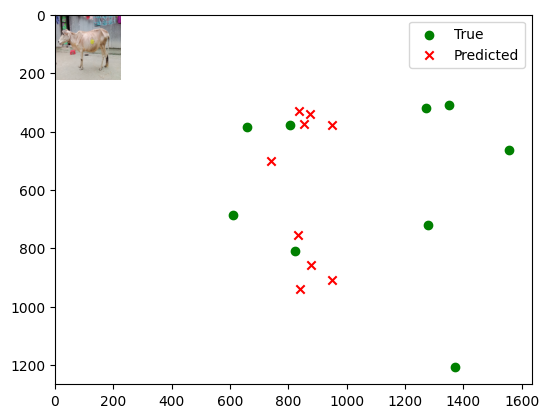

Image number: 198
True keypoints: [ 814.  340. 1786.  467.  764.  675.  985.  348.  996.  803. 1452.  331.
 1444.  750. 1557.  313. 1538. 1250.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[793.3807  343.43433]
 [684.98895 465.4059 ]
 [775.0156  701.1307 ]
 [879.5582  345.905  ]
 [880.5872  843.20953]
 [810.4609  311.5174 ]
 [813.68567 795.53784]
 [772.3826  298.90765]
 [777.0865  870.31384]]


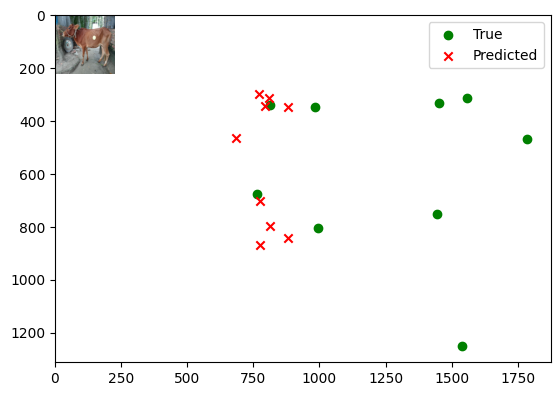

Image number: 199
True keypoints: [ 741.  323. 1542.  389.  732.  598.  897.  334.  904.  724. 1269.  296.
 1282.  657. 1366.  284. 1391. 1095.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[798.7157  346.92517]
 [690.40906 469.108  ]
 [780.10254 706.0021 ]
 [886.1929  349.33734]
 [887.35565 849.3693 ]
 [816.8426  315.36487]
 [820.1515  801.2395 ]
 [778.6333  302.8443 ]
 [783.20667 876.86725]]


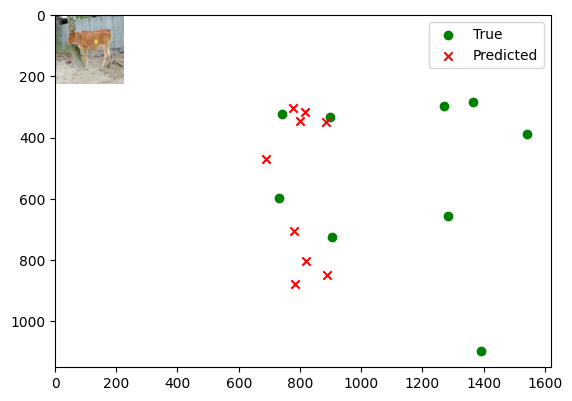

Image number: 200
True keypoints: [ 681.  479. 1459.  596.  656.  754.  845.  504.  867.  882. 1225.  472.
 1235.  813. 1290.  459. 1305. 1207.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[815.6819  355.3811 ]
 [706.2257  479.61725]
 [796.5533  721.1407 ]
 [905.83997 357.8311 ]
 [906.9843  867.8972 ]
 [835.2154  323.72177]
 [838.6134  818.68555]
 [796.3596  311.12964]
 [800.93524 896.3213 ]]


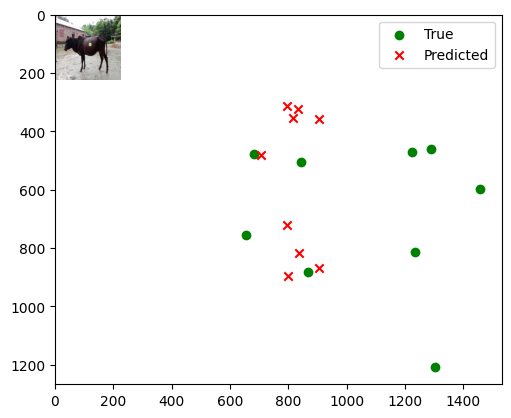

Image number: 201
True keypoints: [1288.  307.  306.  431. 1294.  636. 1032.  289. 1036.  765.  597.  270.
  619.  747.  516.  257.  548. 1248.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[814.12915 353.3948 ]
 [703.8978  478.0218 ]
 [795.13904 719.5613 ]
 [903.26056 355.9099 ]
 [904.2964  865.67004]
 [832.57367 321.14447]
 [835.8688  816.7187 ]
 [793.6014  308.41617]
 [798.37573 893.77386]]


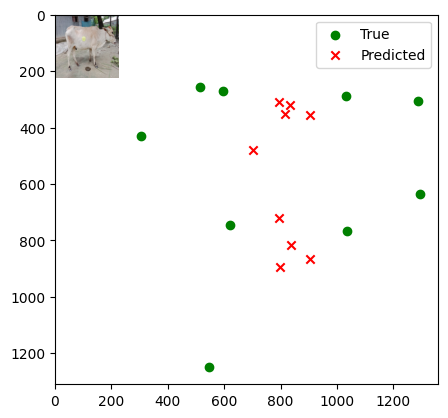

Image number: 202
True keypoints: [ 643.  417. 1673.  475.  660.  722.  883.  400.  912.  879. 1366.  368.
 1378.  828. 1459.  363. 1487. 1373.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[809.8712  352.41525]
 [700.39795 475.94342]
 [790.9406  715.977  ]
 [898.8951  354.79483]
 [899.97754 861.3996 ]
 [828.5926  320.56592]
 [831.9308  812.68   ]
 [789.87933 307.9658 ]
 [794.5006  889.45264]]


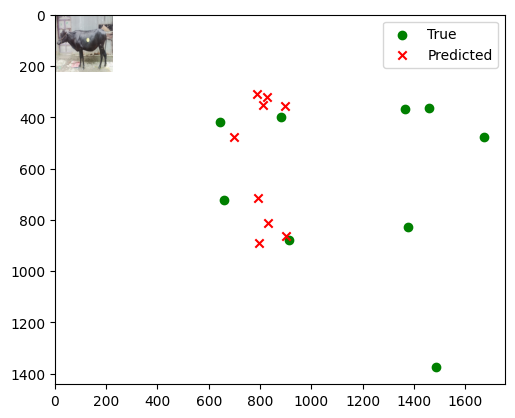

Image number: 203
True keypoints: [ 728.  388. 1646.  528.  677.  716.  889.  397.  911.  865. 1377.  372.
 1390.  799. 1451.  376. 1485. 1323.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[810.5841  352.81653]
 [701.25336 476.4121 ]
 [791.63556 716.6058 ]
 [899.83374 355.225  ]
 [900.9061  862.24677]
 [829.50183 321.02817]
 [832.8653  813.4405 ]
 [790.7948  308.44775]
 [795.40894 890.36365]]


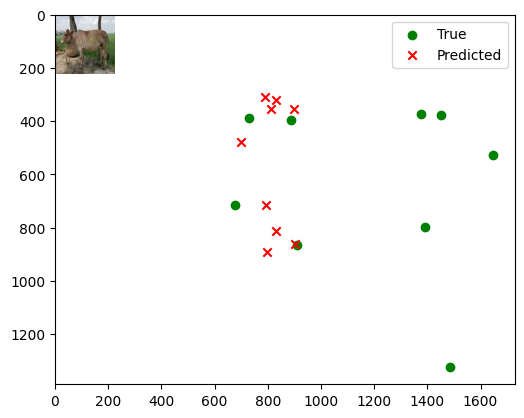

Image number: 204
True keypoints: [ 691.  203. 1703.  347.  621.  561.  873.  208.  891.  713. 1344.  186.
 1351.  638. 1470.  172. 1490. 1203.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[753.56885 324.96622]
 [648.97375 441.49902]
 [736.3161  665.886  ]
 [834.3672  327.29245]
 [835.5024  800.3302 ]
 [768.40753 293.91174]
 [771.5326  755.10913]
 [732.06433 281.66083]
 [736.59827 825.60614]]


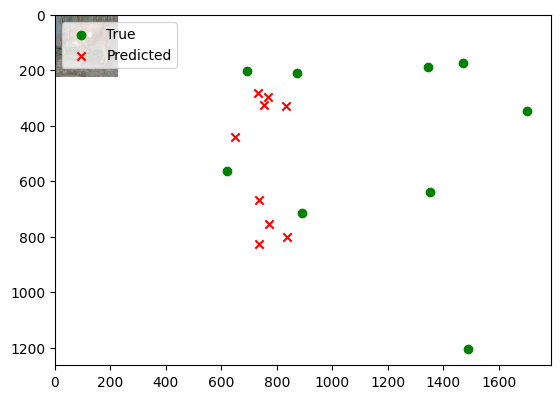

Image number: 205
True keypoints: [ 698.  295. 1528.  361.  672.  563.  842.  283.  865.  717. 1265.  293.
 1276.  686. 1395.  272. 1411. 1057.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[799.94885 347.86185]
 [691.9476  470.03647]
 [781.2733  707.13574]
 [887.9077  350.25958]
 [889.0553  850.8724 ]
 [818.5065  316.48657]
 [821.8662  802.6312 ]
 [780.32245 304.00497]
 [784.8427  878.5341 ]]


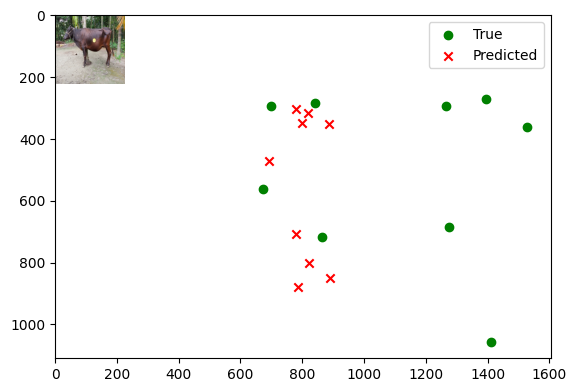

Image number: 206
True keypoints: [ 783.  308. 1667.  453.  685.  629.  942.  328.  953.  768. 1360.  306.
 1367.  724. 1479.  293. 1466. 1257.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[792.0606  343.7308 ]
 [683.983   465.03882]
 [773.6469  700.111  ]
 [878.42255 346.07648]
 [879.6537  842.09375]
 [809.5492  312.15656]
 [812.79346 794.41766]
 [771.5392  299.66278]
 [776.10547 869.20215]]


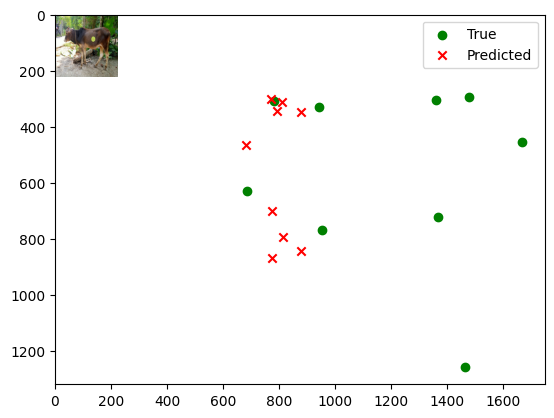

Image number: 207
True keypoints: [1092.  337.  225.  432. 1119.  628.  897.  342.  897.  775.  508.  299.
  519.  704.  430.  283.  449. 1187.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[680.5695  293.7232 ]
 [570.0351  399.33032]
 [666.5718  604.42096]
 [747.3143  293.9182 ]
 [748.50446 719.06104]
 [683.08435 260.15347]
 [686.36646 681.28076]
 [647.8803  248.07599]
 [652.276   738.8094 ]]


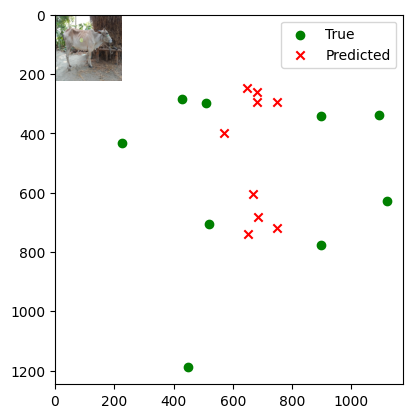

Image number: 208
True keypoints: [ 690.  288. 1711.  445.  661.  624.  871.  286.  904.  800. 1377.  275.
 1383.  736. 1481.  270. 1501. 1306.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[799.9381  347.437  ]
 [691.71765 469.8197 ]
 [781.30536 707.0547 ]
 [887.6461  349.88434]
 [888.76245 850.70306]
 [818.2083  315.88016]
 [821.5248  802.4874 ]
 [779.98694 303.33936]
 [784.56775 878.276  ]]


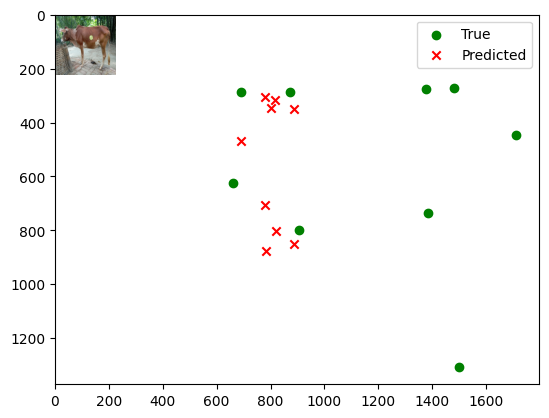

Image number: 209
True keypoints: [ 677.  393. 1604.  464.  660.  692.  885.  393.  917.  857. 1310.  333.
 1332.  772. 1404.  314. 1446. 1297.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[840.84534 368.01407]
 [729.5459  495.1796 ]
 [820.94727 743.54395]
 [934.96857 370.45837]
 [936.10767 895.35065]
 [862.45844 336.20358]
 [866.00793 844.5187 ]
 [822.60834 323.50797]
 [827.1327  925.0857 ]]


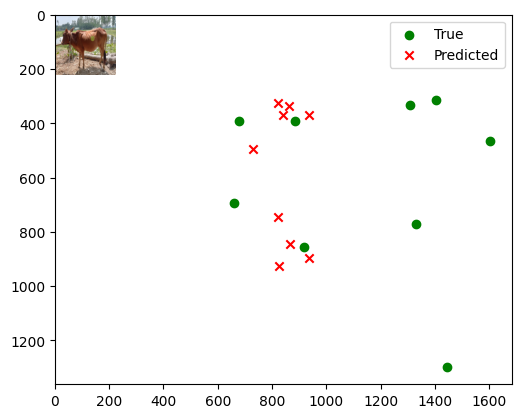

Image number: 210
True keypoints: [ 686.  360. 1685.  422.  726.  641.  940.  285.  967.  798. 1408.  242.
 1403.  714. 1499.  244. 1481. 1185.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[792.33795 343.4069 ]
 [684.3512  465.00888]
 [773.94965 700.2722 ]
 [878.64185 345.8434 ]
 [879.75806 842.2912 ]
 [809.73444 311.76254]
 [812.9532  794.6194 ]
 [771.7479  299.23035]
 [776.3762  869.416  ]]


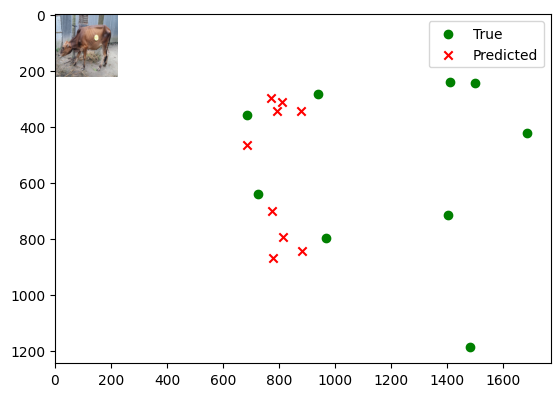

Image number: 211
True keypoints: [ 697.  216. 1812.  375.  655.  565.  895.  234.  904.  750. 1465.  205.
 1457.  684. 1531.  191. 1534. 1187.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[734.5521  315.57227]
 [630.7274  429.83374]
 [717.96216 649.10895]
 [812.1518  317.78018]
 [813.2471  779.4271 ]
 [747.3844  284.4237 ]
 [750.4171  735.61676]
 [711.6647  272.192  ]
 [716.2299  803.5952 ]]


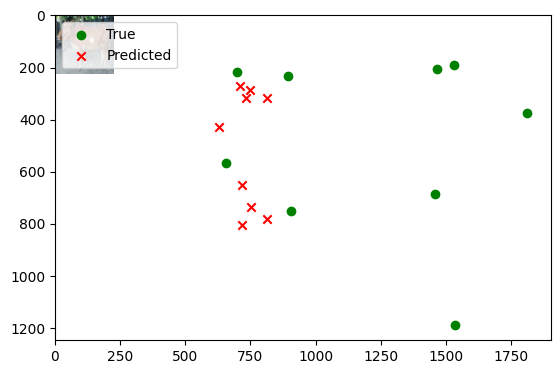

Image number: 212
True keypoints: [ 654.  297. 1693.  402.  601.  618.  837.  269.  845.  784. 1365.  256.
 1368.  734. 1446.  250. 1467. 1279.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[771.7536  333.73544]
 [665.8504  452.58347]
 [753.97455 682.0127 ]
 [855.2965  336.12805]
 [856.3779  820.08923]
 [787.98004 302.47772]
 [791.1728  773.7256 ]
 [750.91644 290.1454 ]
 [755.4789  846.28973]]


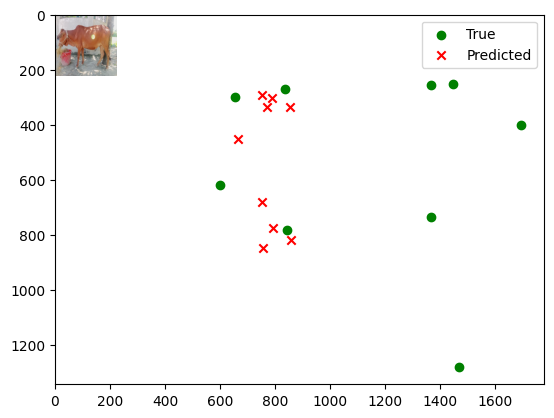

Image number: 213
True keypoints: [1252.  296.  156.  327. 1261.  679. 1032.  288. 1022.  841.  541.  200.
  548.  765.  366.  208.  399. 1256.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[761.75757 328.47012]
 [656.6011  446.2893 ]
 [744.2966  673.05566]
 [843.6417  330.88324]
 [844.6996  809.1119 ]
 [777.0745  297.22925]
 [780.2005  763.38525]
 [740.42645 284.87802]
 [745.03186 834.7977 ]]


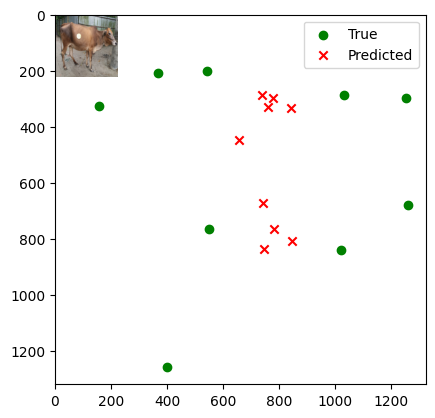

Image number: 214
True keypoints: [ 775.  317. 1724.  366.  821.  607.  966.  295.  992.  751. 1395.  252.
 1408.  686. 1495.  232. 1492. 1249.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[765.5159  329.78375]
 [659.3347  448.3155 ]
 [747.96484 676.3475 ]
 [847.48566 332.18716]
 [848.5481  812.9145 ]
 [780.52576 298.14343]
 [783.5955  767.0291 ]
 [743.5567  285.68552]
 [748.2687  838.6198 ]]


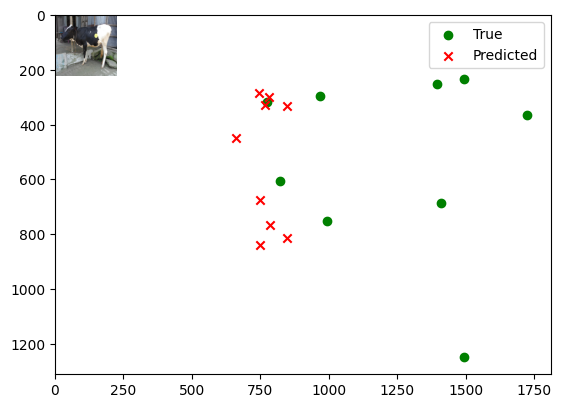

Image number: 215
True keypoints: [1175.  365.  236.  414. 1214.  708.  995.  374.  981.  827.  561.  297.
  558.  758.  448.  288.  454. 1288.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[828.717   361.45087]
 [717.761   487.43384]
 [809.25323 732.7056 ]
 [920.55945 363.89636]
 [921.65753 881.87134]
 [848.83105 329.38287]
 [852.27075 831.93555]
 [809.3551  316.65652]
 [813.97974 910.86694]]


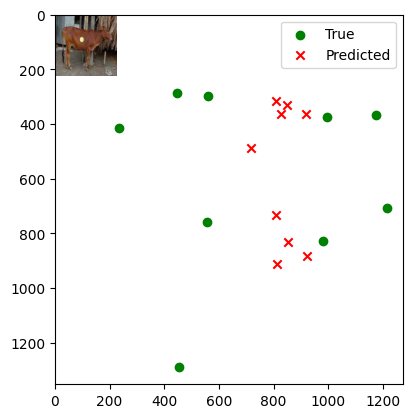

Image number: 216
True keypoints: [1208.  276.  255.  383. 1306.  659. 1030.  314. 1021.  809.  594.  240.
  575.  732.  510.  213.  523. 1224.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[798.74365 346.49054]
 [689.8541  468.92776]
 [780.23785 706.07587]
 [885.85535 348.89563]
 [886.84296 849.08057]
 [816.2339  314.4665 ]
 [819.5477  801.2195 ]
 [777.9177  301.89923]
 [782.6226  876.51855]]


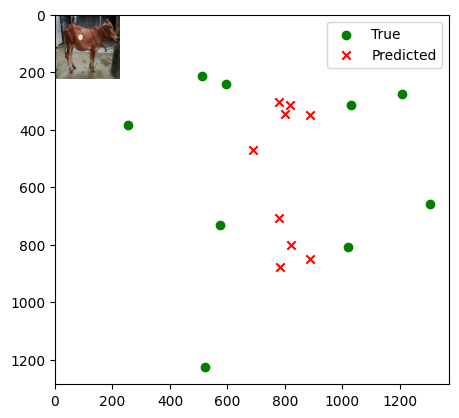

Image number: 217
True keypoints: [ 810.  388. 1739.  503.  783.  684.  991.  381.  994.  831. 1432.  367.
 1416.  788. 1512.  358. 1486. 1288.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[830.1787  362.72006]
 [719.585   488.60495]
 [810.6167  734.06335]
 [922.61835 365.1526 ]
 [923.7366  883.71356]
 [850.8812  330.96213]
 [854.37115 833.5835 ]
 [811.44714 318.30084]
 [815.9663  912.899  ]]


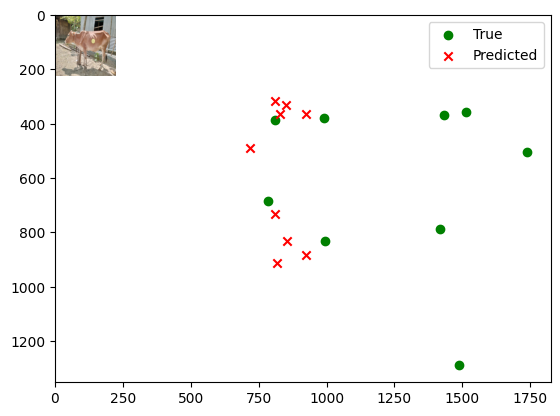

Image number: 218
True keypoints: [ 715.  403. 1520.  448.  684.  691.  869.  375.  903.  792. 1268.  331.
 1286.  713. 1346.  320. 1386. 1211.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[824.93463 359.949  ]
 [714.7313  485.28903]
 [805.52747 729.35266]
 [916.50507 362.41077]
 [917.63086 877.9524 ]
 [845.1796  328.217  ]
 [848.6346  828.15216]
 [805.9639  315.59113]
 [810.48975 906.8405 ]]


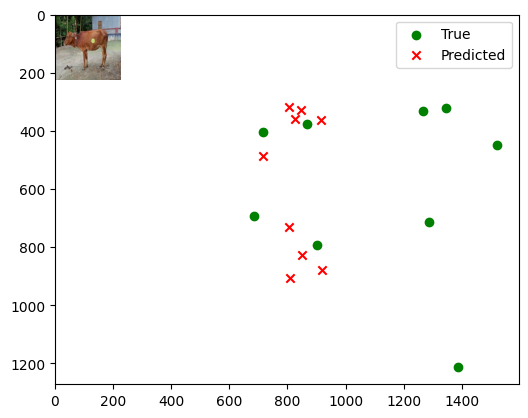

Image number: 219
True keypoints: [ 759.  292. 1656.  486.  687.  637.  910.  316.  924.  797. 1384.  310.
 1364.  765. 1465.  311. 1430. 1185.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[806.67896 350.85608]
 [697.6986  474.01483]
 [787.82874 713.0995 ]
 [895.36365 353.27774]
 [896.51953 858.0178 ]
 [825.3928  319.19522]
 [828.74756 809.41187]
 [786.85364 306.64142]
 [791.40466 885.9354 ]]


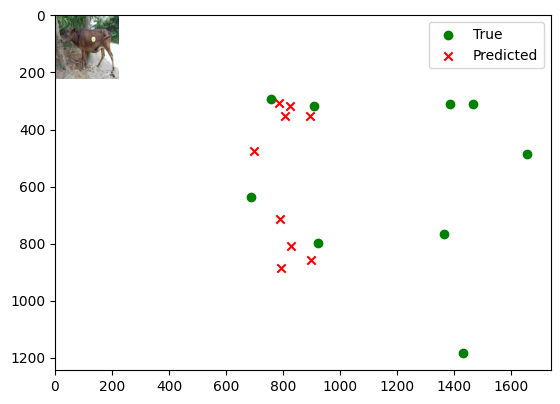

Image number: 220
True keypoints: [ 654.  188. 1729.  302.  641.  508.  878.  177.  897.  695. 1380.  158.
 1386.  612. 1487.  145. 1485. 1136.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[747.9887  322.20145]
 [643.96674 438.07568]
 [730.8893  660.89856]
 [827.9822  324.52292]
 [829.09534 794.2708 ]
 [762.46344 291.2248 ]
 [765.56714 749.4043 ]
 [726.3634  279.00558]
 [730.8982  819.291  ]]


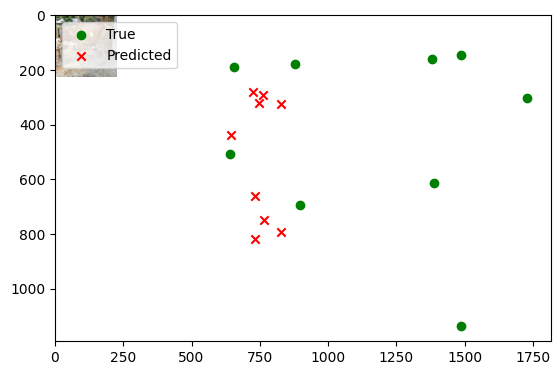

Image number: 221
True keypoints: [1290.  300.   73.  239. 1207.  598.  994.  235.  979.  778.  461.  103.
  470.  675.  321.   88.  360. 1193.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[732.3602  314.05914]
 [628.1737  428.2516 ]
 [715.8737  647.1517 ]
 [809.2647  316.2752 ]
 [810.23157 776.77954]
 [744.5052  282.54245]
 [747.4913  733.2296 ]
 [708.796   270.32492]
 [713.50305 800.7618 ]]


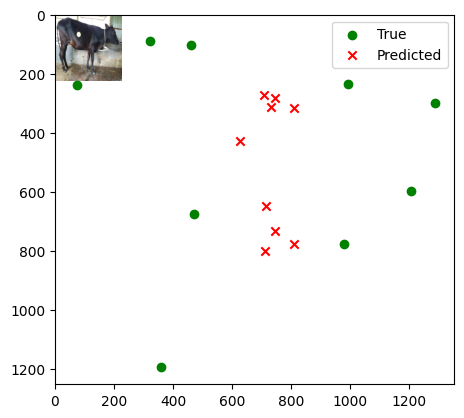

Image number: 222
True keypoints: [1188.  202.  146.  270. 1189.  541.  937.  196.  940.  673.  471.  160.
  480.  636.  387.  139.  400. 1055.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[619.95776 264.6353 ]
 [516.2418  362.40988]
 [607.59784 550.40906]
 [678.574   264.84558]
 [679.5994  653.6579 ]
 [619.3174  232.3614 ]
 [622.37335 619.56696]
 [586.9611  220.84639]
 [591.26904 670.89856]]


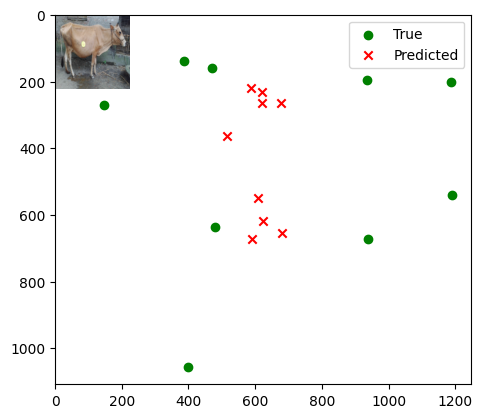

Image number: 223
True keypoints: [1270.  369.  519.  433. 1289.  643. 1114.  379. 1095.  792.  754.  346.
  753.  734.  690.  333.  704. 1211.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[759.92487 330.32758]
 [648.50385 446.72052]
 [743.0851  673.37976]
 [839.97986 331.60812]
 [841.079   806.18665]
 [771.47504 297.3808 ]
 [774.86945 762.083  ]
 [733.87024 284.9514 ]
 [738.3586  830.79645]]


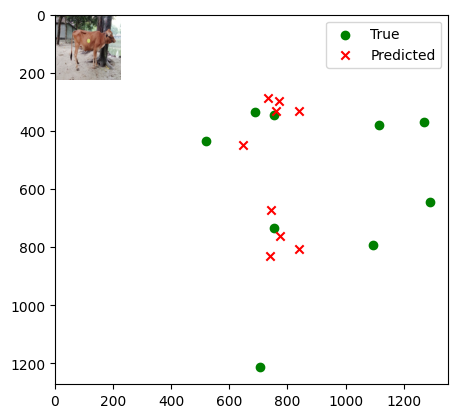

Image number: 224
True keypoints: [ 795.  279. 1714.  357.  752.  625.  994.  292. 1019.  781. 1443.  229.
 1435.  700. 1507.  223. 1486. 1176.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[769.8856  333.08157]
 [664.2899  451.5841 ]
 [752.11884 680.3957 ]
 [853.3144  335.44318]
 [854.416   818.1633 ]
 [786.16705 301.98108]
 [789.38055 771.87085]
 [749.20636 289.67386]
 [753.72375 844.3241 ]]


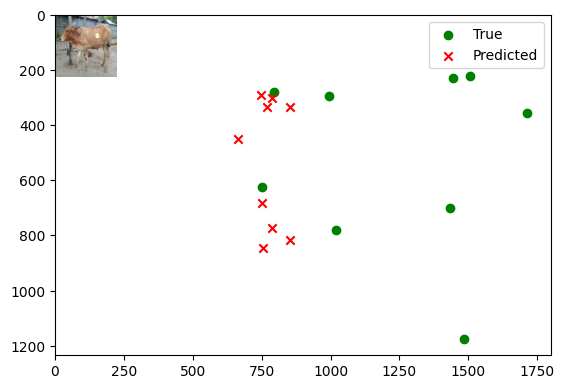

Image number: 225
True keypoints: [ 670.  144. 1708.  323.  666.  526.  880.  166.  893.  685. 1340.  126.
 1353.  607. 1456.  118. 1472. 1175.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[721.88293 309.45068]
 [619.78503 422.08017]
 [705.5951  637.72217]
 [797.9007  311.7136 ]
 [798.9685  765.845  ]
 [734.2787  278.64453]
 [737.2543  722.7016 ]
 [699.197   266.55746]
 [703.75726 789.5173 ]]


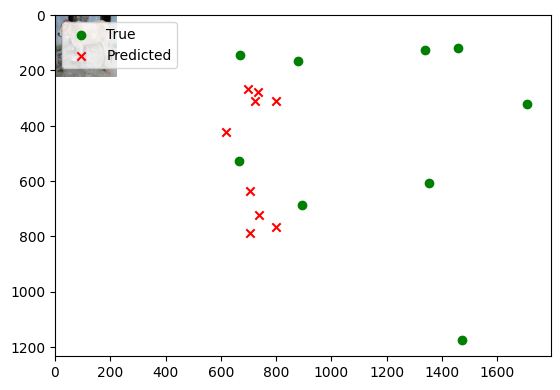

Image number: 226
True keypoints: [ 777.  256. 1746.  355.  742.  599.  976.  270. 1002.  758. 1434.  225.
 1442.  673. 1513.  209. 1524. 1276.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[752.9276  324.5096 ]
 [648.4559  441.04602]
 [735.67834 665.26044]
 [833.6044  326.86356]
 [834.7389  799.5998 ]
 [767.7245  293.46805]
 [770.84454 754.42615]
 [731.41223 281.22046]
 [735.9705  824.8452 ]]


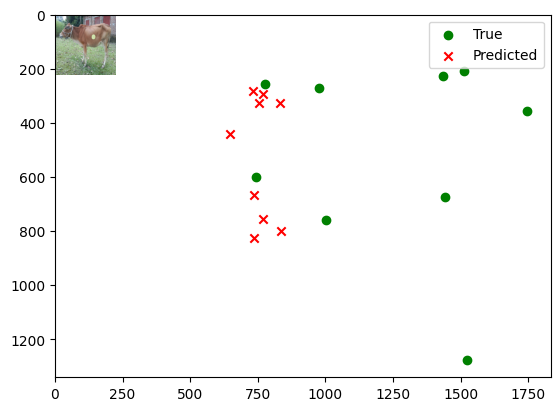

Image number: 227
True keypoints: [ 795.  267. 1756.  423.  724.  605.  985.  295.  979.  787. 1444.  282.
 1434.  732. 1547.  271. 1531. 1203.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[776.558   335.4845 ]
 [669.4469  455.2181 ]
 [758.6852  686.23645]
 [860.2739  337.88785]
 [861.3984  825.004  ]
 [792.46674 303.81113]
 [795.6262  778.4011 ]
 [755.06604 291.338  ]
 [759.7183  851.2708 ]]


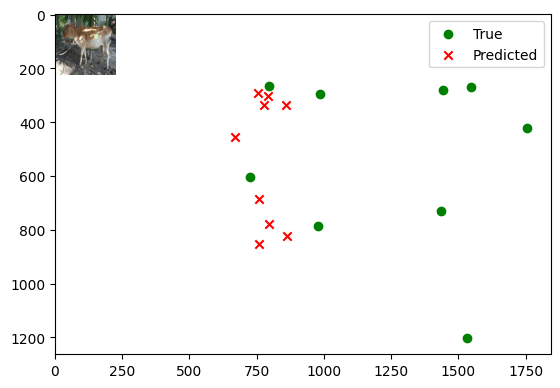

Image number: 228
True keypoints: [1158.  244.  230.  448. 1204.  627.  968.  286.  968.  793.  534.  280.
  529.  724.  446.  268.  461. 1251.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[753.8634  325.34872]
 [645.7652  441.88995]
 [736.9616  666.91254]
 [833.4055  327.2319 ]
 [834.4609  799.8401 ]
 [766.35297 293.06265]
 [769.5145  755.3728 ]
 [729.40063 280.62192]
 [734.0622  824.51917]]


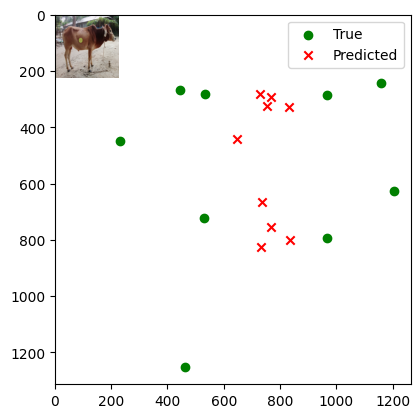

Image number: 229
True keypoints: [ 812.  248. 1646.  349.  734.  564.  995.  269. 1006.  720. 1377.  225.
 1378.  642. 1455.  214. 1465. 1163.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[809.0259  352.88766]
 [700.8696  475.91284]
 [790.0339  715.27734]
 [898.766   355.29596]
 [899.938   861.0136 ]
 [828.7969  321.76306]
 [832.24225 812.1142 ]
 [790.3491  309.32147]
 [794.7588  889.24615]]


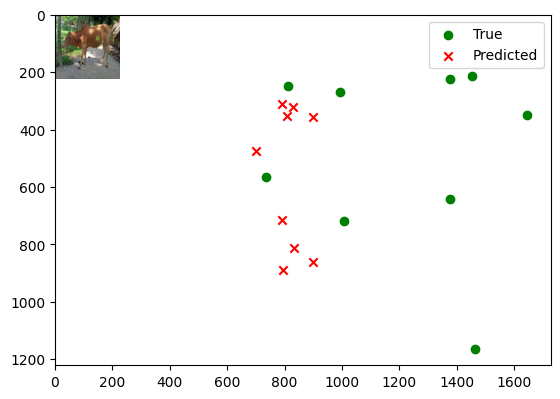

Image number: 230
True keypoints: [1240.  273.  186.  383. 1237.  665. 1020.  314. 1033.  775.  540.  260.
  560.  752.  407.  234.  447. 1284.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[769.0859  332.71646]
 [662.66455 451.11823]
 [751.46173 679.8877 ]
 [852.0386  334.97305]
 [853.10516 817.0653 ]
 [784.6458  301.2756 ]
 [787.8716  771.0407 ]
 [747.5714  288.91647]
 [752.1452  843.0204 ]]


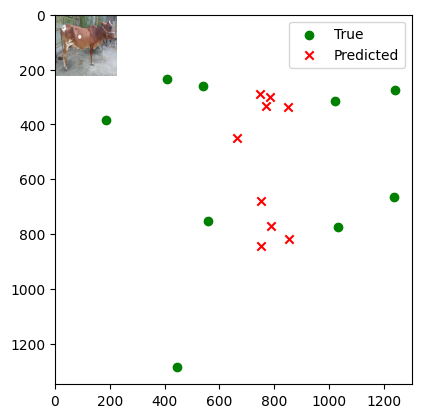

Image number: 231
True keypoints: [ 730.  346. 1655.  417.  728.  690.  924.  346.  962.  821. 1368.  301.
 1387.  733. 1455.  297. 1477. 1286.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[804.80005 350.3425 ]
 [696.357   473.08356]
 [785.96826 711.4785 ]
 [893.5078  352.74878]
 [894.68134 856.1598 ]
 [823.7411  318.93924]
 [827.13306 807.62225]
 [785.3546  306.45245]
 [789.8392  884.0709 ]]


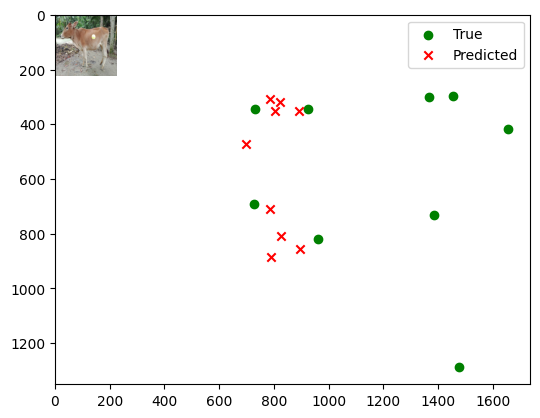

Image number: 232
True keypoints: [ 745.  343. 1634.  413.  721.  634.  950.  325.  969.  775. 1343.  287.
 1348.  711. 1440.  274. 1463. 1281.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[799.6865  348.06866]
 [691.5233  470.0431 ]
 [781.0053  706.9833 ]
 [887.6566  350.40268]
 [888.8732  850.63806]
 [818.26044 316.7132 ]
 [821.633   802.44696]
 [780.0444  304.28394]
 [784.4983  878.2937 ]]


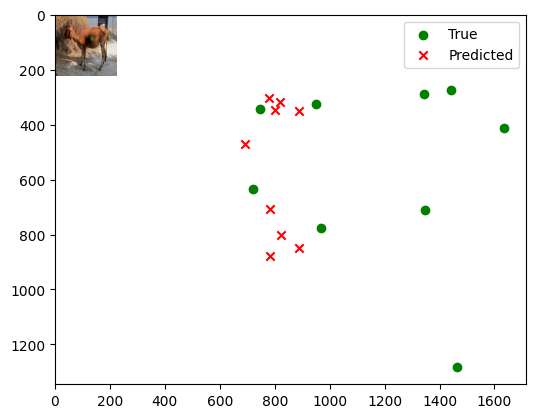

Image number: 233
True keypoints: [ 778.  318. 1806.  473.  745.  728. 1004.  355.  999.  844. 1424.  316.
 1430.  783. 1520.  293. 1522. 1217.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[800.5499  347.20544]
 [691.9352  469.94315]
 [781.9444  707.5395 ]
 [888.04584 349.7039 ]
 [889.08484 851.1587 ]
 [818.4774  315.38907]
 [821.76196 802.971  ]
 [780.17896 302.794  ]
 [784.83405 878.7047 ]]


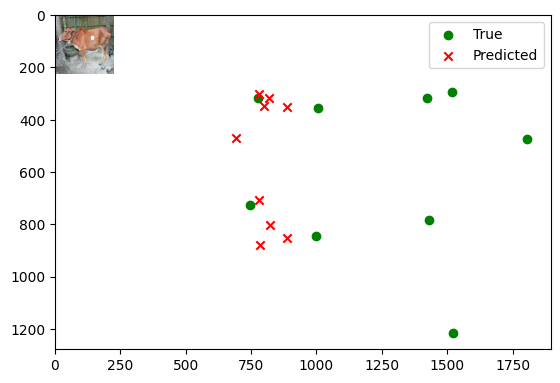

Image number: 234
True keypoints: [1225.  361.  195.  444. 1217.  662. 1031.  339. 1031.  823.  530.  296.
  538.  754.  405.  291.  431. 1239.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[821.08167 358.0874 ]
 [711.2062  482.95087]
 [801.798   725.9439 ]
 [912.1122  360.54352]
 [913.24835 873.78314]
 [841.0763  326.39072]
 [844.5231  824.2452 ]
 [801.99677 313.77478]
 [806.531   902.50195]]


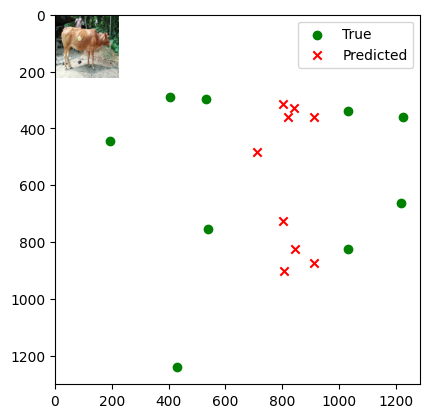

Image number: 235
True keypoints: [1226.  224.  182.  378. 1270.  579. 1022.  253. 1021.  770.  541.  214.
  547.  750.  468.  210.  486. 1252.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[736.44556 316.356  ]
 [632.8019  430.88086]
 [719.7354  650.67816]
 [814.38696 318.62125]
 [815.43506 781.5004 ]
 [749.58624 285.20392]
 [752.6053  737.5331 ]
 [713.8559  272.99805]
 [718.4783  805.8578 ]]


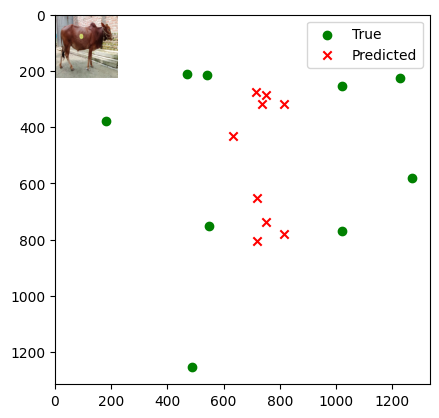

Image number: 236
True keypoints: [1254.  283.  195.  449. 1270.  620. 1032.  287. 1038.  786.  511.  255.
  529.  768.  425.  251.  475. 1199.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[776.9005  336.71863]
 [669.73    456.0017 ]
 [759.04474 686.88684]
 [861.04517 338.94952]
 [862.1585  825.5941 ]
 [793.0504  305.2187 ]
 [796.3223  779.07635]
 [755.6504  292.82336]
 [760.16785 851.95667]]


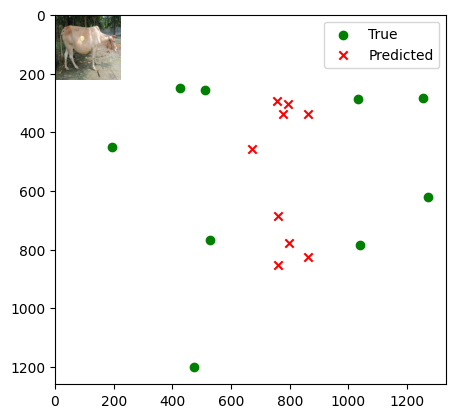

Image number: 237
True keypoints: [ 733.  259. 1668.  267.  680.  573.  922.  250.  959.  728. 1376.  163.
 1400.  595. 1456.  156. 1511. 1201.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[743.13586 320.8956 ]
 [640.4527  435.64288]
 [726.0957  656.7221 ]
 [823.18823 323.19293]
 [824.37305 789.4675 ]
 [758.2261  290.57413]
 [761.41736 744.807  ]
 [722.50055 278.55252]
 [726.84753 814.4915 ]]


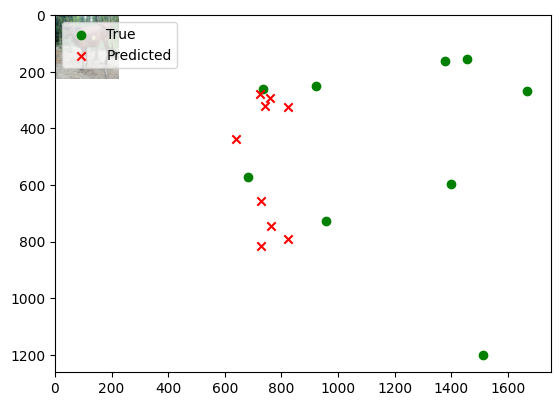

Image number: 238
True keypoints: [ 750.  302. 1689.  427.  721.  616.  920.  302.  944.  764. 1385.  289.
 1383.  718. 1479.  271. 1486. 1170.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[792.7014  344.54492]
 [684.9304  465.6999 ]
 [774.22156 700.75726]
 [879.5171  346.88763]
 [880.7466  842.9783 ]
 [810.6229  313.20032]
 [813.94977 795.2616 ]
 [772.6706  300.8143 ]
 [777.1378  870.25525]]


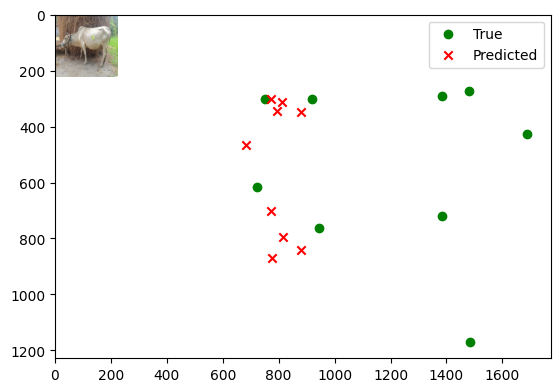

Image number: 239
True keypoints: [ 682.  387. 1657.  529.  678.  726.  914.  394.  932.  860. 1334.  389.
 1338.  817. 1436.  377. 1427. 1320.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[867.13086 381.18756]
 [753.5265  511.4923 ]
 [846.48456 767.06537]
 [965.2682  383.64548]
 [966.3772  923.937  ]
 [890.6472  349.0888 ]
 [894.34155 871.5705 ]
 [849.70337 336.28033]
 [854.1896  955.0454 ]]


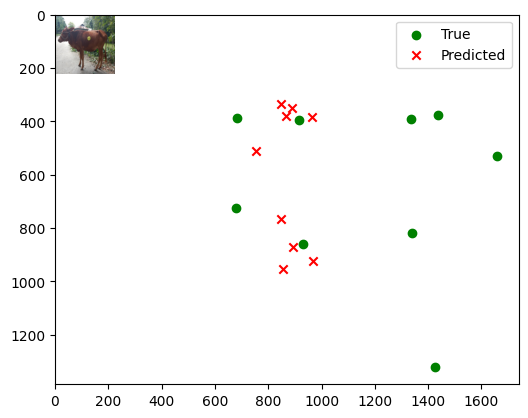

Image number: 240
True keypoints: [ 661.  296. 1646.  415.  689.  636.  902.  295.  926.  778. 1331.  261.
 1344.  715. 1435.  257. 1466. 1182.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[809.67065 352.97162]
 [701.18414 476.19983]
 [790.68713 715.8466 ]
 [899.3358  355.38428]
 [900.5138  861.5961 ]
 [829.2537  321.67545]
 [832.6885  812.7066 ]
 [790.73724 309.19385]
 [795.1776  889.8255 ]]


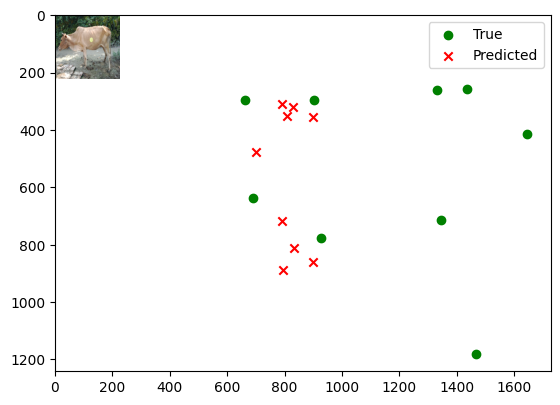

Image number: 241
True keypoints: [ 804.  355. 1682.  436.  781.  655.  978.  334.  992.  748. 1372.  298.
 1385.  694. 1475.  283. 1498. 1224.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[785.9382  339.7224 ]
 [677.8127  460.7634 ]
 [767.7888  694.509  ]
 [870.7997  342.13385]
 [871.89496 835.0588 ]
 [802.254   307.7494 ]
 [805.3863  787.8517 ]
 [764.4093  295.1539 ]
 [769.16437 861.6924 ]]


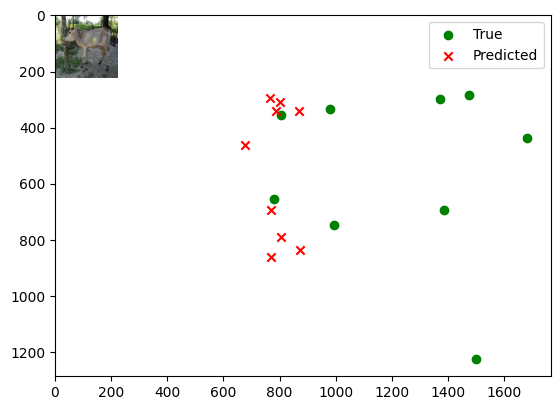

Image number: 242
True keypoints: [ 694.  287. 1742.  400.  697.  640.  912.  284.  925.  782. 1380.  234.
 1386.  723. 1475.  232. 1486. 1182.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[749.815   322.84695]
 [645.02966 439.0395 ]
 [732.67377 662.50604]
 [829.7445  325.15842]
 [830.9131  796.06616]
 [764.0173  291.6375 ]
 [767.07623 751.16846]
 [727.72534 279.37137]
 [732.3033  821.06055]]


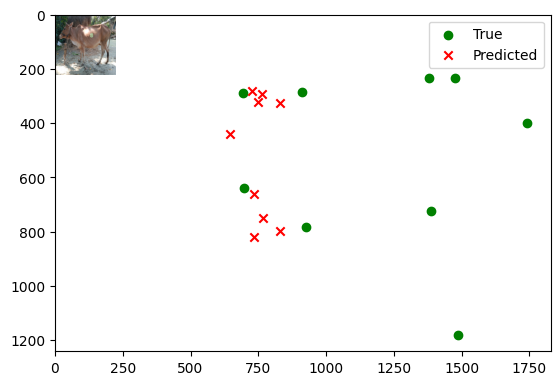

Image number: 243
True keypoints: [ 701.  258. 1659.  391.  626.  594.  891.  304.  875.  760. 1288.  293.
 1280.  763. 1405.  277. 1385. 1238.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[802.67865 349.811  ]
 [694.77014 472.05893]
 [783.89417 709.6789 ]
 [891.41394 352.1848 ]
 [892.6273  854.06354]
 [821.8673  318.6632 ]
 [825.3011  805.645  ]
 [783.6361  306.25677]
 [788.01874 881.98157]]


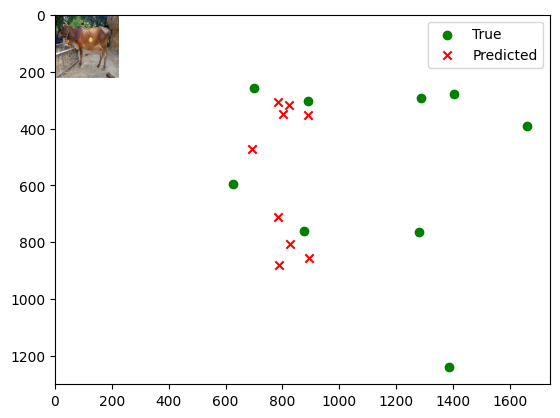

Image number: 244
True keypoints: [ 633.  320. 1666.  432.  642.  645.  840.  307.  866.  801. 1334.  274.
 1350.  710. 1441.  261. 1452. 1278.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[784.836   340.11563]
 [677.5076  460.58142]
 [766.6467  693.6679 ]
 [870.15765 342.4773 ]
 [871.32367 834.2404 ]
 [801.83704 308.64594]
 [805.06104 787.0344 ]
 [764.16437 296.19604]
 [768.7295  861.0277 ]]


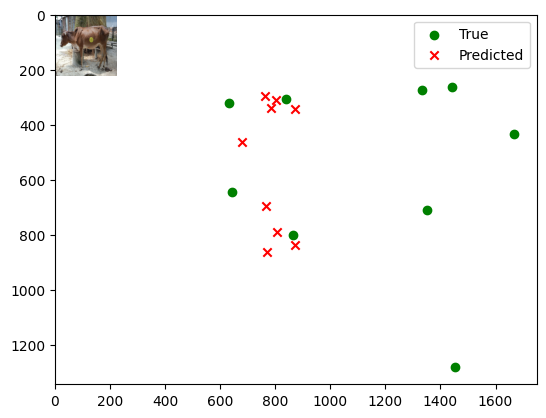

Image number: 245
True keypoints: [1265.  238.  309.  393. 1334.  595. 1066.  272. 1093.  767.  615.  247.
  624.  724.  511.  240.  534. 1288.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[686.4706  294.50864]
 [580.9488  401.7569 ]
 [671.85236 608.15076]
 [755.55316 295.64404]
 [756.63086 726.3457 ]
 [692.56573 262.34628]
 [695.6494  686.9419 ]
 [657.98535 250.32965]
 [662.46686 747.29755]]


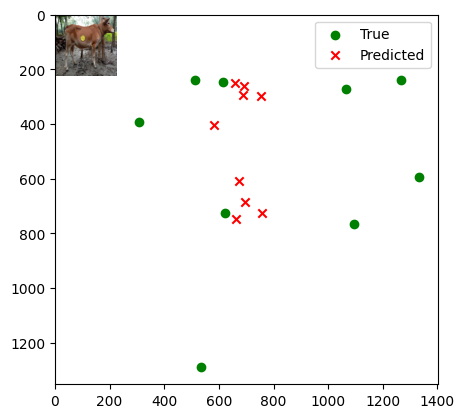

Image number: 246
True keypoints: [ 743.  306. 1703.  337.  728.  599.  948.  297.  975.  745. 1375.  237.
 1379.  661. 1468.  213. 1462. 1152.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[745.8914  321.26697]
 [641.95233 436.83975]
 [728.8486  659.0746 ]
 [825.589   323.58255]
 [826.75024 792.0151 ]
 [760.2297  290.3431 ]
 [763.3171  747.29333]
 [724.2068  278.15836]
 [728.7249  816.9259 ]]


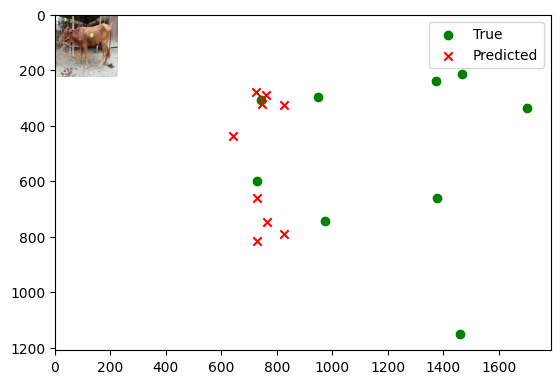

Image number: 247
True keypoints: [ 692.  284. 1720.  420.  701.  638.  897.  261.  934.  764. 1396.  250.
 1410.  707. 1502.  240. 1538. 1257.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[771.33496 332.47766]
 [664.1374  451.78256]
 [753.6548  681.5485 ]
 [853.89215 334.86652]
 [854.9564  819.0779 ]
 [786.3672  300.55072]
 [789.4412  772.9038 ]
 [749.0724  288.02948]
 [753.82715 844.9709 ]]


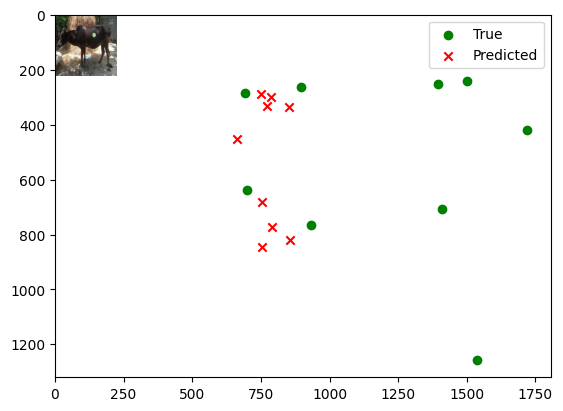

Image number: 248
True keypoints: [1098.  459.  239.  482. 1086.  773.  884.  442.  879.  870.  501.  373.
  504.  795.  445.  367.  462. 1230.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[805.01874 351.75635]
 [694.7016  473.8825 ]
 [786.3469  712.3921 ]
 [893.4403  353.75494]
 [894.62805 856.2241 ]
 [822.996   319.93045]
 [826.49365 808.1603 ]
 [784.32654 307.45688]
 [788.75024 883.92896]]


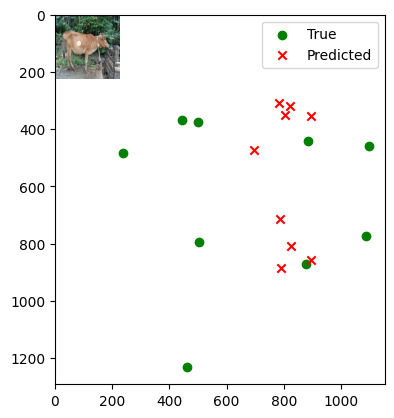

Image number: 249
True keypoints: [ 684.  401. 1560.  514.  686.  697.  880.  413.  899.  874. 1293.  386.
 1311.  789. 1355.  381. 1386. 1296.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[819.0208  357.11774]
 [709.10345 481.67493]
 [799.7982  724.1276 ]
 [909.6256  359.53094]
 [910.7461  871.4908 ]
 [838.69116 325.35498]
 [842.10895 822.11255]
 [799.6741  312.73605]
 [804.2358  900.0663 ]]


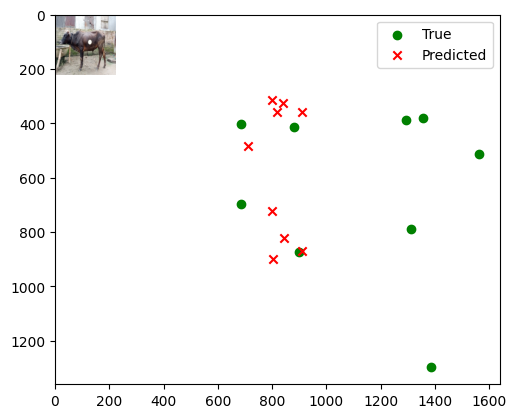

Image number: 250
True keypoints: [ 759.  287. 1742.  373.  709.  633.  953.  299.  980.  785. 1400.  268.
 1410.  723. 1493.  240. 1547. 1253.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[749.2097  322.48703]
 [643.4551  438.65298]
 [732.2294  662.1788 ]
 [828.6143  324.6682 ]
 [829.72656 795.14197]
 [762.5938  290.86414]
 [765.6518  750.48846]
 [726.17316 278.52197]
 [730.81836 819.9137 ]]


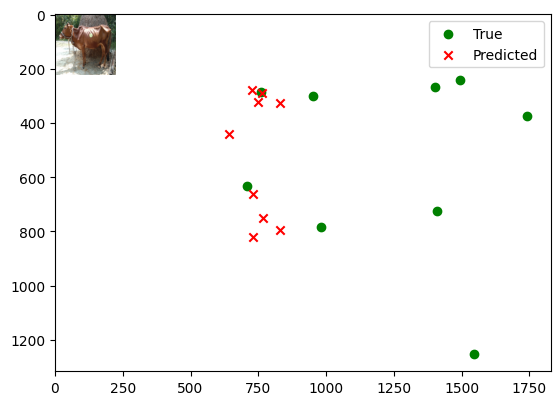

Image number: 251
True keypoints: [1203.  300.  239.  353. 1257.  625.  985.  330.  984.  782.  538.  255.
  543.  732.  455.  224.  472. 1144.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[772.5907  333.82166]
 [665.82    452.92438]
 [754.80975 682.78546]
 [855.78955 336.13885]
 [856.8689  820.72534]
 [788.2489  302.19193]
 [791.39966 774.3953 ]
 [750.99036 289.76273]
 [755.644   846.80457]]


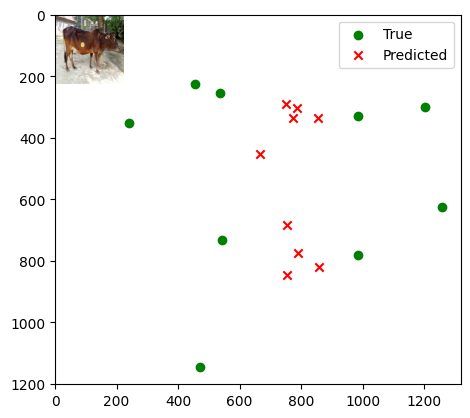

Image number: 252
True keypoints: [1267.  327.  135.  434. 1270.  691. 1028.  319. 1014.  815.  497.  242.
  516.  728.  399.  222.  443. 1296.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[779.3861  337.3213 ]
 [672.5729  457.18814]
 [761.3751  688.7932 ]
 [863.88806 339.70932]
 [865.0078  828.29315]
 [795.9577  305.87735]
 [799.16797 781.4502 ]
 [758.5338  293.45547]
 [763.13293 854.81244]]


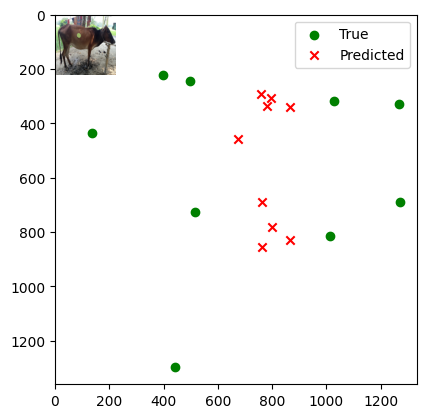

Image number: 253
True keypoints: [ 729.  252. 1715.  315.  671.  586.  896.  245.  910.  754. 1367.  208.
 1382.  676. 1460.  192. 1479. 1305.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[711.2241  304.39825]
 [610.11835 415.60492]
 [695.16077 628.21826]
 [785.72534 306.6069 ]
 [786.84265 754.28406]
 [722.9856  273.81195]
 [725.92194 711.8131 ]
 [688.35205 261.81302]
 [692.88806 777.49756]]


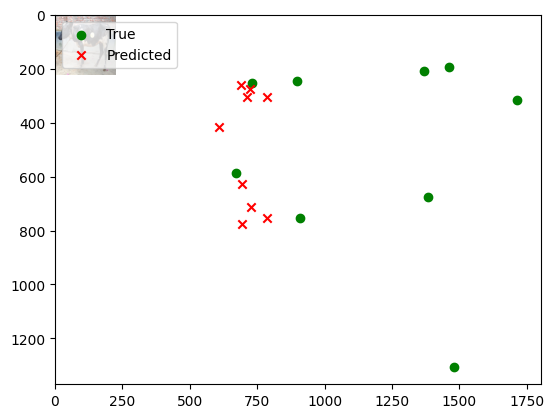

Image number: 254
True keypoints: [ 710.  282. 1651.  430.  713.  659.  934.  310.  943.  824. 1380.  277.
 1366.  747. 1458.  268. 1426. 1277.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[791.41516 343.21548]
 [683.7313  464.56708]
 [773.02686 699.4857 ]
 [877.7824  345.64297]
 [878.891   841.3983 ]
 [808.9662  311.6856 ]
 [812.22504 793.7669 ]
 [771.0521  299.20712]
 [775.6415  868.5446 ]]


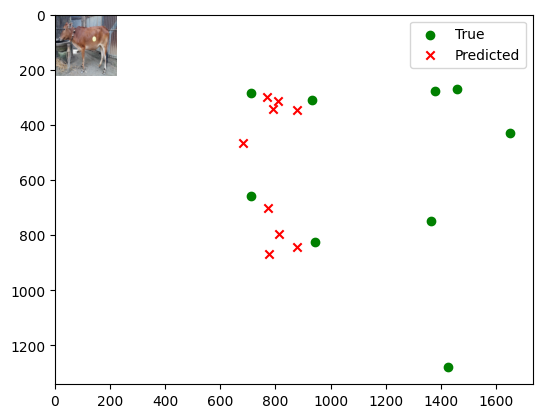

Image number: 255
True keypoints: [ 660.  219. 1663.  345.  607.  553.  836.  237.  847.  744. 1319.  221.
 1334.  688. 1407.  204. 1434. 1164.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[749.91644 322.95853]
 [645.74384 439.1583 ]
 [732.75146 662.56476]
 [830.11194 325.3126 ]
 [831.1868  796.2903 ]
 [764.4528  291.9001 ]
 [767.5432  751.3273 ]
 [728.26056 279.63828]
 [732.85645 821.3958 ]]


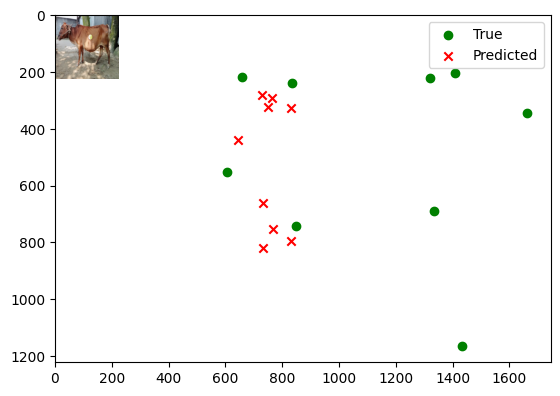

Image number: 256
True keypoints: [ 640.  229. 1659.  369.  610.  586.  847.  241.  857.  766. 1331.  213.
 1331.  687. 1438.  204. 1442. 1166.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[673.1191  287.96484]
 [570.4909  393.48563]
 [658.6885  595.8875 ]
 [740.8833  289.28018]
 [741.9624  712.2242 ]
 [679.4457  256.5825 ]
 [682.44165 673.335  ]
 [645.70844 244.7567 ]
 [650.1313  732.88416]]


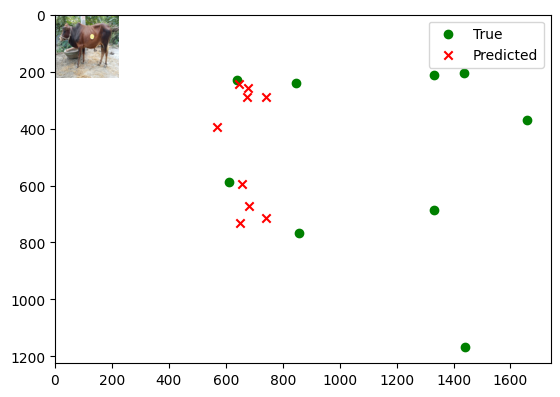

Image number: 257
True keypoints: [ 666.  305. 1788.  486.  602.  679.  865.  313.  875.  829. 1414.  273.
 1405.  794. 1520.  274. 1509. 1262.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[780.50134 337.83505]
 [673.4348  457.85873]
 [762.48303 689.81537]
 [865.0919  340.19986]
 [866.2101  829.4693 ]
 [797.0451  306.32034]
 [800.2396  782.564  ]
 [759.53424 293.8714 ]
 [764.1281  856.0055 ]]


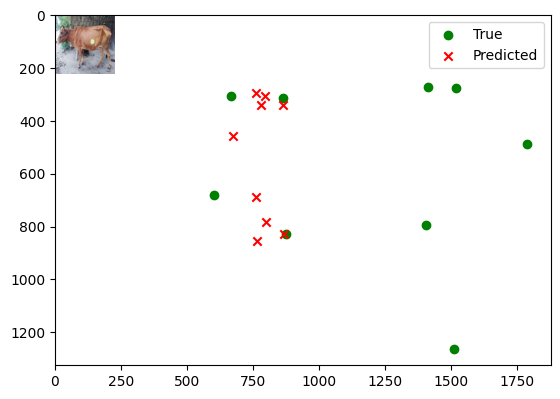

Image number: 258
True keypoints: [ 698.  382. 1609.  500.  717.  698.  882.  373.  910.  824. 1341.  316.
 1345.  726. 1422.  313. 1419. 1197.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[836.232   365.19006]
 [724.946   492.06348]
 [816.5066  739.35864]
 [929.3054  367.69205]
 [930.41724 890.1129 ]
 [857.0868  333.17685]
 [860.5587  839.6566 ]
 [817.36444 320.43265]
 [821.9807  919.52936]]


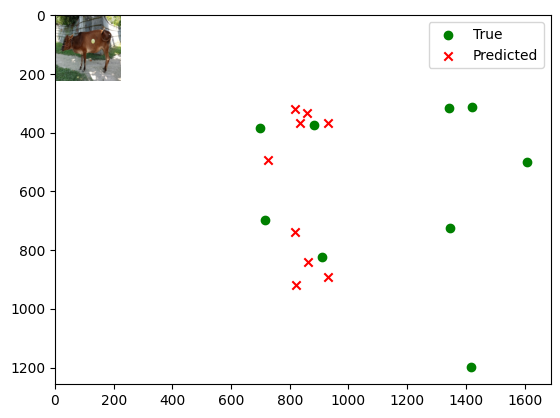

Image number: 259
True keypoints: [ 649.  166. 1638.  318.  620.  466.  860.  185.  860.  648. 1319.  176.
 1311.  598. 1413.  160. 1407. 1053.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[718.2298  308.33066]
 [616.95355 420.18396]
 [701.9752  634.5607 ]
 [794.1497  310.55362]
 [795.30884 762.15625]
 [730.9508  277.95544]
 [733.9726  719.1823 ]
 [696.11914 265.9839 ]
 [700.5357  785.8088 ]]


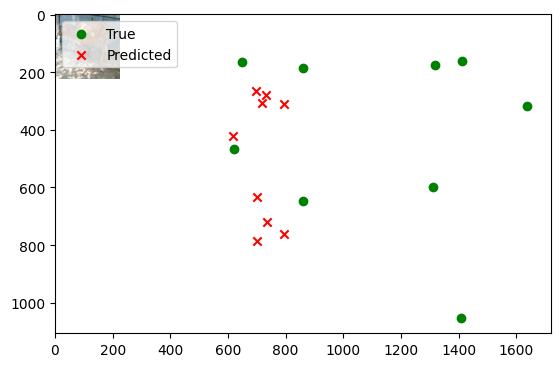

Image number: 260
True keypoints: [1211.  261.  327.  376. 1261.  564. 1054.  266. 1047.  723.  653.  211.
  643.  663.  551.  201.  556. 1130.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[602.06946 257.09155]
 [498.69714 352.1099 ]
 [590.3315  535.03577]
 [657.99896 256.98373]
 [659.084   634.2036 ]
 [599.7593  224.9266 ]
 [602.8049  601.58575]
 [567.95514 213.57846]
 [572.0929  650.4312 ]]


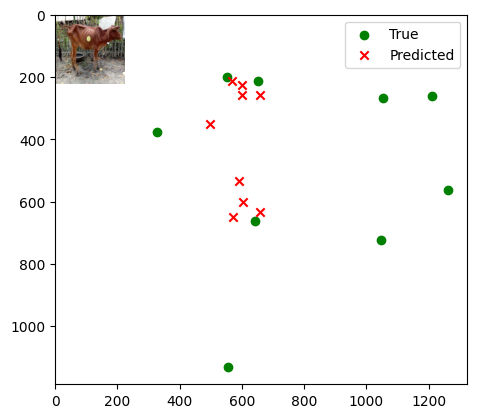

Image number: 261
True keypoints: [1217.  251.  185.  290. 1283.  620. 1036.  264. 1024.  772.  568.  170.
  557.  671.  451.  138.  487. 1167.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[655.2566  280.93866]
 [551.2486  383.50604]
 [641.6042  581.0541 ]
 [719.83765 281.6676 ]
 [720.8545  692.46027]
 [658.7301  249.0173 ]
 [661.8256  655.4838 ]
 [625.3304  237.3466 ]
 [629.66614 711.8374 ]]


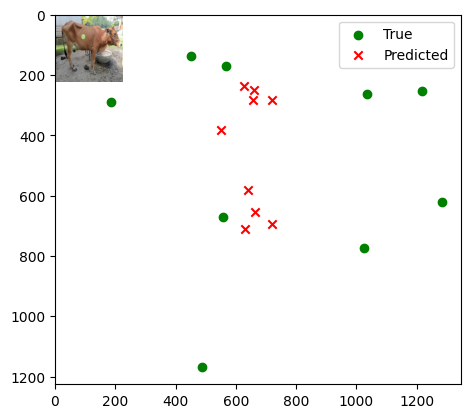

Image number: 262
True keypoints: [1205.  246.  233.  345. 1261.  587. 1021.  243. 1018.  733.  535.  180.
  537.  648.  455.  177.  469. 1121.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[662.87354 283.8921 ]
 [560.2305  387.69666]
 [648.78864 587.1949 ]
 [729.0956  284.96408]
 [730.16626 701.0691 ]
 [668.0886  252.4588 ]
 [671.1501  663.0947 ]
 [634.6675  240.78262]
 [639.0285  721.13385]]


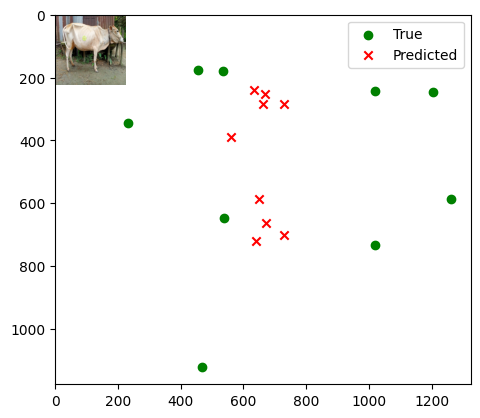

Image number: 263
True keypoints: [ 664.  286. 1735.  384.  615.  684.  864.  319.  872.  837. 1379.  268.
 1384.  760. 1462.  263. 1449. 1282.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[804.5954  348.8431 ]
 [695.42413 472.24716]
 [785.88794 711.08154]
 [892.48627 351.37012]
 [893.50256 855.4084 ]
 [822.563   316.82706]
 [825.8471  807.0067 ]
 [784.0496  304.1706 ]
 [788.7656  883.10205]]


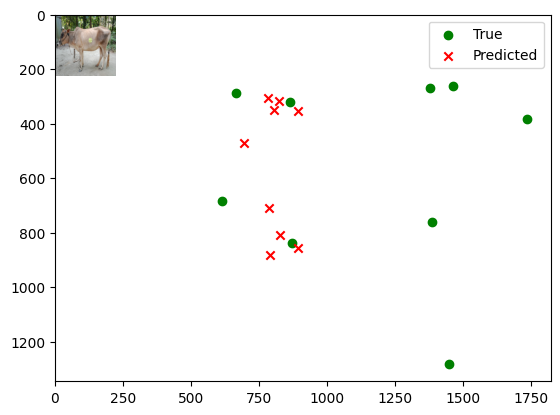

Image number: 264
True keypoints: [1205.  321.  201.  442. 1185.  655.  947.  326.  963.  833.  532.  306.
  535.  790.  411.  297.  416. 1288.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[768.56525 332.69934]
 [662.037   450.87006]
 [750.8898  679.4216 ]
 [851.4364  334.8869 ]
 [852.65204 816.5644 ]
 [784.1887  301.32623]
 [787.3722  770.5158 ]
 [747.09564 289.02353]
 [751.60626 842.4883 ]]


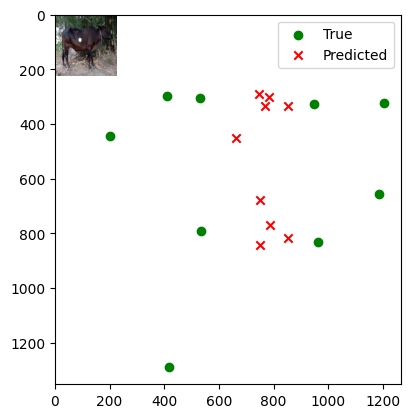

Image number: 265
True keypoints: [ 731.  372. 1656.  378.  681.  742.  930.  356.  976.  827. 1353.  303.
 1368.  750. 1453.  282. 1487. 1259.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[787.6472  341.06116]
 [679.8539  462.091  ]
 [769.40594 696.094  ]
 [873.1616  343.47827]
 [874.30286 837.1255 ]
 [804.59216 309.3714 ]
 [807.77795 789.79645]
 [766.74445 296.85388]
 [771.3853  864.0149 ]]


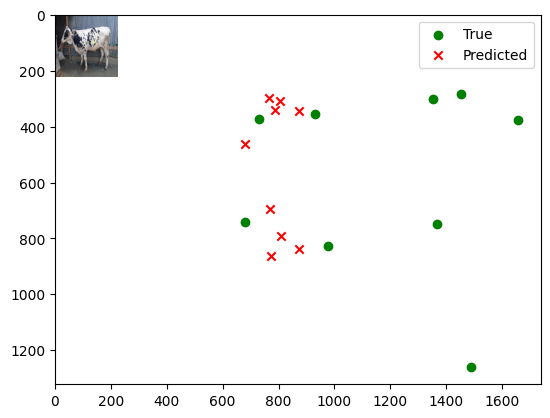

Image number: 266
True keypoints: [ 677.  424. 1661.  499.  678.  734.  888.  421.  921.  904. 1384.  355.
 1411.  835. 1438.  353. 1481. 1255.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[855.5313  375.965  ]
 [743.5002  504.589  ]
 [835.1494  756.7334 ]
 [952.3273  378.39035]
 [953.4994  911.60236]
 [878.76544 344.32318]
 [882.4448  859.8179 ]
 [838.3976  331.64117]
 [842.7871  942.22736]]


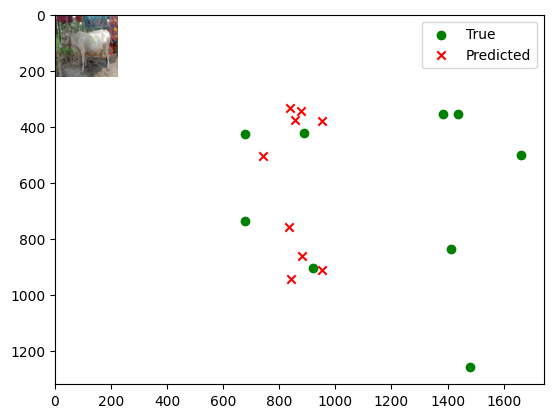

Image number: 267
True keypoints: [ 733.  305. 1546.  411.  680.  636.  894.  330.  894.  762. 1283.  296.
 1291.  706. 1351.  283. 1370. 1246.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[793.60187 344.27505]
 [685.5377  465.90234]
 [775.1564  701.43884]
 [880.19617 346.67294]
 [881.33203 843.724  ]
 [811.1821  312.64423]
 [814.45667 795.9742 ]
 [773.14453 300.13504]
 [777.7428  870.94885]]


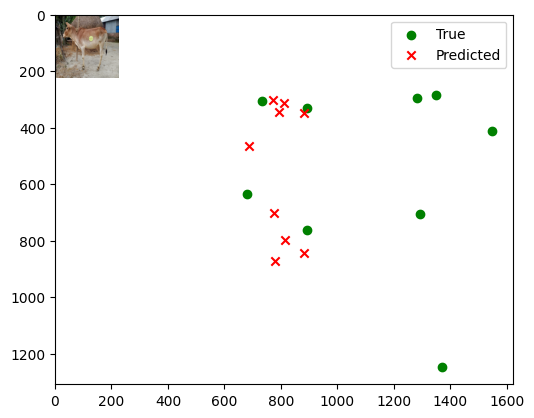

Image number: 268
True keypoints: [1138.  411.  408.  457. 1190.  657. 1015.  410. 1001.  784.  649.  365.
  635.  717.  574.  357.  563. 1111.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[786.9288  342.53418]
 [677.6702  462.6129 ]
 [768.8513  696.2949 ]
 [872.34564 344.46973]
 [873.4399  836.3519 ]
 [803.14325 310.58008]
 [806.5376  789.5331 ]
 [765.13837 298.14633]
 [769.6532  863.0607 ]]


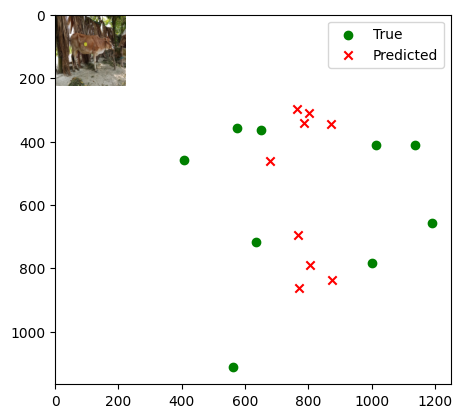

Image number: 269
True keypoints: [ 608.  337. 1558.  509.  555.  651.  775.  344.  786.  791. 1253.  324.
 1251.  759. 1360.  329. 1364. 1232.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[824.0984  358.73676]
 [713.3336  484.36554]
 [804.7843  728.496  ]
 [915.00977 361.23483]
 [916.0729  876.6948 ]
 [843.6137  326.57843]
 [846.9917  827.05615]
 [804.2916  313.84183]
 [808.98303 905.38275]]


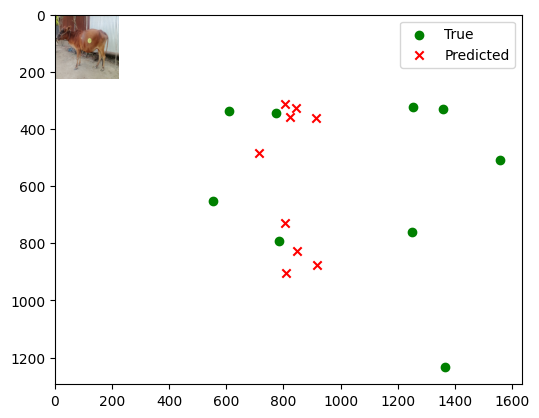

Image number: 270
True keypoints: [1266.  348.  150.  404. 1272.  699. 1037.  350. 1021.  856.  552.  304.
  548.  836.  391.  282.  429. 1266.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[767.7168  332.4375 ]
 [659.0275  450.5056 ]
 [750.3401  679.1988 ]
 [849.6218  334.3374 ]
 [850.7102  815.0873 ]
 [781.6693  300.25598]
 [784.92163 769.6266 ]
 [744.27563 287.79865]
 [748.8613  840.56195]]


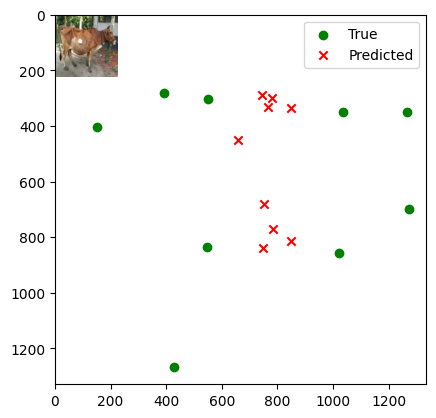

Image number: 271
True keypoints: [ 743.  314. 1568.  391.  742.  609.  938.  311.  963.  733. 1333.  274.
 1331.  662. 1406.  271. 1426. 1143.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[788.07104 340.9436 ]
 [680.0586  462.18384]
 [769.8258  696.42194]
 [873.4488  343.3647 ]
 [874.50244 837.44934]
 [804.76294 309.05524]
 [807.9505  790.11194]
 [766.85895 296.48926]
 [771.5972  864.2831 ]]


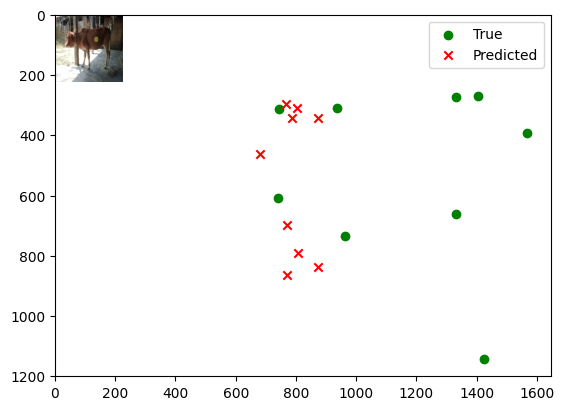

Image number: 272
True keypoints: [ 710.  276. 1735.  440.  679.  616.  937.  279.  941.  785. 1384.  266.
 1373.  722. 1477.  250. 1413. 1346.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[769.7162  331.81567]
 [663.29034 450.8701 ]
 [752.0419  680.0588 ]
 [852.3346  334.24783]
 [853.3612  817.4806 ]
 [785.05597 300.14612]
 [788.1655  771.31274]
 [747.94525 287.67212]
 [752.6658  843.4095 ]]


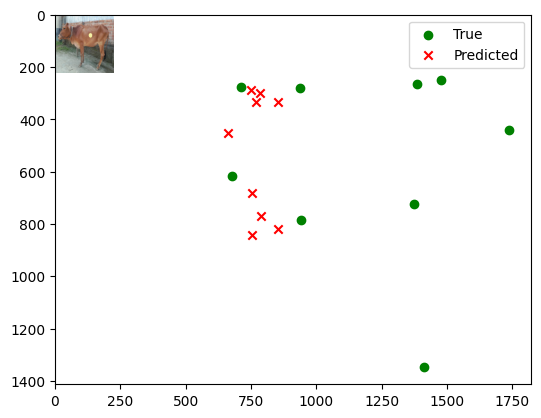

Image number: 273
True keypoints: [ 663.  305. 1564.  425.  648.  602.  827.  285.  846.  733. 1242.  243.
 1260.  669. 1359.  244. 1381. 1179.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[754.3386  326.12415]
 [650.1911  442.38364]
 [736.9815  666.67426]
 [835.75867 328.41418]
 [837.0036  801.4895 ]
 [769.87134 295.47568]
 [773.078   756.1503 ]
 [733.5871  283.35614]
 [737.95825 826.9659 ]]


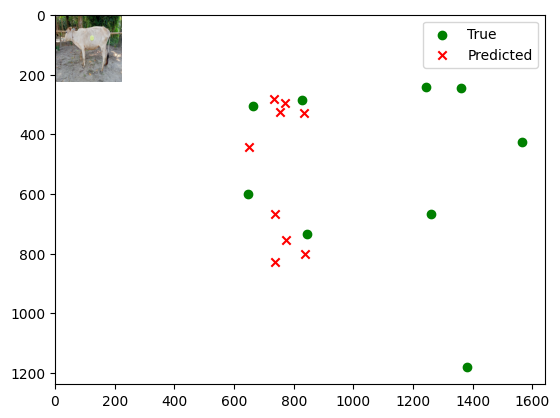

Image number: 274
True keypoints: [1187.  375.  232.  480. 1212.  635. 1007.  374. 1013.  818.  535.  363.
  542.  807.  444.  345.  478. 1307.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[837.2895  366.2771 ]
 [726.41003 493.02216]
 [817.50073 740.37885]
 [930.9598  368.76617]
 [932.08575 891.5213 ]
 [858.7428  334.59918]
 [862.29987 840.9071 ]
 [819.0927  321.9383 ]
 [823.5648  921.146  ]]


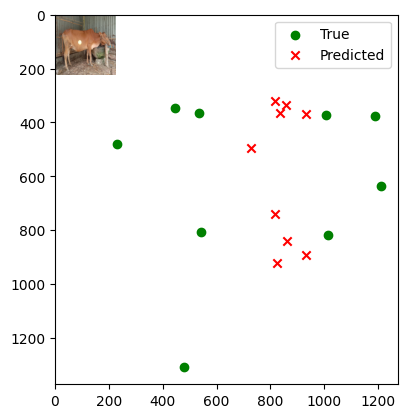

Image number: 275
True keypoints: [1171.  365.  350.  444. 1187.  661.  984.  357.  979.  764.  606.  312.
  608.  682.  529.  312.  521. 1179.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[762.8582  331.43466]
 [652.75415 448.27496]
 [745.7871  675.5764 ]
 [843.8284  332.93402]
 [844.97656 809.69086]
 [775.61365 298.96338]
 [778.9856  764.98804]
 [738.1385  286.55133]
 [742.58954 834.67163]]


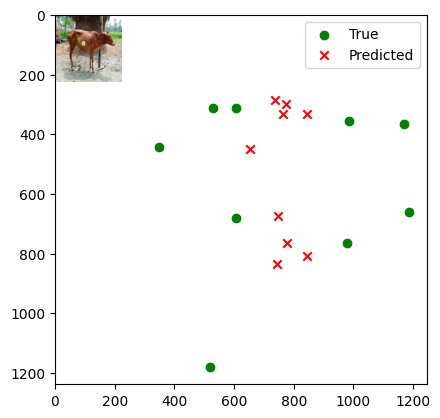

Image number: 276
True keypoints: [ 709.  209. 1697.  402.  654.  639.  895.  233.  900.  778. 1402.  223.
 1392.  721. 1495.  222. 1499. 1302.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[738.03375 316.7047 ]
 [634.3507  431.65125]
 [721.261   651.93945]
 [816.1223  319.04483]
 [817.18506 783.1762 ]
 [751.2901  285.5369 ]
 [754.28253 739.0126 ]
 [715.49963 273.27673]
 [720.13763 807.58765]]


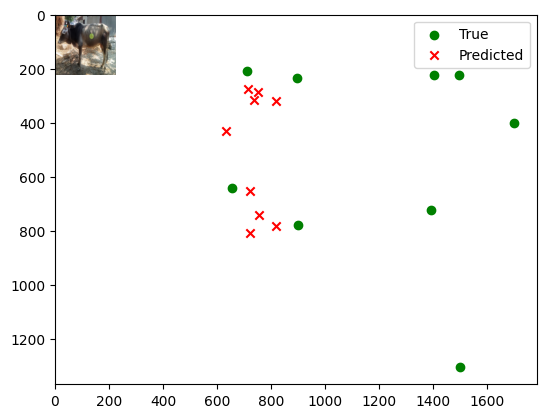

Image number: 277
True keypoints: [1227.  313.  316.  409. 1252.  630. 1041.  330. 1047.  768.  611.  290.
  639.  749.  541.  266.  561. 1237.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[744.532   321.7459 ]
 [631.9315  436.761  ]
 [728.4027  659.8652 ]
 [820.914   322.89304]
 [821.9184  788.5774 ]
 [752.9371  287.85202]
 [756.2056  745.91144]
 [715.5763  275.27945]
 [720.34216 811.9084 ]]


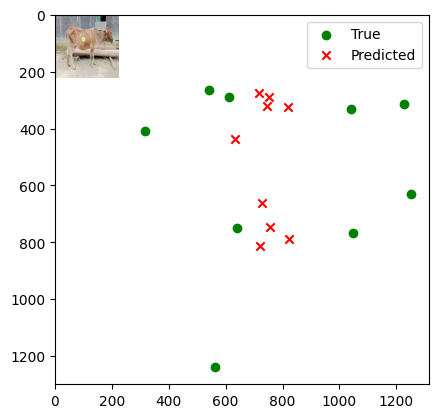

Image number: 278
True keypoints: [ 541.  335. 1523.  459.  563.  651.  782.  315.  790.  801. 1253.  300.
 1248.  750. 1331.  300. 1318. 1306.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[779.65955 338.257  ]
 [673.2263  457.75732]
 [761.54346 689.14624]
 [864.6537  340.5885 ]
 [865.878   828.8673 ]
 [796.81085 307.1574 ]
 [800.0846  781.97034]
 [759.43555 294.84763]
 [763.8943  855.56177]]


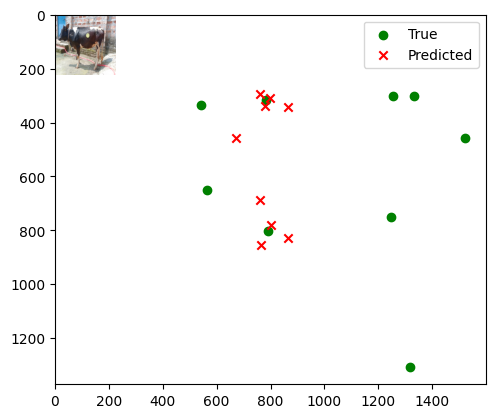

Image number: 279
True keypoints: [ 692.  217. 1622.  366.  712.  603.  908.  234.  934.  698. 1342.  234.
 1355.  648. 1403.  227. 1428. 1137.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[761.65076 329.52362]
 [656.9977  446.75677]
 [744.08234 673.1288 ]
 [844.10504 331.83508]
 [845.3126  809.3928 ]
 [777.682   298.7627 ]
 [780.9017  763.5774 ]
 [741.1134  286.55164]
 [745.54504 835.2058 ]]


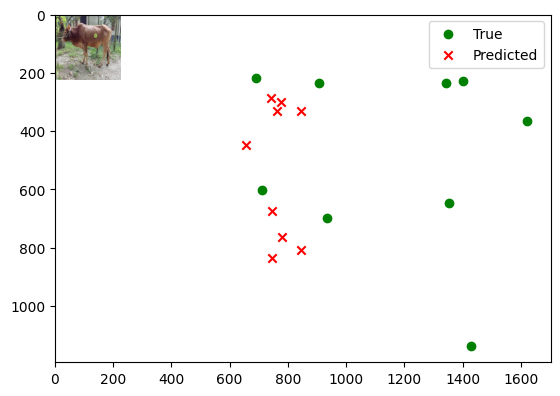

Image number: 280
True keypoints: [ 744.  334. 1775.  430.  742.  669.  967.  344.  984.  828. 1404.  306.
 1412.  772. 1505.  288. 1484. 1205.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[798.27936 346.47253]
 [689.7939  468.72467]
 [779.7029  705.58527]
 [885.5198  348.8895 ]
 [886.6591  848.78345]
 [816.15955 314.78833]
 [819.44086 800.7243 ]
 [777.9332  302.24176]
 [782.53613 876.22253]]


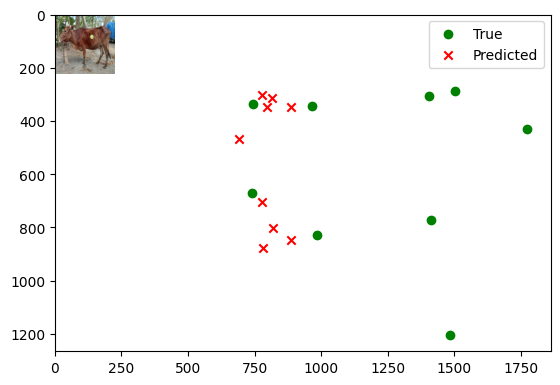

Image number: 281
True keypoints: [1159.  277.  353.  348. 1163.  574.  944.  245.  948.  685.  597.  225.
  610.  660.  508.  230.  560. 1172.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[766.38904 330.4969 ]
 [660.23236 448.98245]
 [748.80383 677.1887 ]
 [848.62103 332.88678]
 [849.6481  813.91125]
 [781.5652  298.91577]
 [784.69055 768.0276 ]
 [744.60046 286.50037]
 [749.272   839.7367 ]]


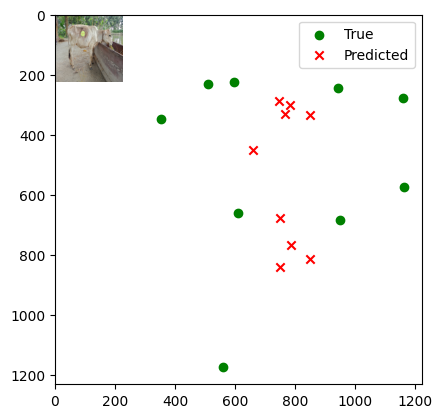

Image number: 282
True keypoints: [ 715.  311. 1636.  373.  674.  623.  873.  310.  901.  739. 1309.  254.
 1324.  664. 1425.  232. 1449. 1183.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[768.71747 332.7114 ]
 [662.913   450.93912]
 [750.96704 679.4129 ]
 [851.8812  335.00165]
 [853.08527 816.87634]
 [784.82056 301.5909 ]
 [788.01965 770.6917 ]
 [747.83496 289.28595]
 [752.3261  842.9233 ]]


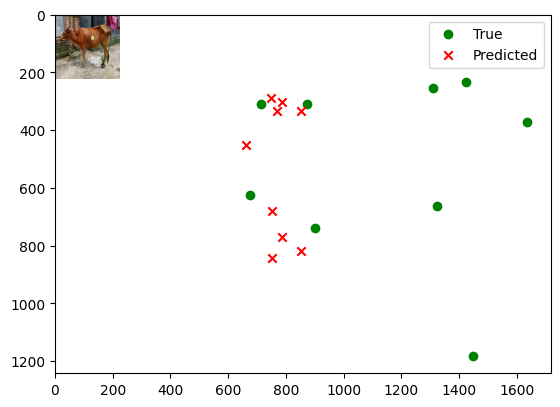

Image number: 283
True keypoints: [ 754.  280. 1727.  459.  708.  575.  930.  289.  933.  738. 1378.  288.
 1372.  716. 1494.  275. 1492. 1247.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[786.71497 340.2844 ]
 [679.1292  461.37625]
 [768.50775 695.1952 ]
 [872.0343  342.75122]
 [873.04297 836.03   ]
 [803.5048  308.52786]
 [806.7071  788.76587]
 [765.7174  295.995  ]
 [770.43066 862.8628 ]]


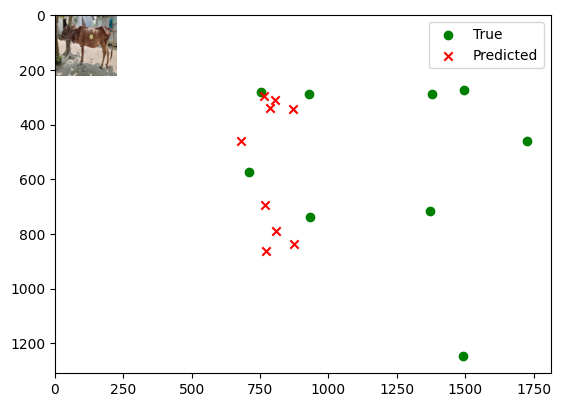

Image number: 284
True keypoints: [ 710.  276. 1725.  423.  646.  589.  900.  300.  916.  779. 1383.  309.
 1394.  783. 1485.  282. 1494. 1228.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[791.11255 343.35715]
 [683.44336 464.53214]
 [772.71625 699.27374]
 [877.5244  345.74377]
 [878.7075  841.1482 ]
 [808.7482  311.9256 ]
 [812.03577 793.5173 ]
 [770.85144 299.47208]
 [775.37994 868.29425]]


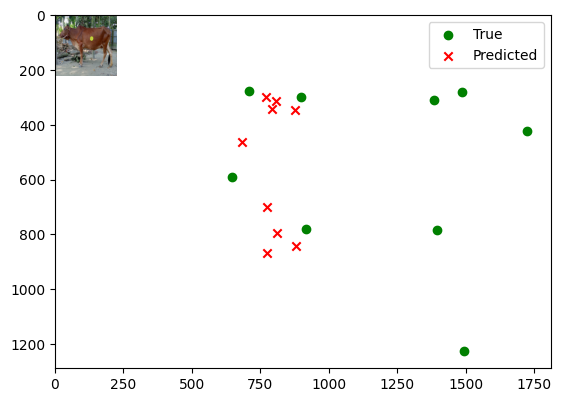

Image number: 285
True keypoints: [ 761.  308. 1681.  403.  742.  587.  949.  287.  944.  754. 1364.  262.
 1355.  735. 1451.  245. 1420. 1229.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[800.9258  347.47928]
 [692.10565 470.19617]
 [782.29736 707.9001 ]
 [888.4266  349.9256 ]
 [889.50586 851.5508 ]
 [818.80804 315.61145]
 [822.0939  803.3631 ]
 [780.45135 303.0332 ]
 [785.1126  879.0877 ]]


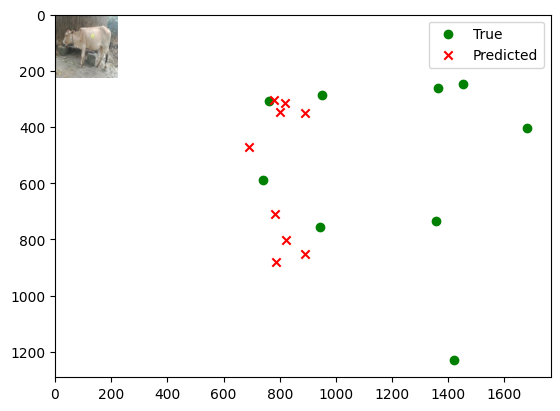

Image number: 286
True keypoints: [ 676.  298. 1731.  401.  676.  645.  908.  269.  941.  787. 1354.  226.
 1358.  752. 1485.  204. 1498. 1247.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[783.25696 339.151  ]
 [676.2784  459.53204]
 [765.1415  692.23065]
 [868.39166 341.5882 ]
 [869.4279  832.4868 ]
 [800.16266 307.67343]
 [803.3941  785.43066]
 [762.5905  295.2304 ]
 [767.2114  859.24426]]


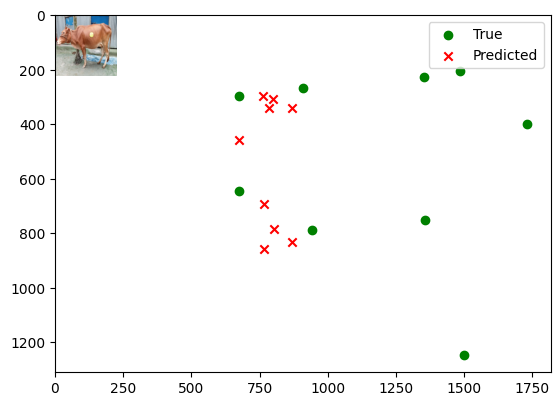

Image number: 287
True keypoints: [ 760.  247. 1697.  339.  752.  593.  965.  234.  985.  723. 1386.  206.
 1397.  639. 1463.  193. 1487. 1183.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[732.62573 314.7044 ]
 [629.6185  428.63742]
 [715.9948  647.2795 ]
 [810.2102  316.97214]
 [811.25244 777.46136]
 [745.7579  283.76544]
 [748.79736 733.6904 ]
 [710.2476  271.60675]
 [714.8356  801.70197]]


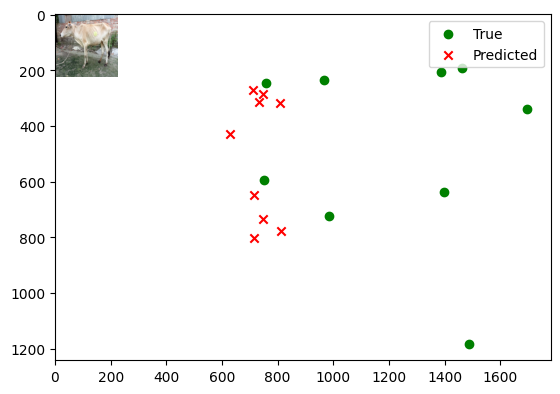

Image number: 288
True keypoints: [ 620.  296. 1794.  439.  685.  652.  927.  242.  947.  799. 1435.  241.
 1435.  740. 1538.  232. 1537. 1269.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[776.7962  335.53308]
 [669.8712  455.34927]
 [758.8867  686.4084 ]
 [860.59894 337.95538]
 [861.6717  825.2589 ]
 [792.8052  303.887  ]
 [795.9641  778.63806]
 [755.41473 291.41357]
 [760.09436 851.5818 ]]


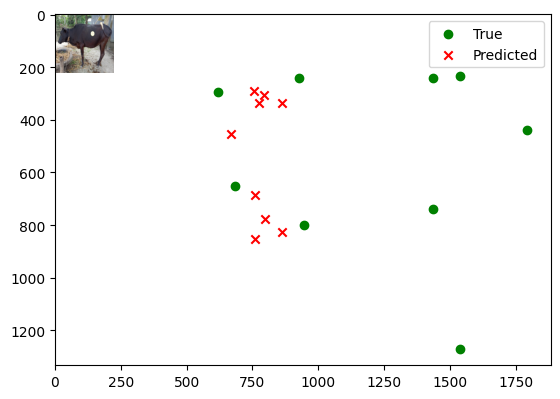

Image number: 289
True keypoints: [1279.  349.  327.  422. 1257.  656. 1084.  352. 1052.  827.  614.  284.
  602.  721.  543.  280.  525. 1182.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[812.81323 353.28455]
 [702.23773 477.473  ]
 [793.91895 718.61816]
 [901.7504  355.66226]
 [902.7855  864.2545 ]
 [830.9849  320.98083]
 [834.32117 815.4985 ]
 [792.0137  308.26852]
 [796.7259  892.2555 ]]


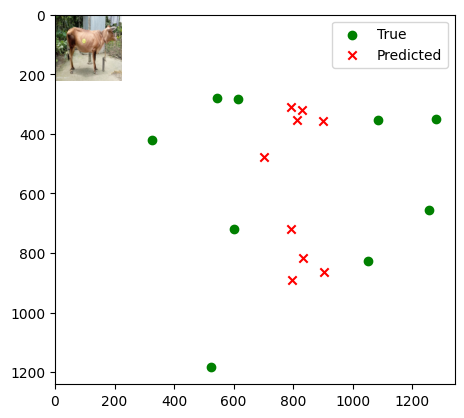

Image number: 290
True keypoints: [ 674.  286. 1783.  340.  695.  616.  922.  263.  933.  787. 1479.  226.
 1472.  683. 1585.  210. 1573. 1236.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[777.1724  336.40198]
 [671.0554  455.95395]
 [759.1891  686.8243 ]
 [861.63477 338.8224 ]
 [862.7008  826.01416]
 [793.944   305.17645]
 [797.18665 779.27075]
 [756.6841  292.8098 ]
 [761.249   852.52734]]


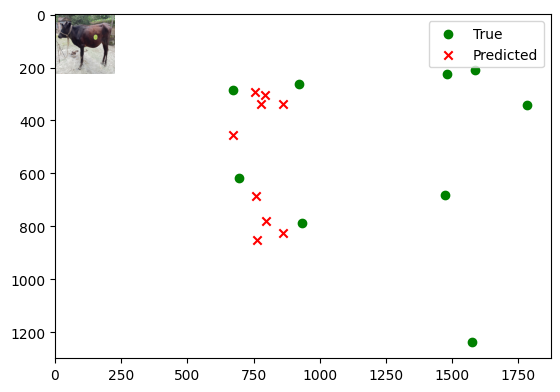

Image number: 291
True keypoints: [ 694.  276. 1656.  382.  689.  598.  882.  269.  920.  728. 1316.  235.
 1329.  709. 1428.  221. 1449. 1095.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[738.3902  317.5267 ]
 [634.30023 432.18207]
 [721.6167  652.4583 ]
 [816.59406 319.7233 ]
 [817.7869  783.64087]
 [751.63965 286.38983]
 [754.68225 739.5367 ]
 [715.79517 274.19858]
 [720.34216 808.04803]]


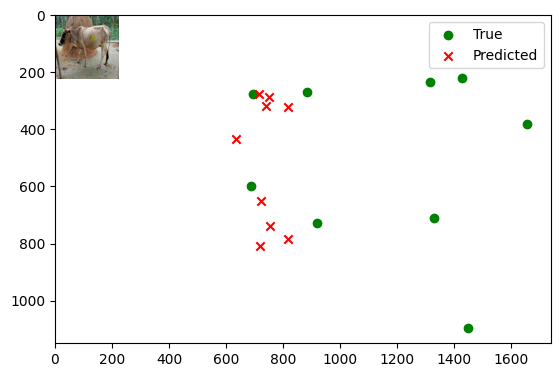

Image number: 292
True keypoints: [ 698.  212. 1755.  309.  752.  557.  954.  185.  986.  704. 1423.  120.
 1442.  599. 1533.  117. 1573. 1232.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[739.7595  318.92987]
 [636.49426 433.38998]
 [722.8634  653.7206 ]
 [818.8103  321.16837]
 [820.0267  785.5331 ]
 [753.95215 288.2873 ]
 [757.0663  741.1942 ]
 [718.22107 276.2333 ]
 [722.6286  810.21185]]


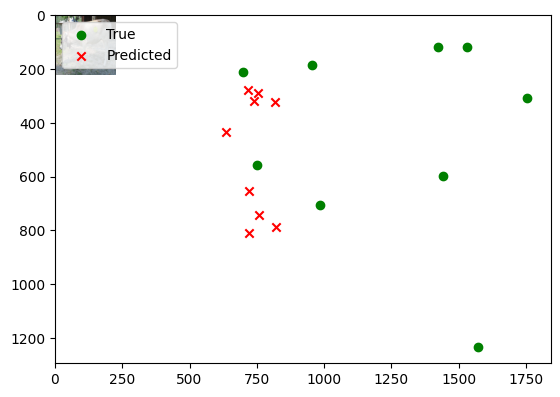

Image number: 293
True keypoints: [1169.  259.  220.  386. 1220.  573. 1004.  257.  999.  720.  550.  235.
  565.  672.  463.  226.  486. 1233.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[766.8104  330.5446 ]
 [659.4407  449.1553 ]
 [749.3388  677.75867]
 [848.56665 332.83853]
 [849.52136 814.02026]
 [781.1089  298.4529 ]
 [784.2148  768.38995]
 [743.9322  285.96875]
 [748.7213  839.6627 ]]


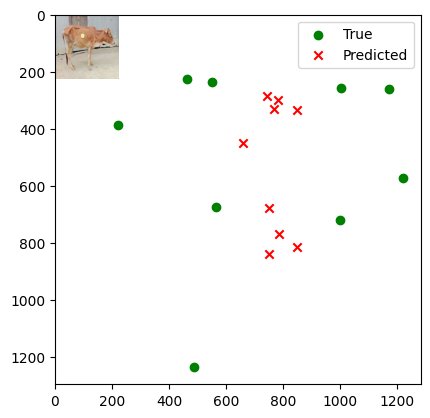

Image number: 294
True keypoints: [ 657.  314. 1672.  401.  685.  632.  897.  289.  915.  775. 1366.  240.
 1373.  697. 1478.  223. 1507. 1241.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[743.5729  320.19104]
 [638.161   435.43   ]
 [726.77356 657.30115]
 [822.234   322.28433]
 [823.3867  789.0905 ]
 [756.5751  288.67865]
 [759.65405 744.8488 ]
 [720.3614  276.40225]
 [724.94165 813.5839 ]]


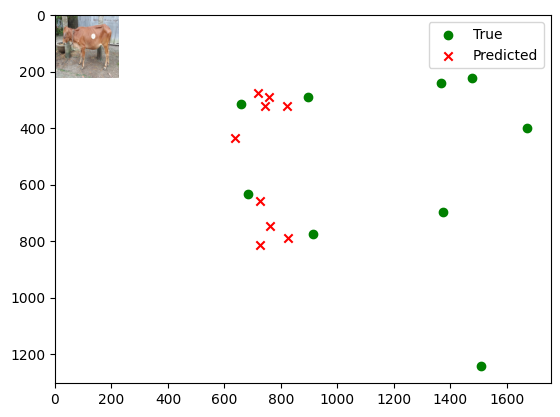

Image number: 295
True keypoints: [1195.  277.  228.  370. 1238.  602.  984.  257.  997.  753.  553.  223.
  567.  727.  456.  219.  491. 1279.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[759.0815  328.91052]
 [654.74615 445.52344]
 [741.55304 670.98486]
 [841.47473 331.1902 ]
 [842.7175  806.77496]
 [775.2309  298.35953]
 [778.5051  761.17975]
 [738.7967  286.29422]
 [743.0949  832.5934 ]]


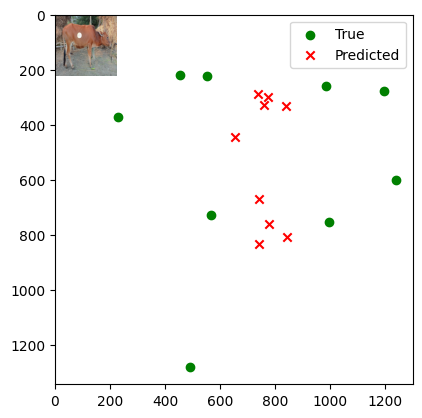

Image number: 296
True keypoints: [1315.  437.  483.  516. 1291.  721. 1103.  424. 1094.  834.  746.  382.
  751.  789.  674.  374.  677. 1245.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[830.27185 362.89484]
 [716.83215 488.7516 ]
 [810.99286 734.71545]
 [921.6041  364.98465]
 [922.6914  883.1249 ]
 [848.9944  330.10086]
 [852.5028  833.6304 ]
 [809.11316 317.30215]
 [813.7613  911.81384]]


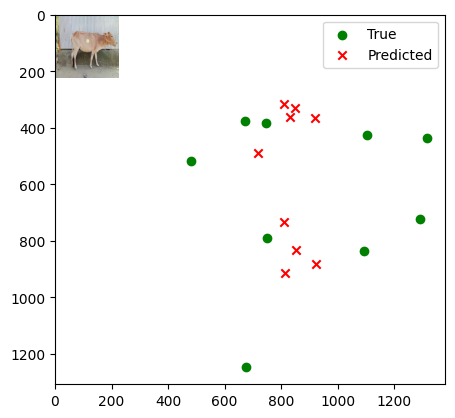

Image number: 297
True keypoints: [ 734.  338. 1725.  424.  725.  668.  933.  318.  952.  819. 1417.  252.
 1425.  719. 1498.  244. 1540. 1301.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[815.9802  355.0449 ]
 [706.0305  479.52206]
 [796.8883  721.3143 ]
 [905.8187  357.48428]
 [906.9156  867.99414]
 [835.08374 323.08597]
 [838.4362  818.8052 ]
 [796.11206 310.42334]
 [800.7697  896.2894 ]]


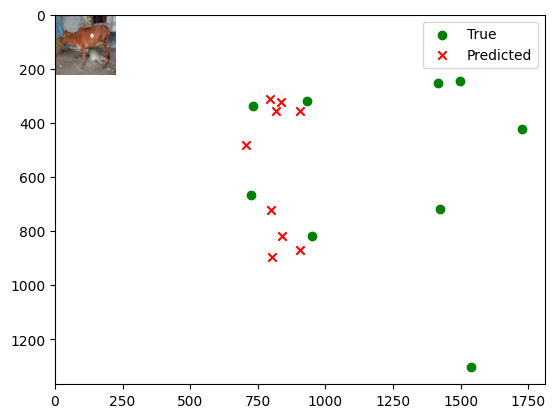

Image number: 298
True keypoints: [ 652.  361. 1614.  474.  586.  653.  851.  375.  851.  822. 1312.  329.
 1320.  758. 1403.  324. 1413. 1211.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[824.7597  360.15674]
 [714.6783  485.34677]
 [805.3479  729.2653 ]
 [916.47656 362.58047]
 [917.6244  877.867  ]
 [845.17126 328.49493]
 [848.6437  828.0885 ]
 [805.95605 315.88788]
 [810.44025 906.80164]]


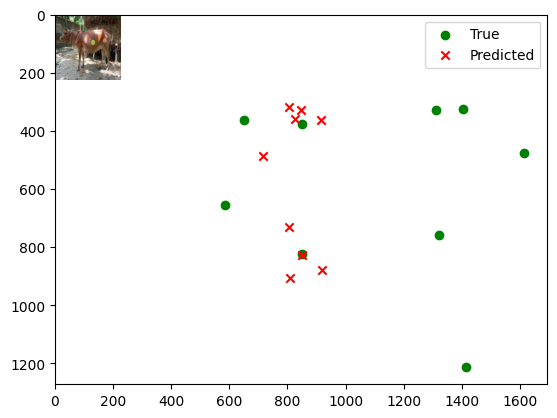

Image number: 299
True keypoints: [ 683.  255. 1672.  393.  686.  572.  912.  249.  911.  722. 1379.  236.
 1370.  649. 1455.  224. 1454. 1227.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[750.83575 324.00977]
 [645.0594  440.07465]
 [733.8521  663.91797]
 [830.80914 326.1019 ]
 [831.80145 797.06036]
 [764.5176  292.47128]
 [767.6745  752.4319 ]
 [728.05664 280.1833 ]
 [732.6431  821.99414]]


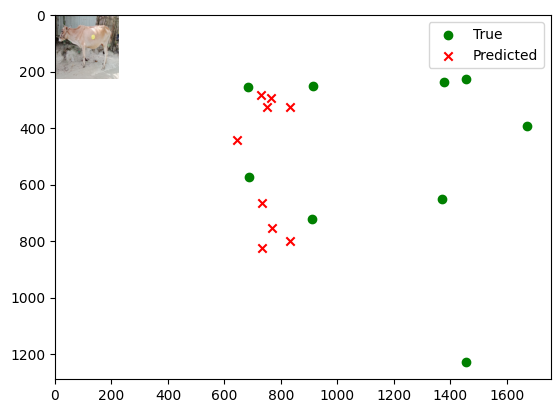

Image number: 300
True keypoints: [1136.  300.  237.  391. 1143.  624.  909.  286.  906.  766.  495.  261.
  508.  708.  425.  257.  452. 1155.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[788.6333  342.24738]
 [678.4475  463.09268]
 [770.62085 697.6454 ]
 [873.6089  344.28745]
 [874.65796 837.7778 ]
 [804.13855 309.80762]
 [807.44226 790.92535]
 [765.9167  297.19678]
 [770.5934  864.3422 ]]


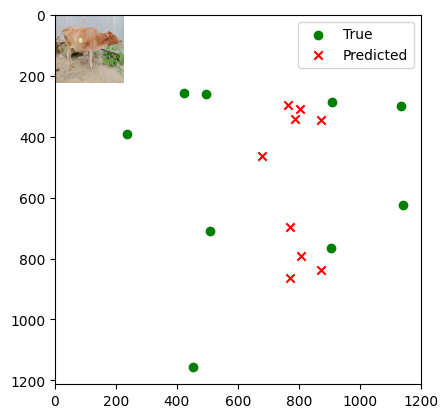

Image number: 301
True keypoints: [1219.  332.  363.  429. 1270.  664. 1042.  363. 1048.  809.  646.  300.
  655.  749.  535.  286.  552. 1245.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[762.4528  330.72974]
 [653.4202  447.73703]
 [745.28107 674.86346]
 [843.57745 332.42853]
 [844.7625  809.4052 ]
 [775.7676  298.55228]
 [779.07043 764.4431 ]
 [738.46765 286.15567]
 [742.96655 834.5073 ]]


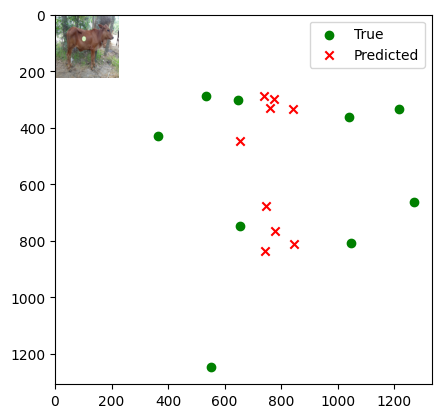

Image number: 302
True keypoints: [ 677.  296. 1602.  445.  640.  606.  852.  299.  856.  758. 1318.  286.
 1305.  707. 1400.  269. 1375. 1247.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[792.84357 344.6702 ]
 [685.3293  465.82996]
 [774.37494 700.89276]
 [879.8142  347.0152 ]
 [881.01263 843.21375]
 [810.94055 313.39255]
 [814.2907  795.4558 ]
 [773.0291  300.9925 ]
 [777.48956 870.5381 ]]


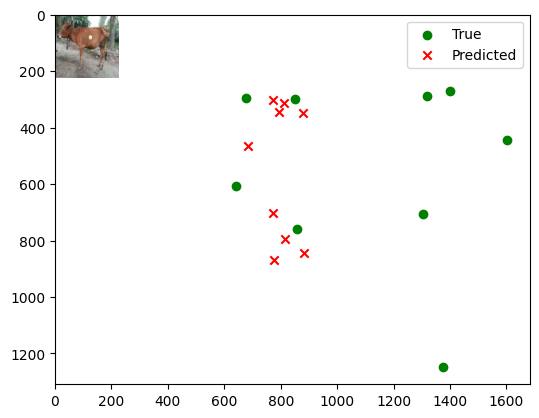

Image number: 303
True keypoints: [ 623.  299. 1752.  383.  636.  637.  879.  256.  894.  794. 1388.  230.
 1392.  765. 1510.  215. 1507. 1267.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[760.5738  328.26312]
 [655.5502  445.73187]
 [743.1007  672.06885]
 [842.417   330.62634]
 [843.5381  807.9381 ]
 [775.9692  297.14407]
 [779.11304 762.2511 ]
 [739.3572  284.8458 ]
 [743.9281  833.5642 ]]


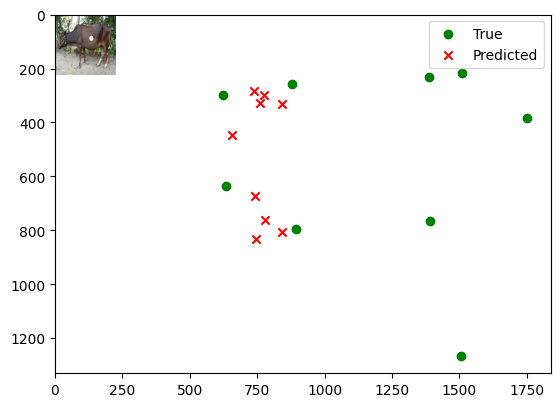

Image number: 304
True keypoints: [ 702.  292. 1740.  405.  656.  659.  929.  302.  953.  809. 1425.  268.
 1427.  737. 1514.  248. 1518. 1270.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[783.5541  338.48328]
 [675.8808  459.31274]
 [765.48425 692.36707]
 [868.18286 340.9488 ]
 [869.2281  832.49005]
 [799.8257  306.60492]
 [802.9849  785.4468 ]
 [762.13293 294.0567 ]
 [766.865   859.0818 ]]


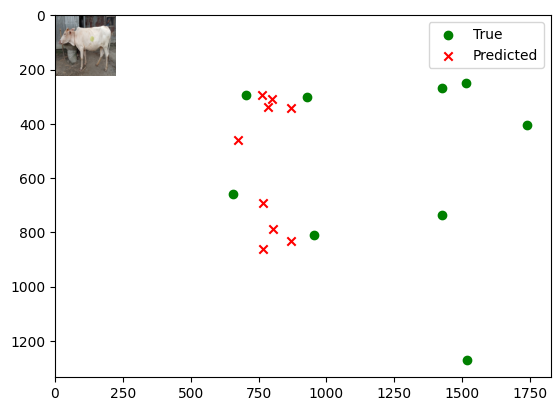

Image number: 305
True keypoints: [ 613.  386. 1641.  441.  623.  715.  820.  378.  852.  867. 1315.  361.
 1330.  774. 1430.  359. 1454. 1355.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[818.8175  356.51868]
 [708.9376  481.334  ]
 [799.63043 723.8577 ]
 [909.24426 359.01758]
 [910.2586  871.11536]
 [838.3077  324.63   ]
 [841.69116 821.8037 ]
 [799.2934  311.97977]
 [803.9279  899.67096]]


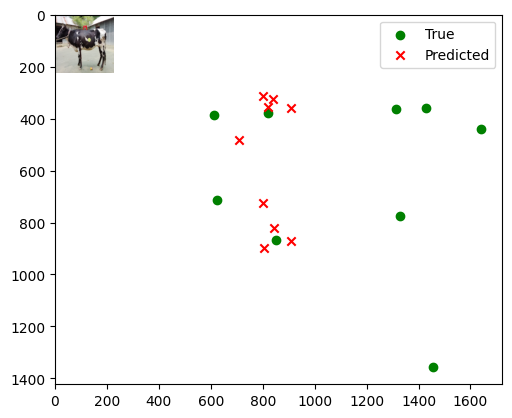

Image number: 306
True keypoints: [ 764.  299. 1736.  331.  649.  630.  889.  280.  906.  794. 1425.  231.
 1417.  717. 1485.  222. 1457. 1252.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[763.1998  330.30417]
 [657.96277 447.73782]
 [745.6111  674.5762 ]
 [845.69824 332.57037]
 [846.95105 810.98096]
 [779.0791  299.38562]
 [782.28076 765.1424 ]
 [742.36884 287.17792]
 [746.78046 836.8019 ]]


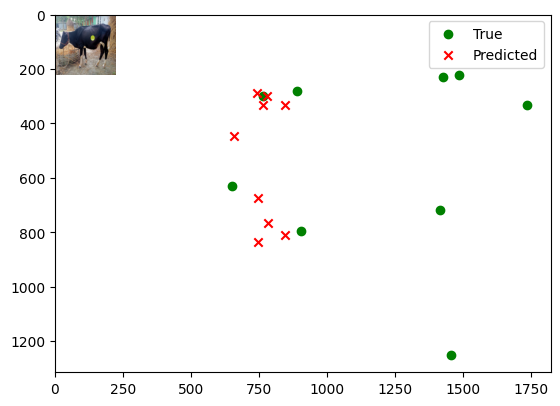

Image number: 307
True keypoints: [ 675.  296. 1592.  407.  636.  631.  836.  312.  842.  789. 1280.  294.
 1284.  748. 1364.  275. 1380. 1194.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[803.6856  348.85425]
 [694.76086 471.90988]
 [784.97833 710.33746]
 [891.64343 351.32443]
 [892.7537  854.5852 ]
 [821.8512  317.05432]
 [825.1639  806.18506]
 [783.42444 304.4458 ]
 [788.05884 882.26807]]


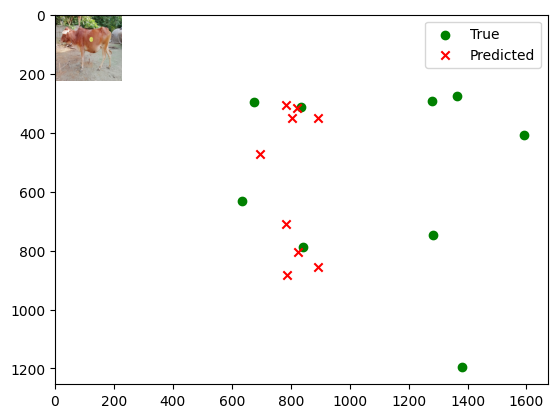

Image number: 308
True keypoints: [ 693.  296. 1739.  494.  641.  661.  884.  307.  893.  837. 1411.  292.
 1405.  788. 1512.  288. 1524. 1359.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[800.2357  347.30484]
 [691.9019  469.8694 ]
 [781.60657 707.27704]
 [887.8675  349.77536]
 [888.8926  850.91595]
 [818.3632  315.60577]
 [821.6492  802.743  ]
 [780.09955 303.05792]
 [784.72943 878.51483]]


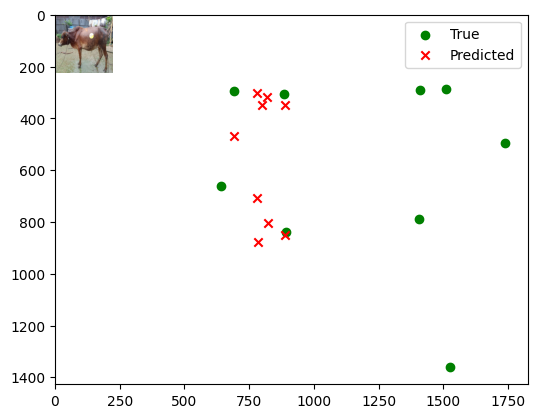

Image number: 309
True keypoints: [ 685.  249. 1622.  420.  660.  579.  885.  282.  893.  741. 1300.  246.
 1293.  698. 1383.  240. 1388. 1182.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[805.9719  350.149  ]
 [697.2709  473.42566]
 [787.16595 712.388  ]
 [894.5046  352.6588 ]
 [895.6012  857.19934]
 [824.6144  318.49857]
 [827.9527  808.62085]
 [786.1539  305.9069 ]
 [790.76666 885.09155]]


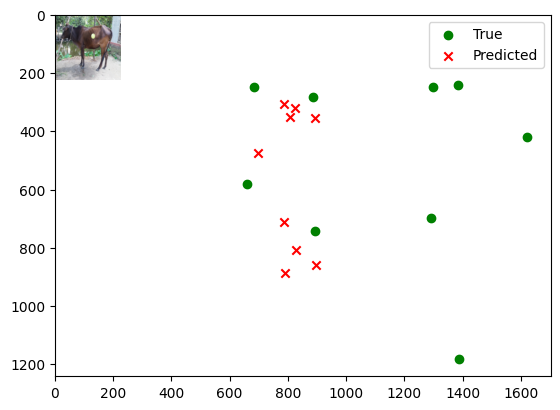

Image number: 310
True keypoints: [ 723.  308. 1741.  319.  713.  596.  915.  275.  929.  775. 1393.  217.
 1410.  710. 1501.  199. 1534. 1168.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[770.4392  333.28802]
 [664.6732  451.8811 ]
 [752.65924 680.8738 ]
 [853.8645  335.66687]
 [855.02527 818.7311 ]
 [786.69556 302.17157]
 [789.9073  772.4093 ]
 [749.6949  289.8524 ]
 [754.20374 844.89136]]


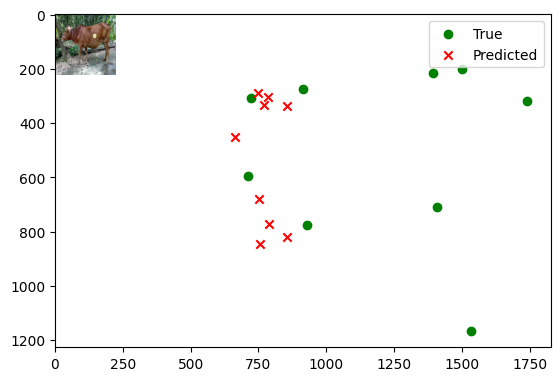

Image number: 311
True keypoints: [1191.  340.  363.  472. 1217.  671. 1011.  359. 1005.  767.  641.  334.
  650.  723.  585.  329.  600. 1090.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[738.4706  319.8966 ]
 [628.10236 433.57712]
 [722.3095  654.4068 ]
 [815.03314 321.03296]
 [816.14624 782.7103 ]
 [747.9773  286.93387]
 [751.28406 740.0425 ]
 [711.13184 274.59802]
 [715.655   806.07043]]


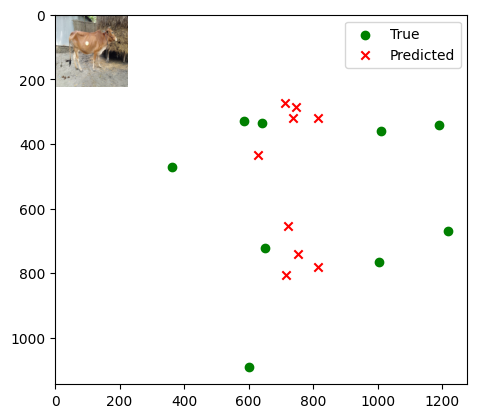

Image number: 312
True keypoints: [1098.  159.   89.  286. 1155.  547.  907.  175.  913.  694.  435.  118.
  457.  593.  302.  101.  364. 1160.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[669.72485 285.682  ]
 [565.6891  391.1418 ]
 [655.5853  593.06274]
 [736.08923 286.88858]
 [737.01886 707.98737]
 [674.3697  253.4928 ]
 [677.3423  669.6309 ]
 [640.5031  241.5289 ]
 [645.13684 728.11346]]


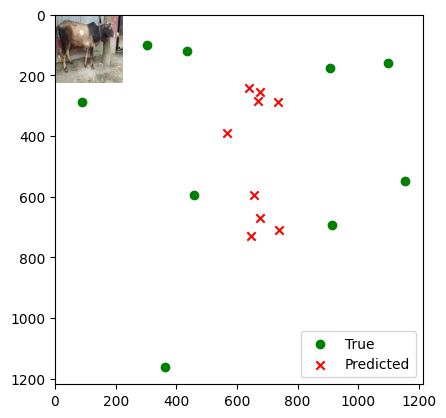

Image number: 313
True keypoints: [ 560.  337. 1565.  398.  612.  650.  785.  297.  810.  757. 1278.  274.
 1277.  694. 1375.  272. 1398. 1185.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[769.8149  333.44177]
 [663.65283 451.72693]
 [752.0966  680.509  ]
 [853.114   335.67926]
 [854.34753 818.0603 ]
 [785.8577  302.2768 ]
 [789.0921  771.8723 ]
 [748.80914 289.97635]
 [753.2661  844.13055]]


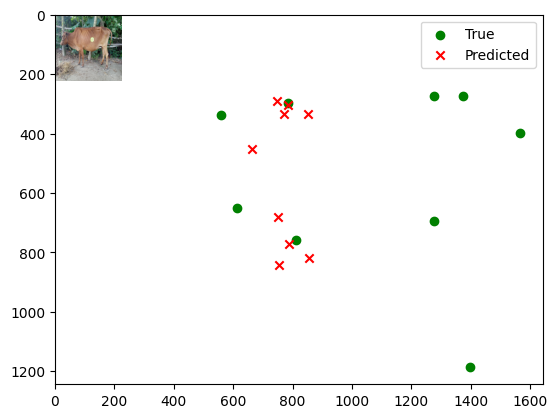

Image number: 314
True keypoints: [1235.  332.  322.  435. 1261.  666. 1032.  336. 1029.  821.  619.  302.
  627.  767.  530.  282.  554. 1256.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[761.4253  328.8177 ]
 [655.36237 446.30093]
 [743.9917  673.0001 ]
 [843.0428  331.03857]
 [844.20087 808.6763 ]
 [776.30365 297.37756]
 [779.4251  763.103  ]
 [739.4827  285.04935]
 [744.0548  834.20105]]


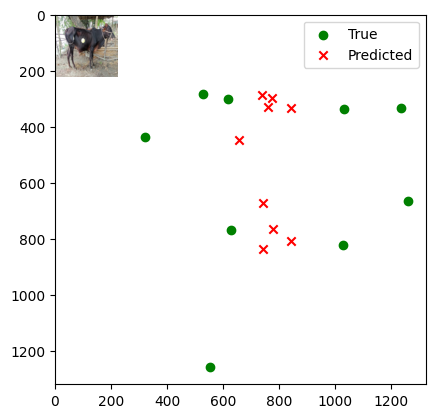

Image number: 315
True keypoints: [1141.  308.  191.  349. 1168.  618.  954.  290.  954.  774.  476.  231.
  493.  705.  387.  218.  421. 1197.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[718.79584 310.24042]
 [611.4406  421.52182]
 [703.13635 636.7433 ]
 [792.99445 311.53735]
 [794.1066  761.66174]
 [727.7776  278.012  ]
 [731.0228  720.0308 ]
 [692.00574 265.83936]
 [696.48346 784.37274]]


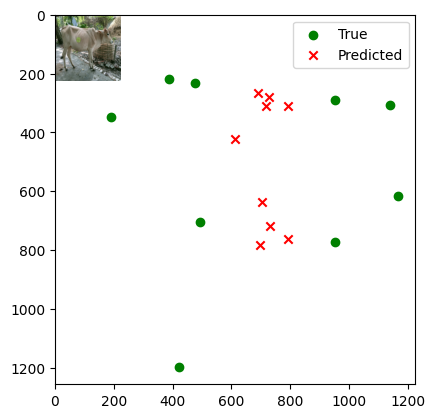

Image number: 316
True keypoints: [ 656.  375. 1672.  478.  650.  719.  871.  353.  882.  866. 1345.  318.
 1351.  785. 1435.  307. 1459. 1348.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[813.4632  353.80875]
 [703.3937  477.9825 ]
 [794.48755 719.1372 ]
 [902.7799  356.2088 ]
 [903.8701  865.1726 ]
 [832.1259  321.7645 ]
 [835.48566 816.22705]
 [793.2235  309.0871 ]
 [797.8833  893.2944 ]]


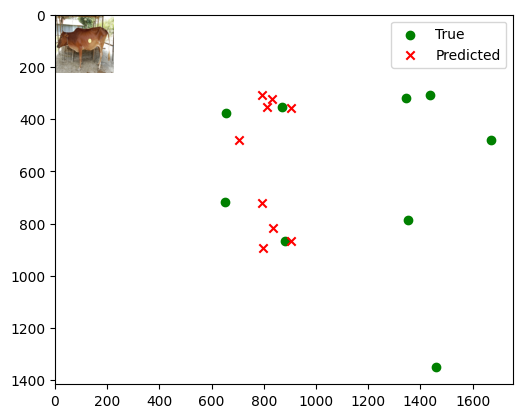

Image number: 317
True keypoints: [ 678.  274. 1698.  362.  665.  647.  877.  281.  897.  824. 1372.  242.
 1382.  717. 1474.  234. 1481. 1316.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[786.11224 339.75592]
 [678.1748  460.88248]
 [767.96765 694.6528 ]
 [871.089   342.21283]
 [872.1277  835.25073]
 [802.5329  307.8482 ]
 [805.7102  788.0605 ]
 [764.72205 295.26263]
 [769.4568  861.9704 ]]


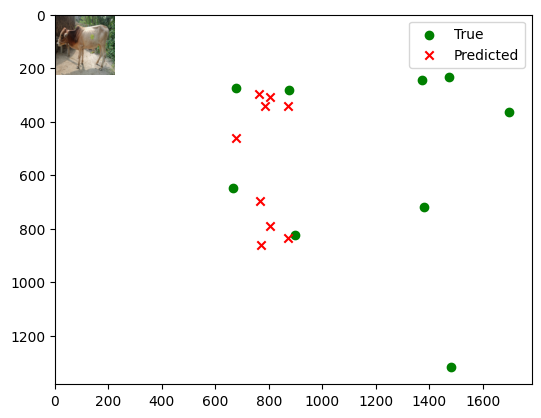

Image number: 318
True keypoints: [ 675.  302. 1638.  410.  657.  659.  873.  334.  891.  784. 1327.  276.
 1329.  714. 1419.  261. 1432. 1125.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[759.90234 327.57855]
 [654.1008  445.10782]
 [742.49615 671.4713 ]
 [841.1771  329.893  ]
 [842.31494 806.9388 ]
 [774.63245 296.105  ]
 [777.70465 761.4161 ]
 [737.88293 283.7413 ]
 [742.5145  832.38666]]


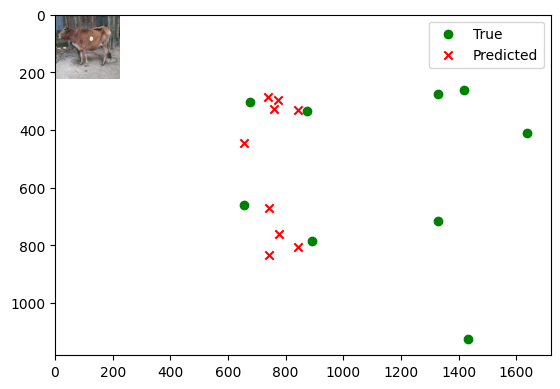

Image number: 319
True keypoints: [1228.  290.  296.  376. 1176.  630.  977.  303.  958.  748.  575.  252.
  584.  676.  494.  242.  524. 1100.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[768.29126 332.89038]
 [663.15656 450.9053 ]
 [750.5075  679.0654 ]
 [851.8256  335.2056 ]
 [852.9949  816.63885]
 [784.8723  302.03864]
 [788.12726 770.44525]
 [748.02783 289.81104]
 [752.4556  842.86487]]


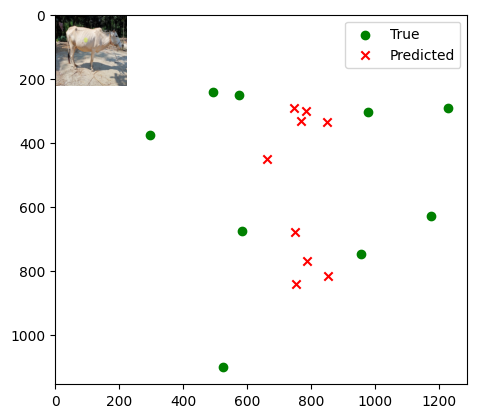

Image number: 320
True keypoints: [1128.  515.  541.  518. 1182.  713. 1033.  508. 1024.  823.  744.  467.
  735.  777.  681.  460.  659. 1171.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[788.0683  342.60675]
 [680.036   463.01926]
 [769.80505 696.85474]
 [874.0162  344.79276]
 [875.2616  837.8963 ]
 [805.2765  311.13995]
 [808.5674  790.5776 ]
 [767.40533 298.73294]
 [771.8821  864.8278 ]]


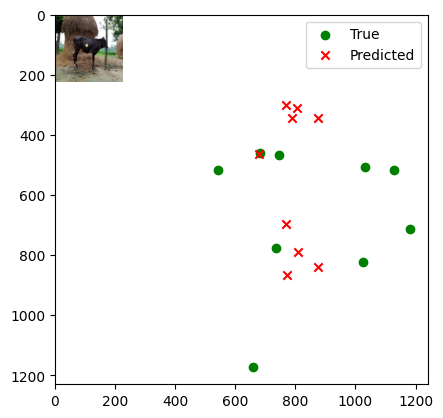

Image number: 321
True keypoints: [1168.  329.  207.  503. 1251.  657. 1000.  357.  996.  826.  558.  328.
  558.  798.  462.  316.  460. 1216.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[769.1816  334.89166]
 [658.1158  452.35083]
 [751.9535  681.38904]
 [851.0475  336.31604]
 [852.21484 816.5441 ]
 [782.2029  302.29907]
 [785.6414  771.53894]
 [744.40985 289.86588]
 [748.8437  841.79364]]


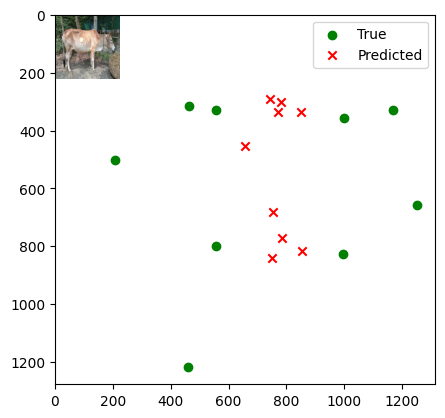

Image number: 322
True keypoints: [ 708.  333. 1607.  453.  668.  658.  909.  352.  924.  787. 1337.  334.
 1347.  737. 1403.  326. 1430. 1122.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[805.6936  350.16177]
 [696.4549  473.28467]
 [786.8875  712.20026]
 [893.99036 352.55325]
 [895.13025 856.8291 ]
 [824.02625 318.31644]
 [827.3289  808.30853]
 [785.4591  305.72406]
 [790.0896  884.609  ]]


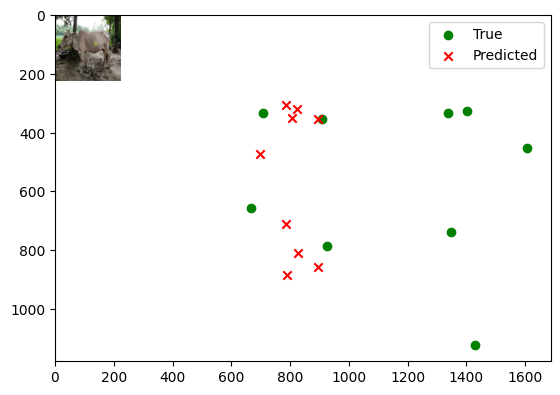

Image number: 323
True keypoints: [ 653.  295. 1723.  391.  670.  648.  883.  279.  902.  779. 1361.  246.
 1375.  727. 1484.  230. 1499. 1140.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[785.5927  339.54605]
 [677.63434 460.56335]
 [767.45447 694.19745]
 [870.474   341.97995]
 [871.52765 834.682  ]
 [801.9444  307.5938 ]
 [805.11395 787.5541 ]
 [764.1358  295.02893]
 [768.8816  861.359  ]]


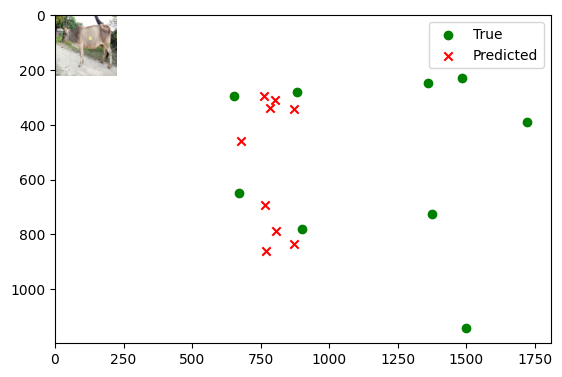

Image number: 324
True keypoints: [ 660.  259. 1705.  340.  633.  596.  885.  252.  910.  759. 1381.  177.
 1398.  671. 1468.  166. 1503. 1207.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[770.5159  332.38123]
 [664.1929  451.4575 ]
 [752.8365  680.84467]
 [853.4163  334.82263]
 [854.3496  818.38873]
 [786.01483 300.72592]
 [789.16394 772.261  ]
 [748.9092  288.3033 ]
 [753.6306  844.43866]]


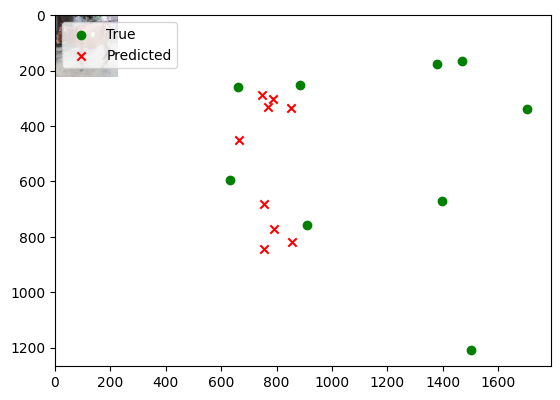

Image number: 325
True keypoints: [1244.  289.  310.  443. 1283.  588. 1040.  305. 1051.  750.  586.  270.
  612.  704.  515.  262.  543. 1173.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[725.0254  312.62848]
 [616.7492  424.96063]
 [709.19867 642.1183 ]
 [799.72705 313.9469 ]
 [800.8335  768.187  ]
 [734.0464  280.01248]
 [737.2156  726.1544 ]
 [697.91266 267.74792]
 [702.5056  791.07385]]


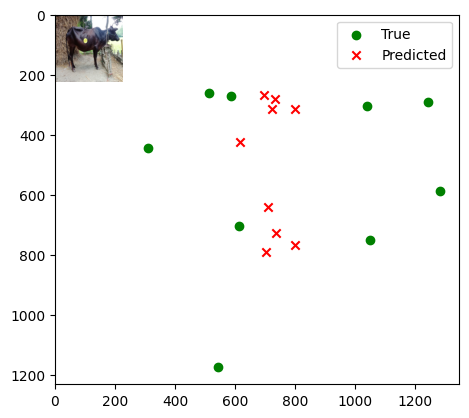

Image number: 326
True keypoints: [ 707.  436. 1681.  561.  683.  728.  936.  426.  950.  891. 1356.  405.
 1352.  822. 1473.  393. 1475. 1274.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[860.7507  377.4385 ]
 [747.5145  507.24518]
 [840.30334 761.23206]
 [957.63055 379.95764]
 [958.72217 916.83264]
 [883.5161  345.21606]
 [887.136   864.83966]
 [842.80566 332.35562]
 [847.3777  947.5299 ]]


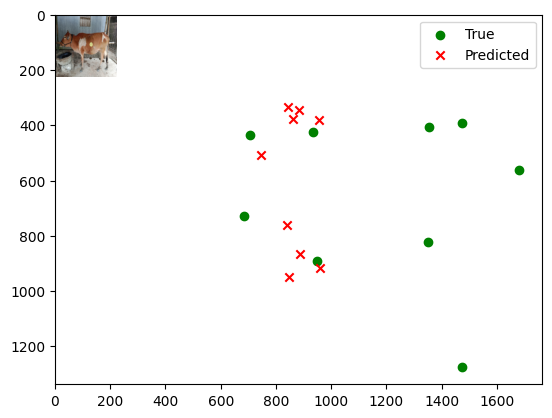

Image number: 327
True keypoints: [ 742.  236. 1675.  395.  675.  612.  906.  274.  916.  769. 1386.  244.
 1387.  708. 1469.  236. 1469. 1247.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[763.11774 329.7519 ]
 [657.9553  447.41324]
 [745.5309  674.36176]
 [845.45575 332.09213]
 [846.58453 810.76373]
 [778.827   298.67453]
 [782.0074  764.9147 ]
 [742.111   286.39496]
 [746.6359  836.5637 ]]


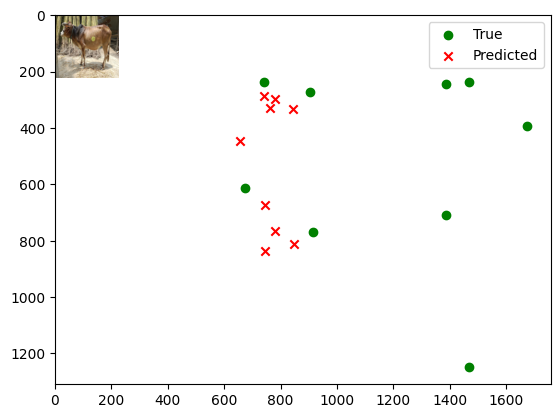

Image number: 328
True keypoints: [ 666.  244. 1715.  264.  626.  595.  890.  242.  899.  776. 1425.  191.
 1430.  710. 1501.  182. 1510. 1352.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[738.32007 317.7345 ]
 [635.4005  432.3    ]
 [721.4785  652.328  ]
 [817.10657 320.04614]
 [818.2433  783.8837 ]
 [752.39624 287.06085]
 [755.4861  739.60815]
 [716.73694 274.93256]
 [721.2173  808.51654]]


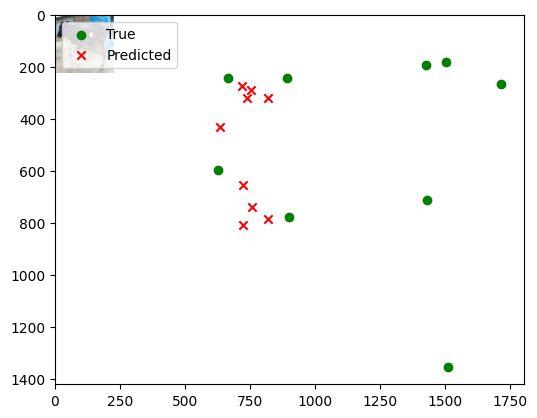

Image number: 329
True keypoints: [ 757.  313. 1731.  471.  733.  669.  945.  351.  953.  849. 1400.  307.
 1394.  801. 1511.  301. 1444. 1242.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[836.6706  365.3039 ]
 [725.0961  492.27985]
 [816.9638  739.75354]
 [929.67993 367.7794 ]
 [930.7898  890.5097 ]
 [857.3628  333.16452]
 [860.859   840.047  ]
 [817.59033 320.4179 ]
 [822.20056 919.9042 ]]


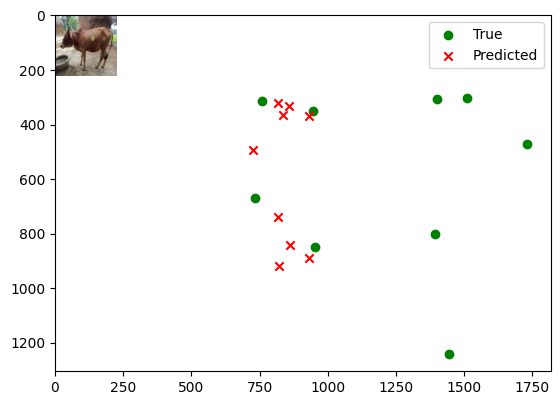

Image number: 330
True keypoints: [ 693.  240. 1770.  331.  663.  607.  923.  256.  954.  783. 1453.  209.
 1456.  699. 1522.  182. 1546. 1217.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[745.3663  320.936  ]
 [641.60333 436.4818 ]
 [728.3529  658.6052 ]
 [824.9947  323.252  ]
 [826.0206  791.4101 ]
 [759.62646 289.92633]
 [762.7158  746.7617 ]
 [723.64105 277.7315 ]
 [728.21704 816.3189 ]]


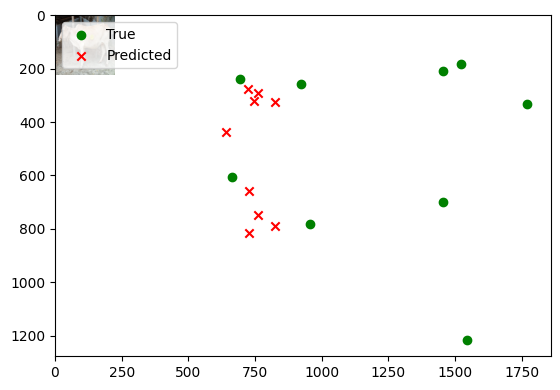

Image number: 331
True keypoints: [ 698.  306. 1672.  403.  712.  637.  901.  293.  924.  771. 1367.  274.
 1376.  731. 1451.  274. 1455. 1131.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[792.00836 343.60715]
 [684.32074 464.99014]
 [773.59534 700.0395 ]
 [878.5142  346.0109 ]
 [879.63196 842.07324]
 [809.65015 312.07825]
 [812.93964 794.4069 ]
 [771.724   299.60498]
 [776.30676 869.26416]]


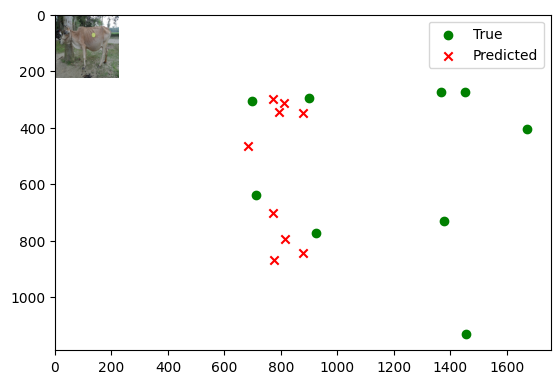

Image number: 332
True keypoints: [ 655.  302. 1597.  385.  683.  583.  857.  264.  880.  719. 1327.  262.
 1327.  667. 1400.  247. 1396. 1025.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[783.47    339.95383]
 [676.9716  460.02008]
 [765.2736  692.5006 ]
 [869.0789  342.34286]
 [870.22986 833.0216 ]
 [800.9582  308.8408 ]
 [804.26025 785.85376]
 [763.47614 296.48492]
 [767.9554  859.9129 ]]


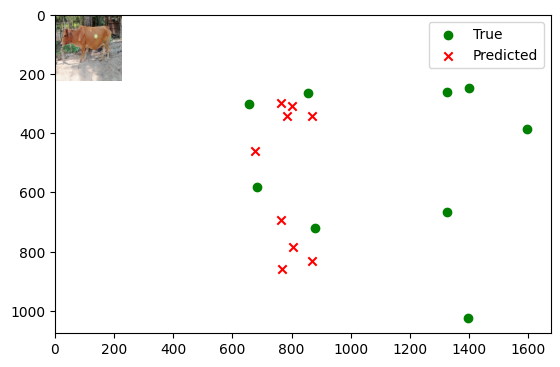

Image number: 333
True keypoints: [1175.  296.  233.  447. 1253.  617.  982.  298.  998.  794.  536.  294.
  547.  777.  451.  286.  488. 1250.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[819.8592  356.6946 ]
 [708.0979  481.78137]
 [800.83276 724.9969 ]
 [909.5959  359.01642]
 [910.64246 871.76685]
 [838.1141  324.08673]
 [841.4807  822.6787 ]
 [798.74817 311.29495]
 [803.4951  899.9943 ]]


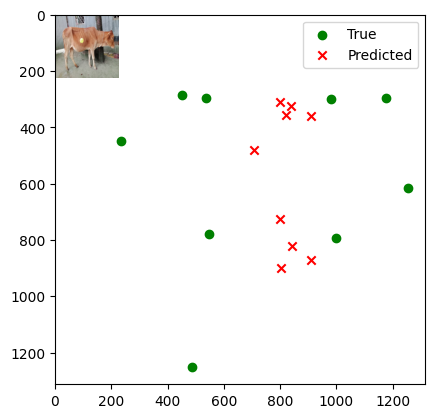

Image number: 334
True keypoints: [ 691.  419. 1550.  592.  667.  724.  877.  414.  899.  870. 1249.  388.
 1258.  812. 1348.  382. 1357. 1361.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[835.94226 366.47177]
 [725.47205 492.63837]
 [816.1416  739.34546]
 [929.84375 368.8753 ]
 [931.0283  890.33545]
 [857.76917 335.0755 ]
 [861.3751  839.8148 ]
 [818.203   322.51505]
 [822.56055 920.0257 ]]


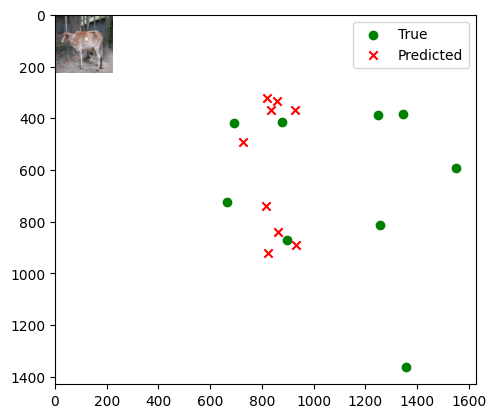

Image number: 335
True keypoints: [ 708.  277. 1672.  395.  653.  610.  848.  285.  865.  765. 1346.  254.
 1345.  695. 1451.  235. 1439. 1195.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[739.0869  317.7832 ]
 [634.5917  432.56903]
 [722.3481  653.1571 ]
 [817.2364  319.9644 ]
 [818.3595  784.28424]
 [752.0945  286.46603]
 [755.1301  740.2234 ]
 [716.15076 274.2382 ]
 [720.75226 808.6655 ]]


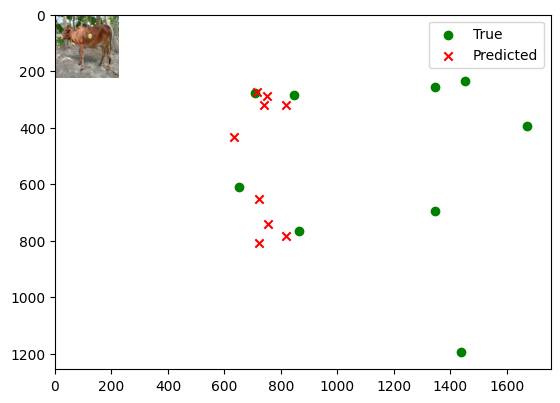

Image number: 336
True keypoints: [ 634.  297. 1682.  412.  594.  625.  867.  297.  854.  803. 1357.  295.
 1355.  764. 1484.  293. 1483. 1322.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[794.3207  343.79105]
 [685.64404 465.92572]
 [775.92957 701.96814]
 [880.51434 346.2501 ]
 [881.55554 844.1695 ]
 [811.3032  311.72546]
 [814.5318  796.46576]
 [773.13306 299.11295]
 [777.89246 871.28796]]


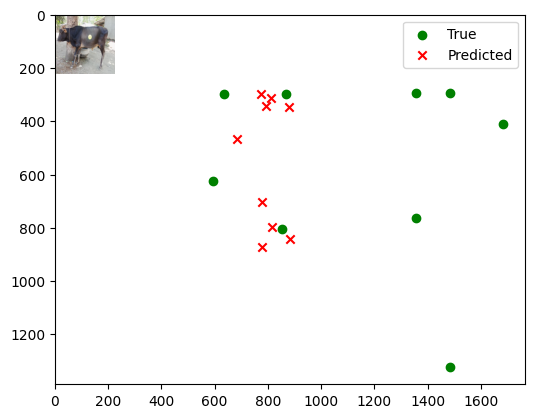

Image number: 337
True keypoints: [ 680.  290. 1539.  454.  615.  566.  866.  321.  842.  756. 1253.  291.
 1260.  718. 1326.  281. 1353. 1182.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[808.5542  352.06732]
 [699.6078  475.28717]
 [789.6183  714.8016 ]
 [897.68005 354.45367]
 [898.8652  860.172  ]
 [827.60583 320.5122 ]
 [830.9961  811.4124 ]
 [789.0184  307.97034]
 [793.5565  888.2217 ]]


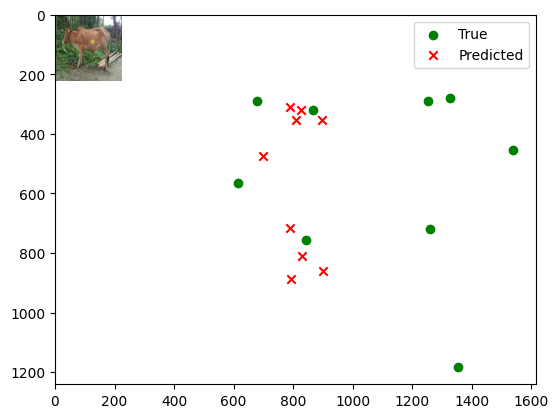

Image number: 338
True keypoints: [ 741.  400. 1707.  544.  705.  735.  904.  396.  920.  871. 1409.  397.
 1414.  826. 1484.  388. 1479. 1305.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[864.7609  379.77994]
 [751.47504 509.92303]
 [844.1682  764.8552 ]
 [962.51605 382.28714]
 [963.6304  921.3258 ]
 [888.1457  347.73438]
 [891.80444 869.0657 ]
 [847.3138  334.8898 ]
 [851.8063  952.3269 ]]


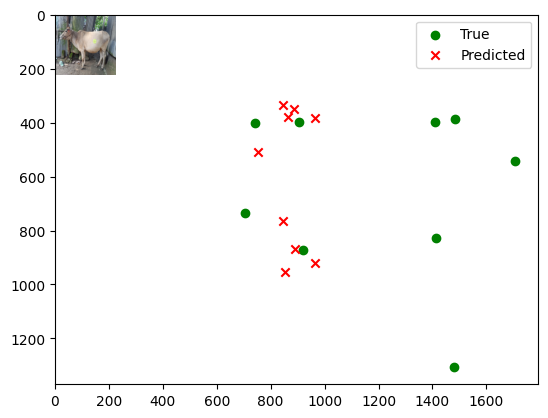

Image number: 339
True keypoints: [1110.  295.  227.  320. 1184.  569.  971.  289.  971.  758.  518.  249.
  518.  712.  414.  236.  445. 1266.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[765.97534 331.6796 ]
 [659.22156 449.4649 ]
 [748.491   677.3616 ]
 [848.39075 333.77124]
 [849.4901  813.6581 ]
 [781.0504  300.14343]
 [784.29016 767.97864]
 [743.9968  287.79596]
 [748.52936 839.40436]]


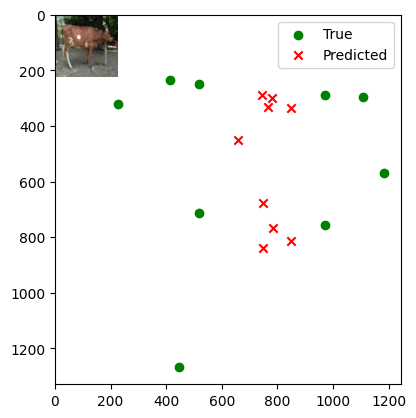

Image number: 340
True keypoints: [ 753.  231. 1775.  365.  753.  577.  979.  240. 1007.  744. 1447.  179.
 1465.  656. 1549.  187. 1565. 1164.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[741.867   318.45804]
 [637.83466 433.9362 ]
 [725.0238  655.3575 ]
 [820.4718  320.83975]
 [821.47205 787.25836]
 [755.2747  287.1637 ]
 [758.3171  742.94073]
 [719.34973 274.8791 ]
 [724.0328  811.89404]]


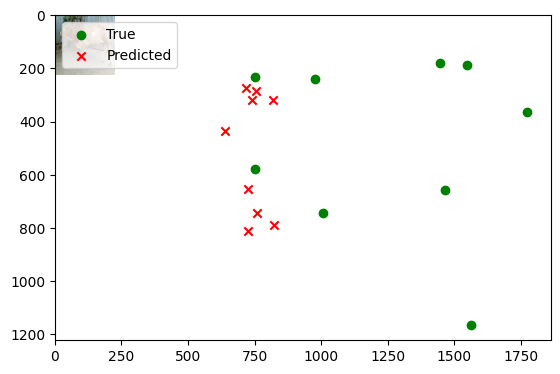

Image number: 341
True keypoints: [ 694.  277. 1782.  422.  667.  640.  915.  308.  928.  848. 1433.  295.
 1449.  786. 1519.  280. 1546. 1249.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[806.31366 350.05457]
 [697.3091  473.49957]
 [787.52386 712.6609 ]
 [894.70917 352.55417]
 [895.7582  857.4374 ]
 [824.7116  318.21378]
 [828.03235 808.8824 ]
 [786.18677 305.59988]
 [790.8417  885.2849 ]]


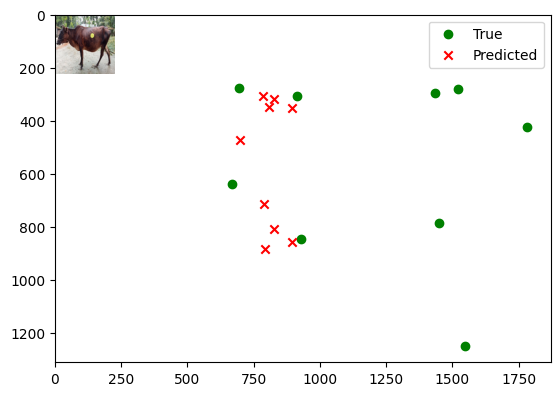

Image number: 342
True keypoints: [ 721.  292. 1666.  385.  717.  622.  947.  288.  978.  775. 1377.  249.
 1386.  708. 1468.  241. 1486. 1230.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[769.0637  332.20804]
 [662.9534  450.828  ]
 [751.35486 679.5995 ]
 [851.9317  334.5663 ]
 [853.0999  817.03815]
 [784.79834 300.8476 ]
 [787.93994 770.85785]
 [747.7697  288.47006]
 [752.3534  843.0138 ]]


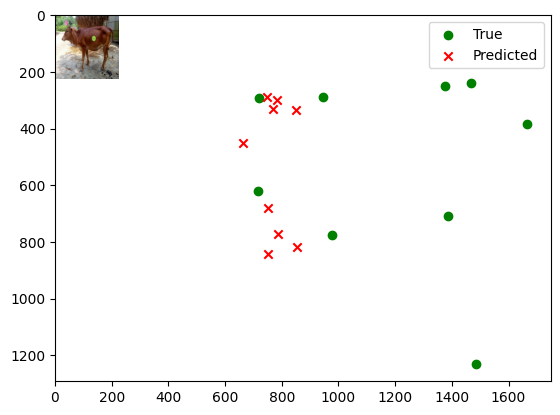

Image number: 343
True keypoints: [ 659.  380. 1697.  504.  692.  699.  889.  370.  892.  869. 1366.  354.
 1369.  825. 1476.  339. 1501. 1346.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[831.47363 363.33667]
 [720.51154 489.39133]
 [811.8979  735.27704]
 [923.99036 365.73618]
 [925.07635 885.0214 ]
 [852.07605 331.445  ]
 [855.5576  834.90656]
 [812.5335  318.77545]
 [817.07495 914.2394 ]]


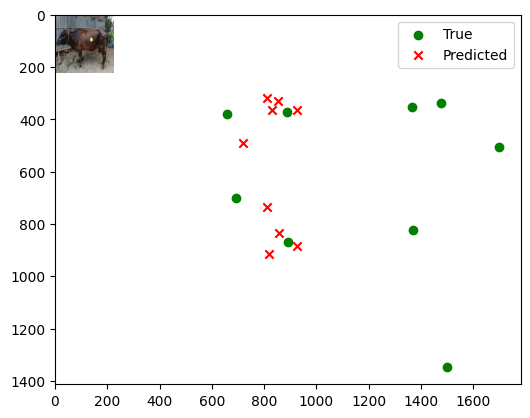

Image number: 344
True keypoints: [ 737.  305. 1687.  316.  684.  614.  953.  298.  996.  758. 1357.  215.
 1381.  669. 1471.  194. 1519. 1242.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[759.6959  327.339  ]
 [654.20435 444.93304]
 [742.287   671.2167 ]
 [840.9995  329.70462]
 [842.13513 806.7448 ]
 [774.54474 295.9629 ]
 [777.62976 761.16437]
 [737.8692  283.58344]
 [742.51416 832.19666]]


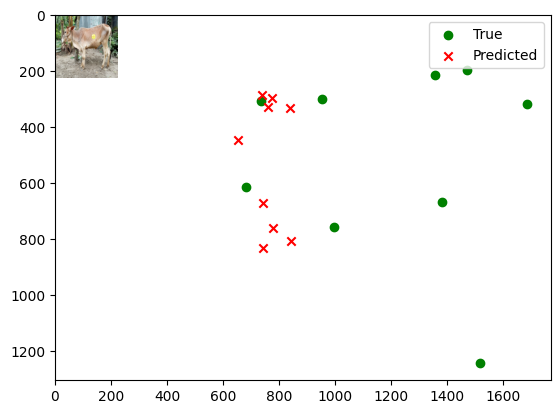

Image number: 345
True keypoints: [ 713.  293. 1753.  405.  656.  633.  875.  297.  901.  804. 1398.  268.
 1410.  760. 1493.  261. 1519. 1201.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[778.70703 337.39993]
 [672.2034  456.99255]
 [760.6715  688.2547 ]
 [863.388   339.76874]
 [864.5565  827.7184 ]
 [795.56537 306.17606]
 [798.8232  780.8742 ]
 [758.2085  293.8313 ]
 [762.7117  854.28973]]


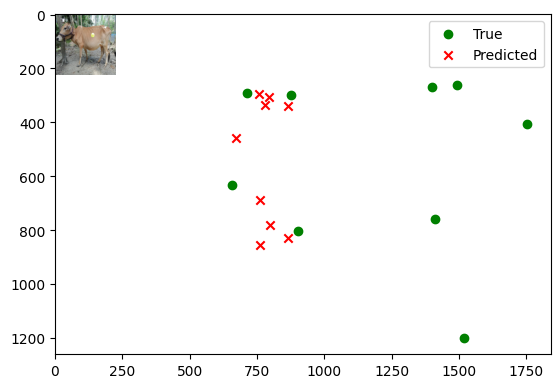

Image number: 346
True keypoints: [ 681.  267. 1652.  345.  666.  576.  860.  265.  881.  719. 1316.  233.
 1329.  643. 1400.  213. 1432. 1112.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[768.9042  333.234  ]
 [663.7007  451.31152]
 [751.11554 679.6247 ]
 [852.545   335.55487]
 [853.7631  817.33905]
 [785.56915 302.4498 ]
 [788.8403  771.0637 ]
 [748.71216 290.23816]
 [753.09314 843.5562 ]]


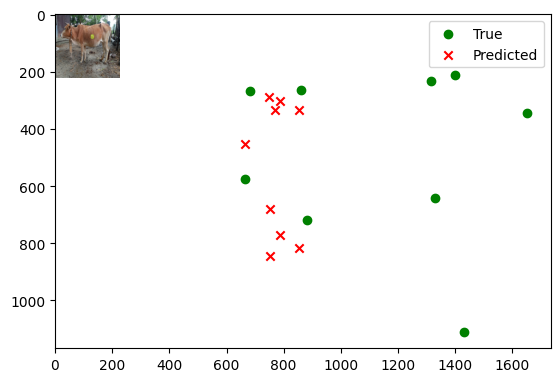

Image number: 347
True keypoints: [1147.  355.  188.  458. 1160.  723.  926.  368.  922.  848.  518.  327.
  519.  770.  424.  312.  458. 1291.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[754.8185  327.84045]
 [643.2278  443.56857]
 [738.1786  668.93353]
 [833.8455  329.03558]
 [834.9686  800.5071 ]
 [765.5796  294.75342]
 [768.9695  756.76556]
 [728.09265 282.28647]
 [732.6262  824.7047 ]]


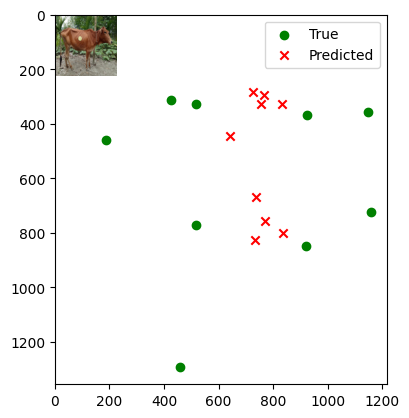

Image number: 348
True keypoints: [1183.  364.  230.  492. 1237.  642.  992.  345. 1007.  813.  564.  342.
  581.  815.  453.  335.  493. 1319.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[771.71924 334.8713 ]
 [663.0655  453.18338]
 [754.1602  682.8071 ]
 [854.5327  336.75375]
 [855.63837 819.62463]
 [786.36444 302.87024]
 [789.6514  773.8731 ]
 [748.8623  290.46622]
 [753.39124 845.4217 ]]


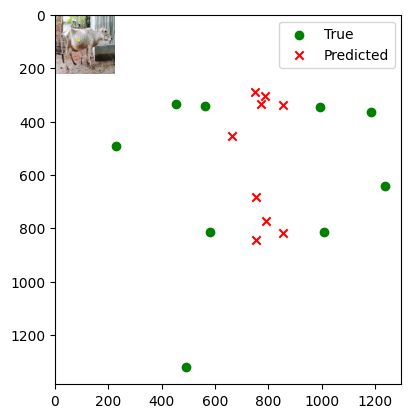

Image number: 349
True keypoints: [ 661.  182. 1758.  302.  702.  578.  920.  167.  961.  689. 1383.  134.
 1391.  624. 1508.  123. 1548. 1090.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[748.12555 321.73782]
 [643.87    437.88748]
 [731.0818  660.95166]
 [827.8629  324.1234 ]
 [828.8253  794.1874 ]
 [762.2206  290.502  ]
 [765.3038  749.4243 ]
 [726.0882  278.2243 ]
 [730.7302  819.1681 ]]


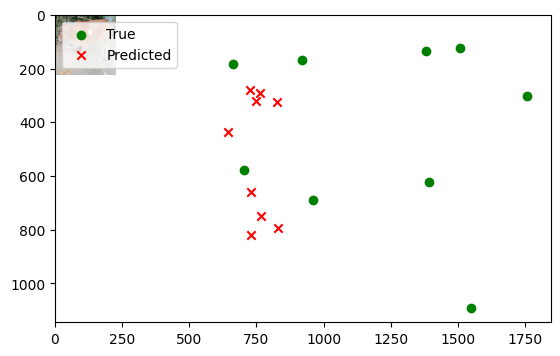

Image number: 350
True keypoints: [1189.  365.  128.  464. 1209.  714. 1001.  393.  992.  882.  513.  336.
  516.  818.  387.  318.  408. 1257.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[847.0791  371.3946 ]
 [735.58154 499.17822]
 [826.9777  749.1409 ]
 [942.397   373.8648 ]
 [943.5593  902.28076]
 [869.4662  339.72287]
 [873.093   851.0428 ]
 [829.4396  327.04144]
 [833.8776  932.43286]]


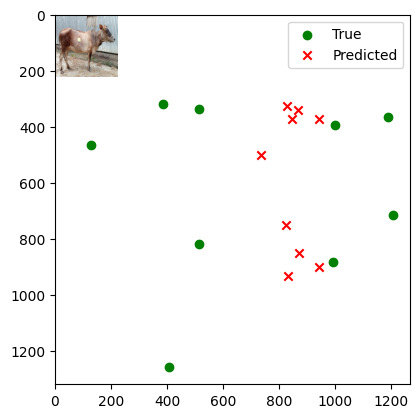

Image number: 351
True keypoints: [1172.  337.  293.  444. 1198.  593. 1005.  329. 1018.  775.  577.  302.
  591.  716.  470.  288.  482. 1209.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[778.3019  337.32452]
 [668.266   456.84686]
 [760.65186 688.60504]
 [861.49524 339.23352]
 [862.59595 826.43396]
 [792.6388  304.7937 ]
 [795.9064  780.3437 ]
 [754.7149  292.21765]
 [759.3736  852.31683]]


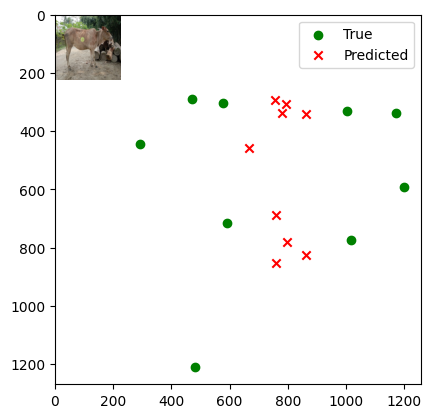

Image number: 352
True keypoints: [ 649.  250. 1628.  364.  620.  551.  865.  223.  869.  731. 1317.  191.
 1320.  692. 1412.  191. 1429. 1205.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[733.0942  314.3325 ]
 [629.59045 428.63425]
 [716.486   647.59406]
 [810.36066 316.6303 ]
 [811.4399  777.766  ]
 [745.8351  283.1366 ]
 [748.81036 733.9584 ]
 [710.22144 270.89545]
 [714.8674  801.89606]]


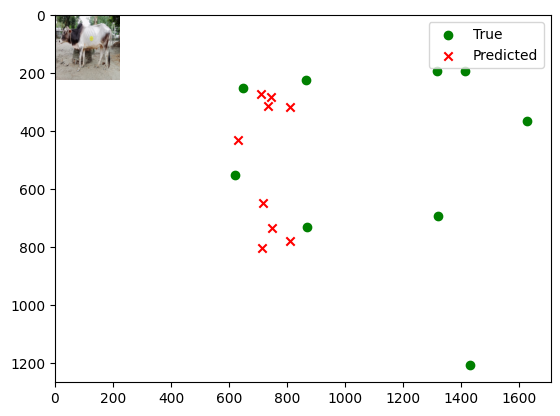

Image number: 353
True keypoints: [ 663.  385. 1573.  507.  663.  674.  868.  371.  880.  839. 1307.  385.
 1309.  787. 1393.  379. 1381. 1268.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[731.99084 313.40817]
 [628.3071  427.74933]
 [715.44495 646.5397 ]
 [808.85913 315.7547 ]
 [809.9661  776.4232 ]
 [744.39026 282.04324]
 [747.3738  732.7131 ]
 [708.7529  269.77567]
 [713.4725  800.4615 ]]


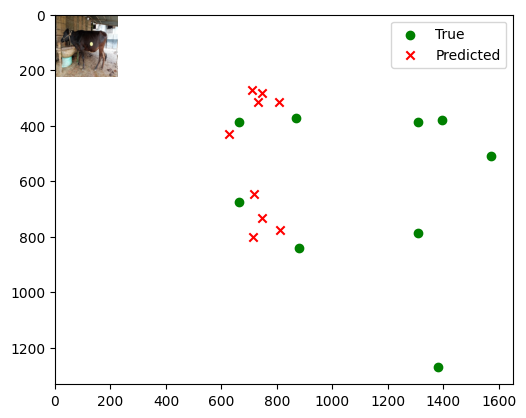

Image number: 354
True keypoints: [ 738.  280. 1794.  420.  738.  595.  949.  267.  969.  754. 1434.  251.
 1445.  702. 1541.  240. 1558. 1237.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[745.9584  321.62918]
 [641.78754 437.044  ]
 [728.87384 659.1859 ]
 [825.6831  323.88345]
 [826.969   792.1339 ]
 [760.34595 290.7794 ]
 [763.4291  747.40894]
 [724.2639  278.63794]
 [728.7046  817.0375 ]]


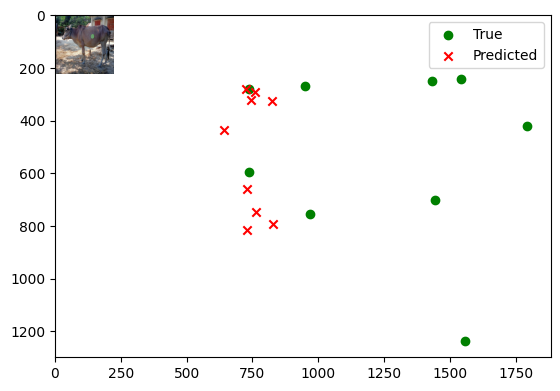

Image number: 355
True keypoints: [ 678.  245. 1709.  455.  651.  667.  855.  279.  890.  812. 1359.  270.
 1367.  757. 1463.  257. 1490. 1229.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[800.4862  346.2305 ]
 [691.0114  469.39883]
 [781.9287  707.3416 ]
 [887.2537  348.76794]
 [888.2544  850.62256]
 [817.54724 313.89288]
 [820.7362  802.62317]
 [779.07007 301.18445]
 [783.9176  877.98364]]


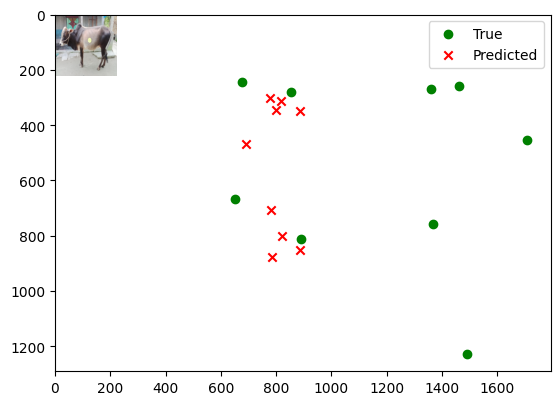

Image number: 356
True keypoints: [1136.  390.  184.  490. 1124.  703.  916.  381.  903.  847.  498.  325.
  517.  764.  409.  305.  438. 1274.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[778.1633  337.68457]
 [667.1972  456.99582]
 [760.61584 688.8036 ]
 [861.10596 339.4389 ]
 [862.13367 826.108  ]
 [791.8908  304.84616]
 [795.2351  780.3252 ]
 [753.84265 292.26016]
 [758.5239  851.90076]]


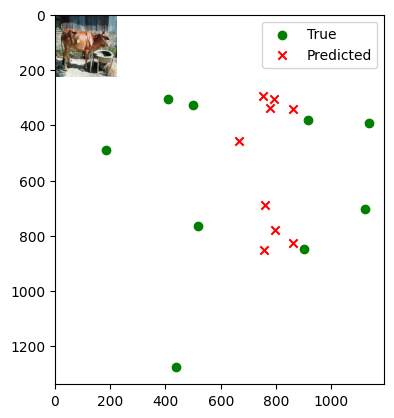

Image number: 357
True keypoints: [1175.  343.  178.  495. 1219.  628.  955.  351.  974.  830.  484.  322.
  504.  799.  381.  317.  441. 1272.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[820.51385 357.47803]
 [708.87146 482.4397 ]
 [801.4551  725.6996 ]
 [910.58856 359.7283 ]
 [911.5972  872.60974]
 [839.03284 324.9804 ]
 [842.4475  823.4963 ]
 [799.67346 312.23242]
 [804.3531  900.93506]]


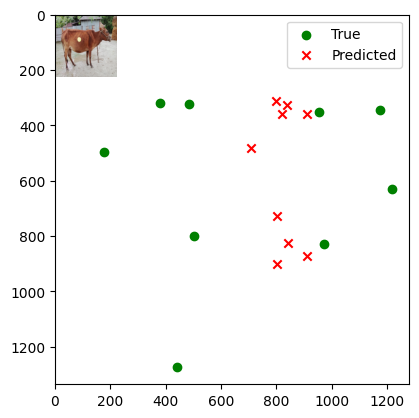

Image number: 358
True keypoints: [1240.  467.  263.  530. 1182.  776.  987.  434.  976.  895.  590.  401.
  584.  862.  498.  384.  524. 1302.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[843.4321  371.41275]
 [729.27344 497.93134]
 [823.7015  746.9476 ]
 [937.65295 373.27502]
 [938.82306 897.9314 ]
 [863.9759  339.06976]
 [867.75714 847.74976]
 [823.65564 326.41116]
 [827.968   927.5682 ]]


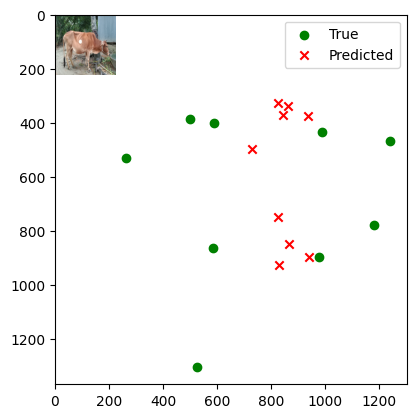

Image number: 359
True keypoints: [1221.  248.  282.  375. 1266.  576. 1037.  256. 1051.  728.  604.  222.
  622.  685.  501.  205.  570. 1264.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[681.4723  292.51276]
 [579.3567  398.78824]
 [666.63416 603.196  ]
 [751.1034  293.92618]
 [752.2352  721.7014 ]
 [689.3838  261.53738]
 [692.4265  682.0475 ]
 [655.4997  249.83543]
 [659.838   743.02405]]


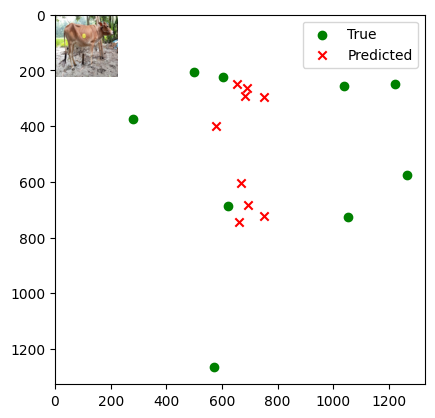

Image number: 360
True keypoints: [ 593.  266. 1579.  397.  553.  606.  811.  288.  828.  772. 1286.  247.
 1296.  715. 1372.  234. 1398. 1222.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[776.46265 336.22055]
 [670.41986 455.5599 ]
 [758.49243 686.21735]
 [860.8672  338.61392]
 [861.9474  825.29065]
 [793.24646 305.0195 ]
 [796.4811  778.59814]
 [756.01544 292.66534]
 [760.5644  851.78973]]


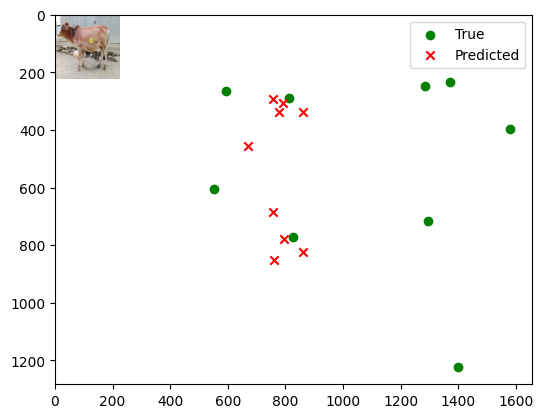

Image number: 361
True keypoints: [ 731.  419. 1570.  552.  726.  705.  879.  444.  893.  859. 1324.  418.
 1338.  823. 1393.  414. 1404. 1204.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[859.7413  377.50095]
 [747.038   506.90262]
 [839.2711  760.4054 ]
 [956.839   379.98407]
 [957.9819  915.9894 ]
 [882.90076 345.5918 ]
 [886.5395  863.96063]
 [842.3035  332.8015 ]
 [846.79956 946.7175 ]]


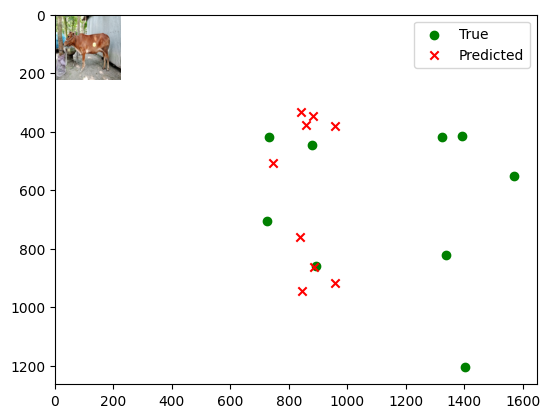

Image number: 362
True keypoints: [ 706.  245. 1555.  397.  695.  561.  862.  255.  884.  686. 1268.  253.
 1269.  643. 1355.  235. 1355. 1125.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[741.14    319.94788]
 [638.0212  434.43173]
 [724.1424  654.99774]
 [820.6581  322.1677 ]
 [821.9342  787.1912 ]
 [755.7647  289.4781 ]
 [758.9205  742.71515]
 [720.0084  277.46686]
 [724.3501  812.01953]]


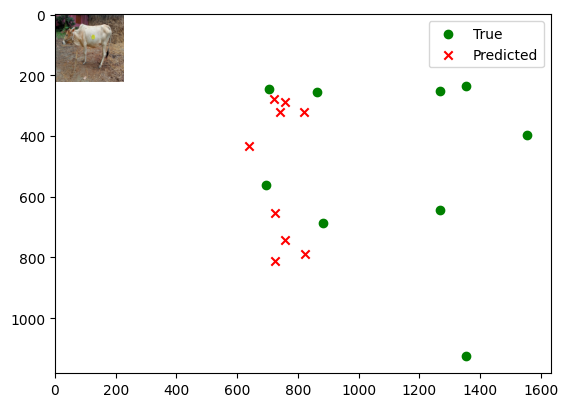

Image number: 363
True keypoints: [ 701.  230. 1783.  346.  641.  596.  916.  258.  911.  771. 1441.  189.
 1421.  716. 1535.  175. 1478. 1223.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[742.9652  319.7351 ]
 [639.01636 434.99854]
 [726.08484 656.59186]
 [822.0739  322.00204]
 [822.9656  788.6303 ]
 [756.6717  288.51776]
 [759.7625  744.33716]
 [720.74115 276.35153]
 [725.40924 813.3876 ]]


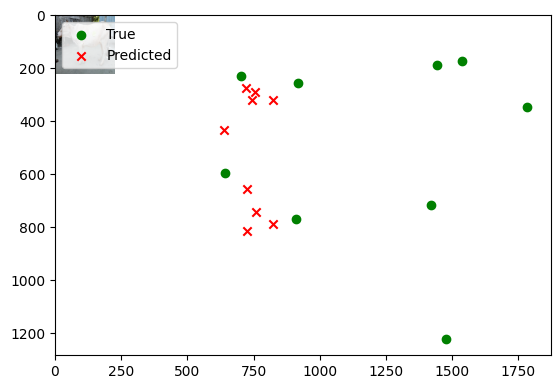

Image number: 364
True keypoints: [ 755.  336. 1591.  389.  692.  619.  905.  326.  912.  756. 1359.  282.
 1356.  691. 1416.  274. 1426. 1196.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[797.74304 346.03943]
 [689.1651  468.29074]
 [779.18964 705.0803 ]
 [884.7836  348.4501 ]
 [885.87085 848.1105 ]
 [815.4078  314.20282]
 [818.6495  800.1286 ]
 [777.1455  301.6348 ]
 [781.8118  875.482  ]]


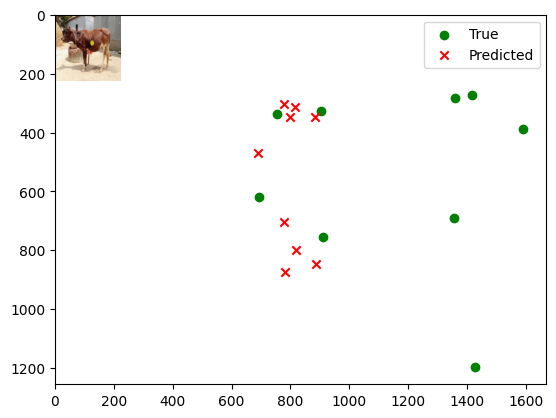

Image number: 365
True keypoints: [ 703.  300. 1697.  365.  704.  601.  910.  294.  933.  767. 1355.  229.
 1373.  710. 1460.  206. 1501. 1182.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[786.86383 340.83585]
 [679.374   461.70197]
 [768.6163  695.41675]
 [872.4009  343.24374]
 [873.5273  836.361  ]
 [803.9017  309.25302]
 [807.12854 789.0421 ]
 [766.1372  296.7595 ]
 [770.7721  863.2384 ]]


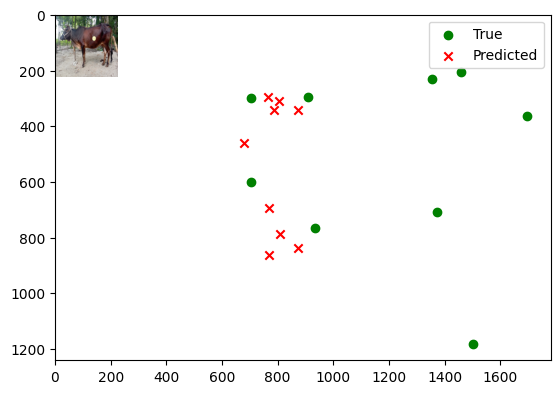

Image number: 366
True keypoints: [ 680.  427. 1611.  493.  741.  718.  902.  392.  938.  835. 1297.  377.
 1322.  795. 1379.  368. 1416. 1326.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[878.17834 387.8365 ]
 [764.8826  518.92474]
 [857.0877  777.02045]
 [978.91583 390.28497]
 [980.132   936.53284]
 [903.70764 356.3691 ]
 [907.5835  883.28284]
 [862.55646 343.66058]
 [866.77844 968.4997 ]]


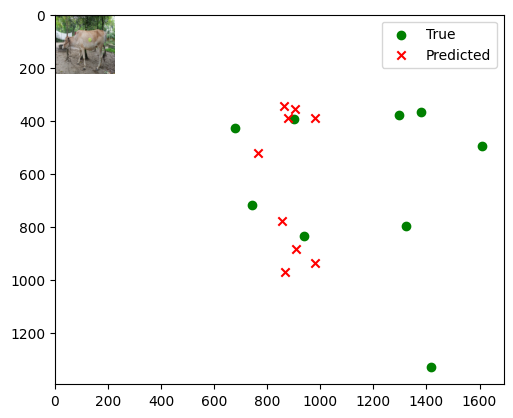

Image number: 367
True keypoints: [1277.  285.  411.  436. 1292.  719. 1068.  330. 1070.  766.  677.  306.
  685.  717.  595.  297.  621. 1143.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[843.8805  368.16608]
 [730.76184 496.3465 ]
 [824.0557  746.1485 ]
 [937.31946 370.64795]
 [938.4317  897.9966 ]
 [864.27515 335.47964]
 [867.6885  847.1789 ]
 [824.0175  322.57608]
 [828.7909  927.4828 ]]


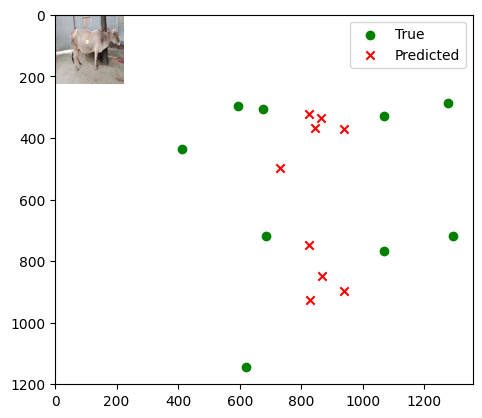

Image number: 368
True keypoints: [ 771.  366. 1698.  415.  764.  703.  983.  361. 1004.  828. 1423.  300.
 1437.  734. 1482.  292. 1524. 1337.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[826.3199  361.06512]
 [716.1006  486.33975]
 [806.8516  730.67566]
 [918.2772  363.4646 ]
 [919.41785 879.5552 ]
 [846.838   329.4316 ]
 [850.3399  829.7037 ]
 [807.5824  316.8449 ]
 [812.06537 908.57294]]


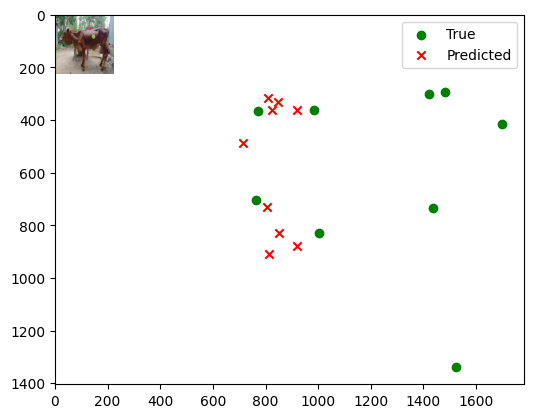

Image number: 369
True keypoints: [1118.  312.  317.  369. 1216.  547.  979.  291.  991.  711.  622.  279.
  636.  723.  506.  275.  541. 1191.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[784.2226  339.57227]
 [675.39026 460.05615]
 [766.20154 693.3222 ]
 [868.73364 341.77533]
 [869.86945 833.15466]
 [800.0216  307.45166]
 [803.20984 786.26874]
 [762.1124  294.90244]
 [766.8002  859.6051 ]]


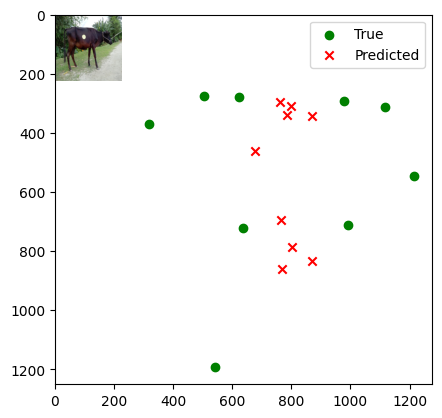

Image number: 370
True keypoints: [ 716.  359. 1687.  469.  712.  673.  922.  351.  938.  808. 1363.  328.
 1375.  754. 1470.  319. 1482. 1234.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[807.7624  350.81146]
 [698.4148  474.39908]
 [788.9227  713.97156]
 [896.2884  353.28098]
 [897.3812  858.98517]
 [826.1693  318.90552]
 [829.48694 810.33624]
 [787.54205 306.2817 ]
 [792.19305 886.87036]]


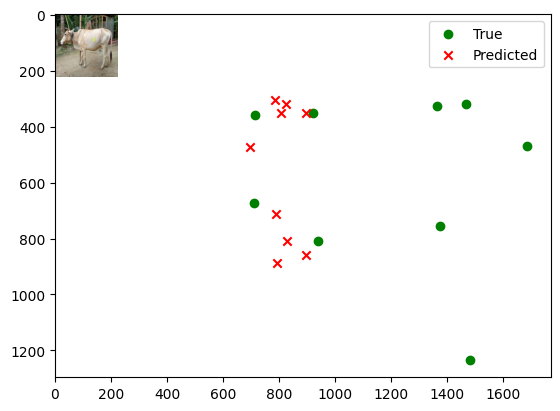

Image number: 371
True keypoints: [ 614.  310. 1548.  455.  606.  600.  806.  327.  815.  773. 1243.  314.
 1255.  722. 1343.  309. 1363. 1200.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[772.8249  334.1038 ]
 [666.0123  453.13055]
 [754.9937  682.9775 ]
 [856.12524 336.4184 ]
 [857.328   821.04535]
 [788.619   302.55377]
 [791.79565 774.6713 ]
 [751.3564  290.1641 ]
 [755.975   847.16046]]


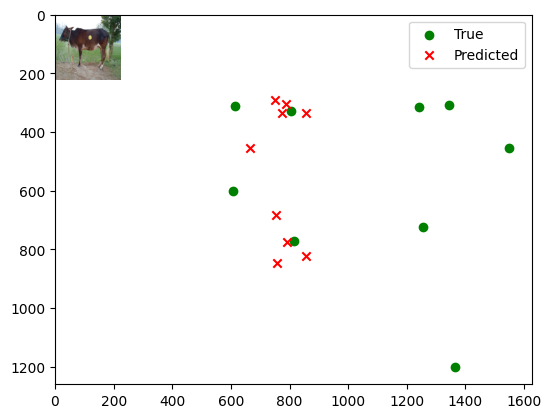

Image number: 372
True keypoints: [ 791.  254. 1782.  367.  783.  577. 1011.  250. 1027.  716. 1448.  220.
 1448.  702. 1553.  208. 1586. 1232.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[773.56476 334.9001 ]
 [667.7462  453.85602]
 [755.68744 683.665  ]
 [857.5706  337.2875 ]
 [858.6924  822.17395]
 [790.1601  303.78836]
 [793.40607 775.6625 ]
 [753.07275 291.46448]
 [757.5836  848.5414 ]]


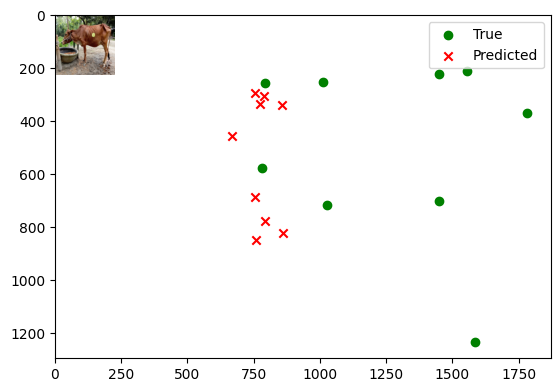

Image number: 373
True keypoints: [ 739.  362. 1622.  465.  707.  661.  914.  373.  924.  808. 1331.  341.
 1337.  753. 1409.  334. 1417. 1200.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[832.61743 364.01508]
 [721.8255  490.16656]
 [812.9756  736.25684]
 [925.4826  366.44147]
 [926.6392  886.37805]
 [853.5671  332.26324]
 [857.06525 836.1225 ]
 [814.0149  319.59982]
 [818.5138  915.7023 ]]


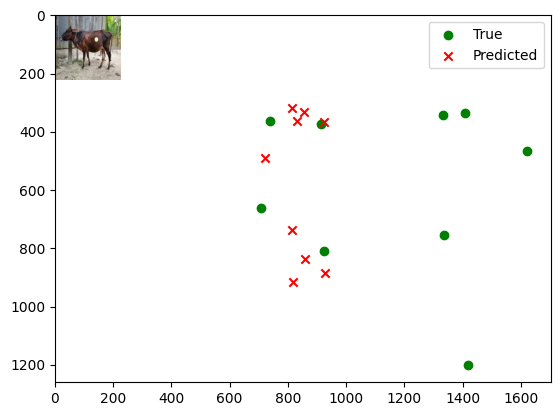

Image number: 374
True keypoints: [ 742.  302. 1711.  470.  675.  701.  915.  356.  931.  861. 1402.  330.
 1416.  764. 1499.  322. 1550. 1305.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[823.5571  358.75327]
 [712.89777 484.16388]
 [804.2556  728.0793 ]
 [914.4979  361.21423]
 [915.60657 876.1914 ]
 [843.1488  326.69244]
 [846.553   826.57574]
 [803.8705  313.97842]
 [808.51825 904.8833 ]]


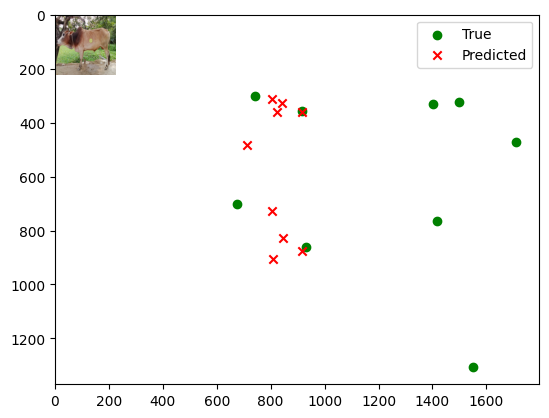

Image number: 375
True keypoints: [ 735.  237. 1623.  441.  669.  585.  863.  279.  884.  741. 1303.  275.
 1298.  711. 1412.  262. 1366. 1194.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[774.3325  335.84503]
 [668.64374 454.6169 ]
 [756.3781  684.4393 ]
 [858.7473  338.172  ]
 [859.9695  823.2105 ]
 [791.3538  304.9801 ]
 [794.6396  776.5858 ]
 [754.2483  292.7289 ]
 [758.6509  849.6681 ]]


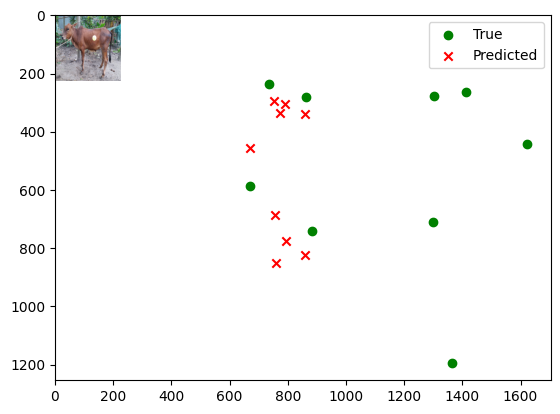

Image number: 376
True keypoints: [1202.  337.  222.  444. 1242.  646. 1012.  347. 1007.  818.  523.  293.
  540.  729.  436.  279.  475. 1179.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[769.52246 333.60977]
 [662.66864 451.69458]
 [751.84906 680.4664 ]
 [852.5772  335.71216]
 [853.7651  817.6017 ]
 [785.1047  302.20197]
 [788.36285 771.62244]
 [747.94604 289.9018 ]
 [752.4175  843.5558 ]]


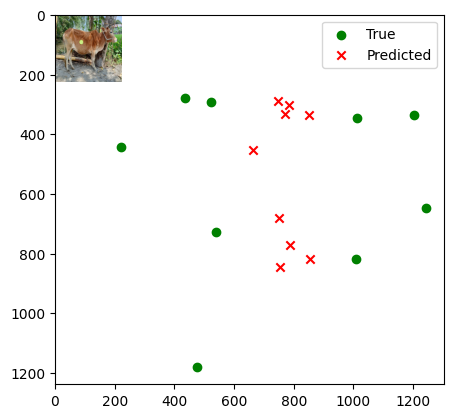

Image number: 377
True keypoints: [ 744.  296. 1599.  387.  731.  634.  903.  325.  921.  778. 1302.  285.
 1310.  707. 1411.  274. 1416. 1257.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[777.9553  336.856  ]
 [671.40173 456.44174]
 [759.9605  687.55896]
 [862.3977  339.22876]
 [863.56244 826.8496 ]
 [794.6333  305.56595]
 [797.8618  780.0467 ]
 [757.2852  293.1762 ]
 [761.81836 853.3357 ]]


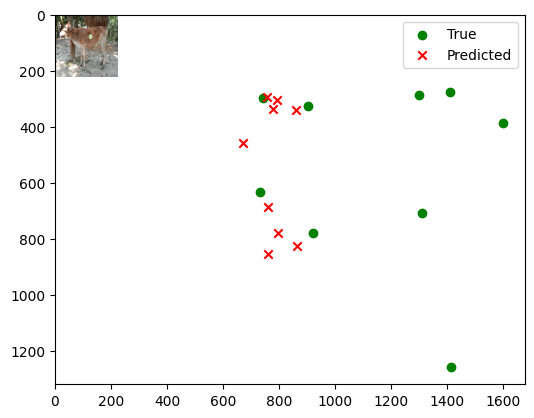

Image number: 378
True keypoints: [ 783.  205. 1738.  392.  727.  545.  982.  229.  959.  732. 1430.  222.
 1421.  685. 1490.  217. 1446. 1195.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[730.848   313.7409 ]
 [626.737   427.54883]
 [714.4078  645.91974]
 [807.6421  315.88257]
 [808.71246 775.23474]
 [742.9777  282.3854 ]
 [746.0041  731.8059 ]
 [707.3416  270.149  ]
 [711.97876 799.16205]]


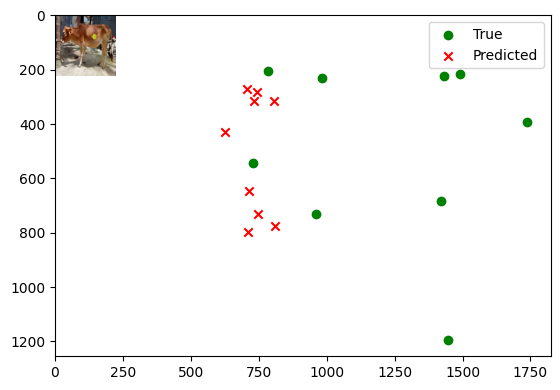

Image number: 379
True keypoints: [ 707.  301. 1756.  366.  639.  655.  905.  277.  927.  817. 1441.  218.
 1448.  680. 1534.  213. 1554. 1257.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[773.9343  334.04355]
 [667.28375 453.55817]
 [756.13446 683.8479 ]
 [857.29065 336.48178]
 [858.3534  822.1428 ]
 [789.71765 302.43057]
 [792.87646 775.7013 ]
 [752.46674 289.9618 ]
 [757.1451  848.3268 ]]


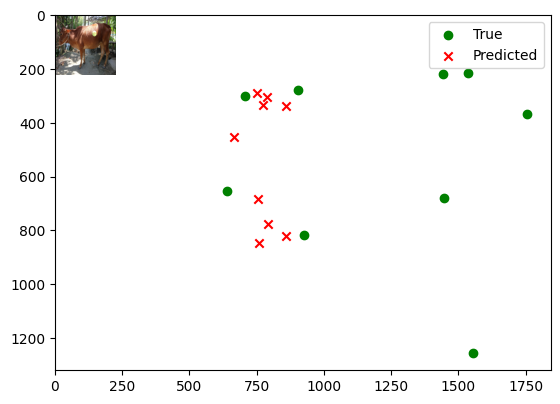

Image number: 380
True keypoints: [ 685.  216. 1643.  334.  616.  562.  879.  247.  898.  737. 1319.  207.
 1325.  671. 1426.  197. 1445. 1199.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[775.44116 334.80875]
 [668.9225  454.48145]
 [757.5774  685.1725 ]
 [859.1471  337.2856 ]
 [860.12195 823.8059 ]
 [791.464   303.20642]
 [794.6381  777.28107]
 [754.18164 290.75098]
 [758.879   850.1198 ]]


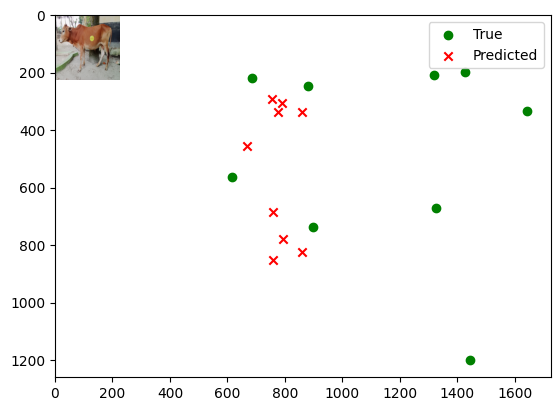

Image number: 381
True keypoints: [ 693.  198. 1625.  372.  642.  574.  854.  231.  873.  730. 1303.  220.
 1319.  650. 1399.  209. 1417. 1163.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[757.6546  325.78238]
 [651.9803  443.39316]
 [740.3657  669.3613 ]
 [838.3369  328.19846]
 [839.25305 804.2167 ]
 [771.8605  294.05945]
 [774.9141  758.99005]
 [735.1914  281.63974]
 [739.9597  829.56604]]


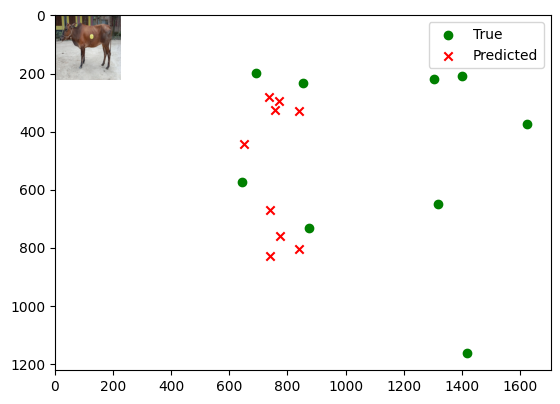

Image number: 382
True keypoints: [1214.  393.  416.  485. 1237.  657. 1062.  398. 1044.  788.  687.  353.
  688.  736.  615.  349.  624. 1199.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[817.1812  356.507  ]
 [707.58203 480.70874]
 [797.9888  722.53894]
 [907.6991  358.8861 ]
 [908.84955 869.6006 ]
 [836.94696 324.89563]
 [840.37494 820.3242 ]
 [798.0168  312.33398]
 [802.51355 898.1349 ]]


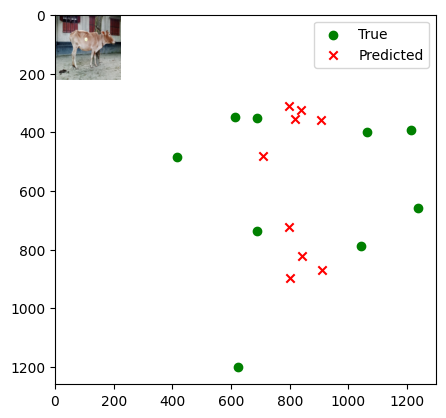

Image number: 383
True keypoints: [ 729.  309. 1745.  462.  664.  660.  899.  315.  922.  838. 1411.  334.
 1410.  790. 1501.  320. 1503. 1361.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[803.9818  349.51022]
 [695.50415 472.34314]
 [785.20374 710.6658 ]
 [892.3685  351.95496]
 [893.45325 855.11365]
 [822.621   317.93735]
 [825.9705  806.6788 ]
 [784.249   305.39658]
 [788.81903 882.95044]]


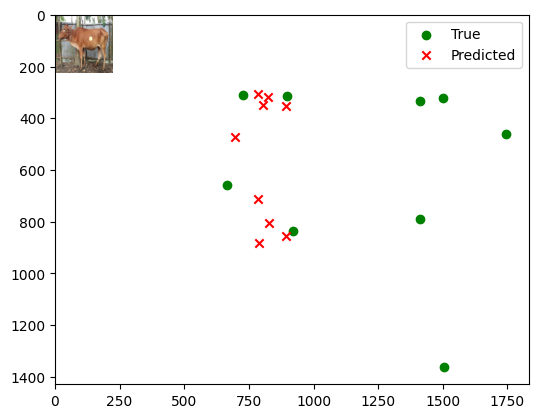

Image number: 384
True keypoints: [1220.  209.   97.  255. 1222.  533.  980.  184.  989.  712.  495.  105.
  515.  666.  366.   82.  410. 1209.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[684.9425  293.58157]
 [581.2346  400.66995]
 [670.18933 606.40015]
 [754.37885 294.94104]
 [755.4159  725.02985]
 [691.99365 261.94955]
 [695.04846 685.38043]
 [657.7555  250.06485]
 [662.2213  746.23145]]


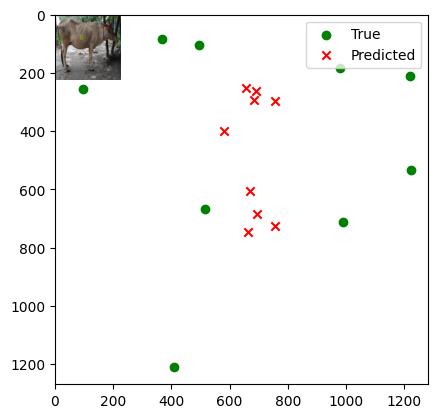

Image number: 385
True keypoints: [ 691.  298. 1607.  484.  633.  635.  847.  311.  859.  778. 1319.  315.
 1322.  732. 1409.  304. 1427. 1222.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[812.917   353.83102]
 [703.56946 477.8167 ]
 [793.88586 718.6316 ]
 [902.5714  356.27264]
 [903.6589  864.7952 ]
 [832.11414 322.07822]
 [835.4922  815.8016 ]
 [793.32605 309.4774 ]
 [797.91876 893.0477 ]]


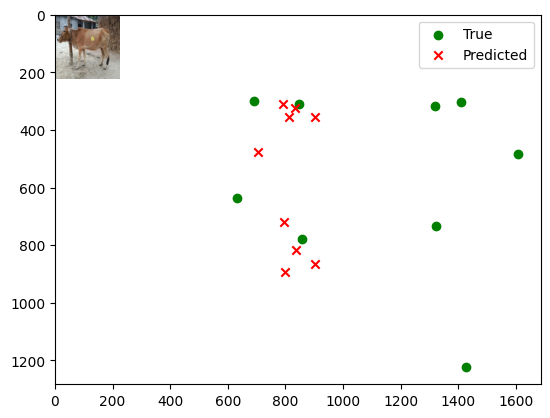

Image number: 386
True keypoints: [ 712.  348. 1680.  477.  728.  697.  934.  362.  959.  832. 1339.  319.
 1353.  805. 1443.  319. 1465. 1269.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[837.1782  365.93665]
 [725.94653 492.78183]
 [817.4084  740.2325 ]
 [930.564   368.4066 ]
 [931.69635 891.24786]
 [858.30054 334.04843]
 [861.81433 840.6781 ]
 [818.5662  321.34186]
 [823.1186  920.73914]]


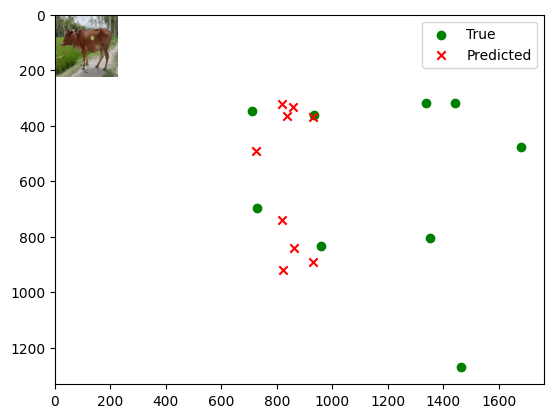

Image number: 387
True keypoints: [ 659.  357. 1638.  437.  677.  672.  890.  352.  905.  827. 1323.  324.
 1330.  742. 1408.  311. 1437. 1281.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[828.52527 361.9786 ]
 [718.1932  487.61484]
 [808.99304 732.5891 ]
 [920.7956  364.4139 ]
 [921.9322  881.96063]
 [849.2235  330.31418]
 [852.712   831.90356]
 [809.8765  317.68332]
 [814.38275 911.0803 ]]


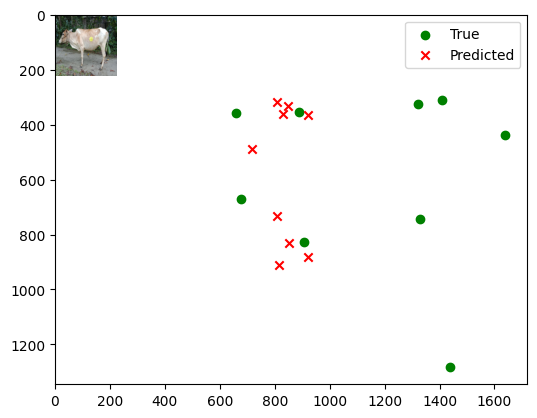

Image number: 388
True keypoints: [1165.  269.  170.  387. 1183.  630.  966.  280.  971.  748.  511.  258.
  532.  708.  424.  237.  492. 1217.]
Length of true keypoints: 9
Length of predicted keypoints: 9
Predicted keypoints: [[731.7452  314.33377]
 [627.9478  428.17856]
 [715.25275 646.73004]
 [808.9183  316.4956 ]
 [809.9262  776.335  ]
 [744.2301  283.0785 ]
 [747.2517  732.8139 ]
 [708.6188  270.90952]
 [713.24506 800.39233]]


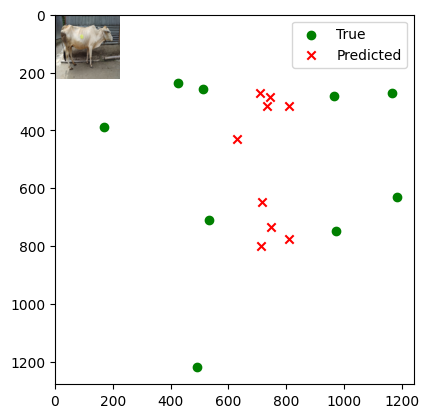

Validation Loss (Side): 234.6337
Mean Absolute Error (Side): 235.1326
R^2 Score (Side): -2.3801


In [31]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from sklearn.metrics import mean_absolute_error, r2_score

def evaluate_model(model, dataloader, criterion, visualize=False, num_samples_to_visualize=5):
    model.eval()  # Set model to evaluation mode
    running_loss = 0.0
    all_predictions = []
    all_keypoints = []
    
    # For visualization
    sample_images = []
    sample_true_keypoints = []
    sample_pred_keypoints = []

    with torch.no_grad():
        for images, keypoints in tqdm(dataloader, desc="Evaluating", unit="batch"):
            outputs = model(images)
            loss = criterion(outputs, keypoints)
            running_loss += loss.item() * images.size(0)
            
            all_predictions.extend(outputs.cpu().numpy())
            all_keypoints.extend(keypoints.cpu().numpy())
            
            # Store predicted keypoints for each batch
            for pred_keypoint in outputs.cpu().numpy():
                sample_pred_keypoints.append(pred_keypoint)

            # Visualization samples
            if visualize:
                sample_images.extend(images.cpu().numpy())
                sample_true_keypoints.extend(keypoints.cpu().numpy())

    average_loss = running_loss / len(dataloader.dataset)
    
    # Calculate additional metrics
    mae = mean_absolute_error(all_keypoints, all_predictions)
    r2 = r2_score(all_keypoints, all_predictions)
    
    # Visualization
    if visualize:
        plt.figure(figsize=(10, 5))
        for i in range(len(sample_images)):
            print("Image number:", i)
            print("True keypoints:", sample_true_keypoints[i])
            true_keypoints = np.array(sample_true_keypoints[i]).reshape(-1, 2)
#             print("True keypoints:", sample_true_keypoints[i])
            print("Length of true keypoints:", len(true_keypoints))
            pred_keypoints = np.array(sample_pred_keypoints[i]).reshape(-1, 2)
            print("Length of predicted keypoints:", len(pred_keypoints))
            print("Predicted keypoints:", pred_keypoints)
            plt.imshow(np.transpose(sample_images[i], (1, 2, 0)))
            plt.scatter(true_keypoints[:, 0], true_keypoints[:, 1], color='g', marker='o', label="True")
            plt.scatter(pred_keypoints[:, 0], pred_keypoints[:, 1], color='r', marker='x', label="Predicted")
            plt.legend()
            plt.show()
    
    return average_loss, mae, r2

# Assuming the model, dataloaders, and criterion are defined elsewhere in your code

# Evaluate side model
val_loss_side, mae_side, r2_side = evaluate_model(model_side, val_loader_side, criterion, visualize=True)
print(f"Validation Loss (Side): {val_loss_side:.4f}")
print(f"Mean Absolute Error (Side): {mae_side:.4f}")
print(f"R^2 Score (Side): {r2_side:.4f}")

Evaluating:   0%|          | 0/25 [00:00<?, ?batch/s]

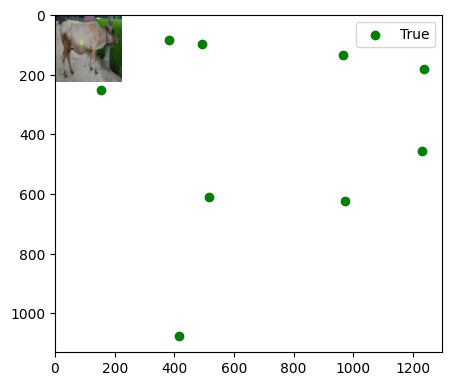

Validation Loss (Side): 234.6337
Mean Absolute Error (Side): 235.1326
R^2 Score (Side): -2.3801


In [32]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from sklearn.metrics import mean_absolute_error, r2_score
import torch

def evaluate_model(model, dataloader, criterion, visualize=False, image_index_to_visualize=0):
    model.eval()  # Set model to evaluation mode
    running_loss = 0.0
    all_predictions = []
    all_keypoints = []

    # For visualization
    sample_image = None
    sample_true_keypoints = None

    with torch.no_grad():
        for batch_index, (images, keypoints) in enumerate(tqdm(dataloader, desc="Evaluating", unit="batch")):
            outputs = model(images)
            loss = criterion(outputs, keypoints)
            running_loss += loss.item() * images.size(0)

            all_predictions.extend(outputs.cpu().numpy())
            all_keypoints.extend(keypoints.cpu().numpy())

            # Capture the specific image and its keypoints for visualization
            if visualize and sample_image is None and batch_index == image_index_to_visualize:
                sample_image = images[0].cpu().numpy()
                sample_true_keypoints = keypoints[0].cpu().numpy()

    average_loss = running_loss / len(dataloader.dataset)

    # Calculate additional metrics
    mae = mean_absolute_error(all_keypoints, all_predictions)
    r2 = r2_score(all_keypoints, all_predictions)

    # Visualization
    if visualize and sample_image is not None and sample_true_keypoints is not None:
        plt.figure(figsize=(5, 5))
        true_keypoints = np.array(sample_true_keypoints).reshape(-1, 2)
        plt.imshow(np.transpose(sample_image, (1, 2, 0)))
        plt.scatter(true_keypoints[:, 0], true_keypoints[:, 1], color='g', marker='o', label="True")
        plt.legend()
        plt.show()

    return average_loss, mae, r2

# Assuming the model, dataloaders, and criterion are defined elsewhere in your code

# Evaluate side model
val_loss_side, mae_side, r2_side = evaluate_model(model_side, val_loader_side, criterion, visualize=True, image_index_to_visualize=0)
print(f"Validation Loss (Side): {val_loss_side:.4f}")
print(f"Mean Absolute Error (Side): {mae_side:.4f}")
print(f"R^2 Score (Side): {r2_side:.4f}")

Evaluating:   0%|          | 0/25 [00:00<?, ?batch/s]

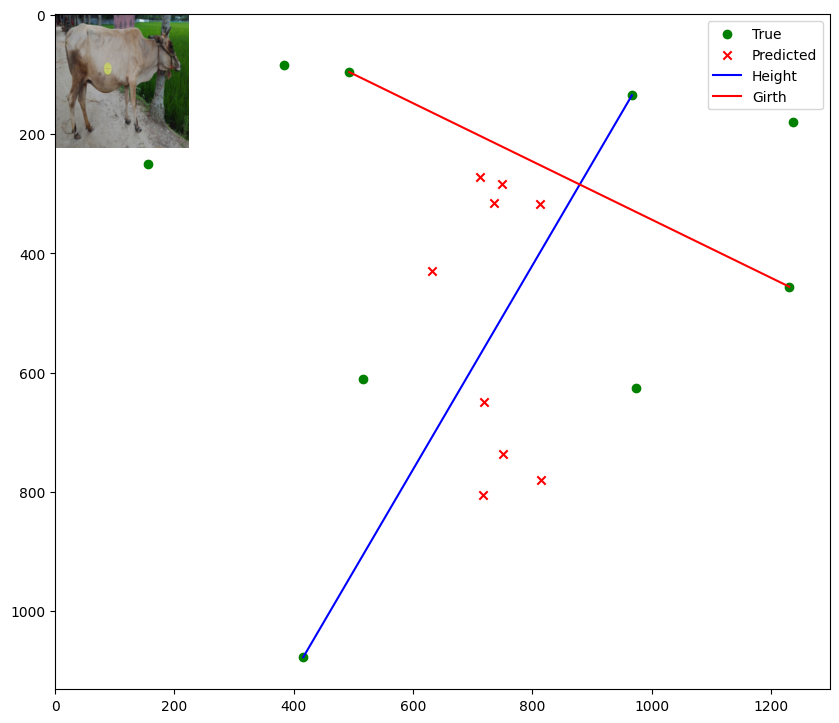

Height (True): 1091.3134288553404
Girth (True): 821.1236204129071
Validation Loss (Side): 234.6337
Mean Absolute Error (Side): 235.1326
R^2 Score (Side): -2.3801


In [33]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from sklearn.metrics import mean_absolute_error, r2_score
import torch

def calculate_distance(p1, p2):
    return np.sqrt((p2[0] - p1[0])**2 + (p2[1] - p1[1])**2)

def evaluate_model(model, dataloader, criterion, visualize=False, image_index_to_visualize=0):
    model.eval()  # Set model to evaluation mode
    running_loss = 0.0
    all_predictions = []
    all_keypoints = []

    # For visualization
    sample_image = None
    sample_true_keypoints = None
    sample_pred_keypoints = None

    with torch.no_grad():
        for batch_index, (images, keypoints) in enumerate(tqdm(dataloader, desc="Evaluating", unit="batch")):
            outputs = model(images)
            loss = criterion(outputs, keypoints)
            running_loss += loss.item() * images.size(0)

            all_predictions.extend(outputs.cpu().numpy())
            all_keypoints.extend(keypoints.cpu().numpy())

            # Capture the specific image and its keypoints for visualization
            if visualize and sample_image is None and batch_index == image_index_to_visualize:
                sample_image = images[0].cpu().numpy()
                sample_true_keypoints = keypoints[0].cpu().numpy()
                sample_pred_keypoints = outputs[0].cpu().numpy()

    average_loss = running_loss / len(dataloader.dataset)

    # Calculate additional metrics
    mae = mean_absolute_error(all_keypoints, all_predictions)
    r2 = r2_score(all_keypoints, all_predictions)

    # Visualization and measurement
    if visualize and sample_image is not None and sample_true_keypoints is not None and sample_pred_keypoints is not None:
        plt.figure(figsize=(10, 10))

        true_keypoints = np.array(sample_true_keypoints).reshape(-1, 2)
        pred_keypoints = np.array(sample_pred_keypoints).reshape(-1, 2)

        plt.imshow(np.transpose(sample_image, (1, 2, 0)))
        plt.scatter(true_keypoints[:, 0], true_keypoints[:, 1], color='g', marker='o', label="True")
        plt.scatter(pred_keypoints[:, 0], pred_keypoints[:, 1], color='r', marker='x', label="Predicted")

        # Assuming specific indices for girth and height based on your model's keypoints
        girth_start_idx = 2
        girth_end_idx = 5
        height_start_idx = 8
        height_end_idx = 3

        # Calculate height using true keypoints
        height = calculate_distance(true_keypoints[height_start_idx], true_keypoints[height_end_idx])

        # Calculate girth using true keypoints
        girth = calculate_distance(true_keypoints[girth_start_idx], true_keypoints[girth_end_idx])

        # Plot the height line
        plt.plot([true_keypoints[height_start_idx][0], true_keypoints[height_end_idx][0]], 
                 [true_keypoints[height_start_idx][1], true_keypoints[height_end_idx][1]], color='blue', label='Height')

        # Plot the girth line
        plt.plot([true_keypoints[girth_start_idx][0], true_keypoints[girth_end_idx][0]], 
                 [true_keypoints[girth_start_idx][1], true_keypoints[girth_end_idx][1]], color='red', label='Girth')

        plt.legend()
        plt.show()

        print(f"Height (True): {height}")
        print(f"Girth (True): {girth}")

    return average_loss, mae, r2

# Assuming the model, dataloaders, and criterion are defined elsewhere in your code

# Evaluate side model
val_loss_side, mae_side, r2_side = evaluate_model(model_side, val_loader_side, criterion, visualize=True, image_index_to_visualize=0)
print(f"Validation Loss (Side): {val_loss_side:.4f}")
print(f"Mean Absolute Error (Side): {mae_side:.4f}")
print(f"R^2 Score (Side): {r2_side:.4f}")

Evaluating:   0%|          | 0/25 [00:00<?, ?batch/s]

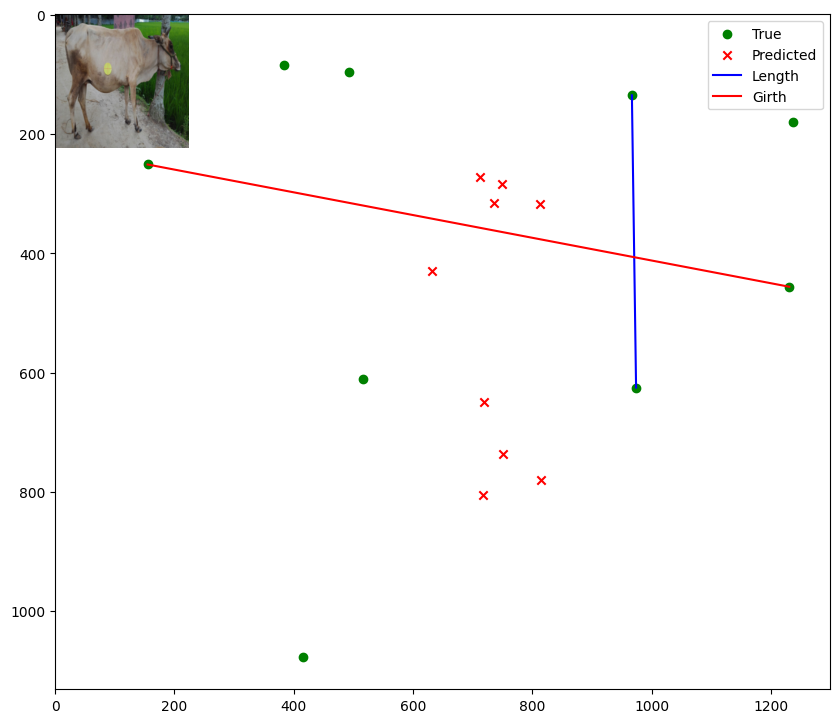

Girth (True): 205.0
Length (True): 7.0
Validation Loss (Side): 234.6337
Mean Absolute Error (Side): 235.1326
R^2 Score (Side): -2.3801
Estimated Weight: 980.58


In [34]:
def evaluate_model(model, dataloader, criterion, visualize=False, image_index_to_visualize=0):
    model.eval()  # Set model to evaluation mode
    running_loss = 0.0
    all_predictions = []
    all_keypoints = []

    # For visualization
    sample_image = None
    sample_true_keypoints = None
    sample_pred_keypoints = None
    girth = None  # Initialize girth
    length = None  # Initialize length

    with torch.no_grad():
        for batch_index, (images, keypoints) in enumerate(tqdm(dataloader, desc="Evaluating", unit="batch")):
            outputs = model(images)
            loss = criterion(outputs, keypoints)
            running_loss += loss.item() * images.size(0)

            all_predictions.extend(outputs.cpu().numpy())
            all_keypoints.extend(keypoints.cpu().numpy())

            # Capture the specific image and its keypoints for visualization
            if visualize and sample_image is None and batch_index == image_index_to_visualize:
                sample_image = images[0].cpu().numpy()
                sample_true_keypoints = keypoints[0].cpu().numpy()
                sample_pred_keypoints = outputs[0].cpu().numpy()

                true_keypoints = np.array(sample_true_keypoints).reshape(-1, 2)

                # Assuming specific indices for girth and length based on your model's keypoints
                girth_start_idx = 1  # Index for shoulder
                girth_end_idx = 2    # Index for end of belly
                length_start_idx = 3 # Index for right below neck
                length_end_idx = 4   # Index for hip

                # Calculate girth using true keypoints (vertical distance)
                girth = abs(true_keypoints[girth_start_idx][1] - true_keypoints[girth_end_idx][1])

                # Calculate length using true keypoints (horizontal distance)
                length = abs(true_keypoints[length_start_idx][0] - true_keypoints[length_end_idx][0])

    average_loss = running_loss / len(dataloader.dataset)

    # Calculate additional metrics
    mae = mean_absolute_error(all_keypoints, all_predictions)
    r2 = r2_score(all_keypoints, all_predictions)

    # Visualization and measurement
    if visualize and sample_image is not None and sample_true_keypoints is not None and sample_pred_keypoints is not None:
        plt.figure(figsize=(10, 10))
        pred_keypoints = np.array(sample_pred_keypoints).reshape(-1, 2)

        plt.imshow(np.transpose(sample_image, (1, 2, 0)))
        plt.scatter(true_keypoints[:, 0], true_keypoints[:, 1], color='g', marker='o', label="True")
        plt.scatter(pred_keypoints[:, 0], pred_keypoints[:, 1], color='r', marker='x', label="Predicted")

        # Plot the length line
        plt.plot([true_keypoints[length_start_idx][0], true_keypoints[length_end_idx][0]], 
                 [true_keypoints[length_start_idx][1], true_keypoints[length_end_idx][1]], color='blue', label='Length')

        # Plot the girth line
        plt.plot([true_keypoints[girth_start_idx][0], true_keypoints[girth_end_idx][0]], 
                 [true_keypoints[girth_start_idx][1], true_keypoints[girth_end_idx][1]], color='red', label='Girth')

        plt.legend()
        plt.show()

        print(f"Girth (True): {girth}")
        print(f"Length (True): {length}")

    return average_loss, mae, r2, girth, length

# Assuming the model, dataloaders, and criterion are defined elsewhere in your code

# Evaluate side model
val_loss_side, mae_side, r2_side, girth, length = evaluate_model(model_side, val_loader_side, criterion, visualize=True, image_index_to_visualize=0)
print(f"Validation Loss (Side): {val_loss_side:.4f}")
print(f"Mean Absolute Error (Side): {mae_side:.4f}")
print(f"R^2 Score (Side): {r2_side:.4f}")

# Check if girth and length are valid before calculating weight
if girth is not None and length is not None:
    weight = (girth * girth * length) / 300
    print(f"Estimated Weight: {weight:.2f}")
else:
    print("Girth or length is not defined. Cannot calculate weight.")
